In [6]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
words = open('names.txt','r').read().splitlines()

In [8]:
chars = sorted(set("".join(words)))

In [9]:
stoi = {}
itos = {}
i=1
for char in chars:
    stoi[char] = i
    i+=1
stoi["."] = 0
itos={i:s for s,i in stoi.items()}

### Building Dtataset

In [46]:
hits_len = 3
def buid_dataset(words):
    X, Y =[], []

    for word in  words + ['.']:
        context = [0] * hits_len
        for l in word:
            ix = stoi[l]
            X.append(context)
            Y.append(ix)
            #Updating
            context=context[1:]+[ix]
    X = torch.tensor(X)
    Y = torch.tensor(Y)
    print(X.shape, Y.shape)
    return X,Y
    
# Spliting To Train Val and Test
import random
random.shuffle(words)
N=len(words)
n1 = int(N * 0.8)
n2 = int(N * 0.9)
Xtrain , Ytrain = buid_dataset(words[:n1])
Xval , Yval = buid_dataset(words[n1:n2])
Xtest , Ytest = buid_dataset(words[n2:])

torch.Size([156919, 3]) torch.Size([156919])
torch.Size([19601, 3]) torch.Size([19601])
torch.Size([19596, 3]) torch.Size([19596])


In [47]:
C = torch.randn((27,10))
W1 = torch.randn((30,200))
b1 = torch.randn(200)
W2 = torch.randn((200,27))
b2 = torch.randn(27)
params = [C, W1, b1, W2, b2]

In [48]:
sum(p.nelement() for p in params)

11897

In [49]:
for p in params:
    p.requires_grad = True

In [50]:
lossi=[]
stepi=[]

In [51]:

for i in range(200000):
    ix = torch.randint(0,Xtrain.shape[0],(256,))
    emb = C[Xtrain[ix]]
    h = torch.relu(emb.view(-1,30) @ W1 +b1)
    logits = h @ W2 +b2
    loss = F.cross_entropy(logits,Ytrain[ix])

    for p in params:f
        p.grad = None

    loss.backward()
    lr = 0.1 if i < 100000 else 0.01
    for p in params:
        p.data += -lr * p.grad
    lossi.append(loss.log10().item())
    stepi.append(i)
    print(loss)

tensor(95.6159, grad_fn=<NllLossBackward0>)
tensor(62.2122, grad_fn=<NllLossBackward0>)
tensor(58.1201, grad_fn=<NllLossBackward0>)
tensor(47.9216, grad_fn=<NllLossBackward0>)
tensor(50.6216, grad_fn=<NllLossBackward0>)
tensor(42.8931, grad_fn=<NllLossBackward0>)
tensor(37.6055, grad_fn=<NllLossBackward0>)
tensor(35.4392, grad_fn=<NllLossBackward0>)
tensor(30.4231, grad_fn=<NllLossBackward0>)
tensor(32.6477, grad_fn=<NllLossBackward0>)
tensor(29.0790, grad_fn=<NllLossBackward0>)
tensor(28.1997, grad_fn=<NllLossBackward0>)
tensor(26.7538, grad_fn=<NllLossBackward0>)
tensor(26.5465, grad_fn=<NllLossBackward0>)
tensor(28.0971, grad_fn=<NllLossBackward0>)
tensor(24.3789, grad_fn=<NllLossBackward0>)
tensor(23.5530, grad_fn=<NllLossBackward0>)
tensor(22.0038, grad_fn=<NllLossBackward0>)
tensor(19.2993, grad_fn=<NllLossBackward0>)
tensor(19.1423, grad_fn=<NllLossBackward0>)
tensor(19.0849, grad_fn=<NllLossBackward0>)
tensor(17.8863, grad_fn=<NllLossBackward0>)
tensor(19.0760, grad_fn=<NllLoss

tensor(3.2635, grad_fn=<NllLossBackward0>)
tensor(3.7676, grad_fn=<NllLossBackward0>)
tensor(3.6245, grad_fn=<NllLossBackward0>)
tensor(3.8293, grad_fn=<NllLossBackward0>)
tensor(3.5175, grad_fn=<NllLossBackward0>)
tensor(3.2010, grad_fn=<NllLossBackward0>)
tensor(3.2048, grad_fn=<NllLossBackward0>)
tensor(4.0188, grad_fn=<NllLossBackward0>)
tensor(3.3996, grad_fn=<NllLossBackward0>)
tensor(3.7202, grad_fn=<NllLossBackward0>)
tensor(3.2879, grad_fn=<NllLossBackward0>)
tensor(3.6449, grad_fn=<NllLossBackward0>)
tensor(3.6610, grad_fn=<NllLossBackward0>)
tensor(3.6080, grad_fn=<NllLossBackward0>)
tensor(3.6841, grad_fn=<NllLossBackward0>)
tensor(3.2747, grad_fn=<NllLossBackward0>)
tensor(3.3284, grad_fn=<NllLossBackward0>)
tensor(3.0926, grad_fn=<NllLossBackward0>)
tensor(3.4393, grad_fn=<NllLossBackward0>)
tensor(3.2297, grad_fn=<NllLossBackward0>)
tensor(3.4593, grad_fn=<NllLossBackward0>)
tensor(4.8657, grad_fn=<NllLossBackward0>)
tensor(3.5404, grad_fn=<NllLossBackward0>)
tensor(3.99

tensor(2.7052, grad_fn=<NllLossBackward0>)
tensor(2.7962, grad_fn=<NllLossBackward0>)
tensor(2.6057, grad_fn=<NllLossBackward0>)
tensor(2.7493, grad_fn=<NllLossBackward0>)
tensor(2.6770, grad_fn=<NllLossBackward0>)
tensor(2.8197, grad_fn=<NllLossBackward0>)
tensor(2.7586, grad_fn=<NllLossBackward0>)
tensor(2.6954, grad_fn=<NllLossBackward0>)
tensor(2.9473, grad_fn=<NllLossBackward0>)
tensor(2.8607, grad_fn=<NllLossBackward0>)
tensor(2.7677, grad_fn=<NllLossBackward0>)
tensor(2.8558, grad_fn=<NllLossBackward0>)
tensor(3.1076, grad_fn=<NllLossBackward0>)
tensor(2.9379, grad_fn=<NllLossBackward0>)
tensor(2.7360, grad_fn=<NllLossBackward0>)
tensor(2.7797, grad_fn=<NllLossBackward0>)
tensor(2.8225, grad_fn=<NllLossBackward0>)
tensor(2.7277, grad_fn=<NllLossBackward0>)
tensor(2.5024, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.5405, grad_fn=<NllLossBackward0>)
tensor(2.9421, grad_fn=<NllLossBackward0>)
tensor(2.7793, grad_fn=<NllLossBackward0>)
tensor(2.73

tensor(2.7752, grad_fn=<NllLossBackward0>)
tensor(2.5859, grad_fn=<NllLossBackward0>)
tensor(2.5039, grad_fn=<NllLossBackward0>)
tensor(2.5506, grad_fn=<NllLossBackward0>)
tensor(2.8266, grad_fn=<NllLossBackward0>)
tensor(2.8224, grad_fn=<NllLossBackward0>)
tensor(2.6888, grad_fn=<NllLossBackward0>)
tensor(2.8207, grad_fn=<NllLossBackward0>)
tensor(2.7984, grad_fn=<NllLossBackward0>)
tensor(2.7087, grad_fn=<NllLossBackward0>)
tensor(2.6868, grad_fn=<NllLossBackward0>)
tensor(2.7737, grad_fn=<NllLossBackward0>)
tensor(2.7191, grad_fn=<NllLossBackward0>)
tensor(2.6399, grad_fn=<NllLossBackward0>)
tensor(2.5959, grad_fn=<NllLossBackward0>)
tensor(2.5879, grad_fn=<NllLossBackward0>)
tensor(2.7332, grad_fn=<NllLossBackward0>)
tensor(2.5163, grad_fn=<NllLossBackward0>)
tensor(2.7435, grad_fn=<NllLossBackward0>)
tensor(2.7158, grad_fn=<NllLossBackward0>)
tensor(2.7936, grad_fn=<NllLossBackward0>)
tensor(2.6899, grad_fn=<NllLossBackward0>)
tensor(2.8087, grad_fn=<NllLossBackward0>)
tensor(2.64

tensor(2.4658, grad_fn=<NllLossBackward0>)
tensor(2.6964, grad_fn=<NllLossBackward0>)
tensor(2.8124, grad_fn=<NllLossBackward0>)
tensor(2.6451, grad_fn=<NllLossBackward0>)
tensor(2.6301, grad_fn=<NllLossBackward0>)
tensor(2.5905, grad_fn=<NllLossBackward0>)
tensor(2.6564, grad_fn=<NllLossBackward0>)
tensor(2.5896, grad_fn=<NllLossBackward0>)
tensor(2.6596, grad_fn=<NllLossBackward0>)
tensor(2.5971, grad_fn=<NllLossBackward0>)
tensor(2.5583, grad_fn=<NllLossBackward0>)
tensor(2.6022, grad_fn=<NllLossBackward0>)
tensor(2.6373, grad_fn=<NllLossBackward0>)
tensor(2.7363, grad_fn=<NllLossBackward0>)
tensor(2.7560, grad_fn=<NllLossBackward0>)
tensor(2.6434, grad_fn=<NllLossBackward0>)
tensor(2.8713, grad_fn=<NllLossBackward0>)
tensor(2.8245, grad_fn=<NllLossBackward0>)
tensor(2.7571, grad_fn=<NllLossBackward0>)
tensor(2.6493, grad_fn=<NllLossBackward0>)
tensor(2.6814, grad_fn=<NllLossBackward0>)
tensor(2.6200, grad_fn=<NllLossBackward0>)
tensor(2.5769, grad_fn=<NllLossBackward0>)
tensor(2.72

tensor(2.4758, grad_fn=<NllLossBackward0>)
tensor(2.5119, grad_fn=<NllLossBackward0>)
tensor(2.5040, grad_fn=<NllLossBackward0>)
tensor(2.5753, grad_fn=<NllLossBackward0>)
tensor(2.5394, grad_fn=<NllLossBackward0>)
tensor(2.4301, grad_fn=<NllLossBackward0>)
tensor(2.6999, grad_fn=<NllLossBackward0>)
tensor(2.6500, grad_fn=<NllLossBackward0>)
tensor(2.4755, grad_fn=<NllLossBackward0>)
tensor(2.5257, grad_fn=<NllLossBackward0>)
tensor(2.4304, grad_fn=<NllLossBackward0>)
tensor(2.6134, grad_fn=<NllLossBackward0>)
tensor(2.4398, grad_fn=<NllLossBackward0>)
tensor(2.4786, grad_fn=<NllLossBackward0>)
tensor(2.5690, grad_fn=<NllLossBackward0>)
tensor(2.6165, grad_fn=<NllLossBackward0>)
tensor(2.5961, grad_fn=<NllLossBackward0>)
tensor(2.6995, grad_fn=<NllLossBackward0>)
tensor(2.5596, grad_fn=<NllLossBackward0>)
tensor(2.6893, grad_fn=<NllLossBackward0>)
tensor(2.4470, grad_fn=<NllLossBackward0>)
tensor(2.5335, grad_fn=<NllLossBackward0>)
tensor(2.5302, grad_fn=<NllLossBackward0>)
tensor(2.44

tensor(2.5953, grad_fn=<NllLossBackward0>)
tensor(2.5844, grad_fn=<NllLossBackward0>)
tensor(2.4497, grad_fn=<NllLossBackward0>)
tensor(2.5307, grad_fn=<NllLossBackward0>)
tensor(2.4338, grad_fn=<NllLossBackward0>)
tensor(2.3936, grad_fn=<NllLossBackward0>)
tensor(2.6226, grad_fn=<NllLossBackward0>)
tensor(2.5847, grad_fn=<NllLossBackward0>)
tensor(2.5139, grad_fn=<NllLossBackward0>)
tensor(2.5094, grad_fn=<NllLossBackward0>)
tensor(2.3936, grad_fn=<NllLossBackward0>)
tensor(2.6225, grad_fn=<NllLossBackward0>)
tensor(2.4931, grad_fn=<NllLossBackward0>)
tensor(2.5078, grad_fn=<NllLossBackward0>)
tensor(2.5336, grad_fn=<NllLossBackward0>)
tensor(2.4322, grad_fn=<NllLossBackward0>)
tensor(2.6367, grad_fn=<NllLossBackward0>)
tensor(2.5768, grad_fn=<NllLossBackward0>)
tensor(2.7079, grad_fn=<NllLossBackward0>)
tensor(2.6382, grad_fn=<NllLossBackward0>)
tensor(2.6205, grad_fn=<NllLossBackward0>)
tensor(2.5819, grad_fn=<NllLossBackward0>)
tensor(2.4654, grad_fn=<NllLossBackward0>)
tensor(2.60

tensor(2.7119, grad_fn=<NllLossBackward0>)
tensor(2.3358, grad_fn=<NllLossBackward0>)
tensor(2.5838, grad_fn=<NllLossBackward0>)
tensor(2.4600, grad_fn=<NllLossBackward0>)
tensor(2.4063, grad_fn=<NllLossBackward0>)
tensor(2.5161, grad_fn=<NllLossBackward0>)
tensor(2.6458, grad_fn=<NllLossBackward0>)
tensor(2.6179, grad_fn=<NllLossBackward0>)
tensor(2.3523, grad_fn=<NllLossBackward0>)
tensor(2.4066, grad_fn=<NllLossBackward0>)
tensor(2.4475, grad_fn=<NllLossBackward0>)
tensor(2.6589, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.3297, grad_fn=<NllLossBackward0>)
tensor(2.4940, grad_fn=<NllLossBackward0>)
tensor(2.3980, grad_fn=<NllLossBackward0>)
tensor(2.4738, grad_fn=<NllLossBackward0>)
tensor(2.5282, grad_fn=<NllLossBackward0>)
tensor(2.5387, grad_fn=<NllLossBackward0>)
tensor(2.5609, grad_fn=<NllLossBackward0>)
tensor(2.5176, grad_fn=<NllLossBackward0>)
tensor(2.5461, grad_fn=<NllLossBackward0>)
tensor(2.6044, grad_fn=<NllLossBackward0>)
tensor(2.48

tensor(2.5349, grad_fn=<NllLossBackward0>)
tensor(2.4303, grad_fn=<NllLossBackward0>)
tensor(2.5465, grad_fn=<NllLossBackward0>)
tensor(2.4920, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.3921, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.4305, grad_fn=<NllLossBackward0>)
tensor(2.6474, grad_fn=<NllLossBackward0>)
tensor(2.6132, grad_fn=<NllLossBackward0>)
tensor(2.4608, grad_fn=<NllLossBackward0>)
tensor(2.5790, grad_fn=<NllLossBackward0>)
tensor(2.5379, grad_fn=<NllLossBackward0>)
tensor(2.4842, grad_fn=<NllLossBackward0>)
tensor(2.5940, grad_fn=<NllLossBackward0>)
tensor(2.4648, grad_fn=<NllLossBackward0>)
tensor(2.4614, grad_fn=<NllLossBackward0>)
tensor(2.4825, grad_fn=<NllLossBackward0>)
tensor(2.6201, grad_fn=<NllLossBackward0>)
tensor(2.5610, grad_fn=<NllLossBackward0>)
tensor(2.4710, grad_fn=<NllLossBackward0>)
tensor(2.4325, grad_fn=<NllLossBackward0>)
tensor(2.4907, grad_fn=<NllLossBackward0>)
tensor(2.52

tensor(2.4340, grad_fn=<NllLossBackward0>)
tensor(2.4972, grad_fn=<NllLossBackward0>)
tensor(2.4187, grad_fn=<NllLossBackward0>)
tensor(2.4584, grad_fn=<NllLossBackward0>)
tensor(2.5978, grad_fn=<NllLossBackward0>)
tensor(2.4026, grad_fn=<NllLossBackward0>)
tensor(2.3910, grad_fn=<NllLossBackward0>)
tensor(2.5446, grad_fn=<NllLossBackward0>)
tensor(2.4737, grad_fn=<NllLossBackward0>)
tensor(2.5568, grad_fn=<NllLossBackward0>)
tensor(2.5444, grad_fn=<NllLossBackward0>)
tensor(2.5346, grad_fn=<NllLossBackward0>)
tensor(2.4192, grad_fn=<NllLossBackward0>)
tensor(2.4258, grad_fn=<NllLossBackward0>)
tensor(2.5410, grad_fn=<NllLossBackward0>)
tensor(2.4614, grad_fn=<NllLossBackward0>)
tensor(2.5688, grad_fn=<NllLossBackward0>)
tensor(2.3937, grad_fn=<NllLossBackward0>)
tensor(2.5959, grad_fn=<NllLossBackward0>)
tensor(2.4281, grad_fn=<NllLossBackward0>)
tensor(2.6590, grad_fn=<NllLossBackward0>)
tensor(2.5796, grad_fn=<NllLossBackward0>)
tensor(2.4808, grad_fn=<NllLossBackward0>)
tensor(2.47

tensor(2.5622, grad_fn=<NllLossBackward0>)
tensor(2.5734, grad_fn=<NllLossBackward0>)
tensor(2.5811, grad_fn=<NllLossBackward0>)
tensor(2.5646, grad_fn=<NllLossBackward0>)
tensor(2.5511, grad_fn=<NllLossBackward0>)
tensor(2.4210, grad_fn=<NllLossBackward0>)
tensor(2.4242, grad_fn=<NllLossBackward0>)
tensor(2.4835, grad_fn=<NllLossBackward0>)
tensor(2.4919, grad_fn=<NllLossBackward0>)
tensor(2.3894, grad_fn=<NllLossBackward0>)
tensor(2.4345, grad_fn=<NllLossBackward0>)
tensor(2.6559, grad_fn=<NllLossBackward0>)
tensor(2.3331, grad_fn=<NllLossBackward0>)
tensor(2.5865, grad_fn=<NllLossBackward0>)
tensor(2.5648, grad_fn=<NllLossBackward0>)
tensor(2.4965, grad_fn=<NllLossBackward0>)
tensor(2.6156, grad_fn=<NllLossBackward0>)
tensor(2.5223, grad_fn=<NllLossBackward0>)
tensor(2.5267, grad_fn=<NllLossBackward0>)
tensor(2.4240, grad_fn=<NllLossBackward0>)
tensor(2.4670, grad_fn=<NllLossBackward0>)
tensor(2.4407, grad_fn=<NllLossBackward0>)
tensor(2.4635, grad_fn=<NllLossBackward0>)
tensor(2.62

tensor(2.4206, grad_fn=<NllLossBackward0>)
tensor(2.3894, grad_fn=<NllLossBackward0>)
tensor(2.4032, grad_fn=<NllLossBackward0>)
tensor(2.3780, grad_fn=<NllLossBackward0>)
tensor(2.4261, grad_fn=<NllLossBackward0>)
tensor(2.4034, grad_fn=<NllLossBackward0>)
tensor(2.5211, grad_fn=<NllLossBackward0>)
tensor(2.4759, grad_fn=<NllLossBackward0>)
tensor(2.5728, grad_fn=<NllLossBackward0>)
tensor(2.4339, grad_fn=<NllLossBackward0>)
tensor(2.4623, grad_fn=<NllLossBackward0>)
tensor(2.5087, grad_fn=<NllLossBackward0>)
tensor(2.4566, grad_fn=<NllLossBackward0>)
tensor(2.4807, grad_fn=<NllLossBackward0>)
tensor(2.4732, grad_fn=<NllLossBackward0>)
tensor(2.5634, grad_fn=<NllLossBackward0>)
tensor(2.4864, grad_fn=<NllLossBackward0>)
tensor(2.5937, grad_fn=<NllLossBackward0>)
tensor(2.4575, grad_fn=<NllLossBackward0>)
tensor(2.4798, grad_fn=<NllLossBackward0>)
tensor(2.4942, grad_fn=<NllLossBackward0>)
tensor(2.4642, grad_fn=<NllLossBackward0>)
tensor(2.4987, grad_fn=<NllLossBackward0>)
tensor(2.58

tensor(2.5337, grad_fn=<NllLossBackward0>)
tensor(2.4836, grad_fn=<NllLossBackward0>)
tensor(2.4686, grad_fn=<NllLossBackward0>)
tensor(2.3799, grad_fn=<NllLossBackward0>)
tensor(2.4725, grad_fn=<NllLossBackward0>)
tensor(2.3911, grad_fn=<NllLossBackward0>)
tensor(2.4978, grad_fn=<NllLossBackward0>)
tensor(2.5538, grad_fn=<NllLossBackward0>)
tensor(2.5305, grad_fn=<NllLossBackward0>)
tensor(2.4971, grad_fn=<NllLossBackward0>)
tensor(2.3406, grad_fn=<NllLossBackward0>)
tensor(2.4529, grad_fn=<NllLossBackward0>)
tensor(2.4924, grad_fn=<NllLossBackward0>)
tensor(2.4622, grad_fn=<NllLossBackward0>)
tensor(2.4786, grad_fn=<NllLossBackward0>)
tensor(2.4908, grad_fn=<NllLossBackward0>)
tensor(2.4708, grad_fn=<NllLossBackward0>)
tensor(2.4880, grad_fn=<NllLossBackward0>)
tensor(2.4396, grad_fn=<NllLossBackward0>)
tensor(2.5156, grad_fn=<NllLossBackward0>)
tensor(2.3938, grad_fn=<NllLossBackward0>)
tensor(2.5595, grad_fn=<NllLossBackward0>)
tensor(2.4253, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.3907, grad_fn=<NllLossBackward0>)
tensor(2.4217, grad_fn=<NllLossBackward0>)
tensor(2.4919, grad_fn=<NllLossBackward0>)
tensor(2.4207, grad_fn=<NllLossBackward0>)
tensor(2.4762, grad_fn=<NllLossBackward0>)
tensor(2.5959, grad_fn=<NllLossBackward0>)
tensor(2.4087, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.4451, grad_fn=<NllLossBackward0>)
tensor(2.4248, grad_fn=<NllLossBackward0>)
tensor(2.3271, grad_fn=<NllLossBackward0>)
tensor(2.5154, grad_fn=<NllLossBackward0>)
tensor(2.5320, grad_fn=<NllLossBackward0>)
tensor(2.4417, grad_fn=<NllLossBackward0>)
tensor(2.4564, grad_fn=<NllLossBackward0>)
tensor(2.4368, grad_fn=<NllLossBackward0>)
tensor(2.3809, grad_fn=<NllLossBackward0>)
tensor(2.4764, grad_fn=<NllLossBackward0>)
tensor(2.5150, grad_fn=<NllLossBackward0>)
tensor(2.3868, grad_fn=<NllLossBackward0>)
tensor(2.4900, grad_fn=<NllLossBackward0>)
tensor(2.4422, grad_fn=<NllLossBackward0>)
tensor(2.4391, grad_fn=<NllLossBackward0>)
tensor(2.50

tensor(2.4347, grad_fn=<NllLossBackward0>)
tensor(2.3085, grad_fn=<NllLossBackward0>)
tensor(2.6287, grad_fn=<NllLossBackward0>)
tensor(2.4008, grad_fn=<NllLossBackward0>)
tensor(2.4361, grad_fn=<NllLossBackward0>)
tensor(2.4002, grad_fn=<NllLossBackward0>)
tensor(2.4624, grad_fn=<NllLossBackward0>)
tensor(2.4245, grad_fn=<NllLossBackward0>)
tensor(2.4701, grad_fn=<NllLossBackward0>)
tensor(2.3884, grad_fn=<NllLossBackward0>)
tensor(2.3895, grad_fn=<NllLossBackward0>)
tensor(2.3801, grad_fn=<NllLossBackward0>)
tensor(2.4250, grad_fn=<NllLossBackward0>)
tensor(2.4602, grad_fn=<NllLossBackward0>)
tensor(2.4478, grad_fn=<NllLossBackward0>)
tensor(2.4690, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.4000, grad_fn=<NllLossBackward0>)
tensor(2.4769, grad_fn=<NllLossBackward0>)
tensor(2.3583, grad_fn=<NllLossBackward0>)
tensor(2.3931, grad_fn=<NllLossBackward0>)
tensor(2.4152, grad_fn=<NllLossBackward0>)
tensor(2.47

tensor(2.3981, grad_fn=<NllLossBackward0>)
tensor(2.4099, grad_fn=<NllLossBackward0>)
tensor(2.4922, grad_fn=<NllLossBackward0>)
tensor(2.4817, grad_fn=<NllLossBackward0>)
tensor(2.5202, grad_fn=<NllLossBackward0>)
tensor(2.4228, grad_fn=<NllLossBackward0>)
tensor(2.4263, grad_fn=<NllLossBackward0>)
tensor(2.4409, grad_fn=<NllLossBackward0>)
tensor(2.5462, grad_fn=<NllLossBackward0>)
tensor(2.4649, grad_fn=<NllLossBackward0>)
tensor(2.4658, grad_fn=<NllLossBackward0>)
tensor(2.4462, grad_fn=<NllLossBackward0>)
tensor(2.4073, grad_fn=<NllLossBackward0>)
tensor(2.4628, grad_fn=<NllLossBackward0>)
tensor(2.4136, grad_fn=<NllLossBackward0>)
tensor(2.4578, grad_fn=<NllLossBackward0>)
tensor(2.5044, grad_fn=<NllLossBackward0>)
tensor(2.5874, grad_fn=<NllLossBackward0>)
tensor(2.3959, grad_fn=<NllLossBackward0>)
tensor(2.4283, grad_fn=<NllLossBackward0>)
tensor(2.4246, grad_fn=<NllLossBackward0>)
tensor(2.5183, grad_fn=<NllLossBackward0>)
tensor(2.4369, grad_fn=<NllLossBackward0>)
tensor(2.43

tensor(2.4437, grad_fn=<NllLossBackward0>)
tensor(2.3927, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.4217, grad_fn=<NllLossBackward0>)
tensor(2.3951, grad_fn=<NllLossBackward0>)
tensor(2.3432, grad_fn=<NllLossBackward0>)
tensor(2.4642, grad_fn=<NllLossBackward0>)
tensor(2.4038, grad_fn=<NllLossBackward0>)
tensor(2.5153, grad_fn=<NllLossBackward0>)
tensor(2.4008, grad_fn=<NllLossBackward0>)
tensor(2.4886, grad_fn=<NllLossBackward0>)
tensor(2.3921, grad_fn=<NllLossBackward0>)
tensor(2.5114, grad_fn=<NllLossBackward0>)
tensor(2.5042, grad_fn=<NllLossBackward0>)
tensor(2.4174, grad_fn=<NllLossBackward0>)
tensor(2.4754, grad_fn=<NllLossBackward0>)
tensor(2.5151, grad_fn=<NllLossBackward0>)
tensor(2.5280, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.4350, grad_fn=<NllLossBackward0>)
tensor(2.4668, grad_fn=<NllLossBackward0>)
tensor(2.4456, grad_fn=<NllLossBackward0>)
tensor(2.5402, grad_fn=<NllLossBackward0>)
tensor(2.50

tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.4022, grad_fn=<NllLossBackward0>)
tensor(2.4112, grad_fn=<NllLossBackward0>)
tensor(2.4521, grad_fn=<NllLossBackward0>)
tensor(2.4814, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.4550, grad_fn=<NllLossBackward0>)
tensor(2.5485, grad_fn=<NllLossBackward0>)
tensor(2.3214, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.4697, grad_fn=<NllLossBackward0>)
tensor(2.5128, grad_fn=<NllLossBackward0>)
tensor(2.5574, grad_fn=<NllLossBackward0>)
tensor(2.4217, grad_fn=<NllLossBackward0>)
tensor(2.3463, grad_fn=<NllLossBackward0>)
tensor(2.4302, grad_fn=<NllLossBackward0>)
tensor(2.5165, grad_fn=<NllLossBackward0>)
tensor(2.4662, grad_fn=<NllLossBackward0>)
tensor(2.3989, grad_fn=<NllLossBackward0>)
tensor(2.4986, grad_fn=<NllLossBackward0>)
tensor(2.3896, grad_fn=<NllLossBackward0>)
tensor(2.5191, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.4023, grad_fn=<NllLossBackward0>)
tensor(2.4549, grad_fn=<NllLossBackward0>)
tensor(2.4162, grad_fn=<NllLossBackward0>)
tensor(2.4518, grad_fn=<NllLossBackward0>)
tensor(2.4153, grad_fn=<NllLossBackward0>)
tensor(2.4704, grad_fn=<NllLossBackward0>)
tensor(2.2874, grad_fn=<NllLossBackward0>)
tensor(2.4655, grad_fn=<NllLossBackward0>)
tensor(2.3921, grad_fn=<NllLossBackward0>)
tensor(2.4209, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.6135, grad_fn=<NllLossBackward0>)
tensor(2.3361, grad_fn=<NllLossBackward0>)
tensor(2.4466, grad_fn=<NllLossBackward0>)
tensor(2.4335, grad_fn=<NllLossBackward0>)
tensor(2.4425, grad_fn=<NllLossBackward0>)
tensor(2.3565, grad_fn=<NllLossBackward0>)
tensor(2.4766, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.4817, grad_fn=<NllLossBackward0>)
tensor(2.4735, grad_fn=<NllLossBackward0>)
tensor(2.4256, grad_fn=<NllLossBackward0>)
tensor(2.3480, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.5263, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.3439, grad_fn=<NllLossBackward0>)
tensor(2.3425, grad_fn=<NllLossBackward0>)
tensor(2.4501, grad_fn=<NllLossBackward0>)
tensor(2.4503, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.5005, grad_fn=<NllLossBackward0>)
tensor(2.5166, grad_fn=<NllLossBackward0>)
tensor(2.5562, grad_fn=<NllLossBackward0>)
tensor(2.2005, grad_fn=<NllLossBackward0>)
tensor(2.3376, grad_fn=<NllLossBackward0>)
tensor(2.4742, grad_fn=<NllLossBackward0>)
tensor(2.4053, grad_fn=<NllLossBackward0>)
tensor(2.5148, grad_fn=<NllLossBackward0>)
tensor(2.3834, grad_fn=<NllLossBackward0>)
tensor(2.5414, grad_fn=<NllLossBackward0>)
tensor(2.4828, grad_fn=<NllLossBackward0>)
tensor(2.3993, grad_fn=<NllLossBackward0>)
tensor(2.5634, grad_fn=<NllLossBackward0>)
tensor(2.2761, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.4533, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.4155, grad_fn=<NllLossBackward0>)
tensor(2.4573, grad_fn=<NllLossBackward0>)
tensor(2.4199, grad_fn=<NllLossBackward0>)
tensor(2.4711, grad_fn=<NllLossBackward0>)
tensor(2.5859, grad_fn=<NllLossBackward0>)
tensor(2.4428, grad_fn=<NllLossBackward0>)
tensor(2.3587, grad_fn=<NllLossBackward0>)
tensor(2.4862, grad_fn=<NllLossBackward0>)
tensor(2.4620, grad_fn=<NllLossBackward0>)
tensor(2.4689, grad_fn=<NllLossBackward0>)
tensor(2.2927, grad_fn=<NllLossBackward0>)
tensor(2.4385, grad_fn=<NllLossBackward0>)
tensor(2.4674, grad_fn=<NllLossBackward0>)
tensor(2.4091, grad_fn=<NllLossBackward0>)
tensor(2.5850, grad_fn=<NllLossBackward0>)
tensor(2.3604, grad_fn=<NllLossBackward0>)
tensor(2.4224, grad_fn=<NllLossBackward0>)
tensor(2.3637, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.4565, grad_fn=<NllLossBackward0>)
tensor(2.2858, grad_fn=<NllLossBackward0>)
tensor(2.4548, grad_fn=<NllLossBackward0>)
tensor(2.3593, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.3627, grad_fn=<NllLossBackward0>)
tensor(2.5738, grad_fn=<NllLossBackward0>)
tensor(2.4418, grad_fn=<NllLossBackward0>)
tensor(2.3776, grad_fn=<NllLossBackward0>)
tensor(2.4041, grad_fn=<NllLossBackward0>)
tensor(2.4465, grad_fn=<NllLossBackward0>)
tensor(2.5492, grad_fn=<NllLossBackward0>)
tensor(2.3058, grad_fn=<NllLossBackward0>)
tensor(2.6281, grad_fn=<NllLossBackward0>)
tensor(2.4872, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.4210, grad_fn=<NllLossBackward0>)
tensor(2.4803, grad_fn=<NllLossBackward0>)
tensor(2.4489, grad_fn=<NllLossBackward0>)
tensor(2.3602, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.3838, grad_fn=<NllLossBackward0>)
tensor(2.3023, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.3614, grad_fn=<NllLossBackward0>)
tensor(2.5136, grad_fn=<NllLossBackward0>)
tensor(2.3550, grad_fn=<NllLossBackward0>)
tensor(2.4701, grad_fn=<NllLossBackward0>)
tensor(2.54

tensor(2.3349, grad_fn=<NllLossBackward0>)
tensor(2.4180, grad_fn=<NllLossBackward0>)
tensor(2.2215, grad_fn=<NllLossBackward0>)
tensor(2.3159, grad_fn=<NllLossBackward0>)
tensor(2.3720, grad_fn=<NllLossBackward0>)
tensor(2.4428, grad_fn=<NllLossBackward0>)
tensor(2.4090, grad_fn=<NllLossBackward0>)
tensor(2.4429, grad_fn=<NllLossBackward0>)
tensor(2.3725, grad_fn=<NllLossBackward0>)
tensor(2.5689, grad_fn=<NllLossBackward0>)
tensor(2.4220, grad_fn=<NllLossBackward0>)
tensor(2.4110, grad_fn=<NllLossBackward0>)
tensor(2.5081, grad_fn=<NllLossBackward0>)
tensor(2.4281, grad_fn=<NllLossBackward0>)
tensor(2.4833, grad_fn=<NllLossBackward0>)
tensor(2.4958, grad_fn=<NllLossBackward0>)
tensor(2.2694, grad_fn=<NllLossBackward0>)
tensor(2.3891, grad_fn=<NllLossBackward0>)
tensor(2.4108, grad_fn=<NllLossBackward0>)
tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.4402, grad_fn=<NllLossBackward0>)
tensor(2.4362, grad_fn=<NllLossBackward0>)
tensor(2.5268, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3072, grad_fn=<NllLossBackward0>)
tensor(2.3825, grad_fn=<NllLossBackward0>)
tensor(2.4395, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.3761, grad_fn=<NllLossBackward0>)
tensor(2.5083, grad_fn=<NllLossBackward0>)
tensor(2.5037, grad_fn=<NllLossBackward0>)
tensor(2.4441, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.4781, grad_fn=<NllLossBackward0>)
tensor(2.4443, grad_fn=<NllLossBackward0>)
tensor(2.3316, grad_fn=<NllLossBackward0>)
tensor(2.4532, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.5580, grad_fn=<NllLossBackward0>)
tensor(2.4271, grad_fn=<NllLossBackward0>)
tensor(2.5295, grad_fn=<NllLossBackward0>)
tensor(2.3562, grad_fn=<NllLossBackward0>)
tensor(2.4622, grad_fn=<NllLossBackward0>)
tensor(2.4423, grad_fn=<NllLossBackward0>)
tensor(2.6424, grad_fn=<NllLossBackward0>)
tensor(2.4164, grad_fn=<NllLossBackward0>)
tensor(2.4547, grad_fn=<NllLossBackward0>)
tensor(2.41

tensor(2.3608, grad_fn=<NllLossBackward0>)
tensor(2.3617, grad_fn=<NllLossBackward0>)
tensor(2.3843, grad_fn=<NllLossBackward0>)
tensor(2.4483, grad_fn=<NllLossBackward0>)
tensor(2.5359, grad_fn=<NllLossBackward0>)
tensor(2.4418, grad_fn=<NllLossBackward0>)
tensor(2.4154, grad_fn=<NllLossBackward0>)
tensor(2.3669, grad_fn=<NllLossBackward0>)
tensor(2.2954, grad_fn=<NllLossBackward0>)
tensor(2.4319, grad_fn=<NllLossBackward0>)
tensor(2.3538, grad_fn=<NllLossBackward0>)
tensor(2.3058, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.5301, grad_fn=<NllLossBackward0>)
tensor(2.4343, grad_fn=<NllLossBackward0>)
tensor(2.3606, grad_fn=<NllLossBackward0>)
tensor(2.3872, grad_fn=<NllLossBackward0>)
tensor(2.4811, grad_fn=<NllLossBackward0>)
tensor(2.4447, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.4562, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.3971, grad_fn=<NllLossBackward0>)
tensor(2.41

tensor(2.3750, grad_fn=<NllLossBackward0>)
tensor(2.4347, grad_fn=<NllLossBackward0>)
tensor(2.4845, grad_fn=<NllLossBackward0>)
tensor(2.4829, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.3669, grad_fn=<NllLossBackward0>)
tensor(2.3186, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.4385, grad_fn=<NllLossBackward0>)
tensor(2.5295, grad_fn=<NllLossBackward0>)
tensor(2.3379, grad_fn=<NllLossBackward0>)
tensor(2.4796, grad_fn=<NllLossBackward0>)
tensor(2.4548, grad_fn=<NllLossBackward0>)
tensor(2.3689, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.4531, grad_fn=<NllLossBackward0>)
tensor(2.4366, grad_fn=<NllLossBackward0>)
tensor(2.3557, grad_fn=<NllLossBackward0>)
tensor(2.3115, grad_fn=<NllLossBackward0>)
tensor(2.3705, grad_fn=<NllLossBackward0>)
tensor(2.4040, grad_fn=<NllLossBackward0>)
tensor(2.3864, grad_fn=<NllLossBackward0>)
tensor(2.4399, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.3839, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.4404, grad_fn=<NllLossBackward0>)
tensor(2.2112, grad_fn=<NllLossBackward0>)
tensor(2.3974, grad_fn=<NllLossBackward0>)
tensor(2.4248, grad_fn=<NllLossBackward0>)
tensor(2.3949, grad_fn=<NllLossBackward0>)
tensor(2.2925, grad_fn=<NllLossBackward0>)
tensor(2.3717, grad_fn=<NllLossBackward0>)
tensor(2.3793, grad_fn=<NllLossBackward0>)
tensor(2.3363, grad_fn=<NllLossBackward0>)
tensor(2.4364, grad_fn=<NllLossBackward0>)
tensor(2.5119, grad_fn=<NllLossBackward0>)
tensor(2.3507, grad_fn=<NllLossBackward0>)
tensor(2.5683, grad_fn=<NllLossBackward0>)
tensor(2.5292, grad_fn=<NllLossBackward0>)
tensor(2.3885, grad_fn=<NllLossBackward0>)
tensor(2.4109, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.3975, grad_fn=<NllLossBackward0>)
tensor(2.5275, grad_fn=<NllLossBackward0>)
tensor(2.4315, grad_fn=<NllLossBackward0>)
tensor(2.4148, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.3682, grad_fn=<NllLossBackward0>)
tensor(2.3498, grad_fn=<NllLossBackward0>)
tensor(2.3800, grad_fn=<NllLossBackward0>)
tensor(2.3671, grad_fn=<NllLossBackward0>)
tensor(2.3724, grad_fn=<NllLossBackward0>)
tensor(2.3591, grad_fn=<NllLossBackward0>)
tensor(2.4151, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.4443, grad_fn=<NllLossBackward0>)
tensor(2.3377, grad_fn=<NllLossBackward0>)
tensor(2.2922, grad_fn=<NllLossBackward0>)
tensor(2.4586, grad_fn=<NllLossBackward0>)
tensor(2.4976, grad_fn=<NllLossBackward0>)
tensor(2.3526, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.3558, grad_fn=<NllLossBackward0>)
tensor(2.3598, grad_fn=<NllLossBackward0>)
tensor(2.4176, grad_fn=<NllLossBackward0>)
tensor(2.4682, grad_fn=<NllLossBackward0>)
tensor(2.3953, grad_fn=<NllLossBackward0>)
tensor(2.5360, grad_fn=<NllLossBackward0>)
tensor(2.2694, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.3617, grad_fn=<NllLossBackward0>)
tensor(2.4808, grad_fn=<NllLossBackward0>)
tensor(2.2934, grad_fn=<NllLossBackward0>)
tensor(2.4126, grad_fn=<NllLossBackward0>)
tensor(2.4706, grad_fn=<NllLossBackward0>)
tensor(2.4540, grad_fn=<NllLossBackward0>)
tensor(2.4643, grad_fn=<NllLossBackward0>)
tensor(2.3402, grad_fn=<NllLossBackward0>)
tensor(2.4387, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.4284, grad_fn=<NllLossBackward0>)
tensor(2.5106, grad_fn=<NllLossBackward0>)
tensor(2.4965, grad_fn=<NllLossBackward0>)
tensor(2.4659, grad_fn=<NllLossBackward0>)
tensor(2.4049, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.4972, grad_fn=<NllLossBackward0>)
tensor(2.3480, grad_fn=<NllLossBackward0>)
tensor(2.5015, grad_fn=<NllLossBackward0>)
tensor(2.2959, grad_fn=<NllLossBackward0>)
tensor(2.3899, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.3552, grad_fn=<NllLossBackward0>)
tensor(2.3460, grad_fn=<NllLossBackward0>)
tensor(2.4553, grad_fn=<NllLossBackward0>)
tensor(2.3819, grad_fn=<NllLossBackward0>)
tensor(2.3653, grad_fn=<NllLossBackward0>)
tensor(2.3407, grad_fn=<NllLossBackward0>)
tensor(2.5410, grad_fn=<NllLossBackward0>)
tensor(2.3325, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.3789, grad_fn=<NllLossBackward0>)
tensor(2.3850, grad_fn=<NllLossBackward0>)
tensor(2.4552, grad_fn=<NllLossBackward0>)
tensor(2.3091, grad_fn=<NllLossBackward0>)
tensor(2.3438, grad_fn=<NllLossBackward0>)
tensor(2.3079, grad_fn=<NllLossBackward0>)
tensor(2.5334, grad_fn=<NllLossBackward0>)
tensor(2.3743, grad_fn=<NllLossBackward0>)
tensor(2.4520, grad_fn=<NllLossBackward0>)
tensor(2.4323, grad_fn=<NllLossBackward0>)
tensor(2.3124, grad_fn=<NllLossBackward0>)
tensor(2.3555, grad_fn=<NllLossBackward0>)
tensor(2.3486, grad_fn=<NllLossBackward0>)
tensor(2.3654, grad_fn=<NllLossBackward0>)
tensor(2.50

tensor(2.4373, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.3353, grad_fn=<NllLossBackward0>)
tensor(2.4508, grad_fn=<NllLossBackward0>)
tensor(2.4541, grad_fn=<NllLossBackward0>)
tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.5253, grad_fn=<NllLossBackward0>)
tensor(2.3497, grad_fn=<NllLossBackward0>)
tensor(2.3253, grad_fn=<NllLossBackward0>)
tensor(2.6980, grad_fn=<NllLossBackward0>)
tensor(2.4841, grad_fn=<NllLossBackward0>)
tensor(2.3928, grad_fn=<NllLossBackward0>)
tensor(2.5031, grad_fn=<NllLossBackward0>)
tensor(2.4173, grad_fn=<NllLossBackward0>)
tensor(2.4763, grad_fn=<NllLossBackward0>)
tensor(2.2748, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.4364, grad_fn=<NllLossBackward0>)
tensor(2.3250, grad_fn=<NllLossBackward0>)
tensor(2.4162, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.2512, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.4408, grad_fn=<NllLossBackward0>)
tensor(2.3534, grad_fn=<NllLossBackward0>)
tensor(2.3628, grad_fn=<NllLossBackward0>)
tensor(2.3242, grad_fn=<NllLossBackward0>)
tensor(2.3681, grad_fn=<NllLossBackward0>)
tensor(2.2937, grad_fn=<NllLossBackward0>)
tensor(2.4316, grad_fn=<NllLossBackward0>)
tensor(2.3354, grad_fn=<NllLossBackward0>)
tensor(2.4473, grad_fn=<NllLossBackward0>)
tensor(2.4439, grad_fn=<NllLossBackward0>)
tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.4200, grad_fn=<NllLossBackward0>)
tensor(2.4019, grad_fn=<NllLossBackward0>)
tensor(2.3901, grad_fn=<NllLossBackward0>)
tensor(2.4313, grad_fn=<NllLossBackward0>)
tensor(2.4177, grad_fn=<NllLossBackward0>)
tensor(2.4256, grad_fn=<NllLossBackward0>)
tensor(2.3933, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.4324, grad_fn=<NllLossBackward0>)
tensor(2.4209, grad_fn=<NllLossBackward0>)
tensor(2.2754, grad_fn=<NllLossBackward0>)
tensor(2.46

tensor(2.3113, grad_fn=<NllLossBackward0>)
tensor(2.4215, grad_fn=<NllLossBackward0>)
tensor(2.4966, grad_fn=<NllLossBackward0>)
tensor(2.3455, grad_fn=<NllLossBackward0>)
tensor(2.4867, grad_fn=<NllLossBackward0>)
tensor(2.4422, grad_fn=<NllLossBackward0>)
tensor(2.3814, grad_fn=<NllLossBackward0>)
tensor(2.2990, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.3707, grad_fn=<NllLossBackward0>)
tensor(2.4807, grad_fn=<NllLossBackward0>)
tensor(2.3947, grad_fn=<NllLossBackward0>)
tensor(2.4344, grad_fn=<NllLossBackward0>)
tensor(2.3339, grad_fn=<NllLossBackward0>)
tensor(2.4488, grad_fn=<NllLossBackward0>)
tensor(2.3833, grad_fn=<NllLossBackward0>)
tensor(2.3292, grad_fn=<NllLossBackward0>)
tensor(2.3418, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.2855, grad_fn=<NllLossBackward0>)
tensor(2.4880, grad_fn=<NllLossBackward0>)
tensor(2.3673, grad_fn=<NllLossBackward0>)
tensor(2.3128, grad_fn=<NllLossBackward0>)
tensor(2.51

tensor(2.3634, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.3730, grad_fn=<NllLossBackward0>)
tensor(2.4769, grad_fn=<NllLossBackward0>)
tensor(2.3796, grad_fn=<NllLossBackward0>)
tensor(2.3185, grad_fn=<NllLossBackward0>)
tensor(2.3639, grad_fn=<NllLossBackward0>)
tensor(2.3692, grad_fn=<NllLossBackward0>)
tensor(2.3950, grad_fn=<NllLossBackward0>)
tensor(2.3593, grad_fn=<NllLossBackward0>)
tensor(2.3057, grad_fn=<NllLossBackward0>)
tensor(2.2935, grad_fn=<NllLossBackward0>)
tensor(2.3461, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.3743, grad_fn=<NllLossBackward0>)
tensor(2.3811, grad_fn=<NllLossBackward0>)
tensor(2.3863, grad_fn=<NllLossBackward0>)
tensor(2.4277, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.4383, grad_fn=<NllLossBackward0>)
tensor(2.2848, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.47

tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.4550, grad_fn=<NllLossBackward0>)
tensor(2.3234, grad_fn=<NllLossBackward0>)
tensor(2.3406, grad_fn=<NllLossBackward0>)
tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.4061, grad_fn=<NllLossBackward0>)
tensor(2.4510, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.4419, grad_fn=<NllLossBackward0>)
tensor(2.3953, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.3836, grad_fn=<NllLossBackward0>)
tensor(2.3396, grad_fn=<NllLossBackward0>)
tensor(2.4044, grad_fn=<NllLossBackward0>)
tensor(2.2944, grad_fn=<NllLossBackward0>)
tensor(2.3623, grad_fn=<NllLossBackward0>)
tensor(2.3703, grad_fn=<NllLossBackward0>)
tensor(2.3923, grad_fn=<NllLossBackward0>)
tensor(2.4334, grad_fn=<NllLossBackward0>)
tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.4691, grad_fn=<NllLossBackward0>)
tensor(2.5004, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.4678, grad_fn=<NllLossBackward0>)
tensor(2.3287, grad_fn=<NllLossBackward0>)
tensor(2.4788, grad_fn=<NllLossBackward0>)
tensor(2.4222, grad_fn=<NllLossBackward0>)
tensor(2.3754, grad_fn=<NllLossBackward0>)
tensor(2.4390, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.2547, grad_fn=<NllLossBackward0>)
tensor(2.2990, grad_fn=<NllLossBackward0>)
tensor(2.3199, grad_fn=<NllLossBackward0>)
tensor(2.3052, grad_fn=<NllLossBackward0>)
tensor(2.4137, grad_fn=<NllLossBackward0>)
tensor(2.3181, grad_fn=<NllLossBackward0>)
tensor(2.4153, grad_fn=<NllLossBackward0>)
tensor(2.4195, grad_fn=<NllLossBackward0>)
tensor(2.5769, grad_fn=<NllLossBackward0>)
tensor(2.4550, grad_fn=<NllLossBackward0>)
tensor(2.3192, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.5511, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.4834, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3933, grad_fn=<NllLossBackward0>)
tensor(2.3504, grad_fn=<NllLossBackward0>)
tensor(2.3563, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.2444, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.4144, grad_fn=<NllLossBackward0>)
tensor(2.3915, grad_fn=<NllLossBackward0>)
tensor(2.5166, grad_fn=<NllLossBackward0>)
tensor(2.4388, grad_fn=<NllLossBackward0>)
tensor(2.4556, grad_fn=<NllLossBackward0>)
tensor(2.3724, grad_fn=<NllLossBackward0>)
tensor(2.2817, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.3470, grad_fn=<NllLossBackward0>)
tensor(2.3394, grad_fn=<NllLossBackward0>)
tensor(2.3803, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.4836, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.3828, grad_fn=<NllLossBackward0>)
tensor(2.3608, grad_fn=<NllLossBackward0>)
tensor(2.4188, grad_fn=<NllLossBackward0>)
tensor(2.3553, grad_fn=<NllLossBackward0>)
tensor(2.4725, grad_fn=<NllLossBackward0>)
tensor(2.3626, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.4141, grad_fn=<NllLossBackward0>)
tensor(2.5019, grad_fn=<NllLossBackward0>)
tensor(2.3400, grad_fn=<NllLossBackward0>)
tensor(2.3649, grad_fn=<NllLossBackward0>)
tensor(2.3279, grad_fn=<NllLossBackward0>)
tensor(2.3104, grad_fn=<NllLossBackward0>)
tensor(2.3058, grad_fn=<NllLossBackward0>)
tensor(2.4563, grad_fn=<NllLossBackward0>)
tensor(2.3856, grad_fn=<NllLossBackward0>)
tensor(2.3987, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.4525, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.2525, grad_fn=<NllLossBackward0>)
tensor(2.4028, grad_fn=<NllLossBackward0>)
tensor(2.4917, grad_fn=<NllLossBackward0>)
tensor(2.3212, grad_fn=<NllLossBackward0>)
tensor(2.4195, grad_fn=<NllLossBackward0>)
tensor(2.2324, grad_fn=<NllLossBackward0>)
tensor(2.4886, grad_fn=<NllLossBackward0>)
tensor(2.3980, grad_fn=<NllLossBackward0>)
tensor(2.2152, grad_fn=<NllLossBackward0>)
tensor(2.3671, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.3651, grad_fn=<NllLossBackward0>)
tensor(2.3802, grad_fn=<NllLossBackward0>)
tensor(2.4339, grad_fn=<NllLossBackward0>)
tensor(2.3328, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.2507, grad_fn=<NllLossBackward0>)
tensor(2.3407, grad_fn=<NllLossBackward0>)
tensor(2.4155, grad_fn=<NllLossBackward0>)
tensor(2.4163, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(2.4144, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.4550, grad_fn=<NllLossBackward0>)
tensor(2.3453, grad_fn=<NllLossBackward0>)
tensor(2.3347, grad_fn=<NllLossBackward0>)
tensor(2.4416, grad_fn=<NllLossBackward0>)
tensor(2.4874, grad_fn=<NllLossBackward0>)
tensor(2.2936, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.1819, grad_fn=<NllLossBackward0>)
tensor(2.4913, grad_fn=<NllLossBackward0>)
tensor(2.3320, grad_fn=<NllLossBackward0>)
tensor(2.4830, grad_fn=<NllLossBackward0>)
tensor(2.4098, grad_fn=<NllLossBackward0>)
tensor(2.3422, grad_fn=<NllLossBackward0>)
tensor(2.5167, grad_fn=<NllLossBackward0>)
tensor(2.5131, grad_fn=<NllLossBackward0>)
tensor(2.4175, grad_fn=<NllLossBackward0>)
tensor(2.2395, grad_fn=<NllLossBackward0>)
tensor(2.5104, grad_fn=<NllLossBackward0>)
tensor(2.3438, grad_fn=<NllLossBackward0>)
tensor(2.3727, grad_fn=<NllLossBackward0>)
tensor(2.4217, grad_fn=<NllLossBackward0>)
tensor(2.4608, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.3900, grad_fn=<NllLossBackward0>)
tensor(2.3602, grad_fn=<NllLossBackward0>)
tensor(2.3581, grad_fn=<NllLossBackward0>)
tensor(2.4167, grad_fn=<NllLossBackward0>)
tensor(2.4882, grad_fn=<NllLossBackward0>)
tensor(2.3943, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.3341, grad_fn=<NllLossBackward0>)
tensor(2.3767, grad_fn=<NllLossBackward0>)
tensor(2.3091, grad_fn=<NllLossBackward0>)
tensor(2.3373, grad_fn=<NllLossBackward0>)
tensor(2.4188, grad_fn=<NllLossBackward0>)
tensor(2.4721, grad_fn=<NllLossBackward0>)
tensor(2.3315, grad_fn=<NllLossBackward0>)
tensor(2.4215, grad_fn=<NllLossBackward0>)
tensor(2.4021, grad_fn=<NllLossBackward0>)
tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.2303, grad_fn=<NllLossBackward0>)
tensor(2.3751, grad_fn=<NllLossBackward0>)
tensor(2.3658, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.4566, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.4195, grad_fn=<NllLossBackward0>)
tensor(2.4438, grad_fn=<NllLossBackward0>)
tensor(2.3324, grad_fn=<NllLossBackward0>)
tensor(2.3542, grad_fn=<NllLossBackward0>)
tensor(2.2841, grad_fn=<NllLossBackward0>)
tensor(2.3005, grad_fn=<NllLossBackward0>)
tensor(2.3281, grad_fn=<NllLossBackward0>)
tensor(2.4087, grad_fn=<NllLossBackward0>)
tensor(2.3631, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.3696, grad_fn=<NllLossBackward0>)
tensor(2.3927, grad_fn=<NllLossBackward0>)
tensor(2.3853, grad_fn=<NllLossBackward0>)
tensor(2.3376, grad_fn=<NllLossBackward0>)
tensor(2.4232, grad_fn=<NllLossBackward0>)
tensor(2.4536, grad_fn=<NllLossBackward0>)
tensor(2.3343, grad_fn=<NllLossBackward0>)
tensor(2.4033, grad_fn=<NllLossBackward0>)
tensor(2.4428, grad_fn=<NllLossBackward0>)
tensor(2.2849, grad_fn=<NllLossBackward0>)
tensor(2.3438, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.3726, grad_fn=<NllLossBackward0>)
tensor(2.3775, grad_fn=<NllLossBackward0>)
tensor(2.3446, grad_fn=<NllLossBackward0>)
tensor(2.3957, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.3547, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.3948, grad_fn=<NllLossBackward0>)
tensor(2.5237, grad_fn=<NllLossBackward0>)
tensor(2.2135, grad_fn=<NllLossBackward0>)
tensor(2.3732, grad_fn=<NllLossBackward0>)
tensor(2.4714, grad_fn=<NllLossBackward0>)
tensor(2.4183, grad_fn=<NllLossBackward0>)
tensor(2.3818, grad_fn=<NllLossBackward0>)
tensor(2.4236, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.3901, grad_fn=<NllLossBackward0>)
tensor(2.4256, grad_fn=<NllLossBackward0>)
tensor(2.3857, grad_fn=<NllLossBackward0>)
tensor(2.4801, grad_fn=<NllLossBackward0>)
tensor(2.3930, grad_fn=<NllLossBackward0>)
tensor(2.4058, grad_fn=<NllLossBackward0>)
tensor(2.47

tensor(2.4642, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.3773, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.3815, grad_fn=<NllLossBackward0>)
tensor(2.3995, grad_fn=<NllLossBackward0>)
tensor(2.5266, grad_fn=<NllLossBackward0>)
tensor(2.3448, grad_fn=<NllLossBackward0>)
tensor(2.3477, grad_fn=<NllLossBackward0>)
tensor(2.3536, grad_fn=<NllLossBackward0>)
tensor(2.2616, grad_fn=<NllLossBackward0>)
tensor(2.3411, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.4294, grad_fn=<NllLossBackward0>)
tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.2877, grad_fn=<NllLossBackward0>)
tensor(2.3640, grad_fn=<NllLossBackward0>)
tensor(2.3614, grad_fn=<NllLossBackward0>)
tensor(2.2984, grad_fn=<NllLossBackward0>)
tensor(2.3809, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.4586, grad_fn=<NllLossBackward0>)
tensor(2.45

tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.4087, grad_fn=<NllLossBackward0>)
tensor(2.3020, grad_fn=<NllLossBackward0>)
tensor(2.4295, grad_fn=<NllLossBackward0>)
tensor(2.4011, grad_fn=<NllLossBackward0>)
tensor(2.4861, grad_fn=<NllLossBackward0>)
tensor(2.3837, grad_fn=<NllLossBackward0>)
tensor(2.3413, grad_fn=<NllLossBackward0>)
tensor(2.3534, grad_fn=<NllLossBackward0>)
tensor(2.5453, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.3906, grad_fn=<NllLossBackward0>)
tensor(2.3808, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.4681, grad_fn=<NllLossBackward0>)
tensor(2.3056, grad_fn=<NllLossBackward0>)
tensor(2.3208, grad_fn=<NllLossBackward0>)
tensor(2.3596, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.4820, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.3473, grad_fn=<NllLossBackward0>)
tensor(2.50

tensor(2.4555, grad_fn=<NllLossBackward0>)
tensor(2.3471, grad_fn=<NllLossBackward0>)
tensor(2.3337, grad_fn=<NllLossBackward0>)
tensor(2.4629, grad_fn=<NllLossBackward0>)
tensor(2.4464, grad_fn=<NllLossBackward0>)
tensor(2.4229, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.3522, grad_fn=<NllLossBackward0>)
tensor(2.3658, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.4428, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.3553, grad_fn=<NllLossBackward0>)
tensor(2.2663, grad_fn=<NllLossBackward0>)
tensor(2.3357, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.2721, grad_fn=<NllLossBackward0>)
tensor(2.4183, grad_fn=<NllLossBackward0>)
tensor(2.3328, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.4066, grad_fn=<NllLossBackward0>)
tensor(2.3729, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.3143, grad_fn=<NllLossBackward0>)
tensor(2.3404, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.3704, grad_fn=<NllLossBackward0>)
tensor(2.3454, grad_fn=<NllLossBackward0>)
tensor(2.4136, grad_fn=<NllLossBackward0>)
tensor(2.3120, grad_fn=<NllLossBackward0>)
tensor(2.4472, grad_fn=<NllLossBackward0>)
tensor(2.3547, grad_fn=<NllLossBackward0>)
tensor(2.2826, grad_fn=<NllLossBackward0>)
tensor(2.4031, grad_fn=<NllLossBackward0>)
tensor(2.4471, grad_fn=<NllLossBackward0>)
tensor(2.3823, grad_fn=<NllLossBackward0>)
tensor(2.3414, grad_fn=<NllLossBackward0>)
tensor(2.3752, grad_fn=<NllLossBackward0>)
tensor(2.3987, grad_fn=<NllLossBackward0>)
tensor(2.3969, grad_fn=<NllLossBackward0>)
tensor(2.2587, grad_fn=<NllLossBackward0>)
tensor(2.2936, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3675, grad_fn=<NllLossBackward0>)
tensor(2.3785, grad_fn=<NllLossBackward0>)
tensor(2.4477, grad_fn=<NllLossBackward0>)
tensor(2.3427, grad_fn=<NllLossBackward0>)
tensor(2.3203, grad_fn=<NllLossBackward0>)
tensor(2.3879, grad_fn=<NllLossBackward0>)
tensor(2.2853, grad_fn=<NllLossBackward0>)
tensor(2.4338, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.3418, grad_fn=<NllLossBackward0>)
tensor(2.2983, grad_fn=<NllLossBackward0>)
tensor(2.3497, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.3686, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2649, grad_fn=<NllLossBackward0>)
tensor(2.3378, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.4622, grad_fn=<NllLossBackward0>)
tensor(2.3875, grad_fn=<NllLossBackward0>)
tensor(2.3669, grad_fn=<NllLossBackward0>)
tensor(2.2911, grad_fn=<NllLossBackward0>)
tensor(2.3665, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.3870, grad_fn=<NllLossBackward0>)
tensor(2.3088, grad_fn=<NllLossBackward0>)
tensor(2.3312, grad_fn=<NllLossBackward0>)
tensor(2.3891, grad_fn=<NllLossBackward0>)
tensor(2.3748, grad_fn=<NllLossBackward0>)
tensor(2.4300, grad_fn=<NllLossBackward0>)
tensor(2.3300, grad_fn=<NllLossBackward0>)
tensor(2.3104, grad_fn=<NllLossBackward0>)
tensor(2.3399, grad_fn=<NllLossBackward0>)
tensor(2.3654, grad_fn=<NllLossBackward0>)
tensor(2.3230, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.3789, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.3410, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.2567, grad_fn=<NllLossBackward0>)
tensor(2.3712, grad_fn=<NllLossBackward0>)
tensor(2.3020, grad_fn=<NllLossBackward0>)
tensor(2.3431, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.3474, grad_fn=<NllLossBackward0>)
tensor(2.4084, grad_fn=<NllLossBackward0>)
tensor(2.2686, grad_fn=<NllLossBackward0>)
tensor(2.3878, grad_fn=<NllLossBackward0>)
tensor(2.4125, grad_fn=<NllLossBackward0>)
tensor(2.3379, grad_fn=<NllLossBackward0>)
tensor(2.3961, grad_fn=<NllLossBackward0>)
tensor(2.2899, grad_fn=<NllLossBackward0>)
tensor(2.5038, grad_fn=<NllLossBackward0>)
tensor(2.3527, grad_fn=<NllLossBackward0>)
tensor(2.3606, grad_fn=<NllLossBackward0>)
tensor(2.3013, grad_fn=<NllLossBackward0>)
tensor(2.3112, grad_fn=<NllLossBackward0>)
tensor(2.3312, grad_fn=<NllLossBackward0>)
tensor(2.3645, grad_fn=<NllLossBackward0>)
tensor(2.4777, grad_fn=<NllLossBackward0>)
tensor(2.2930, grad_fn=<NllLossBackward0>)
tensor(2.4478, grad_fn=<NllLossBackward0>)
tensor(2.2232, grad_fn=<NllLossBackward0>)
tensor(2.2988, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.4368, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.3647, grad_fn=<NllLossBackward0>)
tensor(2.4558, grad_fn=<NllLossBackward0>)
tensor(2.4354, grad_fn=<NllLossBackward0>)
tensor(2.4119, grad_fn=<NllLossBackward0>)
tensor(2.5552, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.2809, grad_fn=<NllLossBackward0>)
tensor(2.3510, grad_fn=<NllLossBackward0>)
tensor(2.4871, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.4072, grad_fn=<NllLossBackward0>)
tensor(2.4951, grad_fn=<NllLossBackward0>)
tensor(2.3080, grad_fn=<NllLossBackward0>)
tensor(2.4939, grad_fn=<NllLossBackward0>)
tensor(2.3897, grad_fn=<NllLossBackward0>)
tensor(2.3231, grad_fn=<NllLossBackward0>)
tensor(2.3026, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.4147, grad_fn=<NllLossBackward0>)
tensor(2.1910, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.3670, grad_fn=<NllLossBackward0>)
tensor(2.4132, grad_fn=<NllLossBackward0>)
tensor(2.4387, grad_fn=<NllLossBackward0>)
tensor(2.2694, grad_fn=<NllLossBackward0>)
tensor(2.3602, grad_fn=<NllLossBackward0>)
tensor(2.2521, grad_fn=<NllLossBackward0>)
tensor(2.5064, grad_fn=<NllLossBackward0>)
tensor(2.3222, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.4115, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.3381, grad_fn=<NllLossBackward0>)
tensor(2.3786, grad_fn=<NllLossBackward0>)
tensor(2.5014, grad_fn=<NllLossBackward0>)
tensor(2.3186, grad_fn=<NllLossBackward0>)
tensor(2.3949, grad_fn=<NllLossBackward0>)
tensor(2.4498, grad_fn=<NllLossBackward0>)
tensor(2.3154, grad_fn=<NllLossBackward0>)
tensor(2.2938, grad_fn=<NllLossBackward0>)
tensor(2.3587, grad_fn=<NllLossBackward0>)
tensor(2.3229, grad_fn=<NllLossBackward0>)
tensor(2.45

tensor(2.4275, grad_fn=<NllLossBackward0>)
tensor(2.4098, grad_fn=<NllLossBackward0>)
tensor(2.3509, grad_fn=<NllLossBackward0>)
tensor(2.4097, grad_fn=<NllLossBackward0>)
tensor(2.4111, grad_fn=<NllLossBackward0>)
tensor(2.3718, grad_fn=<NllLossBackward0>)
tensor(2.3738, grad_fn=<NllLossBackward0>)
tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.4183, grad_fn=<NllLossBackward0>)
tensor(2.3517, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.3189, grad_fn=<NllLossBackward0>)
tensor(2.3374, grad_fn=<NllLossBackward0>)
tensor(2.5777, grad_fn=<NllLossBackward0>)
tensor(2.4107, grad_fn=<NllLossBackward0>)
tensor(2.4719, grad_fn=<NllLossBackward0>)
tensor(2.4367, grad_fn=<NllLossBackward0>)
tensor(2.4123, grad_fn=<NllLossBackward0>)
tensor(2.4175, grad_fn=<NllLossBackward0>)
tensor(2.4632, grad_fn=<NllLossBackward0>)
tensor(2.4396, grad_fn=<NllLossBackward0>)
tensor(2.4782, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.4348, grad_fn=<NllLossBackward0>)
tensor(2.4169, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.4085, grad_fn=<NllLossBackward0>)
tensor(2.3480, grad_fn=<NllLossBackward0>)
tensor(2.2670, grad_fn=<NllLossBackward0>)
tensor(2.4423, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.3504, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.4369, grad_fn=<NllLossBackward0>)
tensor(2.2614, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.2095, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.3555, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.3737, grad_fn=<NllLossBackward0>)
tensor(2.2784, grad_fn=<NllLossBackward0>)
tensor(2.3824, grad_fn=<NllLossBackward0>)
tensor(2.3759, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.3414, grad_fn=<NllLossBackward0>)
tensor(2.3826, grad_fn=<NllLossBackward0>)
tensor(2.2464, grad_fn=<NllLossBackward0>)
tensor(2.3350, grad_fn=<NllLossBackward0>)
tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.3916, grad_fn=<NllLossBackward0>)
tensor(2.3692, grad_fn=<NllLossBackward0>)
tensor(2.1953, grad_fn=<NllLossBackward0>)
tensor(2.2933, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.2805, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.3389, grad_fn=<NllLossBackward0>)
tensor(2.3861, grad_fn=<NllLossBackward0>)
tensor(2.3490, grad_fn=<NllLossBackward0>)
tensor(2.3842, grad_fn=<NllLossBackward0>)
tensor(2.2638, grad_fn=<NllLossBackward0>)
tensor(2.4291, grad_fn=<NllLossBackward0>)
tensor(2.3395, grad_fn=<NllLossBackward0>)
tensor(2.3411, grad_fn=<NllLossBackward0>)
tensor(2.3104, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.50

tensor(2.4113, grad_fn=<NllLossBackward0>)
tensor(2.4328, grad_fn=<NllLossBackward0>)
tensor(2.4336, grad_fn=<NllLossBackward0>)
tensor(2.2922, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.3555, grad_fn=<NllLossBackward0>)
tensor(2.3937, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.3585, grad_fn=<NllLossBackward0>)
tensor(2.3369, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.3594, grad_fn=<NllLossBackward0>)
tensor(2.3477, grad_fn=<NllLossBackward0>)
tensor(2.3964, grad_fn=<NllLossBackward0>)
tensor(2.3871, grad_fn=<NllLossBackward0>)
tensor(2.3587, grad_fn=<NllLossBackward0>)
tensor(2.2899, grad_fn=<NllLossBackward0>)
tensor(2.3849, grad_fn=<NllLossBackward0>)
tensor(2.2161, grad_fn=<NllLossBackward0>)
tensor(2.4110, grad_fn=<NllLossBackward0>)
tensor(2.4265, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3360, grad_fn=<NllLossBackward0>)
tensor(2.3451, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.3825, grad_fn=<NllLossBackward0>)
tensor(2.3539, grad_fn=<NllLossBackward0>)
tensor(2.2828, grad_fn=<NllLossBackward0>)
tensor(2.2373, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.3017, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.3933, grad_fn=<NllLossBackward0>)
tensor(2.5261, grad_fn=<NllLossBackward0>)
tensor(2.3719, grad_fn=<NllLossBackward0>)
tensor(2.3202, grad_fn=<NllLossBackward0>)
tensor(2.4764, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.2630, grad_fn=<NllLossBackward0>)
tensor(2.3329, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.4081, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.4947, grad_fn=<NllLossBackward0>)
tensor(2.4931, grad_fn=<NllLossBackward0>)
tensor(2.4258, grad_fn=<NllLossBackward0>)
tensor(2.4298, grad_fn=<NllLossBackward0>)
tensor(2.2990, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.3936, grad_fn=<NllLossBackward0>)
tensor(2.3644, grad_fn=<NllLossBackward0>)
tensor(2.3703, grad_fn=<NllLossBackward0>)
tensor(2.2936, grad_fn=<NllLossBackward0>)
tensor(2.3972, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.5334, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.3990, grad_fn=<NllLossBackward0>)
tensor(2.3359, grad_fn=<NllLossBackward0>)
tensor(2.3580, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.3054, grad_fn=<NllLossBackward0>)
tensor(2.3024, grad_fn=<NllLossBackward0>)
tensor(2.3414, grad_fn=<NllLossBackward0>)
tensor(2.3949, grad_fn=<NllLossBackward0>)
tensor(2.4798, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.3413, grad_fn=<NllLossBackward0>)
tensor(2.3201, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.3773, grad_fn=<NllLossBackward0>)
tensor(2.4206, grad_fn=<NllLossBackward0>)
tensor(2.4152, grad_fn=<NllLossBackward0>)
tensor(2.3236, grad_fn=<NllLossBackward0>)
tensor(2.3807, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.4167, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.5537, grad_fn=<NllLossBackward0>)
tensor(2.3914, grad_fn=<NllLossBackward0>)
tensor(2.4185, grad_fn=<NllLossBackward0>)
tensor(2.3602, grad_fn=<NllLossBackward0>)
tensor(2.4114, grad_fn=<NllLossBackward0>)
tensor(2.3908, grad_fn=<NllLossBackward0>)
tensor(2.3589, grad_fn=<NllLossBackward0>)
tensor(2.4729, grad_fn=<NllLossBackward0>)
tensor(2.3387, grad_fn=<NllLossBackward0>)
tensor(2.4723, grad_fn=<NllLossBackward0>)
tensor(2.3004, grad_fn=<NllLossBackward0>)
tensor(2.3357, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3510, grad_fn=<NllLossBackward0>)
tensor(2.3778, grad_fn=<NllLossBackward0>)
tensor(2.3755, grad_fn=<NllLossBackward0>)
tensor(2.3359, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.3657, grad_fn=<NllLossBackward0>)
tensor(2.4739, grad_fn=<NllLossBackward0>)
tensor(2.3328, grad_fn=<NllLossBackward0>)
tensor(2.2896, grad_fn=<NllLossBackward0>)
tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.3192, grad_fn=<NllLossBackward0>)
tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.2740, grad_fn=<NllLossBackward0>)
tensor(2.3922, grad_fn=<NllLossBackward0>)
tensor(2.3126, grad_fn=<NllLossBackward0>)
tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.3959, grad_fn=<NllLossBackward0>)
tensor(2.3117, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.3878, grad_fn=<NllLossBackward0>)
tensor(2.3916, grad_fn=<NllLossBackward0>)
tensor(2.4790, grad_fn=<NllLossBackward0>)
tensor(2.3461, grad_fn=<NllLossBackward0>)
tensor(2.3965, grad_fn=<NllLossBackward0>)
tensor(2.3598, grad_fn=<NllLossBackward0>)
tensor(2.4270, grad_fn=<NllLossBackward0>)
tensor(2.2754, grad_fn=<NllLossBackward0>)
tensor(2.4819, grad_fn=<NllLossBackward0>)
tensor(2.2770, grad_fn=<NllLossBackward0>)
tensor(2.3771, grad_fn=<NllLossBackward0>)
tensor(2.2957, grad_fn=<NllLossBackward0>)
tensor(2.3855, grad_fn=<NllLossBackward0>)
tensor(2.3599, grad_fn=<NllLossBackward0>)
tensor(2.4497, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.3199, grad_fn=<NllLossBackward0>)
tensor(2.3982, grad_fn=<NllLossBackward0>)
tensor(2.3385, grad_fn=<NllLossBackward0>)
tensor(2.4536, grad_fn=<NllLossBackward0>)
tensor(2.4308, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3707, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.3006, grad_fn=<NllLossBackward0>)
tensor(2.5012, grad_fn=<NllLossBackward0>)
tensor(2.2676, grad_fn=<NllLossBackward0>)
tensor(2.3038, grad_fn=<NllLossBackward0>)
tensor(2.4793, grad_fn=<NllLossBackward0>)
tensor(2.4125, grad_fn=<NllLossBackward0>)
tensor(2.2597, grad_fn=<NllLossBackward0>)
tensor(2.3683, grad_fn=<NllLossBackward0>)
tensor(2.3331, grad_fn=<NllLossBackward0>)
tensor(2.1136, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.3376, grad_fn=<NllLossBackward0>)
tensor(2.3584, grad_fn=<NllLossBackward0>)
tensor(2.3911, grad_fn=<NllLossBackward0>)
tensor(2.3621, grad_fn=<NllLossBackward0>)
tensor(2.3020, grad_fn=<NllLossBackward0>)
tensor(2.2527, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.4866, grad_fn=<NllLossBackward0>)
tensor(2.3348, grad_fn=<NllLossBackward0>)
tensor(2.3512, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.2717, grad_fn=<NllLossBackward0>)
tensor(2.4095, grad_fn=<NllLossBackward0>)
tensor(2.3219, grad_fn=<NllLossBackward0>)
tensor(2.3968, grad_fn=<NllLossBackward0>)
tensor(2.4654, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.4139, grad_fn=<NllLossBackward0>)
tensor(2.3300, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.4491, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.3426, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.3744, grad_fn=<NllLossBackward0>)
tensor(2.4580, grad_fn=<NllLossBackward0>)
tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.3192, grad_fn=<NllLossBackward0>)
tensor(2.3728, grad_fn=<NllLossBackward0>)
tensor(2.3494, grad_fn=<NllLossBackward0>)
tensor(2.1858, grad_fn=<NllLossBackward0>)
tensor(2.4587, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.3369, grad_fn=<NllLossBackward0>)
tensor(2.3431, grad_fn=<NllLossBackward0>)
tensor(2.4665, grad_fn=<NllLossBackward0>)
tensor(2.3821, grad_fn=<NllLossBackward0>)
tensor(2.4112, grad_fn=<NllLossBackward0>)
tensor(2.4552, grad_fn=<NllLossBackward0>)
tensor(2.3214, grad_fn=<NllLossBackward0>)
tensor(2.3732, grad_fn=<NllLossBackward0>)
tensor(2.4388, grad_fn=<NllLossBackward0>)
tensor(2.3364, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.3696, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.3381, grad_fn=<NllLossBackward0>)
tensor(2.3905, grad_fn=<NllLossBackward0>)
tensor(2.3953, grad_fn=<NllLossBackward0>)
tensor(2.2741, grad_fn=<NllLossBackward0>)
tensor(2.5082, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.3546, grad_fn=<NllLossBackward0>)
tensor(2.4297, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.3675, grad_fn=<NllLossBackward0>)
tensor(2.4053, grad_fn=<NllLossBackward0>)
tensor(2.4013, grad_fn=<NllLossBackward0>)
tensor(2.2181, grad_fn=<NllLossBackward0>)
tensor(2.3435, grad_fn=<NllLossBackward0>)
tensor(2.3845, grad_fn=<NllLossBackward0>)
tensor(2.3867, grad_fn=<NllLossBackward0>)
tensor(2.4600, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.3421, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.3103, grad_fn=<NllLossBackward0>)
tensor(2.5163, grad_fn=<NllLossBackward0>)
tensor(2.3210, grad_fn=<NllLossBackward0>)
tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.3905, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.3169, grad_fn=<NllLossBackward0>)
tensor(2.4326, grad_fn=<NllLossBackward0>)
tensor(2.4601, grad_fn=<NllLossBackward0>)
tensor(2.3285, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.2735, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.3191, grad_fn=<NllLossBackward0>)
tensor(2.3296, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.3473, grad_fn=<NllLossBackward0>)
tensor(2.2524, grad_fn=<NllLossBackward0>)
tensor(2.3400, grad_fn=<NllLossBackward0>)
tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.4841, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.3137, grad_fn=<NllLossBackward0>)
tensor(2.2614, grad_fn=<NllLossBackward0>)
tensor(2.2664, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.3191, grad_fn=<NllLossBackward0>)
tensor(2.3802, grad_fn=<NllLossBackward0>)
tensor(2.1387, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3913, grad_fn=<NllLossBackward0>)
tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.2163, grad_fn=<NllLossBackward0>)
tensor(2.3556, grad_fn=<NllLossBackward0>)
tensor(2.4941, grad_fn=<NllLossBackward0>)
tensor(2.3304, grad_fn=<NllLossBackward0>)
tensor(2.3388, grad_fn=<NllLossBackward0>)
tensor(2.3937, grad_fn=<NllLossBackward0>)
tensor(2.2883, grad_fn=<NllLossBackward0>)
tensor(2.3497, grad_fn=<NllLossBackward0>)
tensor(2.3234, grad_fn=<NllLossBackward0>)
tensor(2.3434, grad_fn=<NllLossBackward0>)
tensor(2.4460, grad_fn=<NllLossBackward0>)
tensor(2.2998, grad_fn=<NllLossBackward0>)
tensor(2.3147, grad_fn=<NllLossBackward0>)
tensor(2.3684, grad_fn=<NllLossBackward0>)
tensor(2.3043, grad_fn=<NllLossBackward0>)
tensor(2.3275, grad_fn=<NllLossBackward0>)
tensor(2.4161, grad_fn=<NllLossBackward0>)
tensor(2.3146, grad_fn=<NllLossBackward0>)
tensor(2.4033, grad_fn=<NllLossBackward0>)
tensor(2.3535, grad_fn=<NllLossBackward0>)
tensor(2.3073, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.3590, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.3603, grad_fn=<NllLossBackward0>)
tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.3454, grad_fn=<NllLossBackward0>)
tensor(2.4355, grad_fn=<NllLossBackward0>)
tensor(2.3396, grad_fn=<NllLossBackward0>)
tensor(2.4397, grad_fn=<NllLossBackward0>)
tensor(2.3435, grad_fn=<NllLossBackward0>)
tensor(2.4506, grad_fn=<NllLossBackward0>)
tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.3153, grad_fn=<NllLossBackward0>)
tensor(2.3776, grad_fn=<NllLossBackward0>)
tensor(2.3243, grad_fn=<NllLossBackward0>)
tensor(2.3948, grad_fn=<NllLossBackward0>)
tensor(2.4769, grad_fn=<NllLossBackward0>)
tensor(2.2488, grad_fn=<NllLossBackward0>)
tensor(2.3471, grad_fn=<NllLossBackward0>)
tensor(2.2728, grad_fn=<NllLossBackward0>)
tensor(2.3367, grad_fn=<NllLossBackward0>)
tensor(2.3897, grad_fn=<NllLossBackward0>)
tensor(2.3415, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.2693, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.4208, grad_fn=<NllLossBackward0>)
tensor(2.2415, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.4345, grad_fn=<NllLossBackward0>)
tensor(2.3870, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.3259, grad_fn=<NllLossBackward0>)
tensor(2.1732, grad_fn=<NllLossBackward0>)
tensor(2.3976, grad_fn=<NllLossBackward0>)
tensor(2.2937, grad_fn=<NllLossBackward0>)
tensor(2.3303, grad_fn=<NllLossBackward0>)
tensor(2.2330, grad_fn=<NllLossBackward0>)
tensor(2.4592, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.3884, grad_fn=<NllLossBackward0>)
tensor(2.4039, grad_fn=<NllLossBackward0>)
tensor(2.3637, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.42

tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.4302, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.3305, grad_fn=<NllLossBackward0>)
tensor(2.2980, grad_fn=<NllLossBackward0>)
tensor(2.4386, grad_fn=<NllLossBackward0>)
tensor(2.3298, grad_fn=<NllLossBackward0>)
tensor(2.4775, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.4574, grad_fn=<NllLossBackward0>)
tensor(2.3462, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.4679, grad_fn=<NllLossBackward0>)
tensor(2.1461, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.4102, grad_fn=<NllLossBackward0>)
tensor(2.3399, grad_fn=<NllLossBackward0>)
tensor(2.4063, grad_fn=<NllLossBackward0>)
tensor(2.2830, grad_fn=<NllLossBackward0>)
tensor(2.4893, grad_fn=<NllLossBackward0>)
tensor(2.3201, grad_fn=<NllLossBackward0>)
tensor(2.3818, grad_fn=<NllLossBackward0>)
tensor(2.3333, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.3743, grad_fn=<NllLossBackward0>)
tensor(2.3673, grad_fn=<NllLossBackward0>)
tensor(2.3658, grad_fn=<NllLossBackward0>)
tensor(2.3490, grad_fn=<NllLossBackward0>)
tensor(2.3713, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.4099, grad_fn=<NllLossBackward0>)
tensor(2.3137, grad_fn=<NllLossBackward0>)
tensor(2.3535, grad_fn=<NllLossBackward0>)
tensor(2.3981, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.3320, grad_fn=<NllLossBackward0>)
tensor(2.3143, grad_fn=<NllLossBackward0>)
tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.2886, grad_fn=<NllLossBackward0>)
tensor(2.4853, grad_fn=<NllLossBackward0>)
tensor(2.3743, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.4335, grad_fn=<NllLossBackward0>)
tensor(2.4608, grad_fn=<NllLossBackward0>)
tensor(2.4223, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3330, grad_fn=<NllLossBackward0>)
tensor(2.2190, grad_fn=<NllLossBackward0>)
tensor(2.3474, grad_fn=<NllLossBackward0>)
tensor(2.3235, grad_fn=<NllLossBackward0>)
tensor(2.3783, grad_fn=<NllLossBackward0>)
tensor(2.3053, grad_fn=<NllLossBackward0>)
tensor(2.3540, grad_fn=<NllLossBackward0>)
tensor(2.3190, grad_fn=<NllLossBackward0>)
tensor(2.3911, grad_fn=<NllLossBackward0>)
tensor(2.3639, grad_fn=<NllLossBackward0>)
tensor(2.3311, grad_fn=<NllLossBackward0>)
tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.3543, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.3682, grad_fn=<NllLossBackward0>)
tensor(2.3025, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.2943, grad_fn=<NllLossBackward0>)
tensor(2.1693, grad_fn=<NllLossBackward0>)
tensor(2.2793, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.3927, grad_fn=<NllLossBackward0>)
tensor(2.4092, grad_fn=<NllLossBackward0>)
tensor(2.4009, grad_fn=<NllLossBackward0>)
tensor(2.4391, grad_fn=<NllLossBackward0>)
tensor(2.3538, grad_fn=<NllLossBackward0>)
tensor(2.3785, grad_fn=<NllLossBackward0>)
tensor(2.3500, grad_fn=<NllLossBackward0>)
tensor(2.3497, grad_fn=<NllLossBackward0>)
tensor(2.3693, grad_fn=<NllLossBackward0>)
tensor(2.2235, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.3874, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.3824, grad_fn=<NllLossBackward0>)
tensor(2.3123, grad_fn=<NllLossBackward0>)
tensor(2.3140, grad_fn=<NllLossBackward0>)
tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.4178, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.3357, grad_fn=<NllLossBackward0>)
tensor(2.3152, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.4276, grad_fn=<NllLossBackward0>)
tensor(2.2710, grad_fn=<NllLossBackward0>)
tensor(2.3822, grad_fn=<NllLossBackward0>)
tensor(2.4033, grad_fn=<NllLossBackward0>)
tensor(2.3502, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.2795, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.3514, grad_fn=<NllLossBackward0>)
tensor(2.3208, grad_fn=<NllLossBackward0>)
tensor(2.3842, grad_fn=<NllLossBackward0>)
tensor(2.4239, grad_fn=<NllLossBackward0>)
tensor(2.3515, grad_fn=<NllLossBackward0>)
tensor(2.3668, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.2005, grad_fn=<NllLossBackward0>)
tensor(2.3465, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.3338, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.3975, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.3181, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.3232, grad_fn=<NllLossBackward0>)
tensor(2.3630, grad_fn=<NllLossBackward0>)
tensor(2.2871, grad_fn=<NllLossBackward0>)
tensor(2.3758, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.3448, grad_fn=<NllLossBackward0>)
tensor(2.4059, grad_fn=<NllLossBackward0>)
tensor(2.3567, grad_fn=<NllLossBackward0>)
tensor(2.3131, grad_fn=<NllLossBackward0>)
tensor(2.3337, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.3687, grad_fn=<NllLossBackward0>)
tensor(2.3260, grad_fn=<NllLossBackward0>)
tensor(2.2789, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.4620, grad_fn=<NllLossBackward0>)
tensor(2.3871, grad_fn=<NllLossBackward0>)
tensor(2.3550, grad_fn=<NllLossBackward0>)
tensor(2.4504, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.4231, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3584, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.3179, grad_fn=<NllLossBackward0>)
tensor(2.3272, grad_fn=<NllLossBackward0>)
tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.4015, grad_fn=<NllLossBackward0>)
tensor(2.4206, grad_fn=<NllLossBackward0>)
tensor(2.3425, grad_fn=<NllLossBackward0>)
tensor(2.2759, grad_fn=<NllLossBackward0>)
tensor(2.2634, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.2596, grad_fn=<NllLossBackward0>)
tensor(2.4343, grad_fn=<NllLossBackward0>)
tensor(2.4171, grad_fn=<NllLossBackward0>)
tensor(2.3189, grad_fn=<NllLossBackward0>)
tensor(2.3738, grad_fn=<NllLossBackward0>)
tensor(2.2880, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.5024, grad_fn=<NllLossBackward0>)
tensor(2.3090, grad_fn=<NllLossBackward0>)
tensor(2.1834, grad_fn=<NllLossBackward0>)
tensor(2.3712, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3677, grad_fn=<NllLossBackward0>)
tensor(2.3849, grad_fn=<NllLossBackward0>)
tensor(2.3413, grad_fn=<NllLossBackward0>)
tensor(2.2142, grad_fn=<NllLossBackward0>)
tensor(2.1786, grad_fn=<NllLossBackward0>)
tensor(2.3720, grad_fn=<NllLossBackward0>)
tensor(2.3670, grad_fn=<NllLossBackward0>)
tensor(2.4100, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.3735, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.4299, grad_fn=<NllLossBackward0>)
tensor(2.3667, grad_fn=<NllLossBackward0>)
tensor(2.2183, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.3719, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.2448, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.3783, grad_fn=<NllLossBackward0>)
tensor(2.3309, grad_fn=<NllLossBackward0>)
tensor(2.42

tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.3145, grad_fn=<NllLossBackward0>)
tensor(2.3918, grad_fn=<NllLossBackward0>)
tensor(2.3751, grad_fn=<NllLossBackward0>)
tensor(2.2448, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.3656, grad_fn=<NllLossBackward0>)
tensor(2.3894, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.3421, grad_fn=<NllLossBackward0>)
tensor(2.3129, grad_fn=<NllLossBackward0>)
tensor(2.3345, grad_fn=<NllLossBackward0>)
tensor(2.3229, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.3884, grad_fn=<NllLossBackward0>)
tensor(2.3605, grad_fn=<NllLossBackward0>)
tensor(2.3115, grad_fn=<NllLossBackward0>)
tensor(2.4387, grad_fn=<NllLossBackward0>)
tensor(2.3832, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.3264, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3245, grad_fn=<NllLossBackward0>)
tensor(2.2731, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.3207, grad_fn=<NllLossBackward0>)
tensor(2.2595, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.3359, grad_fn=<NllLossBackward0>)
tensor(2.3060, grad_fn=<NllLossBackward0>)
tensor(2.3197, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.2679, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.4116, grad_fn=<NllLossBackward0>)
tensor(2.2527, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.4191, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.3536, grad_fn=<NllLossBackward0>)
tensor(2.3340, grad_fn=<NllLossBackward0>)
tensor(2.42

tensor(2.3375, grad_fn=<NllLossBackward0>)
tensor(2.3281, grad_fn=<NllLossBackward0>)
tensor(2.2817, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.3034, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.3805, grad_fn=<NllLossBackward0>)
tensor(2.4180, grad_fn=<NllLossBackward0>)
tensor(2.3685, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.4940, grad_fn=<NllLossBackward0>)
tensor(2.3441, grad_fn=<NllLossBackward0>)
tensor(2.3254, grad_fn=<NllLossBackward0>)
tensor(2.4725, grad_fn=<NllLossBackward0>)
tensor(2.3571, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.3578, grad_fn=<NllLossBackward0>)
tensor(2.3650, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.3166, grad_fn=<NllLossBackward0>)
tensor(2.3882, grad_fn=<NllLossBackward0>)
tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.3800, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.3411, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.3160, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.3660, grad_fn=<NllLossBackward0>)
tensor(2.3018, grad_fn=<NllLossBackward0>)
tensor(2.4212, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.3873, grad_fn=<NllLossBackward0>)
tensor(2.3328, grad_fn=<NllLossBackward0>)
tensor(2.2938, grad_fn=<NllLossBackward0>)
tensor(2.1351, grad_fn=<NllLossBackward0>)
tensor(2.2458, grad_fn=<NllLossBackward0>)
tensor(2.3692, grad_fn=<NllLossBackward0>)
tensor(2.2799, grad_fn=<NllLossBackward0>)
tensor(2.4128, grad_fn=<NllLossBackward0>)
tensor(2.2988, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.3943, grad_fn=<NllLossBackward0>)
tensor(2.2956, grad_fn=<NllLossBackward0>)
tensor(2.3760, grad_fn=<NllLossBackward0>)
tensor(2.3752, grad_fn=<NllLossBackward0>)
tensor(2.3446, grad_fn=<NllLossBackward0>)
tensor(2.3619, grad_fn=<NllLossBackward0>)
tensor(2.3461, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.3772, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.4791, grad_fn=<NllLossBackward0>)
tensor(2.3952, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.3584, grad_fn=<NllLossBackward0>)
tensor(2.3612, grad_fn=<NllLossBackward0>)
tensor(2.3091, grad_fn=<NllLossBackward0>)
tensor(2.3157, grad_fn=<NllLossBackward0>)
tensor(2.3125, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.3090, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.4319, grad_fn=<NllLossBackward0>)
tensor(2.2484, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.4331, grad_fn=<NllLossBackward0>)
tensor(2.3454, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.3350, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.3825, grad_fn=<NllLossBackward0>)
tensor(2.3287, grad_fn=<NllLossBackward0>)
tensor(2.4442, grad_fn=<NllLossBackward0>)
tensor(2.3174, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.4042, grad_fn=<NllLossBackward0>)
tensor(2.3024, grad_fn=<NllLossBackward0>)
tensor(2.2940, grad_fn=<NllLossBackward0>)
tensor(2.3725, grad_fn=<NllLossBackward0>)
tensor(2.3266, grad_fn=<NllLossBackward0>)
tensor(2.4326, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.3142, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.3997, grad_fn=<NllLossBackward0>)
tensor(2.3477, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3410, grad_fn=<NllLossBackward0>)
tensor(2.4404, grad_fn=<NllLossBackward0>)
tensor(2.1019, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.4158, grad_fn=<NllLossBackward0>)
tensor(2.5012, grad_fn=<NllLossBackward0>)
tensor(2.3725, grad_fn=<NllLossBackward0>)
tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.3032, grad_fn=<NllLossBackward0>)
tensor(2.4066, grad_fn=<NllLossBackward0>)
tensor(2.4121, grad_fn=<NllLossBackward0>)
tensor(2.3176, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.2781, grad_fn=<NllLossBackward0>)
tensor(2.3427, grad_fn=<NllLossBackward0>)
tensor(2.2613, grad_fn=<NllLossBackward0>)
tensor(2.3213, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.3695, grad_fn=<NllLossBackward0>)
tensor(2.1776, grad_fn=<NllLossBackward0>)
tensor(2.44

tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.3765, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.3240, grad_fn=<NllLossBackward0>)
tensor(2.3965, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.4701, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.3929, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.4065, grad_fn=<NllLossBackward0>)
tensor(2.2615, grad_fn=<NllLossBackward0>)
tensor(2.2596, grad_fn=<NllLossBackward0>)
tensor(2.3316, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.4221, grad_fn=<NllLossBackward0>)
tensor(2.3223, grad_fn=<NllLossBackward0>)
tensor(2.4219, grad_fn=<NllLossBackward0>)
tensor(2.4597, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.4838, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.3635, grad_fn=<NllLossBackward0>)
tensor(2.3685, grad_fn=<NllLossBackward0>)
tensor(2.3556, grad_fn=<NllLossBackward0>)
tensor(2.3437, grad_fn=<NllLossBackward0>)
tensor(2.4141, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.3560, grad_fn=<NllLossBackward0>)
tensor(2.2966, grad_fn=<NllLossBackward0>)
tensor(2.2744, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.3638, grad_fn=<NllLossBackward0>)
tensor(2.4107, grad_fn=<NllLossBackward0>)
tensor(2.4561, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.2611, grad_fn=<NllLossBackward0>)
tensor(2.4075, grad_fn=<NllLossBackward0>)
tensor(2.3377, grad_fn=<NllLossBackward0>)
tensor(2.3866, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2828, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.3463, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.4327, grad_fn=<NllLossBackward0>)
tensor(2.3473, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.4487, grad_fn=<NllLossBackward0>)
tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.2187, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.2524, grad_fn=<NllLossBackward0>)
tensor(2.3750, grad_fn=<NllLossBackward0>)
tensor(2.4377, grad_fn=<NllLossBackward0>)
tensor(2.3700, grad_fn=<NllLossBackward0>)
tensor(2.4279, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.3048, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.3192, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.3609, grad_fn=<NllLossBackward0>)
tensor(2.2930, grad_fn=<NllLossBackward0>)
tensor(2.3786, grad_fn=<NllLossBackward0>)
tensor(2.3124, grad_fn=<NllLossBackward0>)
tensor(2.3567, grad_fn=<NllLossBackward0>)
tensor(2.2187, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.5170, grad_fn=<NllLossBackward0>)
tensor(2.3680, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.4942, grad_fn=<NllLossBackward0>)
tensor(2.3508, grad_fn=<NllLossBackward0>)
tensor(2.2083, grad_fn=<NllLossBackward0>)
tensor(2.2173, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.3514, grad_fn=<NllLossBackward0>)
tensor(2.3875, grad_fn=<NllLossBackward0>)
tensor(2.3836, grad_fn=<NllLossBackward0>)
tensor(2.3610, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.2965, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.3259, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.4356, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.3279, grad_fn=<NllLossBackward0>)
tensor(2.3275, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.2848, grad_fn=<NllLossBackward0>)
tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.3521, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.4106, grad_fn=<NllLossBackward0>)
tensor(2.2582, grad_fn=<NllLossBackward0>)
tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.2970, grad_fn=<NllLossBackward0>)
tensor(2.1446, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.2932, grad_fn=<NllLossBackward0>)
tensor(2.3568, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.1605, grad_fn=<NllLossBackward0>)
tensor(2.3816, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.4026, grad_fn=<NllLossBackward0>)
tensor(2.3205, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.4051, grad_fn=<NllLossBackward0>)
tensor(2.2302, grad_fn=<NllLossBackward0>)
tensor(2.3285, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.3245, grad_fn=<NllLossBackward0>)
tensor(2.3376, grad_fn=<NllLossBackward0>)
tensor(2.3031, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.2907, grad_fn=<NllLossBackward0>)
tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.3551, grad_fn=<NllLossBackward0>)
tensor(2.4040, grad_fn=<NllLossBackward0>)
tensor(2.3320, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.3529, grad_fn=<NllLossBackward0>)
tensor(2.4032, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.2942, grad_fn=<NllLossBackward0>)
tensor(2.3598, grad_fn=<NllLossBackward0>)
tensor(2.2717, grad_fn=<NllLossBackward0>)
tensor(2.3308, grad_fn=<NllLossBackward0>)
tensor(2.3179, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.3812, grad_fn=<NllLossBackward0>)
tensor(2.3552, grad_fn=<NllLossBackward0>)
tensor(2.2441, grad_fn=<NllLossBackward0>)
tensor(2.4814, grad_fn=<NllLossBackward0>)
tensor(2.3444, grad_fn=<NllLossBackward0>)
tensor(2.3679, grad_fn=<NllLossBackward0>)
tensor(2.3779, grad_fn=<NllLossBackward0>)
tensor(2.2687, grad_fn=<NllLossBackward0>)
tensor(2.3621, grad_fn=<NllLossBackward0>)
tensor(2.3750, grad_fn=<NllLossBackward0>)
tensor(2.3747, grad_fn=<NllLossBackward0>)
tensor(2.4748, grad_fn=<NllLossBackward0>)
tensor(2.2441, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.3304, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.3147, grad_fn=<NllLossBackward0>)
tensor(2.3504, grad_fn=<NllLossBackward0>)
tensor(2.3101, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.3652, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.3603, grad_fn=<NllLossBackward0>)
tensor(2.3455, grad_fn=<NllLossBackward0>)
tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.4057, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.2896, grad_fn=<NllLossBackward0>)
tensor(2.3622, grad_fn=<NllLossBackward0>)
tensor(2.5064, grad_fn=<NllLossBackward0>)
tensor(2.4936, grad_fn=<NllLossBackward0>)
tensor(2.3261, grad_fn=<NllLossBackward0>)
tensor(2.3230, grad_fn=<NllLossBackward0>)
tensor(2.3349, grad_fn=<NllLossBackward0>)
tensor(2.2987, grad_fn=<NllLossBackward0>)
tensor(2.3572, grad_fn=<NllLossBackward0>)
tensor(2.4139, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3334, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.3244, grad_fn=<NllLossBackward0>)
tensor(2.3969, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.2663, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.3150, grad_fn=<NllLossBackward0>)
tensor(2.3028, grad_fn=<NllLossBackward0>)
tensor(2.3410, grad_fn=<NllLossBackward0>)
tensor(2.4033, grad_fn=<NllLossBackward0>)
tensor(2.3136, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.3232, grad_fn=<NllLossBackward0>)
tensor(2.3386, grad_fn=<NllLossBackward0>)
tensor(2.3681, grad_fn=<NllLossBackward0>)
tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.3027, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.4939, grad_fn=<NllLossBackward0>)
tensor(2.4038, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.3242, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.3884, grad_fn=<NllLossBackward0>)
tensor(2.3611, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.2887, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.1377, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.3672, grad_fn=<NllLossBackward0>)
tensor(2.1663, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.3298, grad_fn=<NllLossBackward0>)
tensor(2.3000, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.40

tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.1830, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.3754, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.3927, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.1612, grad_fn=<NllLossBackward0>)
tensor(2.3783, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.2841, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.4155, grad_fn=<NllLossBackward0>)
tensor(2.4228, grad_fn=<NllLossBackward0>)
tensor(2.2593, grad_fn=<NllLossBackward0>)
tensor(2.0987, grad_fn=<NllLossBackward0>)
tensor(2.3348, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.4061, grad_fn=<NllLossBackward0>)
tensor(2.3540, grad_fn=<NllLossBackward0>)
tensor(2.3660, grad_fn=<NllLossBackward0>)
tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.3802, grad_fn=<NllLossBackward0>)
tensor(2.2666, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.3091, grad_fn=<NllLossBackward0>)
tensor(2.3249, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2556, grad_fn=<NllLossBackward0>)
tensor(2.3409, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.3805, grad_fn=<NllLossBackward0>)
tensor(2.3694, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.3613, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.3073, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.3015, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.2204, grad_fn=<NllLossBackward0>)
tensor(2.3225, grad_fn=<NllLossBackward0>)
tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.4115, grad_fn=<NllLossBackward0>)
tensor(2.3757, grad_fn=<NllLossBackward0>)
tensor(2.4343, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.2671, grad_fn=<NllLossBackward0>)
tensor(2.4069, grad_fn=<NllLossBackward0>)
tensor(2.3653, grad_fn=<NllLossBackward0>)
tensor(2.2630, grad_fn=<NllLossBackward0>)
tensor(2.4016, grad_fn=<NllLossBackward0>)
tensor(2.2717, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.2297, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.3029, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.1934, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.3511, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.3611, grad_fn=<NllLossBackward0>)
tensor(2.2684, grad_fn=<NllLossBackward0>)
tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.4099, grad_fn=<NllLossBackward0>)
tensor(2.3682, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.3716, grad_fn=<NllLossBackward0>)
tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.2892, grad_fn=<NllLossBackward0>)
tensor(2.2693, grad_fn=<NllLossBackward0>)
tensor(2.3080, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.3421, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.4163, grad_fn=<NllLossBackward0>)
tensor(2.3009, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.3026, grad_fn=<NllLossBackward0>)
tensor(2.2888, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.4531, grad_fn=<NllLossBackward0>)
tensor(2.4026, grad_fn=<NllLossBackward0>)
tensor(2.4728, grad_fn=<NllLossBackward0>)
tensor(2.2398, grad_fn=<NllLossBackward0>)
tensor(2.4199, grad_fn=<NllLossBackward0>)
tensor(2.2926, grad_fn=<NllLossBackward0>)
tensor(2.2974, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.3864, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.2796, grad_fn=<NllLossBackward0>)
tensor(2.4413, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.3602, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.3771, grad_fn=<NllLossBackward0>)
tensor(2.42

tensor(2.3202, grad_fn=<NllLossBackward0>)
tensor(2.2481, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.4799, grad_fn=<NllLossBackward0>)
tensor(2.3402, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.3329, grad_fn=<NllLossBackward0>)
tensor(2.4147, grad_fn=<NllLossBackward0>)
tensor(2.3767, grad_fn=<NllLossBackward0>)
tensor(2.3484, grad_fn=<NllLossBackward0>)
tensor(2.3122, grad_fn=<NllLossBackward0>)
tensor(2.3390, grad_fn=<NllLossBackward0>)
tensor(2.3017, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.2750, grad_fn=<NllLossBackward0>)
tensor(2.4301, grad_fn=<NllLossBackward0>)
tensor(2.2813, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.4064, grad_fn=<NllLossBackward0>)
tensor(2.3735, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.3670, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.3887, grad_fn=<NllLossBackward0>)
tensor(2.4431, grad_fn=<NllLossBackward0>)
tensor(2.2940, grad_fn=<NllLossBackward0>)
tensor(2.2621, grad_fn=<NllLossBackward0>)
tensor(2.2284, grad_fn=<NllLossBackward0>)
tensor(2.2858, grad_fn=<NllLossBackward0>)
tensor(2.4227, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.3434, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.3045, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.5143, grad_fn=<NllLossBackward0>)
tensor(2.3667, grad_fn=<NllLossBackward0>)
tensor(2.3364, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.4398, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.4048, grad_fn=<NllLossBackward0>)
tensor(2.4909, grad_fn=<NllLossBackward0>)
tensor(2.3571, grad_fn=<NllLossBackward0>)
tensor(2.3247, grad_fn=<NllLossBackward0>)
tensor(2.3287, grad_fn=<NllLossBackward0>)
tensor(2.4087, grad_fn=<NllLossBackward0>)
tensor(2.3900, grad_fn=<NllLossBackward0>)
tensor(2.3305, grad_fn=<NllLossBackward0>)
tensor(2.3797, grad_fn=<NllLossBackward0>)
tensor(2.3735, grad_fn=<NllLossBackward0>)
tensor(2.2257, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.4002, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.1816, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.4203, grad_fn=<NllLossBackward0>)
tensor(2.2911, grad_fn=<NllLossBackward0>)
tensor(2.3951, grad_fn=<NllLossBackward0>)
tensor(2.3220, grad_fn=<NllLossBackward0>)
tensor(2.3341, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.1099, grad_fn=<NllLossBackward0>)
tensor(2.3725, grad_fn=<NllLossBackward0>)
tensor(2.3877, grad_fn=<NllLossBackward0>)
tensor(2.1181, grad_fn=<NllLossBackward0>)
tensor(2.3863, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.3268, grad_fn=<NllLossBackward0>)
tensor(2.3115, grad_fn=<NllLossBackward0>)
tensor(2.3202, grad_fn=<NllLossBackward0>)
tensor(2.2940, grad_fn=<NllLossBackward0>)
tensor(2.4225, grad_fn=<NllLossBackward0>)
tensor(2.3300, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.2777, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.4238, grad_fn=<NllLossBackward0>)
tensor(2.1143, grad_fn=<NllLossBackward0>)
tensor(2.3014, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.3562, grad_fn=<NllLossBackward0>)
tensor(2.4298, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.3116, grad_fn=<NllLossBackward0>)
tensor(2.3436, grad_fn=<NllLossBackward0>)
tensor(2.3713, grad_fn=<NllLossBackward0>)
tensor(2.3020, grad_fn=<NllLossBackward0>)
tensor(2.3352, grad_fn=<NllLossBackward0>)
tensor(2.3367, grad_fn=<NllLossBackward0>)
tensor(2.4262, grad_fn=<NllLossBackward0>)
tensor(2.3640, grad_fn=<NllLossBackward0>)
tensor(2.3228, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.3569, grad_fn=<NllLossBackward0>)
tensor(2.2879, grad_fn=<NllLossBackward0>)
tensor(2.2754, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.3319, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.4844, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.3568, grad_fn=<NllLossBackward0>)
tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.51

tensor(2.4406, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.3227, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.1866, grad_fn=<NllLossBackward0>)
tensor(2.3065, grad_fn=<NllLossBackward0>)
tensor(2.3084, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.3521, grad_fn=<NllLossBackward0>)
tensor(2.4023, grad_fn=<NllLossBackward0>)
tensor(2.3856, grad_fn=<NllLossBackward0>)
tensor(2.2707, grad_fn=<NllLossBackward0>)
tensor(2.2956, grad_fn=<NllLossBackward0>)
tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.3204, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.3293, grad_fn=<NllLossBackward0>)
tensor(2.3536, grad_fn=<NllLossBackward0>)
tensor(2.3789, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.2726, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2427, grad_fn=<NllLossBackward0>)
tensor(2.2706, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.1249, grad_fn=<NllLossBackward0>)
tensor(2.2927, grad_fn=<NllLossBackward0>)
tensor(2.3000, grad_fn=<NllLossBackward0>)
tensor(2.1435, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.3419, grad_fn=<NllLossBackward0>)
tensor(2.0921, grad_fn=<NllLossBackward0>)
tensor(2.4718, grad_fn=<NllLossBackward0>)
tensor(2.2222, grad_fn=<NllLossBackward0>)
tensor(2.3316, grad_fn=<NllLossBackward0>)
tensor(2.2716, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.3966, grad_fn=<NllLossBackward0>)
tensor(2.3158, grad_fn=<NllLossBackward0>)
tensor(2.3620, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.3390, grad_fn=<NllLossBackward0>)
tensor(2.3885, grad_fn=<NllLossBackward0>)
tensor(2.3182, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.4060, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.2985, grad_fn=<NllLossBackward0>)
tensor(2.2826, grad_fn=<NllLossBackward0>)
tensor(2.3680, grad_fn=<NllLossBackward0>)
tensor(2.2824, grad_fn=<NllLossBackward0>)
tensor(2.3973, grad_fn=<NllLossBackward0>)
tensor(2.1047, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.3396, grad_fn=<NllLossBackward0>)
tensor(2.3612, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.4084, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.4640, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.2588, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.3132, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.2531, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.1860, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.3677, grad_fn=<NllLossBackward0>)
tensor(2.3954, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2737, grad_fn=<NllLossBackward0>)
tensor(2.4074, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.3337, grad_fn=<NllLossBackward0>)
tensor(2.3413, grad_fn=<NllLossBackward0>)
tensor(2.2819, grad_fn=<NllLossBackward0>)
tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.4449, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.2093, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.3911, grad_fn=<NllLossBackward0>)
tensor(2.2561, grad_fn=<NllLossBackward0>)
tensor(2.2867, grad_fn=<NllLossBackward0>)
tensor(2.3704, grad_fn=<NllLossBackward0>)
tensor(2.4057, grad_fn=<NllLossBackward0>)
tensor(2.2684, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.2899, grad_fn=<NllLossBackward0>)
tensor(2.1884, grad_fn=<NllLossBackward0>)
tensor(2.4078, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.2478, grad_fn=<NllLossBackward0>)
tensor(2.1396, grad_fn=<NllLossBackward0>)
tensor(2.3363, grad_fn=<NllLossBackward0>)
tensor(2.3167, grad_fn=<NllLossBackward0>)
tensor(2.3819, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.5984, grad_fn=<NllLossBackward0>)
tensor(2.4144, grad_fn=<NllLossBackward0>)
tensor(2.3190, grad_fn=<NllLossBackward0>)
tensor(2.1705, grad_fn=<NllLossBackward0>)
tensor(2.3038, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(2.3701, grad_fn=<NllLossBackward0>)
tensor(2.3780, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.3396, grad_fn=<NllLossBackward0>)
tensor(2.1378, grad_fn=<NllLossBackward0>)
tensor(2.3579, grad_fn=<NllLossBackward0>)
tensor(2.4412, grad_fn=<NllLossBackward0>)
tensor(2.2026, grad_fn=<NllLossBackward0>)
tensor(2.3936, grad_fn=<NllLossBackward0>)
tensor(2.2871, grad_fn=<NllLossBackward0>)
tensor(2.4040, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.3579, grad_fn=<NllLossBackward0>)
tensor(2.2573, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.3032, grad_fn=<NllLossBackward0>)
tensor(2.3678, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.4338, grad_fn=<NllLossBackward0>)
tensor(2.3562, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.2822, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.3368, grad_fn=<NllLossBackward0>)
tensor(2.2868, grad_fn=<NllLossBackward0>)
tensor(2.3829, grad_fn=<NllLossBackward0>)
tensor(2.3510, grad_fn=<NllLossBackward0>)
tensor(2.1984, grad_fn=<NllLossBackward0>)
tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.4025, grad_fn=<NllLossBackward0>)
tensor(2.1578, grad_fn=<NllLossBackward0>)
tensor(2.1305, grad_fn=<NllLossBackward0>)
tensor(2.3488, grad_fn=<NllLossBackward0>)
tensor(2.5014, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.4161, grad_fn=<NllLossBackward0>)
tensor(2.1392, grad_fn=<NllLossBackward0>)
tensor(2.4917, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3342, grad_fn=<NllLossBackward0>)
tensor(2.2878, grad_fn=<NllLossBackward0>)
tensor(2.3020, grad_fn=<NllLossBackward0>)
tensor(2.3871, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.3115, grad_fn=<NllLossBackward0>)
tensor(2.2863, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.1148, grad_fn=<NllLossBackward0>)
tensor(2.3787, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.4088, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.2863, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.3761, grad_fn=<NllLossBackward0>)
tensor(2.3301, grad_fn=<NllLossBackward0>)
tensor(2.3502, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.3896, grad_fn=<NllLossBackward0>)
tensor(2.3255, grad_fn=<NllLossBackward0>)
tensor(2.3088, grad_fn=<NllLossBackward0>)
tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.3423, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.3598, grad_fn=<NllLossBackward0>)
tensor(2.2610, grad_fn=<NllLossBackward0>)
tensor(2.3633, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.1875, grad_fn=<NllLossBackward0>)
tensor(2.3015, grad_fn=<NllLossBackward0>)
tensor(2.3623, grad_fn=<NllLossBackward0>)
tensor(2.4121, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.2701, grad_fn=<NllLossBackward0>)
tensor(2.3280, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.2463, grad_fn=<NllLossBackward0>)
tensor(2.3007, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.4016, grad_fn=<NllLossBackward0>)
tensor(2.2718, grad_fn=<NllLossBackward0>)
tensor(2.3784, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.4385, grad_fn=<NllLossBackward0>)
tensor(2.3363, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.2813, grad_fn=<NllLossBackward0>)
tensor(2.3268, grad_fn=<NllLossBackward0>)
tensor(2.3295, grad_fn=<NllLossBackward0>)
tensor(2.3720, grad_fn=<NllLossBackward0>)
tensor(2.1824, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.4153, grad_fn=<NllLossBackward0>)
tensor(2.3599, grad_fn=<NllLossBackward0>)
tensor(2.2620, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.3390, grad_fn=<NllLossBackward0>)
tensor(2.4706, grad_fn=<NllLossBackward0>)
tensor(2.2582, grad_fn=<NllLossBackward0>)
tensor(2.2956, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.2639, grad_fn=<NllLossBackward0>)
tensor(2.40

tensor(2.1478, grad_fn=<NllLossBackward0>)
tensor(2.3038, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.1320, grad_fn=<NllLossBackward0>)
tensor(2.3103, grad_fn=<NllLossBackward0>)
tensor(2.3953, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.4036, grad_fn=<NllLossBackward0>)
tensor(2.3907, grad_fn=<NllLossBackward0>)
tensor(2.3042, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.4454, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.2877, grad_fn=<NllLossBackward0>)
tensor(2.2876, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.2604, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.1545, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2740, grad_fn=<NllLossBackward0>)
tensor(2.4049, grad_fn=<NllLossBackward0>)
tensor(2.3981, grad_fn=<NllLossBackward0>)
tensor(2.4085, grad_fn=<NllLossBackward0>)
tensor(2.3465, grad_fn=<NllLossBackward0>)
tensor(2.4624, grad_fn=<NllLossBackward0>)
tensor(2.3391, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.3226, grad_fn=<NllLossBackward0>)
tensor(2.3458, grad_fn=<NllLossBackward0>)
tensor(2.4305, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.4179, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.3338, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.3542, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.3555, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.3070, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.3234, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.2634, grad_fn=<NllLossBackward0>)
tensor(2.3959, grad_fn=<NllLossBackward0>)
tensor(2.2596, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.3216, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.2705, grad_fn=<NllLossBackward0>)
tensor(2.2611, grad_fn=<NllLossBackward0>)
tensor(2.2338, grad_fn=<NllLossBackward0>)
tensor(2.4042, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.3274, grad_fn=<NllLossBackward0>)
tensor(2.5706, grad_fn=<NllLossBackward0>)
tensor(2.3450, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.3149, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.4021, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.2927, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.3699, grad_fn=<NllLossBackward0>)
tensor(2.4076, grad_fn=<NllLossBackward0>)
tensor(2.2540, grad_fn=<NllLossBackward0>)
tensor(2.3923, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.2427, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.3264, grad_fn=<NllLossBackward0>)
tensor(2.4232, grad_fn=<NllLossBackward0>)
tensor(2.4841, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.3654, grad_fn=<NllLossBackward0>)
tensor(2.3687, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.2952, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3250, grad_fn=<NllLossBackward0>)
tensor(2.4081, grad_fn=<NllLossBackward0>)
tensor(2.3123, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.2868, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.2716, grad_fn=<NllLossBackward0>)
tensor(2.1921, grad_fn=<NllLossBackward0>)
tensor(2.4162, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.3555, grad_fn=<NllLossBackward0>)
tensor(2.3277, grad_fn=<NllLossBackward0>)
tensor(2.3708, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.4005, grad_fn=<NllLossBackward0>)
tensor(2.4058, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.3317, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.3649, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.4136, grad_fn=<NllLossBackward0>)
tensor(2.3313, grad_fn=<NllLossBackward0>)
tensor(2.3544, grad_fn=<NllLossBackward0>)
tensor(2.4508, grad_fn=<NllLossBackward0>)
tensor(2.1492, grad_fn=<NllLossBackward0>)
tensor(2.2823, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.1717, grad_fn=<NllLossBackward0>)
tensor(2.3203, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(2.3543, grad_fn=<NllLossBackward0>)
tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.4399, grad_fn=<NllLossBackward0>)
tensor(2.3150, grad_fn=<NllLossBackward0>)
tensor(2.4225, grad_fn=<NllLossBackward0>)
tensor(2.3439, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3474, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.2809, grad_fn=<NllLossBackward0>)
tensor(2.3160, grad_fn=<NllLossBackward0>)
tensor(2.3359, grad_fn=<NllLossBackward0>)
tensor(2.3541, grad_fn=<NllLossBackward0>)
tensor(2.3446, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2812, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.2820, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.0553, grad_fn=<NllLossBackward0>)
tensor(2.3977, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.2990, grad_fn=<NllLossBackward0>)
tensor(2.2863, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.1834, grad_fn=<NllLossBackward0>)
tensor(2.4716, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2796, grad_fn=<NllLossBackward0>)
tensor(2.3972, grad_fn=<NllLossBackward0>)
tensor(2.2492, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.3006, grad_fn=<NllLossBackward0>)
tensor(2.3004, grad_fn=<NllLossBackward0>)
tensor(2.4046, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.3544, grad_fn=<NllLossBackward0>)
tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.4214, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.2832, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.3392, grad_fn=<NllLossBackward0>)
tensor(2.2706, grad_fn=<NllLossBackward0>)
tensor(2.2022, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.3446, grad_fn=<NllLossBackward0>)
tensor(2.2954, grad_fn=<NllLossBackward0>)
tensor(2.3023, grad_fn=<NllLossBackward0>)
tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.1666, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.3381, grad_fn=<NllLossBackward0>)
tensor(2.2421, grad_fn=<NllLossBackward0>)
tensor(2.4007, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.2342, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.3512, grad_fn=<NllLossBackward0>)
tensor(2.1120, grad_fn=<NllLossBackward0>)
tensor(2.3637, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.2943, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.2634, grad_fn=<NllLossBackward0>)
tensor(2.2790, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.2183, grad_fn=<NllLossBackward0>)
tensor(2.3419, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.3683, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.4107, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.3187, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.5168, grad_fn=<NllLossBackward0>)
tensor(2.1425, grad_fn=<NllLossBackward0>)
tensor(2.4231, grad_fn=<NllLossBackward0>)
tensor(2.2181, grad_fn=<NllLossBackward0>)
tensor(2.3523, grad_fn=<NllLossBackward0>)
tensor(2.3741, grad_fn=<NllLossBackward0>)
tensor(2.3227, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.2847, grad_fn=<NllLossBackward0>)
tensor(2.46

tensor(2.3409, grad_fn=<NllLossBackward0>)
tensor(2.3759, grad_fn=<NllLossBackward0>)
tensor(2.2681, grad_fn=<NllLossBackward0>)
tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.2647, grad_fn=<NllLossBackward0>)
tensor(2.2784, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.2979, grad_fn=<NllLossBackward0>)
tensor(2.3239, grad_fn=<NllLossBackward0>)
tensor(2.4821, grad_fn=<NllLossBackward0>)
tensor(2.2830, grad_fn=<NllLossBackward0>)
tensor(2.3469, grad_fn=<NllLossBackward0>)
tensor(2.1364, grad_fn=<NllLossBackward0>)
tensor(2.3869, grad_fn=<NllLossBackward0>)
tensor(2.2587, grad_fn=<NllLossBackward0>)
tensor(2.3105, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.3104, grad_fn=<NllLossBackward0>)
tensor(2.3014, grad_fn=<NllLossBackward0>)
tensor(2.2970, grad_fn=<NllLossBackward0>)
tensor(2.3434, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.3350, grad_fn=<NllLossBackward0>)
tensor(2.2690, grad_fn=<NllLossBackward0>)
tensor(2.4695, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.4139, grad_fn=<NllLossBackward0>)
tensor(2.3267, grad_fn=<NllLossBackward0>)
tensor(2.2878, grad_fn=<NllLossBackward0>)
tensor(2.3804, grad_fn=<NllLossBackward0>)
tensor(2.2142, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2988, grad_fn=<NllLossBackward0>)
tensor(2.2915, grad_fn=<NllLossBackward0>)
tensor(2.2760, grad_fn=<NllLossBackward0>)
tensor(2.3264, grad_fn=<NllLossBackward0>)
tensor(2.4061, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.3182, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.2463, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.3355, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.3622, grad_fn=<NllLossBackward0>)
tensor(2.2096, grad_fn=<NllLossBackward0>)
tensor(2.3581, grad_fn=<NllLossBackward0>)
tensor(2.2770, grad_fn=<NllLossBackward0>)
tensor(2.3673, grad_fn=<NllLossBackward0>)
tensor(2.2857, grad_fn=<NllLossBackward0>)
tensor(2.1615, grad_fn=<NllLossBackward0>)
tensor(2.2853, grad_fn=<NllLossBackward0>)
tensor(2.3845, grad_fn=<NllLossBackward0>)
tensor(2.0459, grad_fn=<NllLossBackward0>)
tensor(2.3746, grad_fn=<NllLossBackward0>)
tensor(2.3393, grad_fn=<NllLossBackward0>)
tensor(2.3139, grad_fn=<NllLossBackward0>)
tensor(2.3725, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.3737, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.2821, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.3110, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.3305, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.3688, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.1955, grad_fn=<NllLossBackward0>)
tensor(2.3204, grad_fn=<NllLossBackward0>)
tensor(2.4035, grad_fn=<NllLossBackward0>)
tensor(2.3873, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.1466, grad_fn=<NllLossBackward0>)
tensor(2.3667, grad_fn=<NllLossBackward0>)
tensor(2.3616, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.4717, grad_fn=<NllLossBackward0>)
tensor(2.44

tensor(2.2728, grad_fn=<NllLossBackward0>)
tensor(2.4137, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.4815, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.3324, grad_fn=<NllLossBackward0>)
tensor(2.4273, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.3132, grad_fn=<NllLossBackward0>)
tensor(2.3521, grad_fn=<NllLossBackward0>)
tensor(2.3123, grad_fn=<NllLossBackward0>)
tensor(2.2415, grad_fn=<NllLossBackward0>)
tensor(2.1715, grad_fn=<NllLossBackward0>)
tensor(2.3564, grad_fn=<NllLossBackward0>)
tensor(2.4472, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.3280, grad_fn=<NllLossBackward0>)
tensor(2.1230, grad_fn=<NllLossBackward0>)
tensor(2.3244, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2756, grad_fn=<NllLossBackward0>)
tensor(2.1407, grad_fn=<NllLossBackward0>)
tensor(2.3201, grad_fn=<NllLossBackward0>)
tensor(2.4317, grad_fn=<NllLossBackward0>)
tensor(2.3137, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.2963, grad_fn=<NllLossBackward0>)
tensor(2.4261, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.4033, grad_fn=<NllLossBackward0>)
tensor(2.3895, grad_fn=<NllLossBackward0>)
tensor(2.3188, grad_fn=<NllLossBackward0>)
tensor(2.3534, grad_fn=<NllLossBackward0>)
tensor(2.3681, grad_fn=<NllLossBackward0>)
tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.2279, grad_fn=<NllLossBackward0>)
tensor(2.1693, grad_fn=<NllLossBackward0>)
tensor(2.3612, grad_fn=<NllLossBackward0>)
tensor(2.3479, grad_fn=<NllLossBackward0>)
tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.2902, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2916, grad_fn=<NllLossBackward0>)
tensor(2.4136, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.3395, grad_fn=<NllLossBackward0>)
tensor(2.4103, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.2807, grad_fn=<NllLossBackward0>)
tensor(2.3065, grad_fn=<NllLossBackward0>)
tensor(2.3808, grad_fn=<NllLossBackward0>)
tensor(2.3069, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.3447, grad_fn=<NllLossBackward0>)
tensor(2.3201, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.2629, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.5486, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.3502, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.3843, grad_fn=<NllLossBackward0>)
tensor(2.4444, grad_fn=<NllLossBackward0>)
tensor(2.4521, grad_fn=<NllLossBackward0>)
tensor(2.2463, grad_fn=<NllLossBackward0>)
tensor(2.2925, grad_fn=<NllLossBackward0>)
tensor(2.2726, grad_fn=<NllLossBackward0>)
tensor(2.4180, grad_fn=<NllLossBackward0>)
tensor(2.3708, grad_fn=<NllLossBackward0>)
tensor(2.2976, grad_fn=<NllLossBackward0>)
tensor(2.2346, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.2787, grad_fn=<NllLossBackward0>)
tensor(2.2854, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.4459, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.3828, grad_fn=<NllLossBackward0>)
tensor(2.1762, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.3871, grad_fn=<NllLossBackward0>)
tensor(2.3169, grad_fn=<NllLossBackward0>)
tensor(2.3202, grad_fn=<NllLossBackward0>)
tensor(2.3548, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.4407, grad_fn=<NllLossBackward0>)
tensor(2.4000, grad_fn=<NllLossBackward0>)
tensor(2.4053, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.3201, grad_fn=<NllLossBackward0>)
tensor(2.3300, grad_fn=<NllLossBackward0>)
tensor(2.4415, grad_fn=<NllLossBackward0>)
tensor(2.4220, grad_fn=<NllLossBackward0>)
tensor(2.3555, grad_fn=<NllLossBackward0>)
tensor(2.3196, grad_fn=<NllLossBackward0>)
tensor(2.2444, grad_fn=<NllLossBackward0>)
tensor(2.3354, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.3994, grad_fn=<NllLossBackward0>)
tensor(2.4013, grad_fn=<NllLossBackward0>)
tensor(2.2718, grad_fn=<NllLossBackward0>)
tensor(2.2758, grad_fn=<NllLossBackward0>)
tensor(2.2874, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.3858, grad_fn=<NllLossBackward0>)
tensor(2.3341, grad_fn=<NllLossBackward0>)
tensor(2.3930, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.1194, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.3166, grad_fn=<NllLossBackward0>)
tensor(2.4079, grad_fn=<NllLossBackward0>)
tensor(2.2090, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.3220, grad_fn=<NllLossBackward0>)
tensor(2.2556, grad_fn=<NllLossBackward0>)
tensor(2.2218, grad_fn=<NllLossBackward0>)
tensor(2.4287, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.4118, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.3391, grad_fn=<NllLossBackward0>)
tensor(2.3489, grad_fn=<NllLossBackward0>)
tensor(2.3512, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.2796, grad_fn=<NllLossBackward0>)
tensor(2.2953, grad_fn=<NllLossBackward0>)
tensor(2.3095, grad_fn=<NllLossBackward0>)
tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.3739, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.3288, grad_fn=<NllLossBackward0>)
tensor(2.2035, grad_fn=<NllLossBackward0>)
tensor(2.3513, grad_fn=<NllLossBackward0>)
tensor(2.3204, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.0889, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.3268, grad_fn=<NllLossBackward0>)
tensor(2.3167, grad_fn=<NllLossBackward0>)
tensor(2.3148, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.4095, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.3416, grad_fn=<NllLossBackward0>)
tensor(2.3657, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.3841, grad_fn=<NllLossBackward0>)
tensor(2.2163, grad_fn=<NllLossBackward0>)
tensor(2.2297, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.2564, grad_fn=<NllLossBackward0>)
tensor(2.3123, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.2711, grad_fn=<NllLossBackward0>)
tensor(2.4663, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.3833, grad_fn=<NllLossBackward0>)
tensor(2.3222, grad_fn=<NllLossBackward0>)
tensor(2.3865, grad_fn=<NllLossBackward0>)
tensor(2.4365, grad_fn=<NllLossBackward0>)
tensor(2.4319, grad_fn=<NllLossBackward0>)
tensor(2.3341, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.4775, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.3620, grad_fn=<NllLossBackward0>)
tensor(2.2670, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.3671, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.2890, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.3136, grad_fn=<NllLossBackward0>)
tensor(2.3719, grad_fn=<NllLossBackward0>)
tensor(2.3038, grad_fn=<NllLossBackward0>)
tensor(2.2754, grad_fn=<NllLossBackward0>)
tensor(2.3151, grad_fn=<NllLossBackward0>)
tensor(2.2073, grad_fn=<NllLossBackward0>)
tensor(2.3989, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.3053, grad_fn=<NllLossBackward0>)
tensor(2.2658, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.3634, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.3610, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.3005, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.3282, grad_fn=<NllLossBackward0>)
tensor(2.4336, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.3694, grad_fn=<NllLossBackward0>)
tensor(2.4540, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.2037, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.2256, grad_fn=<NllLossBackward0>)
tensor(2.2610, grad_fn=<NllLossBackward0>)
tensor(2.3390, grad_fn=<NllLossBackward0>)
tensor(2.3606, grad_fn=<NllLossBackward0>)
tensor(2.2227, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.3340, grad_fn=<NllLossBackward0>)
tensor(2.2229, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.4537, grad_fn=<NllLossBackward0>)
tensor(2.2822, grad_fn=<NllLossBackward0>)
tensor(2.3558, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2207, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.3594, grad_fn=<NllLossBackward0>)
tensor(2.4255, grad_fn=<NllLossBackward0>)
tensor(2.1628, grad_fn=<NllLossBackward0>)
tensor(2.3445, grad_fn=<NllLossBackward0>)
tensor(2.3870, grad_fn=<NllLossBackward0>)
tensor(2.3220, grad_fn=<NllLossBackward0>)
tensor(2.4386, grad_fn=<NllLossBackward0>)
tensor(2.2726, grad_fn=<NllLossBackward0>)
tensor(2.3440, grad_fn=<NllLossBackward0>)
tensor(2.1285, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.3084, grad_fn=<NllLossBackward0>)
tensor(2.3952, grad_fn=<NllLossBackward0>)
tensor(2.3803, grad_fn=<NllLossBackward0>)
tensor(2.2538, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.2867, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3297, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.3836, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.2537, grad_fn=<NllLossBackward0>)
tensor(2.4042, grad_fn=<NllLossBackward0>)
tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.2149, grad_fn=<NllLossBackward0>)
tensor(2.3175, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.3307, grad_fn=<NllLossBackward0>)
tensor(2.3270, grad_fn=<NllLossBackward0>)
tensor(2.2852, grad_fn=<NllLossBackward0>)
tensor(2.4694, grad_fn=<NllLossBackward0>)
tensor(2.2818, grad_fn=<NllLossBackward0>)
tensor(2.3855, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.3772, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.3576, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.40

tensor(2.3338, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.2880, grad_fn=<NllLossBackward0>)
tensor(2.3240, grad_fn=<NllLossBackward0>)
tensor(2.4624, grad_fn=<NllLossBackward0>)
tensor(2.3371, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.3451, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.3057, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.3331, grad_fn=<NllLossBackward0>)
tensor(2.2809, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.3783, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.2595, grad_fn=<NllLossBackward0>)
tensor(2.1792, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.2482, grad_fn=<NllLossBackward0>)
tensor(2.1663, grad_fn=<NllLossBackward0>)
tensor(2.1895, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.3434, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.3619, grad_fn=<NllLossBackward0>)
tensor(2.2638, grad_fn=<NllLossBackward0>)
tensor(2.2608, grad_fn=<NllLossBackward0>)
tensor(2.2302, grad_fn=<NllLossBackward0>)
tensor(2.3898, grad_fn=<NllLossBackward0>)
tensor(2.2388, grad_fn=<NllLossBackward0>)
tensor(2.2342, grad_fn=<NllLossBackward0>)
tensor(2.3510, grad_fn=<NllLossBackward0>)
tensor(2.3008, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.2854, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.4213, grad_fn=<NllLossBackward0>)
tensor(2.1833, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.3456, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.2335, grad_fn=<NllLossBackward0>)
tensor(2.3135, grad_fn=<NllLossBackward0>)
tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.3426, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.0690, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.2807, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.3600, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.4163, grad_fn=<NllLossBackward0>)
tensor(2.2959, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.1596, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3396, grad_fn=<NllLossBackward0>)
tensor(2.4207, grad_fn=<NllLossBackward0>)
tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.3832, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.3243, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.3144, grad_fn=<NllLossBackward0>)
tensor(2.3550, grad_fn=<NllLossBackward0>)
tensor(2.3031, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.2973, grad_fn=<NllLossBackward0>)
tensor(2.2198, grad_fn=<NllLossBackward0>)
tensor(2.2578, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.3534, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.3661, grad_fn=<NllLossBackward0>)
tensor(2.3049, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.1983, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.2237, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.2488, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.4465, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.3158, grad_fn=<NllLossBackward0>)
tensor(2.3242, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.3478, grad_fn=<NllLossBackward0>)
tensor(2.3259, grad_fn=<NllLossBackward0>)
tensor(2.2729, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.1185, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.3773, grad_fn=<NllLossBackward0>)
tensor(2.4117, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.3936, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.2789, grad_fn=<NllLossBackward0>)
tensor(2.2518, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2127, grad_fn=<NllLossBackward0>)
tensor(2.3314, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.1296, grad_fn=<NllLossBackward0>)
tensor(2.3228, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.3807, grad_fn=<NllLossBackward0>)
tensor(2.4180, grad_fn=<NllLossBackward0>)
tensor(2.2454, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.3427, grad_fn=<NllLossBackward0>)
tensor(2.3039, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.3277, grad_fn=<NllLossBackward0>)
tensor(2.3722, grad_fn=<NllLossBackward0>)
tensor(2.3523, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.3225, grad_fn=<NllLossBackward0>)
tensor(2.3618, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.3983, grad_fn=<NllLossBackward0>)
tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.3075, grad_fn=<NllLossBackward0>)
tensor(2.3760, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3280, grad_fn=<NllLossBackward0>)
tensor(2.3820, grad_fn=<NllLossBackward0>)
tensor(2.4046, grad_fn=<NllLossBackward0>)
tensor(2.3813, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.3387, grad_fn=<NllLossBackward0>)
tensor(2.2613, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.3529, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.3102, grad_fn=<NllLossBackward0>)
tensor(2.4353, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.3572, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.2707, grad_fn=<NllLossBackward0>)
tensor(2.2521, grad_fn=<NllLossBackward0>)
tensor(2.3075, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.3371, grad_fn=<NllLossBackward0>)
tensor(2.3407, grad_fn=<NllLossBackward0>)
tensor(2.3598, grad_fn=<NllLossBackward0>)
tensor(2.2465, grad_fn=<NllLossBackward0>)
tensor(2.1650, grad_fn=<NllLossBackward0>)
tensor(2.3229, grad_fn=<NllLossBackward0>)
tensor(2.3393, grad_fn=<NllLossBackward0>)
tensor(2.1818, grad_fn=<NllLossBackward0>)
tensor(2.4098, grad_fn=<NllLossBackward0>)
tensor(2.3618, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.2848, grad_fn=<NllLossBackward0>)
tensor(2.3125, grad_fn=<NllLossBackward0>)
tensor(2.4360, grad_fn=<NllLossBackward0>)
tensor(2.2760, grad_fn=<NllLossBackward0>)
tensor(2.3756, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.3479, grad_fn=<NllLossBackward0>)
tensor(2.2082, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.2883, grad_fn=<NllLossBackward0>)
tensor(2.2826, grad_fn=<NllLossBackward0>)
tensor(2.0991, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.2245, grad_fn=<NllLossBackward0>)
tensor(2.3399, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.3447, grad_fn=<NllLossBackward0>)
tensor(2.1089, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.3734, grad_fn=<NllLossBackward0>)
tensor(2.1086, grad_fn=<NllLossBackward0>)
tensor(2.3024, grad_fn=<NllLossBackward0>)
tensor(2.3025, grad_fn=<NllLossBackward0>)
tensor(2.2816, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.2697, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.3188, grad_fn=<NllLossBackward0>)
tensor(2.1845, grad_fn=<NllLossBackward0>)
tensor(2.3375, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.3007, grad_fn=<NllLossBackward0>)
tensor(2.3167, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.3282, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.1188, grad_fn=<NllLossBackward0>)
tensor(2.2919, grad_fn=<NllLossBackward0>)
tensor(2.2913, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.3891, grad_fn=<NllLossBackward0>)
tensor(2.1679, grad_fn=<NllLossBackward0>)
tensor(2.1330, grad_fn=<NllLossBackward0>)
tensor(2.2046, grad_fn=<NllLossBackward0>)
tensor(2.3438, grad_fn=<NllLossBackward0>)
tensor(2.3481, grad_fn=<NllLossBackward0>)
tensor(2.2897, grad_fn=<NllLossBackward0>)
tensor(2.3139, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.3599, grad_fn=<NllLossBackward0>)
tensor(2.3543, grad_fn=<NllLossBackward0>)
tensor(2.3142, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2346, grad_fn=<NllLossBackward0>)
tensor(2.3680, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.2878, grad_fn=<NllLossBackward0>)
tensor(2.1782, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.2467, grad_fn=<NllLossBackward0>)
tensor(2.1662, grad_fn=<NllLossBackward0>)
tensor(2.2162, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.1996, grad_fn=<NllLossBackward0>)
tensor(2.3745, grad_fn=<NllLossBackward0>)
tensor(2.3423, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.2868, grad_fn=<NllLossBackward0>)
tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.2370, grad_fn=<NllLossBackward0>)
tensor(2.4013, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.5509, grad_fn=<NllLossBackward0>)
tensor(2.4204, grad_fn=<NllLossBackward0>)
tensor(2.3676, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.2691, grad_fn=<NllLossBackward0>)
tensor(2.2324, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.3271, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.2752, grad_fn=<NllLossBackward0>)
tensor(2.4480, grad_fn=<NllLossBackward0>)
tensor(2.2884, grad_fn=<NllLossBackward0>)
tensor(2.3593, grad_fn=<NllLossBackward0>)
tensor(2.2267, grad_fn=<NllLossBackward0>)
tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.3469, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.3745, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.3092, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.1482, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.2809, grad_fn=<NllLossBackward0>)
tensor(2.3197, grad_fn=<NllLossBackward0>)
tensor(2.3756, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.1458, grad_fn=<NllLossBackward0>)
tensor(2.3688, grad_fn=<NllLossBackward0>)
tensor(2.3197, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.3549, grad_fn=<NllLossBackward0>)
tensor(2.3342, grad_fn=<NllLossBackward0>)
tensor(2.1441, grad_fn=<NllLossBackward0>)
tensor(2.3548, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.3296, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.4361, grad_fn=<NllLossBackward0>)
tensor(2.2876, grad_fn=<NllLossBackward0>)
tensor(2.2950, grad_fn=<NllLossBackward0>)
tensor(2.3876, grad_fn=<NllLossBackward0>)
tensor(2.4515, grad_fn=<NllLossBackward0>)
tensor(2.3475, grad_fn=<NllLossBackward0>)
tensor(2.2605, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.3934, grad_fn=<NllLossBackward0>)
tensor(2.1108, grad_fn=<NllLossBackward0>)
tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.2421, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.4035, grad_fn=<NllLossBackward0>)
tensor(2.3235, grad_fn=<NllLossBackward0>)
tensor(2.3581, grad_fn=<NllLossBackward0>)
tensor(2.3102, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.1587, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.3316, grad_fn=<NllLossBackward0>)
tensor(2.3099, grad_fn=<NllLossBackward0>)
tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.2191, grad_fn=<NllLossBackward0>)
tensor(2.3080, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.3538, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.2588, grad_fn=<NllLossBackward0>)
tensor(2.3507, grad_fn=<NllLossBackward0>)
tensor(2.3791, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.3386, grad_fn=<NllLossBackward0>)
tensor(2.2585, grad_fn=<NllLossBackward0>)
tensor(2.3487, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2445, grad_fn=<NllLossBackward0>)
tensor(2.4110, grad_fn=<NllLossBackward0>)
tensor(2.3245, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.1752, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.3975, grad_fn=<NllLossBackward0>)
tensor(2.2803, grad_fn=<NllLossBackward0>)
tensor(2.3493, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.3128, grad_fn=<NllLossBackward0>)
tensor(2.2438, grad_fn=<NllLossBackward0>)
tensor(2.2711, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.2604, grad_fn=<NllLossBackward0>)
tensor(2.2927, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.3325, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2063, grad_fn=<NllLossBackward0>)
tensor(2.0964, grad_fn=<NllLossBackward0>)
tensor(2.1455, grad_fn=<NllLossBackward0>)
tensor(2.3446, grad_fn=<NllLossBackward0>)
tensor(2.2737, grad_fn=<NllLossBackward0>)
tensor(2.3400, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.3647, grad_fn=<NllLossBackward0>)
tensor(2.3018, grad_fn=<NllLossBackward0>)
tensor(2.3629, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.2550, grad_fn=<NllLossBackward0>)
tensor(2.2810, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.3353, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.3569, grad_fn=<NllLossBackward0>)
tensor(2.2987, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.3065, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.3835, grad_fn=<NllLossBackward0>)
tensor(2.3917, grad_fn=<NllLossBackward0>)
tensor(2.1395, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.3191, grad_fn=<NllLossBackward0>)
tensor(2.3060, grad_fn=<NllLossBackward0>)
tensor(2.1509, grad_fn=<NllLossBackward0>)
tensor(2.3014, grad_fn=<NllLossBackward0>)
tensor(2.1202, grad_fn=<NllLossBackward0>)
tensor(2.3244, grad_fn=<NllLossBackward0>)
tensor(2.1772, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1663, grad_fn=<NllLossBackward0>)
tensor(2.3368, grad_fn=<NllLossBackward0>)
tensor(2.2035, grad_fn=<NllLossBackward0>)
tensor(2.4725, grad_fn=<NllLossBackward0>)
tensor(2.2712, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.3979, grad_fn=<NllLossBackward0>)
tensor(2.3467, grad_fn=<NllLossBackward0>)
tensor(2.1565, grad_fn=<NllLossBackward0>)
tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.3966, grad_fn=<NllLossBackward0>)
tensor(2.4533, grad_fn=<NllLossBackward0>)
tensor(2.4282, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.3369, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.3371, grad_fn=<NllLossBackward0>)
tensor(2.3058, grad_fn=<NllLossBackward0>)
tensor(2.0941, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.3101, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.3182, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.3767, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.3003, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.4874, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.4023, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2210, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.2953, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.3769, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.3951, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.3792, grad_fn=<NllLossBackward0>)
tensor(2.0703, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.3282, grad_fn=<NllLossBackward0>)
tensor(2.3041, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.1446, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.3115, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.3537, grad_fn=<NllLossBackward0>)
tensor(2.3622, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.3118, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.3619, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.2647, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.2660, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.3424, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.3110, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2808, grad_fn=<NllLossBackward0>)
tensor(2.3073, grad_fn=<NllLossBackward0>)
tensor(2.3961, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.2610, grad_fn=<NllLossBackward0>)
tensor(2.3307, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.3554, grad_fn=<NllLossBackward0>)
tensor(2.1364, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.3900, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1580, grad_fn=<NllLossBackward0>)
tensor(2.1317, grad_fn=<NllLossBackward0>)
tensor(2.3116, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.4171, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.3284, grad_fn=<NllLossBackward0>)
tensor(2.3599, grad_fn=<NllLossBackward0>)
tensor(2.3993, grad_fn=<NllLossBackward0>)
tensor(2.3031, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.4127, grad_fn=<NllLossBackward0>)
tensor(2.3491, grad_fn=<NllLossBackward0>)
tensor(2.3731, grad_fn=<NllLossBackward0>)
tensor(2.0474, grad_fn=<NllLossBackward0>)
tensor(2.2613, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.3141, grad_fn=<NllLossBackward0>)
tensor(2.3205, grad_fn=<NllLossBackward0>)
tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.3049, grad_fn=<NllLossBackward0>)
tensor(2.4027, grad_fn=<NllLossBackward0>)
tensor(2.2683, grad_fn=<NllLossBackward0>)
tensor(2.2965, grad_fn=<NllLossBackward0>)
tensor(2.2832, grad_fn=<NllLossBackward0>)
tensor(2.3429, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2440, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.2411, grad_fn=<NllLossBackward0>)
tensor(2.3178, grad_fn=<NllLossBackward0>)
tensor(2.1993, grad_fn=<NllLossBackward0>)
tensor(2.1723, grad_fn=<NllLossBackward0>)
tensor(2.2614, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.3173, grad_fn=<NllLossBackward0>)
tensor(2.3001, grad_fn=<NllLossBackward0>)
tensor(2.2213, grad_fn=<NllLossBackward0>)
tensor(2.2699, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.3511, grad_fn=<NllLossBackward0>)
tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.3391, grad_fn=<NllLossBackward0>)
tensor(2.2242, grad_fn=<NllLossBackward0>)
tensor(2.1347, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2446, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.3054, grad_fn=<NllLossBackward0>)
tensor(2.3094, grad_fn=<NllLossBackward0>)
tensor(2.3525, grad_fn=<NllLossBackward0>)
tensor(2.3851, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.3488, grad_fn=<NllLossBackward0>)
tensor(2.1651, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.2761, grad_fn=<NllLossBackward0>)
tensor(2.3657, grad_fn=<NllLossBackward0>)
tensor(2.3815, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.4170, grad_fn=<NllLossBackward0>)
tensor(2.3890, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.5017, grad_fn=<NllLossBackward0>)
tensor(2.3903, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.1953, grad_fn=<NllLossBackward0>)
tensor(2.3411, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.3245, grad_fn=<NllLossBackward0>)
tensor(2.3225, grad_fn=<NllLossBackward0>)
tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.1679, grad_fn=<NllLossBackward0>)
tensor(2.2876, grad_fn=<NllLossBackward0>)
tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.2222, grad_fn=<NllLossBackward0>)
tensor(2.2446, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.2745, grad_fn=<NllLossBackward0>)
tensor(2.2796, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.1278, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.2500, grad_fn=<NllLossBackward0>)
tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.1999, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3186, grad_fn=<NllLossBackward0>)
tensor(2.4412, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.2181, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.2111, grad_fn=<NllLossBackward0>)
tensor(2.3514, grad_fn=<NllLossBackward0>)
tensor(2.3688, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.3203, grad_fn=<NllLossBackward0>)
tensor(2.2784, grad_fn=<NllLossBackward0>)
tensor(2.3346, grad_fn=<NllLossBackward0>)
tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2160, grad_fn=<NllLossBackward0>)
tensor(2.3191, grad_fn=<NllLossBackward0>)
tensor(2.3702, grad_fn=<NllLossBackward0>)
tensor(2.3929, grad_fn=<NllLossBackward0>)
tensor(2.4345, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.3130, grad_fn=<NllLossBackward0>)
tensor(2.2074, grad_fn=<NllLossBackward0>)
tensor(2.1944, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.4823, grad_fn=<NllLossBackward0>)
tensor(2.2518, grad_fn=<NllLossBackward0>)
tensor(2.4468, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.1578, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.5085, grad_fn=<NllLossBackward0>)
tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.4014, grad_fn=<NllLossBackward0>)
tensor(2.3001, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2216, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2395, grad_fn=<NllLossBackward0>)
tensor(2.2965, grad_fn=<NllLossBackward0>)
tensor(2.3968, grad_fn=<NllLossBackward0>)
tensor(2.2734, grad_fn=<NllLossBackward0>)
tensor(2.1794, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.2875, grad_fn=<NllLossBackward0>)
tensor(2.3527, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.3574, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.4262, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.1738, grad_fn=<NllLossBackward0>)
tensor(2.1766, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.3820, grad_fn=<NllLossBackward0>)
tensor(2.3249, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2158, grad_fn=<NllLossBackward0>)
tensor(2.2063, grad_fn=<NllLossBackward0>)
tensor(2.3480, grad_fn=<NllLossBackward0>)
tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.2671, grad_fn=<NllLossBackward0>)
tensor(2.3508, grad_fn=<NllLossBackward0>)
tensor(2.2726, grad_fn=<NllLossBackward0>)
tensor(2.2323, grad_fn=<NllLossBackward0>)
tensor(2.2481, grad_fn=<NllLossBackward0>)
tensor(2.3694, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.3013, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.2709, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.3131, grad_fn=<NllLossBackward0>)
tensor(2.4577, grad_fn=<NllLossBackward0>)
tensor(2.3263, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.3323, grad_fn=<NllLossBackward0>)
tensor(2.2488, grad_fn=<NllLossBackward0>)
tensor(2.2621, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.3137, grad_fn=<NllLossBackward0>)
tensor(2.2934, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.3119, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.3177, grad_fn=<NllLossBackward0>)
tensor(2.2232, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.4409, grad_fn=<NllLossBackward0>)
tensor(2.2959, grad_fn=<NllLossBackward0>)
tensor(2.3666, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.1127, grad_fn=<NllLossBackward0>)
tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.3131, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.3013, grad_fn=<NllLossBackward0>)
tensor(2.2102, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.2096, grad_fn=<NllLossBackward0>)
tensor(2.4198, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.1190, grad_fn=<NllLossBackward0>)
tensor(2.3595, grad_fn=<NllLossBackward0>)
tensor(2.2979, grad_fn=<NllLossBackward0>)
tensor(2.3897, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.1766, grad_fn=<NllLossBackward0>)
tensor(2.3273, grad_fn=<NllLossBackward0>)
tensor(2.3458, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.3117, grad_fn=<NllLossBackward0>)
tensor(2.3219, grad_fn=<NllLossBackward0>)
tensor(2.3281, grad_fn=<NllLossBackward0>)
tensor(2.4201, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.4345, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.1523, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.3157, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.2686, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.4370, grad_fn=<NllLossBackward0>)
tensor(2.3251, grad_fn=<NllLossBackward0>)
tensor(2.3844, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.3331, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.0992, grad_fn=<NllLossBackward0>)
tensor(2.3420, grad_fn=<NllLossBackward0>)
tensor(2.3135, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.3923, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.3309, grad_fn=<NllLossBackward0>)
tensor(2.3738, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.3517, grad_fn=<NllLossBackward0>)
tensor(2.4065, grad_fn=<NllLossBackward0>)
tensor(2.4106, grad_fn=<NllLossBackward0>)
tensor(2.1418, grad_fn=<NllLossBackward0>)
tensor(2.3882, grad_fn=<NllLossBackward0>)
tensor(2.2355, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.3904, grad_fn=<NllLossBackward0>)
tensor(2.3646, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.2181, grad_fn=<NllLossBackward0>)
tensor(2.2991, grad_fn=<NllLossBackward0>)
tensor(2.1356, grad_fn=<NllLossBackward0>)
tensor(2.2202, grad_fn=<NllLossBackward0>)
tensor(2.3229, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.4444, grad_fn=<NllLossBackward0>)
tensor(2.3328, grad_fn=<NllLossBackward0>)
tensor(2.1258, grad_fn=<NllLossBackward0>)
tensor(2.2985, grad_fn=<NllLossBackward0>)
tensor(2.3983, grad_fn=<NllLossBackward0>)
tensor(2.3183, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.3497, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.3937, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.3562, grad_fn=<NllLossBackward0>)
tensor(2.1722, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.3272, grad_fn=<NllLossBackward0>)
tensor(2.3935, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.3018, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.2476, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.2537, grad_fn=<NllLossBackward0>)
tensor(2.2925, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.2789, grad_fn=<NllLossBackward0>)
tensor(2.3094, grad_fn=<NllLossBackward0>)
tensor(2.2934, grad_fn=<NllLossBackward0>)
tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.2892, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.4318, grad_fn=<NllLossBackward0>)
tensor(2.3484, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.3433, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.2787, grad_fn=<NllLossBackward0>)
tensor(2.1696, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2879, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.3126, grad_fn=<NllLossBackward0>)
tensor(2.3655, grad_fn=<NllLossBackward0>)
tensor(2.3311, grad_fn=<NllLossBackward0>)
tensor(2.3558, grad_fn=<NllLossBackward0>)
tensor(2.3660, grad_fn=<NllLossBackward0>)
tensor(2.3124, grad_fn=<NllLossBackward0>)
tensor(2.2257, grad_fn=<NllLossBackward0>)
tensor(2.3207, grad_fn=<NllLossBackward0>)
tensor(2.1910, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.2658, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.1999, grad_fn=<NllLossBackward0>)
tensor(2.2689, grad_fn=<NllLossBackward0>)
tensor(2.3772, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.1534, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.1482, grad_fn=<NllLossBackward0>)
tensor(2.3820, grad_fn=<NllLossBackward0>)
tensor(2.2917, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.3705, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.3004, grad_fn=<NllLossBackward0>)
tensor(2.1975, grad_fn=<NllLossBackward0>)
tensor(2.1834, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.3828, grad_fn=<NllLossBackward0>)
tensor(2.4264, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.2741, grad_fn=<NllLossBackward0>)
tensor(2.3293, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.3363, grad_fn=<NllLossBackward0>)
tensor(2.2595, grad_fn=<NllLossBackward0>)
tensor(2.2709, grad_fn=<NllLossBackward0>)
tensor(2.3651, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.2803, grad_fn=<NllLossBackward0>)
tensor(2.3613, grad_fn=<NllLossBackward0>)
tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.2463, grad_fn=<NllLossBackward0>)
tensor(2.3023, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.1415, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.3634, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.3472, grad_fn=<NllLossBackward0>)
tensor(2.3154, grad_fn=<NllLossBackward0>)
tensor(2.3062, grad_fn=<NllLossBackward0>)
tensor(2.3902, grad_fn=<NllLossBackward0>)
tensor(2.1187, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.3484, grad_fn=<NllLossBackward0>)
tensor(2.2705, grad_fn=<NllLossBackward0>)
tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.1362, grad_fn=<NllLossBackward0>)
tensor(2.3317, grad_fn=<NllLossBackward0>)
tensor(2.2246, grad_fn=<NllLossBackward0>)
tensor(2.3870, grad_fn=<NllLossBackward0>)
tensor(2.3578, grad_fn=<NllLossBackward0>)
tensor(2.3188, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.3388, grad_fn=<NllLossBackward0>)
tensor(2.2482, grad_fn=<NllLossBackward0>)
tensor(2.2789, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.3203, grad_fn=<NllLossBackward0>)
tensor(2.2478, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.3683, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.4661, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.3043, grad_fn=<NllLossBackward0>)
tensor(2.2279, grad_fn=<NllLossBackward0>)
tensor(2.1455, grad_fn=<NllLossBackward0>)
tensor(2.3344, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.2257, grad_fn=<NllLossBackward0>)
tensor(2.3072, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.3343, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.2605, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.2910, grad_fn=<NllLossBackward0>)
tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.4499, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.3025, grad_fn=<NllLossBackward0>)
tensor(2.2491, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(2.3253, grad_fn=<NllLossBackward0>)
tensor(2.4176, grad_fn=<NllLossBackward0>)
tensor(2.1337, grad_fn=<NllLossBackward0>)
tensor(2.3274, grad_fn=<NllLossBackward0>)
tensor(2.3633, grad_fn=<NllLossBackward0>)
tensor(2.3006, grad_fn=<NllLossBackward0>)
tensor(2.2330, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.2957, grad_fn=<NllLossBackward0>)
tensor(2.3642, grad_fn=<NllLossBackward0>)
tensor(2.4659, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.3654, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.4241, grad_fn=<NllLossBackward0>)
tensor(2.3113, grad_fn=<NllLossBackward0>)
tensor(2.2430, grad_fn=<NllLossBackward0>)
tensor(2.1279, grad_fn=<NllLossBackward0>)
tensor(2.3460, grad_fn=<NllLossBackward0>)
tensor(2.1626, grad_fn=<NllLossBackward0>)
tensor(2.3608, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.2054, grad_fn=<NllLossBackward0>)
tensor(2.4173, grad_fn=<NllLossBackward0>)
tensor(2.1230, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.2867, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.3239, grad_fn=<NllLossBackward0>)
tensor(2.3101, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.1761, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1258, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.3628, grad_fn=<NllLossBackward0>)
tensor(2.2614, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.1740, grad_fn=<NllLossBackward0>)
tensor(2.3374, grad_fn=<NllLossBackward0>)
tensor(2.3005, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.3117, grad_fn=<NllLossBackward0>)
tensor(2.4103, grad_fn=<NllLossBackward0>)
tensor(2.3140, grad_fn=<NllLossBackward0>)
tensor(2.3240, grad_fn=<NllLossBackward0>)
tensor(2.3510, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.3091, grad_fn=<NllLossBackward0>)
tensor(2.3258, grad_fn=<NllLossBackward0>)
tensor(2.3364, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.3614, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.3096, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.3004, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.2413, grad_fn=<NllLossBackward0>)
tensor(2.2360, grad_fn=<NllLossBackward0>)
tensor(2.3619, grad_fn=<NllLossBackward0>)
tensor(2.2588, grad_fn=<NllLossBackward0>)
tensor(2.2854, grad_fn=<NllLossBackward0>)
tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.2392, grad_fn=<NllLossBackward0>)
tensor(2.0899, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.2355, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.3327, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2760, grad_fn=<NllLossBackward0>)
tensor(2.3152, grad_fn=<NllLossBackward0>)
tensor(2.3639, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.2978, grad_fn=<NllLossBackward0>)
tensor(2.1370, grad_fn=<NllLossBackward0>)
tensor(2.3311, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.4763, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.3488, grad_fn=<NllLossBackward0>)
tensor(2.3489, grad_fn=<NllLossBackward0>)
tensor(2.3427, grad_fn=<NllLossBackward0>)
tensor(2.1472, grad_fn=<NllLossBackward0>)
tensor(2.3106, grad_fn=<NllLossBackward0>)
tensor(2.1446, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2236, grad_fn=<NllLossBackward0>)
tensor(2.3404, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.3286, grad_fn=<NllLossBackward0>)
tensor(2.4664, grad_fn=<NllLossBackward0>)
tensor(2.2392, grad_fn=<NllLossBackward0>)
tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.2896, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.4130, grad_fn=<NllLossBackward0>)
tensor(2.4344, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.3294, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.1376, grad_fn=<NllLossBackward0>)
tensor(2.3153, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.2512, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.3990, grad_fn=<NllLossBackward0>)
tensor(2.3230, grad_fn=<NllLossBackward0>)
tensor(2.3228, grad_fn=<NllLossBackward0>)
tensor(2.3228, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.3552, grad_fn=<NllLossBackward0>)
tensor(2.2843, grad_fn=<NllLossBackward0>)
tensor(2.3322, grad_fn=<NllLossBackward0>)
tensor(2.1428, grad_fn=<NllLossBackward0>)
tensor(2.3373, grad_fn=<NllLossBackward0>)
tensor(2.2174, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.2585, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.0752, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.3600, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.42

tensor(2.2683, grad_fn=<NllLossBackward0>)
tensor(2.4162, grad_fn=<NllLossBackward0>)
tensor(2.3120, grad_fn=<NllLossBackward0>)
tensor(2.2981, grad_fn=<NllLossBackward0>)
tensor(2.2112, grad_fn=<NllLossBackward0>)
tensor(2.3620, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2983, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.3701, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.1529, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.3475, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.2022, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.1180, grad_fn=<NllLossBackward0>)
tensor(2.3406, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2512, grad_fn=<NllLossBackward0>)
tensor(2.2884, grad_fn=<NllLossBackward0>)
tensor(2.3308, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.3092, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.1523, grad_fn=<NllLossBackward0>)
tensor(2.1516, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.3810, grad_fn=<NllLossBackward0>)
tensor(2.3422, grad_fn=<NllLossBackward0>)
tensor(2.3935, grad_fn=<NllLossBackward0>)
tensor(2.1568, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.1769, grad_fn=<NllLossBackward0>)
tensor(2.3289, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1932, grad_fn=<NllLossBackward0>)
tensor(2.3680, grad_fn=<NllLossBackward0>)
tensor(2.1131, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.2880, grad_fn=<NllLossBackward0>)
tensor(2.3849, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(2.2857, grad_fn=<NllLossBackward0>)
tensor(2.3141, grad_fn=<NllLossBackward0>)
tensor(2.3473, grad_fn=<NllLossBackward0>)
tensor(2.3363, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.4676, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.2216, grad_fn=<NllLossBackward0>)
tensor(2.2981, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.2413, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2229, grad_fn=<NllLossBackward0>)
tensor(2.3752, grad_fn=<NllLossBackward0>)
tensor(2.2063, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2852, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.3599, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.3907, grad_fn=<NllLossBackward0>)
tensor(2.3977, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.4120, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.3640, grad_fn=<NllLossBackward0>)
tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.3331, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2578, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.3118, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.3375, grad_fn=<NllLossBackward0>)
tensor(2.3750, grad_fn=<NllLossBackward0>)
tensor(2.0863, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.2284, grad_fn=<NllLossBackward0>)
tensor(2.3524, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2647, grad_fn=<NllLossBackward0>)
tensor(2.2883, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.3106, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.3023, grad_fn=<NllLossBackward0>)
tensor(2.3625, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.2445, grad_fn=<NllLossBackward0>)
tensor(2.1734, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.3995, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.3270, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.3088, grad_fn=<NllLossBackward0>)
tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.2998, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.3064, grad_fn=<NllLossBackward0>)
tensor(2.4732, grad_fn=<NllLossBackward0>)
tensor(2.4287, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.3143, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.3575, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.2711, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.3641, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.2832, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.3761, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.2335, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.3358, grad_fn=<NllLossBackward0>)
tensor(2.2959, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.4404, grad_fn=<NllLossBackward0>)
tensor(2.3529, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.3028, grad_fn=<NllLossBackward0>)
tensor(2.3688, grad_fn=<NllLossBackward0>)
tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.3146, grad_fn=<NllLossBackward0>)
tensor(2.2087, grad_fn=<NllLossBackward0>)
tensor(2.1700, grad_fn=<NllLossBackward0>)
tensor(2.2745, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.3830, grad_fn=<NllLossBackward0>)
tensor(2.2697, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.1186, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.3169, grad_fn=<NllLossBackward0>)
tensor(2.3183, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.3984, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.3211, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.2208, grad_fn=<NllLossBackward0>)
tensor(2.3639, grad_fn=<NllLossBackward0>)
tensor(2.3648, grad_fn=<NllLossBackward0>)
tensor(2.1701, grad_fn=<NllLossBackward0>)
tensor(2.5083, grad_fn=<NllLossBackward0>)
tensor(2.2537, grad_fn=<NllLossBackward0>)
tensor(2.3843, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.3641, grad_fn=<NllLossBackward0>)
tensor(2.3010, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.2952, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2701, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.1819, grad_fn=<NllLossBackward0>)
tensor(2.3592, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.1404, grad_fn=<NllLossBackward0>)
tensor(2.1986, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.3633, grad_fn=<NllLossBackward0>)
tensor(2.2672, grad_fn=<NllLossBackward0>)
tensor(2.2926, grad_fn=<NllLossBackward0>)
tensor(2.1698, grad_fn=<NllLossBackward0>)
tensor(2.2914, grad_fn=<NllLossBackward0>)
tensor(2.3237, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.3189, grad_fn=<NllLossBackward0>)
tensor(2.2458, grad_fn=<NllLossBackward0>)
tensor(2.3399, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.3734, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.2605, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.2279, grad_fn=<NllLossBackward0>)
tensor(2.3623, grad_fn=<NllLossBackward0>)
tensor(2.3553, grad_fn=<NllLossBackward0>)
tensor(2.2567, grad_fn=<NllLossBackward0>)
tensor(2.2585, grad_fn=<NllLossBackward0>)
tensor(2.1333, grad_fn=<NllLossBackward0>)
tensor(2.3280, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.3537, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.1295, grad_fn=<NllLossBackward0>)
tensor(2.3434, grad_fn=<NllLossBackward0>)
tensor(2.3450, grad_fn=<NllLossBackward0>)
tensor(2.3000, grad_fn=<NllLossBackward0>)
tensor(2.3739, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.3687, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.3428, grad_fn=<NllLossBackward0>)
tensor(2.3344, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.3343, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.3769, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.4384, grad_fn=<NllLossBackward0>)
tensor(2.1733, grad_fn=<NllLossBackward0>)
tensor(2.4415, grad_fn=<NllLossBackward0>)
tensor(2.3471, grad_fn=<NllLossBackward0>)
tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.2970, grad_fn=<NllLossBackward0>)
tensor(2.3173, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.2455, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.2615, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.3694, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2608, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.2790, grad_fn=<NllLossBackward0>)
tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.2332, grad_fn=<NllLossBackward0>)
tensor(2.3523, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.3221, grad_fn=<NllLossBackward0>)
tensor(2.3959, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.2868, grad_fn=<NllLossBackward0>)
tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.2081, grad_fn=<NllLossBackward0>)
tensor(2.0973, grad_fn=<NllLossBackward0>)
tensor(2.2448, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.1013, grad_fn=<NllLossBackward0>)
tensor(2.3505, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.3619, grad_fn=<NllLossBackward0>)
tensor(2.3460, grad_fn=<NllLossBackward0>)
tensor(2.3433, grad_fn=<NllLossBackward0>)
tensor(2.2387, grad_fn=<NllLossBackward0>)
tensor(2.3395, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.1994, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2705, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.3312, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.2699, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.3223, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.3136, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(1.9962, grad_fn=<NllLossBackward0>)
tensor(2.3519, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.2244, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.3139, grad_fn=<NllLossBackward0>)
tensor(2.1858, grad_fn=<NllLossBackward0>)
tensor(2.3014, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.2083, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.3500, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.3825, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.3413, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.0733, grad_fn=<NllLossBackward0>)
tensor(2.5021, grad_fn=<NllLossBackward0>)
tensor(2.2863, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.1985, grad_fn=<NllLossBackward0>)
tensor(2.2992, grad_fn=<NllLossBackward0>)
tensor(2.3041, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.3139, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.3372, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.2894, grad_fn=<NllLossBackward0>)
tensor(2.2363, grad_fn=<NllLossBackward0>)
tensor(2.3462, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.2303, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.3626, grad_fn=<NllLossBackward0>)
tensor(2.3634, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1931, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.4088, grad_fn=<NllLossBackward0>)
tensor(2.3228, grad_fn=<NllLossBackward0>)
tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.2733, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.1644, grad_fn=<NllLossBackward0>)
tensor(2.3045, grad_fn=<NllLossBackward0>)
tensor(2.1376, grad_fn=<NllLossBackward0>)
tensor(2.2214, grad_fn=<NllLossBackward0>)
tensor(2.2805, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1996, grad_fn=<NllLossBackward0>)
tensor(2.3279, grad_fn=<NllLossBackward0>)
tensor(2.2992, grad_fn=<NllLossBackward0>)
tensor(2.3806, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3125, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.2711, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.1199, grad_fn=<NllLossBackward0>)
tensor(2.2160, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1932, grad_fn=<NllLossBackward0>)
tensor(2.1535, grad_fn=<NllLossBackward0>)
tensor(2.2545, grad_fn=<NllLossBackward0>)
tensor(2.1901, grad_fn=<NllLossBackward0>)
tensor(2.3292, grad_fn=<NllLossBackward0>)
tensor(2.1164, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.3629, grad_fn=<NllLossBackward0>)
tensor(2.3703, grad_fn=<NllLossBackward0>)
tensor(2.4321, grad_fn=<NllLossBackward0>)
tensor(2.2699, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.1337, grad_fn=<NllLossBackward0>)
tensor(2.2949, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.3375, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.4216, grad_fn=<NllLossBackward0>)
tensor(2.3778, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.3875, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.3005, grad_fn=<NllLossBackward0>)
tensor(2.1597, grad_fn=<NllLossBackward0>)
tensor(2.3241, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.0696, grad_fn=<NllLossBackward0>)
tensor(2.3049, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.4431, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2770, grad_fn=<NllLossBackward0>)
tensor(2.1451, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.1657, grad_fn=<NllLossBackward0>)
tensor(2.3464, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2870, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.2916, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.2232, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.2855, grad_fn=<NllLossBackward0>)
tensor(2.3069, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.3582, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.3527, grad_fn=<NllLossBackward0>)
tensor(2.3929, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.1852, grad_fn=<NllLossBackward0>)
tensor(2.3082, grad_fn=<NllLossBackward0>)
tensor(2.2467, grad_fn=<NllLossBackward0>)
tensor(2.2847, grad_fn=<NllLossBackward0>)
tensor(2.1028, grad_fn=<NllLossBackward0>)
tensor(2.2380, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.2686, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.2592, grad_fn=<NllLossBackward0>)
tensor(2.2724, grad_fn=<NllLossBackward0>)
tensor(2.2227, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.2365, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.2244, grad_fn=<NllLossBackward0>)
tensor(2.2747, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3567, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.3056, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.3125, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.2814, grad_fn=<NllLossBackward0>)
tensor(2.0866, grad_fn=<NllLossBackward0>)
tensor(2.4813, grad_fn=<NllLossBackward0>)
tensor(2.4633, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.2686, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.0987, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.3295, grad_fn=<NllLossBackward0>)
tensor(2.4034, grad_fn=<NllLossBackward0>)
tensor(2.4202, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.3656, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.2018, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.2160, grad_fn=<NllLossBackward0>)
tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.3297, grad_fn=<NllLossBackward0>)
tensor(2.2586, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2745, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2208, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.1520, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.4520, grad_fn=<NllLossBackward0>)
tensor(2.2793, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.2022, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.4928, grad_fn=<NllLossBackward0>)
tensor(2.2796, grad_fn=<NllLossBackward0>)
tensor(2.1413, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.3094, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.2734, grad_fn=<NllLossBackward0>)
tensor(2.2964, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.3296, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.2332, grad_fn=<NllLossBackward0>)
tensor(2.2536, grad_fn=<NllLossBackward0>)
tensor(2.3316, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2834, grad_fn=<NllLossBackward0>)
tensor(2.4315, grad_fn=<NllLossBackward0>)
tensor(2.1206, grad_fn=<NllLossBackward0>)
tensor(2.2868, grad_fn=<NllLossBackward0>)
tensor(2.3220, grad_fn=<NllLossBackward0>)
tensor(2.1937, grad_fn=<NllLossBackward0>)
tensor(2.3564, grad_fn=<NllLossBackward0>)
tensor(2.2964, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.1271, grad_fn=<NllLossBackward0>)
tensor(2.3008, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.3767, grad_fn=<NllLossBackward0>)
tensor(2.3186, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.3802, grad_fn=<NllLossBackward0>)
tensor(2.3245, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2800, grad_fn=<NllLossBackward0>)
tensor(2.2554, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.3297, grad_fn=<NllLossBackward0>)
tensor(2.2346, grad_fn=<NllLossBackward0>)
tensor(2.3073, grad_fn=<NllLossBackward0>)
tensor(2.2010, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.3038, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.2979, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.3869, grad_fn=<NllLossBackward0>)
tensor(2.3487, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.1581, grad_fn=<NllLossBackward0>)
tensor(2.2008, grad_fn=<NllLossBackward0>)
tensor(2.3280, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.1886, grad_fn=<NllLossBackward0>)
tensor(2.2524, grad_fn=<NllLossBackward0>)
tensor(2.1011, grad_fn=<NllLossBackward0>)
tensor(2.1905, grad_fn=<NllLossBackward0>)
tensor(2.2620, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.3517, grad_fn=<NllLossBackward0>)
tensor(2.3755, grad_fn=<NllLossBackward0>)
tensor(2.3483, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.2998, grad_fn=<NllLossBackward0>)
tensor(2.2419, grad_fn=<NllLossBackward0>)
tensor(2.2917, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.2240, grad_fn=<NllLossBackward0>)
tensor(2.1875, grad_fn=<NllLossBackward0>)
tensor(2.3032, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.0600, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.2123, grad_fn=<NllLossBackward0>)
tensor(2.4262, grad_fn=<NllLossBackward0>)
tensor(2.1567, grad_fn=<NllLossBackward0>)
tensor(2.2813, grad_fn=<NllLossBackward0>)
tensor(2.2860, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.3963, grad_fn=<NllLossBackward0>)
tensor(2.4098, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.2974, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.2336, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.3119, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.2330, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.3244, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.3322, grad_fn=<NllLossBackward0>)
tensor(2.3092, grad_fn=<NllLossBackward0>)
tensor(2.2954, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.2440, grad_fn=<NllLossBackward0>)
tensor(2.3590, grad_fn=<NllLossBackward0>)
tensor(2.2728, grad_fn=<NllLossBackward0>)
tensor(2.2707, grad_fn=<NllLossBackward0>)
tensor(2.3671, grad_fn=<NllLossBackward0>)
tensor(2.1211, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.2604, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.3426, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.3908, grad_fn=<NllLossBackward0>)
tensor(2.2254, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.1696, grad_fn=<NllLossBackward0>)
tensor(2.2877, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.2649, grad_fn=<NllLossBackward0>)
tensor(2.3953, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.2465, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.1417, grad_fn=<NllLossBackward0>)
tensor(2.3866, grad_fn=<NllLossBackward0>)
tensor(2.2208, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.3189, grad_fn=<NllLossBackward0>)
tensor(2.3583, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.3889, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.3324, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.3455, grad_fn=<NllLossBackward0>)
tensor(2.2506, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.1535, grad_fn=<NllLossBackward0>)
tensor(2.3488, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.4644, grad_fn=<NllLossBackward0>)
tensor(2.2883, grad_fn=<NllLossBackward0>)
tensor(2.3191, grad_fn=<NllLossBackward0>)
tensor(2.3018, grad_fn=<NllLossBackward0>)
tensor(2.1934, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.2511, grad_fn=<NllLossBackward0>)
tensor(2.3250, grad_fn=<NllLossBackward0>)
tensor(2.3279, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2976, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.2221, grad_fn=<NllLossBackward0>)
tensor(2.1274, grad_fn=<NllLossBackward0>)
tensor(2.3679, grad_fn=<NllLossBackward0>)
tensor(2.3013, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.4296, grad_fn=<NllLossBackward0>)
tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.1830, grad_fn=<NllLossBackward0>)
tensor(2.2355, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.3295, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.1195, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.3639, grad_fn=<NllLossBackward0>)
tensor(2.3694, grad_fn=<NllLossBackward0>)
tensor(2.3565, grad_fn=<NllLossBackward0>)
tensor(2.3176, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.3085, grad_fn=<NllLossBackward0>)
tensor(2.2545, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2871, grad_fn=<NllLossBackward0>)
tensor(2.3240, grad_fn=<NllLossBackward0>)
tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.3290, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2897, grad_fn=<NllLossBackward0>)
tensor(2.2639, grad_fn=<NllLossBackward0>)
tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.2001, grad_fn=<NllLossBackward0>)
tensor(2.3081, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.3798, grad_fn=<NllLossBackward0>)
tensor(2.0420, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.3628, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.2639, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.3281, grad_fn=<NllLossBackward0>)
tensor(2.0790, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.3942, grad_fn=<NllLossBackward0>)
tensor(2.1780, grad_fn=<NllLossBackward0>)
tensor(2.3254, grad_fn=<NllLossBackward0>)
tensor(2.3231, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2556, grad_fn=<NllLossBackward0>)
tensor(2.3747, grad_fn=<NllLossBackward0>)
tensor(2.3200, grad_fn=<NllLossBackward0>)
tensor(2.3947, grad_fn=<NllLossBackward0>)
tensor(2.1364, grad_fn=<NllLossBackward0>)
tensor(2.2549, grad_fn=<NllLossBackward0>)
tensor(2.1579, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(2.3215, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.2748, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.2851, grad_fn=<NllLossBackward0>)
tensor(2.2090, grad_fn=<NllLossBackward0>)
tensor(2.1311, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.2342, grad_fn=<NllLossBackward0>)
tensor(2.3423, grad_fn=<NllLossBackward0>)
tensor(2.1128, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.2126, grad_fn=<NllLossBackward0>)
tensor(2.1452, grad_fn=<NllLossBackward0>)
tensor(2.3277, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.3960, grad_fn=<NllLossBackward0>)
tensor(2.2923, grad_fn=<NllLossBackward0>)
tensor(2.3691, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.3925, grad_fn=<NllLossBackward0>)
tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.3218, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.2427, grad_fn=<NllLossBackward0>)
tensor(2.3595, grad_fn=<NllLossBackward0>)
tensor(2.3487, grad_fn=<NllLossBackward0>)
tensor(2.3600, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.2795, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.3708, grad_fn=<NllLossBackward0>)
tensor(2.4211, grad_fn=<NllLossBackward0>)
tensor(2.1221, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.3293, grad_fn=<NllLossBackward0>)
tensor(2.3186, grad_fn=<NllLossBackward0>)
tensor(2.3747, grad_fn=<NllLossBackward0>)
tensor(2.1755, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.2880, grad_fn=<NllLossBackward0>)
tensor(2.0757, grad_fn=<NllLossBackward0>)
tensor(2.3463, grad_fn=<NllLossBackward0>)
tensor(2.1866, grad_fn=<NllLossBackward0>)
tensor(2.3148, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.0839, grad_fn=<NllLossBackward0>)
tensor(2.2819, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.3296, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.2589, grad_fn=<NllLossBackward0>)
tensor(2.3587, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3696, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.3845, grad_fn=<NllLossBackward0>)
tensor(2.1457, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.3325, grad_fn=<NllLossBackward0>)
tensor(2.4507, grad_fn=<NllLossBackward0>)
tensor(2.2507, grad_fn=<NllLossBackward0>)
tensor(2.1952, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.1044, grad_fn=<NllLossBackward0>)
tensor(2.2992, grad_fn=<NllLossBackward0>)
tensor(2.3245, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.4498, grad_fn=<NllLossBackward0>)
tensor(2.3482, grad_fn=<NllLossBackward0>)
tensor(2.3130, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.2411, grad_fn=<NllLossBackward0>)
tensor(2.3462, grad_fn=<NllLossBackward0>)
tensor(2.3856, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.1518, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.1042, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.2440, grad_fn=<NllLossBackward0>)
tensor(2.3295, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.1918, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.3224, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.2733, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.0616, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1850, grad_fn=<NllLossBackward0>)
tensor(2.1996, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.3139, grad_fn=<NllLossBackward0>)
tensor(2.3231, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.3152, grad_fn=<NllLossBackward0>)
tensor(2.3594, grad_fn=<NllLossBackward0>)
tensor(2.2535, grad_fn=<NllLossBackward0>)
tensor(2.1348, grad_fn=<NllLossBackward0>)
tensor(2.1234, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.2744, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.3903, grad_fn=<NllLossBackward0>)
tensor(2.2589, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2800, grad_fn=<NllLossBackward0>)
tensor(2.3357, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.2703, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.3658, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.3061, grad_fn=<NllLossBackward0>)
tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.2242, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.3696, grad_fn=<NllLossBackward0>)
tensor(2.0674, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.2722, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.3017, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.3885, grad_fn=<NllLossBackward0>)
tensor(2.0819, grad_fn=<NllLossBackward0>)
tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.2733, grad_fn=<NllLossBackward0>)
tensor(2.3421, grad_fn=<NllLossBackward0>)
tensor(2.4452, grad_fn=<NllLossBackward0>)
tensor(2.3374, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.2697, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.3427, grad_fn=<NllLossBackward0>)
tensor(2.1071, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.2977, grad_fn=<NllLossBackward0>)
tensor(2.3336, grad_fn=<NllLossBackward0>)
tensor(2.2978, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.1639, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2161, grad_fn=<NllLossBackward0>)
tensor(2.3452, grad_fn=<NllLossBackward0>)
tensor(2.2765, grad_fn=<NllLossBackward0>)
tensor(2.3782, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.1732, grad_fn=<NllLossBackward0>)
tensor(2.4572, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.4404, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.3617, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.3615, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.1717, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.2660, grad_fn=<NllLossBackward0>)
tensor(2.38

tensor(2.3946, grad_fn=<NllLossBackward0>)
tensor(2.3750, grad_fn=<NllLossBackward0>)
tensor(2.2241, grad_fn=<NllLossBackward0>)
tensor(2.4027, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.3861, grad_fn=<NllLossBackward0>)
tensor(2.3096, grad_fn=<NllLossBackward0>)
tensor(2.3375, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.3186, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.3516, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.2484, grad_fn=<NllLossBackward0>)
tensor(2.2419, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.0977, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.1012, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.2190, grad_fn=<NllLossBackward0>)
tensor(2.4920, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.3116, grad_fn=<NllLossBackward0>)
tensor(2.4006, grad_fn=<NllLossBackward0>)
tensor(2.2541, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.2799, grad_fn=<NllLossBackward0>)
tensor(2.2245, grad_fn=<NllLossBackward0>)
tensor(2.1237, grad_fn=<NllLossBackward0>)
tensor(2.3289, grad_fn=<NllLossBackward0>)
tensor(2.2213, grad_fn=<NllLossBackward0>)
tensor(2.2613, grad_fn=<NllLossBackward0>)
tensor(2.3511, grad_fn=<NllLossBackward0>)
tensor(2.2416, grad_fn=<NllLossBackward0>)
tensor(2.3279, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.1372, grad_fn=<NllLossBackward0>)
tensor(2.2808, grad_fn=<NllLossBackward0>)
tensor(2.2232, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1343, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.0659, grad_fn=<NllLossBackward0>)
tensor(2.4003, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.3334, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.3082, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.4005, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.3298, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2554, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.2790, grad_fn=<NllLossBackward0>)
tensor(2.2855, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.3199, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.3966, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.3173, grad_fn=<NllLossBackward0>)
tensor(2.3665, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.2724, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.4321, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.3287, grad_fn=<NllLossBackward0>)
tensor(2.4345, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.3197, grad_fn=<NllLossBackward0>)
tensor(2.2701, grad_fn=<NllLossBackward0>)
tensor(2.3674, grad_fn=<NllLossBackward0>)
tensor(2.3998, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.4106, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.3159, grad_fn=<NllLossBackward0>)
tensor(2.3239, grad_fn=<NllLossBackward0>)
tensor(2.1487, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.2419, grad_fn=<NllLossBackward0>)
tensor(2.3482, grad_fn=<NllLossBackward0>)
tensor(2.2074, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.2123, grad_fn=<NllLossBackward0>)
tensor(1.8951, grad_fn=<NllLossBackward0>)
tensor(2.4467, grad_fn=<NllLossBackward0>)
tensor(2.3102, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.3465, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.3183, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2564, grad_fn=<NllLossBackward0>)
tensor(2.2945, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.1867, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.2841, grad_fn=<NllLossBackward0>)
tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.2887, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.3736, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.1336, grad_fn=<NllLossBackward0>)
tensor(2.3966, grad_fn=<NllLossBackward0>)
tensor(2.3194, grad_fn=<NllLossBackward0>)
tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.1400, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.2820, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.2944, grad_fn=<NllLossBackward0>)
tensor(2.2587, grad_fn=<NllLossBackward0>)
tensor(2.2664, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.1073, grad_fn=<NllLossBackward0>)
tensor(2.3856, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.1986, grad_fn=<NllLossBackward0>)
tensor(2.2959, grad_fn=<NllLossBackward0>)
tensor(2.1045, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.1646, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.1331, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.1633, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.3096, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.3350, grad_fn=<NllLossBackward0>)
tensor(2.4758, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.2888, grad_fn=<NllLossBackward0>)
tensor(2.2894, grad_fn=<NllLossBackward0>)
tensor(2.3551, grad_fn=<NllLossBackward0>)
tensor(2.2952, grad_fn=<NllLossBackward0>)
tensor(2.3515, grad_fn=<NllLossBackward0>)
tensor(2.3548, grad_fn=<NllLossBackward0>)
tensor(2.2586, grad_fn=<NllLossBackward0>)
tensor(2.2933, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.3674, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.3057, grad_fn=<NllLossBackward0>)
tensor(2.1684, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3222, grad_fn=<NllLossBackward0>)
tensor(2.2370, grad_fn=<NllLossBackward0>)
tensor(2.3118, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.3143, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.1289, grad_fn=<NllLossBackward0>)
tensor(2.2913, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.1499, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.1381, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2970, grad_fn=<NllLossBackward0>)
tensor(2.3266, grad_fn=<NllLossBackward0>)
tensor(2.2670, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.3035, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.3343, grad_fn=<NllLossBackward0>)
tensor(2.3069, grad_fn=<NllLossBackward0>)
tensor(2.3650, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.3536, grad_fn=<NllLossBackward0>)
tensor(2.1792, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.4007, grad_fn=<NllLossBackward0>)
tensor(2.3425, grad_fn=<NllLossBackward0>)
tensor(2.3049, grad_fn=<NllLossBackward0>)
tensor(2.2633, grad_fn=<NllLossBackward0>)
tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.2855, grad_fn=<NllLossBackward0>)
tensor(2.3188, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2152, grad_fn=<NllLossBackward0>)
tensor(2.1646, grad_fn=<NllLossBackward0>)
tensor(2.2608, grad_fn=<NllLossBackward0>)
tensor(2.1704, grad_fn=<NllLossBackward0>)
tensor(2.1406, grad_fn=<NllLossBackward0>)
tensor(2.3726, grad_fn=<NllLossBackward0>)
tensor(2.2090, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.3830, grad_fn=<NllLossBackward0>)
tensor(2.2847, grad_fn=<NllLossBackward0>)
tensor(2.2227, grad_fn=<NllLossBackward0>)
tensor(2.2832, grad_fn=<NllLossBackward0>)
tensor(2.3330, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.3635, grad_fn=<NllLossBackward0>)
tensor(2.1478, grad_fn=<NllLossBackward0>)
tensor(2.2979, grad_fn=<NllLossBackward0>)
tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.3003, grad_fn=<NllLossBackward0>)
tensor(2.0860, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.5058, grad_fn=<NllLossBackward0>)
tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.2823, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.1640, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.3574, grad_fn=<NllLossBackward0>)
tensor(2.3461, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.1173, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.3633, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.3425, grad_fn=<NllLossBackward0>)
tensor(2.2996, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.4227, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.0964, grad_fn=<NllLossBackward0>)
tensor(2.2004, grad_fn=<NllLossBackward0>)
tensor(2.2940, grad_fn=<NllLossBackward0>)
tensor(2.2729, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.2756, grad_fn=<NllLossBackward0>)
tensor(2.2660, grad_fn=<NllLossBackward0>)
tensor(2.3837, grad_fn=<NllLossBackward0>)
tensor(2.0858, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.3227, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.4572, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.2256, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.3628, grad_fn=<NllLossBackward0>)
tensor(2.3175, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.2448, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.2633, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.4006, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.1775, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.2832, grad_fn=<NllLossBackward0>)
tensor(2.2902, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.1242, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.3347, grad_fn=<NllLossBackward0>)
tensor(2.1418, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.3179, grad_fn=<NllLossBackward0>)
tensor(2.1549, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.3306, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.3779, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.4329, grad_fn=<NllLossBackward0>)
tensor(2.3124, grad_fn=<NllLossBackward0>)
tensor(2.1526, grad_fn=<NllLossBackward0>)
tensor(2.2573, grad_fn=<NllLossBackward0>)
tensor(2.1461, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.3723, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.3909, grad_fn=<NllLossBackward0>)
tensor(2.4343, grad_fn=<NllLossBackward0>)
tensor(2.3398, grad_fn=<NllLossBackward0>)
tensor(2.1612, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.3409, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.2245, grad_fn=<NllLossBackward0>)
tensor(2.2834, grad_fn=<NllLossBackward0>)
tensor(2.3370, grad_fn=<NllLossBackward0>)
tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.3796, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.1673, grad_fn=<NllLossBackward0>)
tensor(2.1458, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.2917, grad_fn=<NllLossBackward0>)
tensor(2.3345, grad_fn=<NllLossBackward0>)
tensor(2.3110, grad_fn=<NllLossBackward0>)
tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.3325, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.3368, grad_fn=<NllLossBackward0>)
tensor(2.3051, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.2276, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.3327, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2927, grad_fn=<NllLossBackward0>)
tensor(2.2854, grad_fn=<NllLossBackward0>)
tensor(2.3475, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.3800, grad_fn=<NllLossBackward0>)
tensor(2.2716, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(2.3349, grad_fn=<NllLossBackward0>)
tensor(2.4717, grad_fn=<NllLossBackward0>)
tensor(2.3322, grad_fn=<NllLossBackward0>)
tensor(2.3505, grad_fn=<NllLossBackward0>)
tensor(2.0921, grad_fn=<NllLossBackward0>)
tensor(2.1216, grad_fn=<NllLossBackward0>)
tensor(2.1231, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.3270, grad_fn=<NllLossBackward0>)
tensor(2.2681, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.0735, grad_fn=<NllLossBackward0>)
tensor(2.1096, grad_fn=<NllLossBackward0>)
tensor(2.3237, grad_fn=<NllLossBackward0>)
tensor(2.2944, grad_fn=<NllLossBackward0>)
tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.3572, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.3415, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.3269, grad_fn=<NllLossBackward0>)
tensor(2.1783, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.1772, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.0822, grad_fn=<NllLossBackward0>)
tensor(2.1371, grad_fn=<NllLossBackward0>)
tensor(2.3993, grad_fn=<NllLossBackward0>)
tensor(2.0218, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3038, grad_fn=<NllLossBackward0>)
tensor(2.1743, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.3608, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.2289, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.1766, grad_fn=<NllLossBackward0>)
tensor(2.0940, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.2527, grad_fn=<NllLossBackward0>)
tensor(2.3169, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.1380, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.1939, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3212, grad_fn=<NllLossBackward0>)
tensor(2.2851, grad_fn=<NllLossBackward0>)
tensor(2.0857, grad_fn=<NllLossBackward0>)
tensor(2.2022, grad_fn=<NllLossBackward0>)
tensor(2.2519, grad_fn=<NllLossBackward0>)
tensor(2.3420, grad_fn=<NllLossBackward0>)
tensor(2.1680, grad_fn=<NllLossBackward0>)
tensor(2.0907, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.3309, grad_fn=<NllLossBackward0>)
tensor(2.2229, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.2795, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.1151, grad_fn=<NllLossBackward0>)
tensor(2.3414, grad_fn=<NllLossBackward0>)
tensor(2.2847, grad_fn=<NllLossBackward0>)
tensor(2.3663, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1956, grad_fn=<NllLossBackward0>)
tensor(2.2721, grad_fn=<NllLossBackward0>)
tensor(2.3606, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.2210, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.1096, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.1423, grad_fn=<NllLossBackward0>)
tensor(2.2630, grad_fn=<NllLossBackward0>)
tensor(2.2737, grad_fn=<NllLossBackward0>)
tensor(2.3616, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.3106, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.1862, grad_fn=<NllLossBackward0>)
tensor(2.1527, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.3779, grad_fn=<NllLossBackward0>)
tensor(2.2777, grad_fn=<NllLossBackward0>)
tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.4459, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.3767, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.3062, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.2110, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.4018, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.2991, grad_fn=<NllLossBackward0>)
tensor(2.3447, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2172, grad_fn=<NllLossBackward0>)
tensor(2.3368, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.1315, grad_fn=<NllLossBackward0>)
tensor(2.2095, grad_fn=<NllLossBackward0>)
tensor(2.2848, grad_fn=<NllLossBackward0>)
tensor(2.2733, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.2787, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.2965, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.1862, grad_fn=<NllLossBackward0>)
tensor(2.3271, grad_fn=<NllLossBackward0>)
tensor(2.3876, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.3000, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.3630, grad_fn=<NllLossBackward0>)
tensor(2.3551, grad_fn=<NllLossBackward0>)
tensor(2.2630, grad_fn=<NllLossBackward0>)
tensor(2.2690, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.2965, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.1229, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.3528, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.3468, grad_fn=<NllLossBackward0>)
tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.0868, grad_fn=<NllLossBackward0>)
tensor(2.3300, grad_fn=<NllLossBackward0>)
tensor(2.1487, grad_fn=<NllLossBackward0>)
tensor(2.3181, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.3306, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.2707, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.2237, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.3234, grad_fn=<NllLossBackward0>)
tensor(2.1505, grad_fn=<NllLossBackward0>)
tensor(2.1001, grad_fn=<NllLossBackward0>)
tensor(2.0676, grad_fn=<NllLossBackward0>)
tensor(2.2803, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.3622, grad_fn=<NllLossBackward0>)
tensor(2.1266, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.3208, grad_fn=<NllLossBackward0>)
tensor(2.1850, grad_fn=<NllLossBackward0>)
tensor(2.1504, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.3334, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.2985, grad_fn=<NllLossBackward0>)
tensor(2.2168, grad_fn=<NllLossBackward0>)
tensor(2.3803, grad_fn=<NllLossBackward0>)
tensor(2.3813, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.1269, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.3553, grad_fn=<NllLossBackward0>)
tensor(2.2561, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.1441, grad_fn=<NllLossBackward0>)
tensor(2.3909, grad_fn=<NllLossBackward0>)
tensor(2.1556, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.2015, grad_fn=<NllLossBackward0>)
tensor(2.3377, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.2867, grad_fn=<NllLossBackward0>)
tensor(2.2379, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.2729, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.3556, grad_fn=<NllLossBackward0>)
tensor(2.3222, grad_fn=<NllLossBackward0>)
tensor(2.3418, grad_fn=<NllLossBackward0>)
tensor(2.2081, grad_fn=<NllLossBackward0>)
tensor(2.2718, grad_fn=<NllLossBackward0>)
tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.0630, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.3267, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.3214, grad_fn=<NllLossBackward0>)
tensor(2.1000, grad_fn=<NllLossBackward0>)
tensor(2.1488, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.2667, grad_fn=<NllLossBackward0>)
tensor(2.1839, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1144, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.3891, grad_fn=<NllLossBackward0>)
tensor(2.3461, grad_fn=<NllLossBackward0>)
tensor(2.2951, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.2519, grad_fn=<NllLossBackward0>)
tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.3128, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.0632, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.2381, grad_fn=<NllLossBackward0>)
tensor(2.3702, grad_fn=<NllLossBackward0>)
tensor(2.2824, grad_fn=<NllLossBackward0>)
tensor(2.3444, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.2245, grad_fn=<NllLossBackward0>)
tensor(2.3486, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.0845, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.2834, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.2407, grad_fn=<NllLossBackward0>)
tensor(2.1494, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.2953, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.1792, grad_fn=<NllLossBackward0>)
tensor(2.3009, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.3817, grad_fn=<NllLossBackward0>)
tensor(2.1345, grad_fn=<NllLossBackward0>)
tensor(2.2650, grad_fn=<NllLossBackward0>)
tensor(2.1699, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.3388, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2547, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.1978, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.2027, grad_fn=<NllLossBackward0>)
tensor(2.3234, grad_fn=<NllLossBackward0>)
tensor(2.1004, grad_fn=<NllLossBackward0>)
tensor(2.1349, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.2761, grad_fn=<NllLossBackward0>)
tensor(2.1839, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.1567, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.3095, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.3227, grad_fn=<NllLossBackward0>)
tensor(2.2714, grad_fn=<NllLossBackward0>)
tensor(2.1809, grad_fn=<NllLossBackward0>)
tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.2413, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.2925, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.1402, grad_fn=<NllLossBackward0>)
tensor(2.3854, grad_fn=<NllLossBackward0>)
tensor(2.3135, grad_fn=<NllLossBackward0>)
tensor(2.2638, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.1139, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.3298, grad_fn=<NllLossBackward0>)
tensor(2.3973, grad_fn=<NllLossBackward0>)
tensor(2.3288, grad_fn=<NllLossBackward0>)
tensor(2.3047, grad_fn=<NllLossBackward0>)
tensor(2.2814, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.4538, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.2664, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3709, grad_fn=<NllLossBackward0>)
tensor(2.1259, grad_fn=<NllLossBackward0>)
tensor(2.0896, grad_fn=<NllLossBackward0>)
tensor(2.3395, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.3260, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.2902, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.3039, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.3800, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.4296, grad_fn=<NllLossBackward0>)
tensor(2.3606, grad_fn=<NllLossBackward0>)
tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.2993, grad_fn=<NllLossBackward0>)
tensor(2.3899, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2265, grad_fn=<NllLossBackward0>)
tensor(2.2871, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.3591, grad_fn=<NllLossBackward0>)
tensor(2.0722, grad_fn=<NllLossBackward0>)
tensor(2.3511, grad_fn=<NllLossBackward0>)
tensor(2.1717, grad_fn=<NllLossBackward0>)
tensor(2.2163, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.0994, grad_fn=<NllLossBackward0>)
tensor(2.2808, grad_fn=<NllLossBackward0>)
tensor(2.1233, grad_fn=<NllLossBackward0>)
tensor(2.2735, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.0884, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.2058, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.1330, grad_fn=<NllLossBackward0>)
tensor(2.3420, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.2392, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.1767, grad_fn=<NllLossBackward0>)
tensor(2.3577, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.1341, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.2793, grad_fn=<NllLossBackward0>)
tensor(2.2027, grad_fn=<NllLossBackward0>)
tensor(2.1831, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.2174, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.2777, grad_fn=<NllLossBackward0>)
tensor(2.2388, grad_fn=<NllLossBackward0>)
tensor(2.3064, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.2049, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.3520, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.2773, grad_fn=<NllLossBackward0>)
tensor(2.1563, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.1783, grad_fn=<NllLossBackward0>)
tensor(2.1376, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.3453, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.2781, grad_fn=<NllLossBackward0>)
tensor(2.3490, grad_fn=<NllLossBackward0>)
tensor(2.2133, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.3132, grad_fn=<NllLossBackward0>)
tensor(2.3225, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.1916, grad_fn=<NllLossBackward0>)
tensor(2.0867, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.3467, grad_fn=<NllLossBackward0>)
tensor(2.1285, grad_fn=<NllLossBackward0>)
tensor(2.2463, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.1952, grad_fn=<NllLossBackward0>)
tensor(2.2988, grad_fn=<NllLossBackward0>)
tensor(2.2524, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.2952, grad_fn=<NllLossBackward0>)
tensor(2.1658, grad_fn=<NllLossBackward0>)
tensor(2.3244, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.2952, grad_fn=<NllLossBackward0>)
tensor(2.1605, grad_fn=<NllLossBackward0>)
tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.3238, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.3496, grad_fn=<NllLossBackward0>)
tensor(2.1518, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.2696, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.2455, grad_fn=<NllLossBackward0>)
tensor(2.3207, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.3174, grad_fn=<NllLossBackward0>)
tensor(2.1424, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.2722, grad_fn=<NllLossBackward0>)
tensor(2.3296, grad_fn=<NllLossBackward0>)
tensor(2.2703, grad_fn=<NllLossBackward0>)
tensor(2.3542, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.3575, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.2823, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.03

tensor(2.1222, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.1779, grad_fn=<NllLossBackward0>)
tensor(2.2455, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.3596, grad_fn=<NllLossBackward0>)
tensor(2.2597, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.2986, grad_fn=<NllLossBackward0>)
tensor(2.2446, grad_fn=<NllLossBackward0>)
tensor(2.2979, grad_fn=<NllLossBackward0>)
tensor(2.2535, grad_fn=<NllLossBackward0>)
tensor(2.1136, grad_fn=<NllLossBackward0>)
tensor(2.0843, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2706, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3568, grad_fn=<NllLossBackward0>)
tensor(2.3488, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.2519, grad_fn=<NllLossBackward0>)
tensor(2.3006, grad_fn=<NllLossBackward0>)
tensor(2.2813, grad_fn=<NllLossBackward0>)
tensor(2.1562, grad_fn=<NllLossBackward0>)
tensor(2.3177, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.3385, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.3267, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.1312, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.1705, grad_fn=<NllLossBackward0>)
tensor(2.0781, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1934, grad_fn=<NllLossBackward0>)
tensor(2.2178, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3042, grad_fn=<NllLossBackward0>)
tensor(2.0937, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.3747, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.2411, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.2545, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.2380, grad_fn=<NllLossBackward0>)
tensor(2.1926, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.3306, grad_fn=<NllLossBackward0>)
tensor(2.1352, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.1985, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.3426, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.1897, grad_fn=<NllLossBackward0>)
tensor(2.3968, grad_fn=<NllLossBackward0>)
tensor(2.1413, grad_fn=<NllLossBackward0>)
tensor(2.3021, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.3163, grad_fn=<NllLossBackward0>)
tensor(2.2992, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.2796, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.5087, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.3534, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2214, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.3807, grad_fn=<NllLossBackward0>)
tensor(2.3429, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.2441, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.2479, grad_fn=<NllLossBackward0>)
tensor(2.1614, grad_fn=<NllLossBackward0>)
tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.2667, grad_fn=<NllLossBackward0>)
tensor(2.2609, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.1265, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3224, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.1279, grad_fn=<NllLossBackward0>)
tensor(2.0365, grad_fn=<NllLossBackward0>)
tensor(2.3445, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.2781, grad_fn=<NllLossBackward0>)
tensor(2.2090, grad_fn=<NllLossBackward0>)
tensor(2.2269, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.2712, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.3691, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.2205, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.3809, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.2138, grad_fn=<NllLossBackward0>)
tensor(2.4292, grad_fn=<NllLossBackward0>)
tensor(2.3543, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.3786, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.2926, grad_fn=<NllLossBackward0>)
tensor(2.3491, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.2807, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.2979, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.3723, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.3116, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1321, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.3042, grad_fn=<NllLossBackward0>)
tensor(2.1896, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.3110, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.2257, grad_fn=<NllLossBackward0>)
tensor(2.1424, grad_fn=<NllLossBackward0>)
tensor(2.3522, grad_fn=<NllLossBackward0>)
tensor(2.3661, grad_fn=<NllLossBackward0>)
tensor(2.3498, grad_fn=<NllLossBackward0>)
tensor(2.3029, grad_fn=<NllLossBackward0>)
tensor(2.2586, grad_fn=<NllLossBackward0>)
tensor(2.2722, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1501, grad_fn=<NllLossBackward0>)
tensor(2.2592, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.0551, grad_fn=<NllLossBackward0>)
tensor(2.2718, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2395, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.3532, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.2388, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.1196, grad_fn=<NllLossBackward0>)
tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.3145, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.2597, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.3045, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.1139, grad_fn=<NllLossBackward0>)
tensor(2.3272, grad_fn=<NllLossBackward0>)
tensor(2.1407, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.3369, grad_fn=<NllLossBackward0>)
tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.2807, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.1842, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.2316, grad_fn=<NllLossBackward0>)
tensor(2.2750, grad_fn=<NllLossBackward0>)
tensor(2.3877, grad_fn=<NllLossBackward0>)
tensor(2.3283, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.1779, grad_fn=<NllLossBackward0>)
tensor(2.1266, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.1480, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1933, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.3630, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.3715, grad_fn=<NllLossBackward0>)
tensor(2.3005, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.3482, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.2813, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.0835, grad_fn=<NllLossBackward0>)
tensor(2.2126, grad_fn=<NllLossBackward0>)
tensor(2.3730, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2488, grad_fn=<NllLossBackward0>)
tensor(2.2810, grad_fn=<NllLossBackward0>)
tensor(2.3763, grad_fn=<NllLossBackward0>)
tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.2299, grad_fn=<NllLossBackward0>)
tensor(2.2071, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.3406, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.2737, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.1767, grad_fn=<NllLossBackward0>)
tensor(2.3254, grad_fn=<NllLossBackward0>)
tensor(2.4278, grad_fn=<NllLossBackward0>)
tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.2363, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.4061, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.0661, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.2162, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.2037, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.0768, grad_fn=<NllLossBackward0>)
tensor(2.1017, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.3026, grad_fn=<NllLossBackward0>)
tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.2398, grad_fn=<NllLossBackward0>)
tensor(2.1144, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.1190, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.2244, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.1617, grad_fn=<NllLossBackward0>)
tensor(2.1831, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.2810, grad_fn=<NllLossBackward0>)
tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.1598, grad_fn=<NllLossBackward0>)
tensor(2.0876, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.2741, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.0611, grad_fn=<NllLossBackward0>)
tensor(2.2916, grad_fn=<NllLossBackward0>)
tensor(2.1217, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.1657, grad_fn=<NllLossBackward0>)
tensor(2.2905, grad_fn=<NllLossBackward0>)
tensor(2.2067, grad_fn=<NllLossBackward0>)
tensor(2.2524, grad_fn=<NllLossBackward0>)
tensor(2.3187, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.3086, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.3548, grad_fn=<NllLossBackward0>)
tensor(2.3070, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2936, grad_fn=<NllLossBackward0>)
tensor(2.2554, grad_fn=<NllLossBackward0>)
tensor(2.2874, grad_fn=<NllLossBackward0>)
tensor(2.2998, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.1700, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.3561, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.3879, grad_fn=<NllLossBackward0>)
tensor(2.0669, grad_fn=<NllLossBackward0>)
tensor(2.3085, grad_fn=<NllLossBackward0>)
tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.2892, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.2633, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2813, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.2279, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.3198, grad_fn=<NllLossBackward0>)
tensor(2.1583, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.2810, grad_fn=<NllLossBackward0>)
tensor(2.2504, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.4180, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.1343, grad_fn=<NllLossBackward0>)
tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.3255, grad_fn=<NllLossBackward0>)
tensor(2.2588, grad_fn=<NllLossBackward0>)
tensor(2.2580, grad_fn=<NllLossBackward0>)
tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.2365, grad_fn=<NllLossBackward0>)
tensor(2.2476, grad_fn=<NllLossBackward0>)
tensor(2.3243, grad_fn=<NllLossBackward0>)
tensor(2.1173, grad_fn=<NllLossBackward0>)
tensor(2.3096, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.1633, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.2689, grad_fn=<NllLossBackward0>)
tensor(2.2323, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.2963, grad_fn=<NllLossBackward0>)
tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.1769, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.2111, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.3353, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1542, grad_fn=<NllLossBackward0>)
tensor(2.2015, grad_fn=<NllLossBackward0>)
tensor(2.1532, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.0990, grad_fn=<NllLossBackward0>)
tensor(2.0912, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.3503, grad_fn=<NllLossBackward0>)
tensor(2.3122, grad_fn=<NllLossBackward0>)
tensor(2.3268, grad_fn=<NllLossBackward0>)
tensor(2.2445, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.3223, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.1603, grad_fn=<NllLossBackward0>)
tensor(2.2335, grad_fn=<NllLossBackward0>)
tensor(2.2489, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.2221, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.2058, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.2095, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2684, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.1999, grad_fn=<NllLossBackward0>)
tensor(2.0823, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.2873, grad_fn=<NllLossBackward0>)
tensor(2.3987, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.2585, grad_fn=<NllLossBackward0>)
tensor(2.4240, grad_fn=<NllLossBackward0>)
tensor(2.1733, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.2816, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.0950, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2703, grad_fn=<NllLossBackward0>)
tensor(2.3644, grad_fn=<NllLossBackward0>)
tensor(2.2959, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.1587, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.1241, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1201, grad_fn=<NllLossBackward0>)
tensor(2.2413, grad_fn=<NllLossBackward0>)
tensor(2.1176, grad_fn=<NllLossBackward0>)
tensor(2.2269, grad_fn=<NllLossBackward0>)
tensor(2.1194, grad_fn=<NllLossBackward0>)
tensor(2.2805, grad_fn=<NllLossBackward0>)
tensor(2.2193, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.1524, grad_fn=<NllLossBackward0>)
tensor(2.0534, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.3529, grad_fn=<NllLossBackward0>)
tensor(2.2302, grad_fn=<NllLossBackward0>)
tensor(2.1214, grad_fn=<NllLossBackward0>)
tensor(2.2980, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.1842, grad_fn=<NllLossBackward0>)
tensor(2.2765, grad_fn=<NllLossBackward0>)
tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.2427, grad_fn=<NllLossBackward0>)
tensor(2.2697, grad_fn=<NllLossBackward0>)
tensor(2.2840, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.2556, grad_fn=<NllLossBackward0>)
tensor(2.2187, grad_fn=<NllLossBackward0>)
tensor(2.2303, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.2379, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.0933, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.1124, grad_fn=<NllLossBackward0>)
tensor(2.3060, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.2336, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.1913, grad_fn=<NllLossBackward0>)
tensor(2.1292, grad_fn=<NllLossBackward0>)
tensor(2.0738, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.2658, grad_fn=<NllLossBackward0>)
tensor(2.1310, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.0617, grad_fn=<NllLossBackward0>)
tensor(2.1716, grad_fn=<NllLossBackward0>)
tensor(2.1380, grad_fn=<NllLossBackward0>)
tensor(2.3491, grad_fn=<NllLossBackward0>)
tensor(2.1144, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.3147, grad_fn=<NllLossBackward0>)
tensor(2.2867, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.1933, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.2875, grad_fn=<NllLossBackward0>)
tensor(2.0920, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.3052, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.0881, grad_fn=<NllLossBackward0>)
tensor(2.2957, grad_fn=<NllLossBackward0>)
tensor(2.1353, grad_fn=<NllLossBackward0>)
tensor(2.1598, grad_fn=<NllLossBackward0>)
tensor(2.2819, grad_fn=<NllLossBackward0>)
tensor(2.3813, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.2057, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.3604, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.1380, grad_fn=<NllLossBackward0>)
tensor(2.2564, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.1501, grad_fn=<NllLossBackward0>)
tensor(2.3489, grad_fn=<NllLossBackward0>)
tensor(2.0737, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.0731, grad_fn=<NllLossBackward0>)
tensor(2.1290, grad_fn=<NllLossBackward0>)
tensor(2.2137, grad_fn=<NllLossBackward0>)
tensor(2.2276, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.4334, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1380, grad_fn=<NllLossBackward0>)
tensor(2.0566, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1752, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.2450, grad_fn=<NllLossBackward0>)
tensor(2.2693, grad_fn=<NllLossBackward0>)
tensor(2.2801, grad_fn=<NllLossBackward0>)
tensor(2.2407, grad_fn=<NllLossBackward0>)
tensor(2.2444, grad_fn=<NllLossBackward0>)
tensor(2.3721, grad_fn=<NllLossBackward0>)
tensor(2.2089, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.3209, grad_fn=<NllLossBackward0>)
tensor(2.3051, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.3957, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.1171, grad_fn=<NllLossBackward0>)
tensor(2.1532, grad_fn=<NllLossBackward0>)
tensor(2.3257, grad_fn=<NllLossBackward0>)
tensor(2.3258, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.2620, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.3167, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.1433, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.1076, grad_fn=<NllLossBackward0>)
tensor(2.2421, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.2387, grad_fn=<NllLossBackward0>)
tensor(2.1196, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.2208, grad_fn=<NllLossBackward0>)
tensor(2.4149, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(2.3028, grad_fn=<NllLossBackward0>)
tensor(2.1913, grad_fn=<NllLossBackward0>)
tensor(2.3789, grad_fn=<NllLossBackward0>)
tensor(2.2871, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.1435, grad_fn=<NllLossBackward0>)
tensor(2.0825, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1529, grad_fn=<NllLossBackward0>)
tensor(2.3323, grad_fn=<NllLossBackward0>)
tensor(2.3041, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.2239, grad_fn=<NllLossBackward0>)
tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.3472, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.3121, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.3533, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.3370, grad_fn=<NllLossBackward0>)
tensor(2.3678, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.2746, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.2506, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.3224, grad_fn=<NllLossBackward0>)
tensor(2.3343, grad_fn=<NllLossBackward0>)
tensor(2.3763, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.1978, grad_fn=<NllLossBackward0>)
tensor(2.1018, grad_fn=<NllLossBackward0>)
tensor(2.3088, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.2299, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2410, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.1062, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.3219, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.3336, grad_fn=<NllLossBackward0>)
tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.3523, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.1145, grad_fn=<NllLossBackward0>)
tensor(2.2801, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.4420, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.3823, grad_fn=<NllLossBackward0>)
tensor(2.1760, grad_fn=<NllLossBackward0>)
tensor(2.3230, grad_fn=<NllLossBackward0>)
tensor(2.2254, grad_fn=<NllLossBackward0>)
tensor(2.4045, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.3121, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.1077, grad_fn=<NllLossBackward0>)
tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2843, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.1457, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.3950, grad_fn=<NllLossBackward0>)
tensor(2.1016, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.1676, grad_fn=<NllLossBackward0>)
tensor(2.3003, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.3239, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.1559, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.2149, grad_fn=<NllLossBackward0>)
tensor(2.2834, grad_fn=<NllLossBackward0>)
tensor(2.2721, grad_fn=<NllLossBackward0>)
tensor(2.2331, grad_fn=<NllLossBackward0>)
tensor(2.2289, grad_fn=<NllLossBackward0>)
tensor(2.3192, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.2475, grad_fn=<NllLossBackward0>)
tensor(2.2518, grad_fn=<NllLossBackward0>)
tensor(2.1916, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.0715, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.0786, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.1252, grad_fn=<NllLossBackward0>)
tensor(2.3174, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.2973, grad_fn=<NllLossBackward0>)
tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.0700, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.2054, grad_fn=<NllLossBackward0>)
tensor(2.1570, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.3211, grad_fn=<NllLossBackward0>)
tensor(2.1232, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.2314, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.41

tensor(2.2899, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.3347, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.4006, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.1970, grad_fn=<NllLossBackward0>)
tensor(2.1341, grad_fn=<NllLossBackward0>)
tensor(2.3073, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.1323, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.1828, grad_fn=<NllLossBackward0>)
tensor(2.3599, grad_fn=<NllLossBackward0>)
tensor(2.1382, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.1249, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.3330, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.1133, grad_fn=<NllLossBackward0>)
tensor(2.3016, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.1333, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.1783, grad_fn=<NllLossBackward0>)
tensor(2.2752, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.4047, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.3423, grad_fn=<NllLossBackward0>)
tensor(2.1383, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.2966, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.2081, grad_fn=<NllLossBackward0>)
tensor(2.2689, grad_fn=<NllLossBackward0>)
tensor(2.2237, grad_fn=<NllLossBackward0>)
tensor(2.1200, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.1931, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.2608, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.2588, grad_fn=<NllLossBackward0>)
tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.3263, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.3054, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.4310, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.3128, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.3632, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.2736, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.2898, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.2373, grad_fn=<NllLossBackward0>)
tensor(2.0913, grad_fn=<NllLossBackward0>)
tensor(2.3003, grad_fn=<NllLossBackward0>)
tensor(2.3797, grad_fn=<NllLossBackward0>)
tensor(2.3080, grad_fn=<NllLossBackward0>)
tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.3311, grad_fn=<NllLossBackward0>)
tensor(2.4552, grad_fn=<NllLossBackward0>)
tensor(2.1273, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.1234, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1365, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.1722, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.1581, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.2152, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.1957, grad_fn=<NllLossBackward0>)
tensor(2.1277, grad_fn=<NllLossBackward0>)
tensor(2.0417, grad_fn=<NllLossBackward0>)
tensor(2.1493, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.2876, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.1089, grad_fn=<NllLossBackward0>)
tensor(2.2202, grad_fn=<NllLossBackward0>)
tensor(2.4315, grad_fn=<NllLossBackward0>)
tensor(2.1736, grad_fn=<NllLossBackward0>)
tensor(2.2173, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.2550, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.1119, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.3744, grad_fn=<NllLossBackward0>)
tensor(2.1921, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.3638, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.1952, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.1231, grad_fn=<NllLossBackward0>)
tensor(2.3513, grad_fn=<NllLossBackward0>)
tensor(2.2697, grad_fn=<NllLossBackward0>)
tensor(2.2954, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.1672, grad_fn=<NllLossBackward0>)
tensor(2.2748, grad_fn=<NllLossBackward0>)
tensor(2.0952, grad_fn=<NllLossBackward0>)
tensor(2.4163, grad_fn=<NllLossBackward0>)
tensor(2.0646, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.3408, grad_fn=<NllLossBackward0>)
tensor(2.1410, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.1830, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.1746, grad_fn=<NllLossBackward0>)
tensor(2.1487, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.1654, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.1654, grad_fn=<NllLossBackward0>)
tensor(2.1041, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.3010, grad_fn=<NllLossBackward0>)
tensor(2.3725, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.3675, grad_fn=<NllLossBackward0>)
tensor(2.1177, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.2236, grad_fn=<NllLossBackward0>)
tensor(2.3183, grad_fn=<NllLossBackward0>)
tensor(2.1666, grad_fn=<NllLossBackward0>)
tensor(2.2270, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.3308, grad_fn=<NllLossBackward0>)
tensor(2.2089, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.3855, grad_fn=<NllLossBackward0>)
tensor(2.1738, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.0753, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2446, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.1960, grad_fn=<NllLossBackward0>)
tensor(2.2229, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.3414, grad_fn=<NllLossBackward0>)
tensor(2.2908, grad_fn=<NllLossBackward0>)
tensor(2.2950, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.2888, grad_fn=<NllLossBackward0>)
tensor(2.2933, grad_fn=<NllLossBackward0>)
tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.1283, grad_fn=<NllLossBackward0>)
tensor(2.3705, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.2095, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1957, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.2257, grad_fn=<NllLossBackward0>)
tensor(2.3716, grad_fn=<NllLossBackward0>)
tensor(2.0799, grad_fn=<NllLossBackward0>)
tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.3574, grad_fn=<NllLossBackward0>)
tensor(2.1068, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.3258, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.3260, grad_fn=<NllLossBackward0>)
tensor(2.1674, grad_fn=<NllLossBackward0>)
tensor(2.1005, grad_fn=<NllLossBackward0>)
tensor(2.2828, grad_fn=<NllLossBackward0>)
tensor(2.1839, grad_fn=<NllLossBackward0>)
tensor(2.1138, grad_fn=<NllLossBackward0>)
tensor(2.3605, grad_fn=<NllLossBackward0>)
tensor(2.2671, grad_fn=<NllLossBackward0>)
tensor(2.0961, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.0424, grad_fn=<NllLossBackward0>)
tensor(2.3054, grad_fn=<NllLossBackward0>)
tensor(2.2890, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.1392, grad_fn=<NllLossBackward0>)
tensor(2.0985, grad_fn=<NllLossBackward0>)
tensor(2.1096, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.2058, grad_fn=<NllLossBackward0>)
tensor(2.1875, grad_fn=<NllLossBackward0>)
tensor(2.2660, grad_fn=<NllLossBackward0>)
tensor(2.3467, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.0521, grad_fn=<NllLossBackward0>)
tensor(2.3069, grad_fn=<NllLossBackward0>)
tensor(2.2465, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.3050, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.0958, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.0275, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.1789, grad_fn=<NllLossBackward0>)
tensor(2.3966, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.3085, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.4032, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.3114, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.2735, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.1393, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.3513, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.3271, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.0616, grad_fn=<NllLossBackward0>)
tensor(2.1023, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.1596, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.1417, grad_fn=<NllLossBackward0>)
tensor(2.1822, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.1280, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.2458, grad_fn=<NllLossBackward0>)
tensor(2.0366, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.0433, grad_fn=<NllLossBackward0>)
tensor(2.2116, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.2951, grad_fn=<NllLossBackward0>)
tensor(2.3193, grad_fn=<NllLossBackward0>)
tensor(2.3174, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2922, grad_fn=<NllLossBackward0>)
tensor(2.2303, grad_fn=<NllLossBackward0>)
tensor(2.2176, grad_fn=<NllLossBackward0>)
tensor(2.3378, grad_fn=<NllLossBackward0>)
tensor(2.1752, grad_fn=<NllLossBackward0>)
tensor(2.2817, grad_fn=<NllLossBackward0>)
tensor(2.2441, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.3112, grad_fn=<NllLossBackward0>)
tensor(2.2331, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1700, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.3825, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.3443, grad_fn=<NllLossBackward0>)
tensor(2.1512, grad_fn=<NllLossBackward0>)
tensor(2.2158, grad_fn=<NllLossBackward0>)
tensor(2.1457, grad_fn=<NllLossBackward0>)
tensor(2.1743, grad_fn=<NllLossBackward0>)
tensor(2.3552, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.1614, grad_fn=<NllLossBackward0>)
tensor(2.0955, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.3034, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.2649, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.3436, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.2500, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.0132, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2299, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.0806, grad_fn=<NllLossBackward0>)
tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.1607, grad_fn=<NllLossBackward0>)
tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.3405, grad_fn=<NllLossBackward0>)
tensor(2.3081, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.1722, grad_fn=<NllLossBackward0>)
tensor(2.2853, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.3052, grad_fn=<NllLossBackward0>)
tensor(2.1404, grad_fn=<NllLossBackward0>)
tensor(2.2764, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.2984, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.3556, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.1732, grad_fn=<NllLossBackward0>)
tensor(2.1886, grad_fn=<NllLossBackward0>)
tensor(2.0364, grad_fn=<NllLossBackward0>)
tensor(2.3034, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.1434, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.3095, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.3544, grad_fn=<NllLossBackward0>)
tensor(2.3016, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.3763, grad_fn=<NllLossBackward0>)
tensor(2.1992, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.1304, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.1148, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2986, grad_fn=<NllLossBackward0>)
tensor(2.3081, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.3548, grad_fn=<NllLossBackward0>)
tensor(2.2204, grad_fn=<NllLossBackward0>)
tensor(2.2284, grad_fn=<NllLossBackward0>)
tensor(2.1277, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.0994, grad_fn=<NllLossBackward0>)
tensor(2.3505, grad_fn=<NllLossBackward0>)
tensor(2.3005, grad_fn=<NllLossBackward0>)
tensor(2.3656, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.3025, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.2026, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.3566, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.0944, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.1996, grad_fn=<NllLossBackward0>)
tensor(2.1231, grad_fn=<NllLossBackward0>)
tensor(2.0900, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.1567, grad_fn=<NllLossBackward0>)
tensor(2.2302, grad_fn=<NllLossBackward0>)
tensor(2.3704, grad_fn=<NllLossBackward0>)
tensor(2.3792, grad_fn=<NllLossBackward0>)
tensor(2.1970, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.2139, grad_fn=<NllLossBackward0>)
tensor(2.2726, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.1615, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.2852, grad_fn=<NllLossBackward0>)
tensor(2.3120, grad_fn=<NllLossBackward0>)
tensor(2.3514, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.3272, grad_fn=<NllLossBackward0>)
tensor(2.1129, grad_fn=<NllLossBackward0>)
tensor(2.2724, grad_fn=<NllLossBackward0>)
tensor(2.3082, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.3560, grad_fn=<NllLossBackward0>)
tensor(2.0473, grad_fn=<NllLossBackward0>)
tensor(2.3985, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.2871, grad_fn=<NllLossBackward0>)
tensor(2.3143, grad_fn=<NllLossBackward0>)
tensor(2.3234, grad_fn=<NllLossBackward0>)
tensor(2.1381, grad_fn=<NllLossBackward0>)
tensor(2.4109, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.3188, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.1985, grad_fn=<NllLossBackward0>)
tensor(2.2163, grad_fn=<NllLossBackward0>)
tensor(2.2935, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.1545, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.3292, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.3150, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2825, grad_fn=<NllLossBackward0>)
tensor(2.2067, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.4044, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.3408, grad_fn=<NllLossBackward0>)
tensor(2.1730, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.2613, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.3976, grad_fn=<NllLossBackward0>)
tensor(2.1568, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.1008, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2880, grad_fn=<NllLossBackward0>)
tensor(2.0400, grad_fn=<NllLossBackward0>)
tensor(2.2932, grad_fn=<NllLossBackward0>)
tensor(2.4141, grad_fn=<NllLossBackward0>)
tensor(2.1266, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1669, grad_fn=<NllLossBackward0>)
tensor(2.3633, grad_fn=<NllLossBackward0>)
tensor(2.2961, grad_fn=<NllLossBackward0>)
tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.0802, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.3082, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.3663, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.1122, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.2213, grad_fn=<NllLossBackward0>)
tensor(2.3644, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.2672, grad_fn=<NllLossBackward0>)
tensor(2.0978, grad_fn=<NllLossBackward0>)
tensor(2.1780, grad_fn=<NllLossBackward0>)
tensor(2.2658, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.3665, grad_fn=<NllLossBackward0>)
tensor(2.3241, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.1732, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.3052, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.1466, grad_fn=<NllLossBackward0>)
tensor(2.4140, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.2765, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.3752, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.3298, grad_fn=<NllLossBackward0>)
tensor(2.4239, grad_fn=<NllLossBackward0>)
tensor(2.1654, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.3240, grad_fn=<NllLossBackward0>)
tensor(2.1375, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.2410, grad_fn=<NllLossBackward0>)
tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.2690, grad_fn=<NllLossBackward0>)
tensor(2.2332, grad_fn=<NllLossBackward0>)
tensor(2.3099, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.1923, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.1526, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.2182, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.1660, grad_fn=<NllLossBackward0>)
tensor(2.3449, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.3017, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.3079, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.1344, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.1066, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.3495, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.1385, grad_fn=<NllLossBackward0>)
tensor(2.1673, grad_fn=<NllLossBackward0>)
tensor(2.2616, grad_fn=<NllLossBackward0>)
tensor(2.1784, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.1932, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.0783, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.2073, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.3024, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.1050, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.0561, grad_fn=<NllLossBackward0>)
tensor(2.3700, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.1926, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.3570, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.1135, grad_fn=<NllLossBackward0>)
tensor(2.0782, grad_fn=<NllLossBackward0>)
tensor(2.0621, grad_fn=<NllLossBackward0>)
tensor(2.2877, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.0575, grad_fn=<NllLossBackward0>)
tensor(2.1397, grad_fn=<NllLossBackward0>)
tensor(2.3253, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.1118, grad_fn=<NllLossBackward0>)
tensor(2.3479, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.2604, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.3348, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.1076, grad_fn=<NllLossBackward0>)
tensor(2.3925, grad_fn=<NllLossBackward0>)
tensor(2.2026, grad_fn=<NllLossBackward0>)
tensor(2.3594, grad_fn=<NllLossBackward0>)
tensor(2.0717, grad_fn=<NllLossBackward0>)
tensor(2.0898, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.2025, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.2987, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.2690, grad_fn=<NllLossBackward0>)
tensor(2.1446, grad_fn=<NllLossBackward0>)
tensor(2.3203, grad_fn=<NllLossBackward0>)
tensor(2.2398, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.1983, grad_fn=<NllLossBackward0>)
tensor(2.2491, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.1432, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.1923, grad_fn=<NllLossBackward0>)
tensor(2.1685, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.3160, grad_fn=<NllLossBackward0>)
tensor(2.0108, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.2726, grad_fn=<NllLossBackward0>)
tensor(2.1371, grad_fn=<NllLossBackward0>)
tensor(2.2204, grad_fn=<NllLossBackward0>)
tensor(2.3898, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.1736, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.2679, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.0879, grad_fn=<NllLossBackward0>)
tensor(2.3227, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.1399, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.3526, grad_fn=<NllLossBackward0>)
tensor(2.4077, grad_fn=<NllLossBackward0>)
tensor(2.2632, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.2004, grad_fn=<NllLossBackward0>)
tensor(2.2410, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.0536, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.1541, grad_fn=<NllLossBackward0>)
tensor(2.2616, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.3337, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.3468, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.3448, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.3803, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.1507, grad_fn=<NllLossBackward0>)
tensor(2.3021, grad_fn=<NllLossBackward0>)
tensor(2.3096, grad_fn=<NllLossBackward0>)
tensor(2.0756, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.3792, grad_fn=<NllLossBackward0>)
tensor(2.2363, grad_fn=<NllLossBackward0>)
tensor(2.3159, grad_fn=<NllLossBackward0>)
tensor(2.3413, grad_fn=<NllLossBackward0>)
tensor(2.2427, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.1598, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.1054, grad_fn=<NllLossBackward0>)
tensor(2.2605, grad_fn=<NllLossBackward0>)
tensor(2.2699, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.2237, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.1386, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.0966, grad_fn=<NllLossBackward0>)
tensor(2.1238, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.2922, grad_fn=<NllLossBackward0>)
tensor(2.2907, grad_fn=<NllLossBackward0>)
tensor(2.3183, grad_fn=<NllLossBackward0>)
tensor(2.1730, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.1334, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1692, grad_fn=<NllLossBackward0>)
tensor(2.1809, grad_fn=<NllLossBackward0>)
tensor(2.4073, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.3916, grad_fn=<NllLossBackward0>)
tensor(2.3593, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.1685, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.3226, grad_fn=<NllLossBackward0>)
tensor(2.3264, grad_fn=<NllLossBackward0>)
tensor(2.3833, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.0754, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.1375, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.4122, grad_fn=<NllLossBackward0>)
tensor(2.3459, grad_fn=<NllLossBackward0>)
tensor(2.3489, grad_fn=<NllLossBackward0>)
tensor(2.1781, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.2912, grad_fn=<NllLossBackward0>)
tensor(2.2464, grad_fn=<NllLossBackward0>)
tensor(2.2821, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.2239, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.1916, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.0922, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.1565, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.1216, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.2609, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.3238, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.4499, grad_fn=<NllLossBackward0>)
tensor(2.1385, grad_fn=<NllLossBackward0>)
tensor(2.3598, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.3308, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.2074, grad_fn=<NllLossBackward0>)
tensor(2.1472, grad_fn=<NllLossBackward0>)
tensor(2.3340, grad_fn=<NllLossBackward0>)
tensor(2.4123, grad_fn=<NllLossBackward0>)
tensor(2.2393, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.3387, grad_fn=<NllLossBackward0>)
tensor(2.1209, grad_fn=<NllLossBackward0>)
tensor(2.1324, grad_fn=<NllLossBackward0>)
tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.2315, grad_fn=<NllLossBackward0>)
tensor(2.1619, grad_fn=<NllLossBackward0>)
tensor(2.2363, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.0908, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.2176, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.4525, grad_fn=<NllLossBackward0>)
tensor(2.2647, grad_fn=<NllLossBackward0>)
tensor(2.2593, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.2917, grad_fn=<NllLossBackward0>)
tensor(2.2706, grad_fn=<NllLossBackward0>)
tensor(2.1897, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.1570, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.2738, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2857, grad_fn=<NllLossBackward0>)
tensor(2.3215, grad_fn=<NllLossBackward0>)
tensor(2.3647, grad_fn=<NllLossBackward0>)
tensor(2.2363, grad_fn=<NllLossBackward0>)
tensor(2.3053, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.1913, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.1624, grad_fn=<NllLossBackward0>)
tensor(2.4075, grad_fn=<NllLossBackward0>)
tensor(2.1867, grad_fn=<NllLossBackward0>)
tensor(2.1985, grad_fn=<NllLossBackward0>)
tensor(2.0954, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.1703, grad_fn=<NllLossBackward0>)
tensor(2.2670, grad_fn=<NllLossBackward0>)
tensor(2.3287, grad_fn=<NllLossBackward0>)
tensor(2.2018, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2875, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.2608, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2416, grad_fn=<NllLossBackward0>)
tensor(2.1743, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.1466, grad_fn=<NllLossBackward0>)
tensor(2.2784, grad_fn=<NllLossBackward0>)
tensor(2.3359, grad_fn=<NllLossBackward0>)
tensor(2.3348, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.2127, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.1555, grad_fn=<NllLossBackward0>)
tensor(2.3625, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.2554, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.1132, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.2616, grad_fn=<NllLossBackward0>)
tensor(2.3053, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.1749, grad_fn=<NllLossBackward0>)
tensor(2.3593, grad_fn=<NllLossBackward0>)
tensor(2.3068, grad_fn=<NllLossBackward0>)
tensor(2.2832, grad_fn=<NllLossBackward0>)
tensor(2.0870, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.2722, grad_fn=<NllLossBackward0>)
tensor(2.1472, grad_fn=<NllLossBackward0>)
tensor(2.2430, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.0760, grad_fn=<NllLossBackward0>)
tensor(2.3871, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2387, grad_fn=<NllLossBackward0>)
tensor(2.0928, grad_fn=<NllLossBackward0>)
tensor(2.0871, grad_fn=<NllLossBackward0>)
tensor(2.1668, grad_fn=<NllLossBackward0>)
tensor(2.2531, grad_fn=<NllLossBackward0>)
tensor(2.1297, grad_fn=<NllLossBackward0>)
tensor(2.1490, grad_fn=<NllLossBackward0>)
tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.3378, grad_fn=<NllLossBackward0>)
tensor(2.3301, grad_fn=<NllLossBackward0>)
tensor(2.2556, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.3423, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.1960, grad_fn=<NllLossBackward0>)
tensor(2.3785, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.0659, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.0513, grad_fn=<NllLossBackward0>)
tensor(2.3210, grad_fn=<NllLossBackward0>)
tensor(2.1622, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.0897, grad_fn=<NllLossBackward0>)
tensor(2.2040, grad_fn=<NllLossBackward0>)
tensor(2.2857, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.2611, grad_fn=<NllLossBackward0>)
tensor(2.2564, grad_fn=<NllLossBackward0>)
tensor(2.0841, grad_fn=<NllLossBackward0>)
tensor(2.3695, grad_fn=<NllLossBackward0>)
tensor(2.2884, grad_fn=<NllLossBackward0>)
tensor(2.1464, grad_fn=<NllLossBackward0>)
tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.1198, grad_fn=<NllLossBackward0>)
tensor(2.1275, grad_fn=<NllLossBackward0>)
tensor(2.2512, grad_fn=<NllLossBackward0>)
tensor(2.2945, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2324, grad_fn=<NllLossBackward0>)
tensor(2.1870, grad_fn=<NllLossBackward0>)
tensor(2.2000, grad_fn=<NllLossBackward0>)
tensor(2.3057, grad_fn=<NllLossBackward0>)
tensor(2.0436, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.2694, grad_fn=<NllLossBackward0>)
tensor(2.1032, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.3408, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2176, grad_fn=<NllLossBackward0>)
tensor(2.1403, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.2388, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.1730, grad_fn=<NllLossBackward0>)
tensor(2.2256, grad_fn=<NllLossBackward0>)
tensor(2.3465, grad_fn=<NllLossBackward0>)
tensor(2.1633, grad_fn=<NllLossBackward0>)
tensor(2.2673, grad_fn=<NllLossBackward0>)
tensor(2.2678, grad_fn=<NllLossBackward0>)
tensor(2.2545, grad_fn=<NllLossBackward0>)
tensor(2.1986, grad_fn=<NllLossBackward0>)
tensor(2.0975, grad_fn=<NllLossBackward0>)
tensor(2.1561, grad_fn=<NllLossBackward0>)
tensor(2.2738, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.2033, grad_fn=<NllLossBackward0>)
tensor(2.2930, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.3081, grad_fn=<NllLossBackward0>)
tensor(2.2841, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.1614, grad_fn=<NllLossBackward0>)
tensor(2.1596, grad_fn=<NllLossBackward0>)
tensor(2.2595, grad_fn=<NllLossBackward0>)
tensor(2.2681, grad_fn=<NllLossBackward0>)
tensor(2.3450, grad_fn=<NllLossBackward0>)
tensor(2.1604, grad_fn=<NllLossBackward0>)
tensor(2.1640, grad_fn=<NllLossBackward0>)
tensor(2.2670, grad_fn=<NllLossBackward0>)
tensor(2.1733, grad_fn=<NllLossBackward0>)
tensor(2.3056, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.2954, grad_fn=<NllLossBackward0>)
tensor(2.2478, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.1583, grad_fn=<NllLossBackward0>)
tensor(2.1542, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.2416, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2443, grad_fn=<NllLossBackward0>)
tensor(2.2269, grad_fn=<NllLossBackward0>)
tensor(2.1684, grad_fn=<NllLossBackward0>)
tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.3392, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.0870, grad_fn=<NllLossBackward0>)
tensor(2.2608, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.2740, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.3517, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.3955, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.2697, grad_fn=<NllLossBackward0>)
tensor(2.1164, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.3272, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2054, grad_fn=<NllLossBackward0>)
tensor(2.1923, grad_fn=<NllLossBackward0>)
tensor(2.3084, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.3285, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.3524, grad_fn=<NllLossBackward0>)
tensor(2.0980, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.2787, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.2373, grad_fn=<NllLossBackward0>)
tensor(2.3381, grad_fn=<NllLossBackward0>)
tensor(2.3776, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.1674, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.0656, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.1862, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.3218, grad_fn=<NllLossBackward0>)
tensor(2.2580, grad_fn=<NllLossBackward0>)
tensor(2.1178, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.2759, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.2227, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.2629, grad_fn=<NllLossBackward0>)
tensor(2.2867, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.3017, grad_fn=<NllLossBackward0>)
tensor(2.0832, grad_fn=<NllLossBackward0>)
tensor(2.1218, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2202, grad_fn=<NllLossBackward0>)
tensor(2.3139, grad_fn=<NllLossBackward0>)
tensor(2.1300, grad_fn=<NllLossBackward0>)
tensor(2.1686, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.0634, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.3398, grad_fn=<NllLossBackward0>)
tensor(2.1743, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2852, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.3517, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.0750, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.2974, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.3895, grad_fn=<NllLossBackward0>)
tensor(2.3379, grad_fn=<NllLossBackward0>)
tensor(2.1922, grad_fn=<NllLossBackward0>)
tensor(2.2622, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.1256, grad_fn=<NllLossBackward0>)
tensor(2.0916, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.3467, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.0999, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.1895, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.3307, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.1632, grad_fn=<NllLossBackward0>)
tensor(2.2116, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.3576, grad_fn=<NllLossBackward0>)
tensor(2.2172, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.1772, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.3113, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.1400, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.0987, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.3799, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.3207, grad_fn=<NllLossBackward0>)
tensor(2.2236, grad_fn=<NllLossBackward0>)
tensor(2.4025, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.1968, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1426, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.1210, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.3430, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3084, grad_fn=<NllLossBackward0>)
tensor(2.3243, grad_fn=<NllLossBackward0>)
tensor(2.2268, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.3503, grad_fn=<NllLossBackward0>)
tensor(2.1733, grad_fn=<NllLossBackward0>)
tensor(2.2809, grad_fn=<NllLossBackward0>)
tensor(2.3455, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1683, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.1226, grad_fn=<NllLossBackward0>)
tensor(2.2990, grad_fn=<NllLossBackward0>)
tensor(2.1453, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.1463, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.2934, grad_fn=<NllLossBackward0>)
tensor(2.1669, grad_fn=<NllLossBackward0>)
tensor(2.3263, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.3113, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.3129, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.1798, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.2083, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.3229, grad_fn=<NllLossBackward0>)
tensor(2.2172, grad_fn=<NllLossBackward0>)
tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.2681, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.3460, grad_fn=<NllLossBackward0>)
tensor(2.3314, grad_fn=<NllLossBackward0>)
tensor(2.3411, grad_fn=<NllLossBackward0>)
tensor(2.3144, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1613, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.1676, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.2770, grad_fn=<NllLossBackward0>)
tensor(2.3546, grad_fn=<NllLossBackward0>)
tensor(2.2222, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.3258, grad_fn=<NllLossBackward0>)
tensor(2.3875, grad_fn=<NllLossBackward0>)
tensor(2.2158, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.1467, grad_fn=<NllLossBackward0>)
tensor(2.1871, grad_fn=<NllLossBackward0>)
tensor(2.0844, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.2932, grad_fn=<NllLossBackward0>)
tensor(2.2691, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.1434, grad_fn=<NllLossBackward0>)
tensor(2.1535, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.3809, grad_fn=<NllLossBackward0>)
tensor(2.1983, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.3354, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.1265, grad_fn=<NllLossBackward0>)
tensor(2.3737, grad_fn=<NllLossBackward0>)
tensor(2.3522, grad_fn=<NllLossBackward0>)
tensor(2.1286, grad_fn=<NllLossBackward0>)
tensor(2.3187, grad_fn=<NllLossBackward0>)
tensor(2.1537, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.2335, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.2736, grad_fn=<NllLossBackward0>)
tensor(2.2616, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1580, grad_fn=<NllLossBackward0>)
tensor(2.2417, grad_fn=<NllLossBackward0>)
tensor(2.3310, grad_fn=<NllLossBackward0>)
tensor(2.2849, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.2915, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.2841, grad_fn=<NllLossBackward0>)
tensor(2.3268, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.1062, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.0984, grad_fn=<NllLossBackward0>)
tensor(2.2943, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.1607, grad_fn=<NllLossBackward0>)
tensor(2.2993, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.2280, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2903, grad_fn=<NllLossBackward0>)
tensor(2.3059, grad_fn=<NllLossBackward0>)
tensor(2.1308, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.3203, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.2207, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.3462, grad_fn=<NllLossBackward0>)
tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(1.9944, grad_fn=<NllLossBackward0>)
tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.0859, grad_fn=<NllLossBackward0>)
tensor(2.1999, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.1933, grad_fn=<NllLossBackward0>)
tensor(2.1693, grad_fn=<NllLossBackward0>)
tensor(2.1140, grad_fn=<NllLossBackward0>)
tensor(2.3343, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.1452, grad_fn=<NllLossBackward0>)
tensor(2.0972, grad_fn=<NllLossBackward0>)
tensor(2.2058, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.0592, grad_fn=<NllLossBackward0>)
tensor(2.2455, grad_fn=<NllLossBackward0>)
tensor(2.1898, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.0971, grad_fn=<NllLossBackward0>)
tensor(2.3090, grad_fn=<NllLossBackward0>)
tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.2035, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.3279, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.3699, grad_fn=<NllLossBackward0>)
tensor(2.2324, grad_fn=<NllLossBackward0>)
tensor(2.1059, grad_fn=<NllLossBackward0>)
tensor(2.1371, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.1397, grad_fn=<NllLossBackward0>)
tensor(2.0644, grad_fn=<NllLossBackward0>)
tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.2653, grad_fn=<NllLossBackward0>)
tensor(2.4173, grad_fn=<NllLossBackward0>)
tensor(2.1038, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.1422, grad_fn=<NllLossBackward0>)
tensor(2.1295, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.3066, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.0967, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.3665, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.2047, grad_fn=<NllLossBackward0>)
tensor(2.2894, grad_fn=<NllLossBackward0>)
tensor(2.0819, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.1306, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.1453, grad_fn=<NllLossBackward0>)
tensor(2.1564, grad_fn=<NllLossBackward0>)
tensor(2.1867, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.4054, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.0771, grad_fn=<NllLossBackward0>)
tensor(2.2407, grad_fn=<NllLossBackward0>)
tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.2983, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.2855, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.2593, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.1551, grad_fn=<NllLossBackward0>)
tensor(2.1419, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.2665, grad_fn=<NllLossBackward0>)
tensor(2.1653, grad_fn=<NllLossBackward0>)
tensor(2.2741, grad_fn=<NllLossBackward0>)
tensor(2.1422, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.2790, grad_fn=<NllLossBackward0>)
tensor(2.3148, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.1069, grad_fn=<NllLossBackward0>)
tensor(2.0923, grad_fn=<NllLossBackward0>)
tensor(2.4001, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.2057, grad_fn=<NllLossBackward0>)
tensor(2.1668, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1842, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.1816, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1809, grad_fn=<NllLossBackward0>)
tensor(2.1310, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.0390, grad_fn=<NllLossBackward0>)
tensor(2.3000, grad_fn=<NllLossBackward0>)
tensor(2.2752, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.1559, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.1367, grad_fn=<NllLossBackward0>)
tensor(2.3169, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.2731, grad_fn=<NllLossBackward0>)
tensor(2.3440, grad_fn=<NllLossBackward0>)
tensor(2.1047, grad_fn=<NllLossBackward0>)
tensor(2.2139, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.1942, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.2966, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1597, grad_fn=<NllLossBackward0>)
tensor(2.1507, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.1532, grad_fn=<NllLossBackward0>)
tensor(2.1679, grad_fn=<NllLossBackward0>)
tensor(2.0572, grad_fn=<NllLossBackward0>)
tensor(2.0743, grad_fn=<NllLossBackward0>)
tensor(2.1036, grad_fn=<NllLossBackward0>)
tensor(2.1453, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.3289, grad_fn=<NllLossBackward0>)
tensor(2.1746, grad_fn=<NllLossBackward0>)
tensor(2.3204, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1626, grad_fn=<NllLossBackward0>)
tensor(2.1989, grad_fn=<NllLossBackward0>)
tensor(2.3182, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.1525, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1849, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.0829, grad_fn=<NllLossBackward0>)
tensor(2.1740, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.2182, grad_fn=<NllLossBackward0>)
tensor(2.0568, grad_fn=<NllLossBackward0>)
tensor(2.3211, grad_fn=<NllLossBackward0>)
tensor(2.2005, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.3035, grad_fn=<NllLossBackward0>)
tensor(2.3013, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.1992, grad_fn=<NllLossBackward0>)
tensor(2.3498, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.3332, grad_fn=<NllLossBackward0>)
tensor(2.1777, grad_fn=<NllLossBackward0>)
tensor(2.1480, grad_fn=<NllLossBackward0>)
tensor(2.1537, grad_fn=<NllLossBackward0>)
tensor(2.1587, grad_fn=<NllLossBackward0>)
tensor(2.0290, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2033, grad_fn=<NllLossBackward0>)
tensor(2.2731, grad_fn=<NllLossBackward0>)
tensor(2.1081, grad_fn=<NllLossBackward0>)
tensor(2.1561, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(2.2355, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.1156, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.1957, grad_fn=<NllLossBackward0>)
tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.2254, grad_fn=<NllLossBackward0>)
tensor(2.2892, grad_fn=<NllLossBackward0>)
tensor(2.2008, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2237, grad_fn=<NllLossBackward0>)
tensor(2.1447, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.4829, grad_fn=<NllLossBackward0>)
tensor(2.0280, grad_fn=<NllLossBackward0>)
tensor(2.0957, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.1741, grad_fn=<NllLossBackward0>)
tensor(2.1518, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.3445, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(2.1970, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.0895, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.2214, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.2027, grad_fn=<NllLossBackward0>)
tensor(2.1222, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.1143, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.0982, grad_fn=<NllLossBackward0>)
tensor(2.1262, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.1883, grad_fn=<NllLossBackward0>)
tensor(2.1091, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.1752, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1920, grad_fn=<NllLossBackward0>)
tensor(2.2754, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.1440, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.1256, grad_fn=<NllLossBackward0>)
tensor(2.1529, grad_fn=<NllLossBackward0>)
tensor(2.1158, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.1699, grad_fn=<NllLossBackward0>)
tensor(2.2218, grad_fn=<NllLossBackward0>)
tensor(2.2759, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.0280, grad_fn=<NllLossBackward0>)
tensor(2.1568, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.2008, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.3850, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.1470, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.3191, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.2103, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.2541, grad_fn=<NllLossBackward0>)
tensor(2.1345, grad_fn=<NllLossBackward0>)
tensor(2.1612, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.0930, grad_fn=<NllLossBackward0>)
tensor(2.2540, grad_fn=<NllLossBackward0>)
tensor(2.1569, grad_fn=<NllLossBackward0>)
tensor(2.1992, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.0590, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.2173, grad_fn=<NllLossBackward0>)
tensor(2.1135, grad_fn=<NllLossBackward0>)
tensor(2.2454, grad_fn=<NllLossBackward0>)
tensor(2.1177, grad_fn=<NllLossBackward0>)
tensor(2.07

tensor(2.3004, grad_fn=<NllLossBackward0>)
tensor(2.1427, grad_fn=<NllLossBackward0>)
tensor(2.1235, grad_fn=<NllLossBackward0>)
tensor(2.1315, grad_fn=<NllLossBackward0>)
tensor(2.2676, grad_fn=<NllLossBackward0>)
tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.1008, grad_fn=<NllLossBackward0>)
tensor(2.1133, grad_fn=<NllLossBackward0>)
tensor(2.3118, grad_fn=<NllLossBackward0>)
tensor(2.2392, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.1392, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.1522, grad_fn=<NllLossBackward0>)
tensor(2.3435, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.1407, grad_fn=<NllLossBackward0>)
tensor(2.1615, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.1014, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.1808, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.1442, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.1849, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.3770, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.0765, grad_fn=<NllLossBackward0>)
tensor(2.1184, grad_fn=<NllLossBackward0>)
tensor(2.0657, grad_fn=<NllLossBackward0>)
tensor(2.2830, grad_fn=<NllLossBackward0>)
tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.3087, grad_fn=<NllLossBackward0>)
tensor(2.1422, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.1039, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.2015, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.2005, grad_fn=<NllLossBackward0>)
tensor(2.1238, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.1238, grad_fn=<NllLossBackward0>)
tensor(2.0659, grad_fn=<NllLossBackward0>)
tensor(2.2095, grad_fn=<NllLossBackward0>)
tensor(2.3059, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.2764, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.2021, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.0843, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.0573, grad_fn=<NllLossBackward0>)
tensor(2.3857, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.1955, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.2440, grad_fn=<NllLossBackward0>)
tensor(2.1210, grad_fn=<NllLossBackward0>)
tensor(2.0750, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.2712, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.3951, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.3477, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.1307, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.1554, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.2358, grad_fn=<NllLossBackward0>)
tensor(2.4152, grad_fn=<NllLossBackward0>)
tensor(2.2450, grad_fn=<NllLossBackward0>)
tensor(2.3214, grad_fn=<NllLossBackward0>)
tensor(2.2883, grad_fn=<NllLossBackward0>)
tensor(2.2315, grad_fn=<NllLossBackward0>)
tensor(2.2988, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.1818, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.4369, grad_fn=<NllLossBackward0>)
tensor(2.1112, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.1782, grad_fn=<NllLossBackward0>)
tensor(2.1267, grad_fn=<NllLossBackward0>)
tensor(2.3571, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.3313, grad_fn=<NllLossBackward0>)
tensor(2.2597, grad_fn=<NllLossBackward0>)
tensor(2.2479, grad_fn=<NllLossBackward0>)
tensor(2.2302, grad_fn=<NllLossBackward0>)
tensor(2.1984, grad_fn=<NllLossBackward0>)
tensor(2.1632, grad_fn=<NllLossBackward0>)
tensor(2.1492, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(1.9502, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.0760, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.1444, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1331, grad_fn=<NllLossBackward0>)
tensor(2.3176, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.3359, grad_fn=<NllLossBackward0>)
tensor(2.2878, grad_fn=<NllLossBackward0>)
tensor(2.0266, grad_fn=<NllLossBackward0>)
tensor(2.2417, grad_fn=<NllLossBackward0>)
tensor(2.0827, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1283, grad_fn=<NllLossBackward0>)
tensor(2.2443, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.4428, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.2414, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.0809, grad_fn=<NllLossBackward0>)
tensor(2.2209, grad_fn=<NllLossBackward0>)
tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.3202, grad_fn=<NllLossBackward0>)
tensor(2.2512, grad_fn=<NllLossBackward0>)
tensor(2.1870, grad_fn=<NllLossBackward0>)
tensor(2.2316, grad_fn=<NllLossBackward0>)
tensor(2.1723, grad_fn=<NllLossBackward0>)
tensor(2.0733, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.0706, grad_fn=<NllLossBackward0>)
tensor(2.1816, grad_fn=<NllLossBackward0>)
tensor(2.2139, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.1583, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.2303, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.1270, grad_fn=<NllLossBackward0>)
tensor(2.1614, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.1325, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.0491, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.1205, grad_fn=<NllLossBackward0>)
tensor(2.1389, grad_fn=<NllLossBackward0>)
tensor(2.1522, grad_fn=<NllLossBackward0>)
tensor(2.1384, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.1933, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.05

tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.1554, grad_fn=<NllLossBackward0>)
tensor(2.1138, grad_fn=<NllLossBackward0>)
tensor(2.1353, grad_fn=<NllLossBackward0>)
tensor(2.1520, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.0943, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.2677, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.2606, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2000, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.2889, grad_fn=<NllLossBackward0>)
tensor(2.2761, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1390, grad_fn=<NllLossBackward0>)
tensor(2.0703, grad_fn=<NllLossBackward0>)
tensor(2.2123, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.1978, grad_fn=<NllLossBackward0>)
tensor(2.1484, grad_fn=<NllLossBackward0>)
tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.1245, grad_fn=<NllLossBackward0>)
tensor(2.1964, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.3478, grad_fn=<NllLossBackward0>)
tensor(2.2218, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.0954, grad_fn=<NllLossBackward0>)
tensor(2.3274, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1562, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1373, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.1394, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.1170, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.3438, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.3462, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.3239, grad_fn=<NllLossBackward0>)
tensor(2.2196, grad_fn=<NllLossBackward0>)
tensor(2.1513, grad_fn=<NllLossBackward0>)
tensor(2.1509, grad_fn=<NllLossBackward0>)
tensor(2.1282, grad_fn=<NllLossBackward0>)
tensor(2.1566, grad_fn=<NllLossBackward0>)
tensor(2.0906, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.0929, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.1492, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.1662, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.1299, grad_fn=<NllLossBackward0>)
tensor(2.0958, grad_fn=<NllLossBackward0>)
tensor(2.2703, grad_fn=<NllLossBackward0>)
tensor(2.1779, grad_fn=<NllLossBackward0>)
tensor(2.0271, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.2881, grad_fn=<NllLossBackward0>)
tensor(2.1040, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.2965, grad_fn=<NllLossBackward0>)
tensor(2.0684, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.1158, grad_fn=<NllLossBackward0>)
tensor(2.1116, grad_fn=<NllLossBackward0>)
tensor(2.3902, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.1097, grad_fn=<NllLossBackward0>)
tensor(2.2133, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3043, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.0791, grad_fn=<NllLossBackward0>)
tensor(2.2760, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.0740, grad_fn=<NllLossBackward0>)
tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.2057, grad_fn=<NllLossBackward0>)
tensor(2.1121, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.1779, grad_fn=<NllLossBackward0>)
tensor(2.3283, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.1013, grad_fn=<NllLossBackward0>)
tensor(2.3001, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.0634, grad_fn=<NllLossBackward0>)
tensor(2.1433, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.2458, grad_fn=<NllLossBackward0>)
tensor(2.3116, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.1789, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.1124, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.2746, grad_fn=<NllLossBackward0>)
tensor(2.2156, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.0626, grad_fn=<NllLossBackward0>)
tensor(2.1567, grad_fn=<NllLossBackward0>)
tensor(2.3163, grad_fn=<NllLossBackward0>)
tensor(2.1549, grad_fn=<NllLossBackward0>)
tensor(2.1013, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1173, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1852, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.1805, grad_fn=<NllLossBackward0>)
tensor(2.2823, grad_fn=<NllLossBackward0>)
tensor(2.1413, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.1123, grad_fn=<NllLossBackward0>)
tensor(2.2183, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.0291, grad_fn=<NllLossBackward0>)
tensor(2.3993, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.2738, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1330, grad_fn=<NllLossBackward0>)
tensor(2.1775, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.1687, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.3468, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.0786, grad_fn=<NllLossBackward0>)
tensor(2.2481, grad_fn=<NllLossBackward0>)
tensor(2.2843, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.1910, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.2550, grad_fn=<NllLossBackward0>)
tensor(2.0993, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.1724, grad_fn=<NllLossBackward0>)
tensor(2.2358, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.2632, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.1105, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.2843, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.0894, grad_fn=<NllLossBackward0>)
tensor(2.2018, grad_fn=<NllLossBackward0>)
tensor(2.2790, grad_fn=<NllLossBackward0>)
tensor(2.3349, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.2463, grad_fn=<NllLossBackward0>)
tensor(2.1939, grad_fn=<NllLossBackward0>)
tensor(2.1286, grad_fn=<NllLossBackward0>)
tensor(2.2358, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.2890, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2158, grad_fn=<NllLossBackward0>)
tensor(2.1383, grad_fn=<NllLossBackward0>)
tensor(2.1446, grad_fn=<NllLossBackward0>)
tensor(2.1580, grad_fn=<NllLossBackward0>)
tensor(2.1025, grad_fn=<NllLossBackward0>)
tensor(2.0696, grad_fn=<NllLossBackward0>)
tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.1420, grad_fn=<NllLossBackward0>)
tensor(2.0751, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.2592, grad_fn=<NllLossBackward0>)
tensor(2.3209, grad_fn=<NllLossBackward0>)
tensor(2.3605, grad_fn=<NllLossBackward0>)
tensor(2.2057, grad_fn=<NllLossBackward0>)
tensor(2.2615, grad_fn=<NllLossBackward0>)
tensor(2.1536, grad_fn=<NllLossBackward0>)
tensor(2.3590, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.1964, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.1212, grad_fn=<NllLossBackward0>)
tensor(2.1410, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.04

tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.1720, grad_fn=<NllLossBackward0>)
tensor(2.2398, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.1067, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.1071, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.2519, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.0915, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.3021, grad_fn=<NllLossBackward0>)
tensor(2.1401, grad_fn=<NllLossBackward0>)
tensor(2.0909, grad_fn=<NllLossBackward0>)
tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1845, grad_fn=<NllLossBackward0>)
tensor(2.1858, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.2721, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.1519, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.2361, grad_fn=<NllLossBackward0>)
tensor(2.1076, grad_fn=<NllLossBackward0>)
tensor(2.0524, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.2684, grad_fn=<NllLossBackward0>)
tensor(2.2126, grad_fn=<NllLossBackward0>)
tensor(2.3312, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.3544, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.1418, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3473, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.2961, grad_fn=<NllLossBackward0>)
tensor(2.1039, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.0864, grad_fn=<NllLossBackward0>)
tensor(2.1406, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.2122, grad_fn=<NllLossBackward0>)
tensor(2.1217, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.2752, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.2476, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.1493, grad_fn=<NllLossBackward0>)
tensor(2.2521, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.1760, grad_fn=<NllLossBackward0>)
tensor(2.1808, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.1328, grad_fn=<NllLossBackward0>)
tensor(2.1037, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.3561, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.1129, grad_fn=<NllLossBackward0>)
tensor(2.1394, grad_fn=<NllLossBackward0>)
tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.2600, grad_fn=<NllLossBackward0>)
tensor(2.3723, grad_fn=<NllLossBackward0>)
tensor(2.0836, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.0739, grad_fn=<NllLossBackward0>)
tensor(2.0769, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.3669, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.3937, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.2111, grad_fn=<NllLossBackward0>)
tensor(2.1278, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.1812, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.1897, grad_fn=<NllLossBackward0>)
tensor(2.0448, grad_fn=<NllLossBackward0>)
tensor(2.1606, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.1114, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.2825, grad_fn=<NllLossBackward0>)
tensor(2.2970, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.2531, grad_fn=<NllLossBackward0>)
tensor(2.1922, grad_fn=<NllLossBackward0>)
tensor(2.3075, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.3345, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.2336, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.1978, grad_fn=<NllLossBackward0>)
tensor(2.1533, grad_fn=<NllLossBackward0>)
tensor(2.1703, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.0600, grad_fn=<NllLossBackward0>)
tensor(2.1098, grad_fn=<NllLossBackward0>)
tensor(2.0866, grad_fn=<NllLossBackward0>)
tensor(2.1090, grad_fn=<NllLossBackward0>)
tensor(2.3089, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.1599, grad_fn=<NllLossBackward0>)
tensor(2.1381, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.2822, grad_fn=<NllLossBackward0>)
tensor(2.0807, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.0934, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.1868, grad_fn=<NllLossBackward0>)
tensor(2.1920, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.2438, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.1249, grad_fn=<NllLossBackward0>)
tensor(2.1931, grad_fn=<NllLossBackward0>)
tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.1993, grad_fn=<NllLossBackward0>)
tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.0975, grad_fn=<NllLossBackward0>)
tensor(2.2611, grad_fn=<NllLossBackward0>)
tensor(2.0790, grad_fn=<NllLossBackward0>)
tensor(2.1349, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.1099, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1563, grad_fn=<NllLossBackward0>)
tensor(2.1234, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.1454, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.1294, grad_fn=<NllLossBackward0>)
tensor(2.0789, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2718, grad_fn=<NllLossBackward0>)
tensor(2.2163, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.0440, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.0832, grad_fn=<NllLossBackward0>)
tensor(2.0834, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.3146, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.0887, grad_fn=<NllLossBackward0>)
tensor(2.2445, grad_fn=<NllLossBackward0>)
tensor(2.1124, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.3368, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.1356, grad_fn=<NllLossBackward0>)
tensor(2.2209, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.1698, grad_fn=<NllLossBackward0>)
tensor(2.1331, grad_fn=<NllLossBackward0>)
tensor(2.2124, grad_fn=<NllLossBackward0>)
tensor(2.1868, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.1453, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.1140, grad_fn=<NllLossBackward0>)
tensor(2.0765, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.0924, grad_fn=<NllLossBackward0>)
tensor(2.2160, grad_fn=<NllLossBackward0>)
tensor(2.1160, grad_fn=<NllLossBackward0>)
tensor(2.3654, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.1294, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.1392, grad_fn=<NllLossBackward0>)
tensor(2.1078, grad_fn=<NllLossBackward0>)
tensor(2.0742, grad_fn=<NllLossBackward0>)
tensor(2.3866, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.2209, grad_fn=<NllLossBackward0>)
tensor(2.0685, grad_fn=<NllLossBackward0>)
tensor(2.2033, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.1515, grad_fn=<NllLossBackward0>)
tensor(2.0913, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3793, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.1051, grad_fn=<NllLossBackward0>)
tensor(2.2678, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.0905, grad_fn=<NllLossBackward0>)
tensor(2.0688, grad_fn=<NllLossBackward0>)
tensor(2.1102, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.1985, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.3197, grad_fn=<NllLossBackward0>)
tensor(2.0627, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.2332, grad_fn=<NllLossBackward0>)
tensor(2.1131, grad_fn=<NllLossBackward0>)
tensor(2.2922, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.2443, grad_fn=<NllLossBackward0>)
tensor(2.1699, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.1378, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.1475, grad_fn=<NllLossBackward0>)
tensor(2.1953, grad_fn=<NllLossBackward0>)
tensor(2.1100, grad_fn=<NllLossBackward0>)
tensor(2.2897, grad_fn=<NllLossBackward0>)
tensor(2.0877, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.02

tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.1896, grad_fn=<NllLossBackward0>)
tensor(2.2742, grad_fn=<NllLossBackward0>)
tensor(2.1632, grad_fn=<NllLossBackward0>)
tensor(2.2256, grad_fn=<NllLossBackward0>)
tensor(2.2488, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.0836, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.0771, grad_fn=<NllLossBackward0>)
tensor(2.0970, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.1382, grad_fn=<NllLossBackward0>)
tensor(2.1687, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.1282, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.3154, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.3490, grad_fn=<NllLossBackward0>)
tensor(2.1686, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.4089, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.1107, grad_fn=<NllLossBackward0>)
tensor(2.4181, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.1452, grad_fn=<NllLossBackward0>)
tensor(2.1324, grad_fn=<NllLossBackward0>)
tensor(2.3106, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1170, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.2190, grad_fn=<NllLossBackward0>)
tensor(2.1833, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.3059, grad_fn=<NllLossBackward0>)
tensor(2.2082, grad_fn=<NllLossBackward0>)
tensor(2.3541, grad_fn=<NllLossBackward0>)
tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.0856, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.2660, grad_fn=<NllLossBackward0>)
tensor(2.1065, grad_fn=<NllLossBackward0>)
tensor(2.1120, grad_fn=<NllLossBackward0>)
tensor(2.2214, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.2507, grad_fn=<NllLossBackward0>)
tensor(2.0381, grad_fn=<NllLossBackward0>)
tensor(2.1088, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1180, grad_fn=<NllLossBackward0>)
tensor(2.1779, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.0954, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.2026, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.1193, grad_fn=<NllLossBackward0>)
tensor(2.1343, grad_fn=<NllLossBackward0>)
tensor(2.1444, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.0989, grad_fn=<NllLossBackward0>)
tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.1782, grad_fn=<NllLossBackward0>)
tensor(2.2213, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1252, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.1373, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.0722, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.2545, grad_fn=<NllLossBackward0>)
tensor(2.0581, grad_fn=<NllLossBackward0>)
tensor(2.1521, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.1040, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.0845, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.1537, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.0284, grad_fn=<NllLossBackward0>)
tensor(2.0524, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.2801, grad_fn=<NllLossBackward0>)
tensor(2.1368, grad_fn=<NllLossBackward0>)
tensor(2.1103, grad_fn=<NllLossBackward0>)
tensor(2.3259, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.1412, grad_fn=<NllLossBackward0>)
tensor(2.1264, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.1338, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.1482, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.2940, grad_fn=<NllLossBackward0>)
tensor(2.1178, grad_fn=<NllLossBackward0>)
tensor(2.1386, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.1488, grad_fn=<NllLossBackward0>)
tensor(2.1495, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.0776, grad_fn=<NllLossBackward0>)
tensor(2.2561, grad_fn=<NllLossBackward0>)
tensor(2.0388, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.1302, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.1542, grad_fn=<NllLossBackward0>)
tensor(2.0571, grad_fn=<NllLossBackward0>)
tensor(2.1839, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.2667, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.2168, grad_fn=<NllLossBackward0>)
tensor(2.2736, grad_fn=<NllLossBackward0>)
tensor(2.3238, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.2996, grad_fn=<NllLossBackward0>)
tensor(2.0477, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.1937, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.0943, grad_fn=<NllLossBackward0>)
tensor(2.2360, grad_fn=<NllLossBackward0>)
tensor(2.2687, grad_fn=<NllLossBackward0>)
tensor(2.2004, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.1277, grad_fn=<NllLossBackward0>)
tensor(2.0965, grad_fn=<NllLossBackward0>)
tensor(2.2001, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.1597, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.2381, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.1674, grad_fn=<NllLossBackward0>)
tensor(2.2232, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.2026, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.1525, grad_fn=<NllLossBackward0>)
tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.3539, grad_fn=<NllLossBackward0>)
tensor(2.0078, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.1433, grad_fn=<NllLossBackward0>)
tensor(2.2738, grad_fn=<NllLossBackward0>)
tensor(2.1358, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.3593, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.0969, grad_fn=<NllLossBackward0>)
tensor(2.1542, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.2934, grad_fn=<NllLossBackward0>)
tensor(2.1007, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.1121, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.1349, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.3175, grad_fn=<NllLossBackward0>)
tensor(2.0157, grad_fn=<NllLossBackward0>)
tensor(2.1516, grad_fn=<NllLossBackward0>)
tensor(2.0838, grad_fn=<NllLossBackward0>)
tensor(2.1140, grad_fn=<NllLossBackward0>)
tensor(2.3819, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.1536, grad_fn=<NllLossBackward0>)
tensor(2.1506, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.3675, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.0991, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.0846, grad_fn=<NllLossBackward0>)
tensor(2.3460, grad_fn=<NllLossBackward0>)
tensor(2.1015, grad_fn=<NllLossBackward0>)
tensor(2.1532, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.1492, grad_fn=<NllLossBackward0>)
tensor(2.0878, grad_fn=<NllLossBackward0>)
tensor(2.1433, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.3053, grad_fn=<NllLossBackward0>)
tensor(2.1007, grad_fn=<NllLossBackward0>)
tensor(2.1207, grad_fn=<NllLossBackward0>)
tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.1798, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.1682, grad_fn=<NllLossBackward0>)
tensor(2.1062, grad_fn=<NllLossBackward0>)
tensor(2.1226, grad_fn=<NllLossBackward0>)
tensor(2.3148, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.0811, grad_fn=<NllLossBackward0>)
tensor(2.1339, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.1833, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.1187, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.1335, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.2538, grad_fn=<NllLossBackward0>)
tensor(2.0725, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.1505, grad_fn=<NllLossBackward0>)
tensor(2.2765, grad_fn=<NllLossBackward0>)
tensor(2.2721, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1975, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.2886, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.1327, grad_fn=<NllLossBackward0>)
tensor(2.2393, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.1687, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2790, grad_fn=<NllLossBackward0>)
tensor(2.2161, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.1828, grad_fn=<NllLossBackward0>)
tensor(2.2222, grad_fn=<NllLossBackward0>)
tensor(2.0655, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1457, grad_fn=<NllLossBackward0>)
tensor(2.1182, grad_fn=<NllLossBackward0>)
tensor(2.0949, grad_fn=<NllLossBackward0>)
tensor(2.2415, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.0752, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.1517, grad_fn=<NllLossBackward0>)
tensor(2.1592, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.0473, grad_fn=<NllLossBackward0>)
tensor(2.2684, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1501, grad_fn=<NllLossBackward0>)
tensor(2.2589, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.2952, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.1418, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.1741, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.2855, grad_fn=<NllLossBackward0>)
tensor(1.9985, grad_fn=<NllLossBackward0>)
tensor(2.2511, grad_fn=<NllLossBackward0>)
tensor(2.1496, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1383, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.2187, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2757, grad_fn=<NllLossBackward0>)
tensor(2.1174, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.1211, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.05

tensor(2.0309, grad_fn=<NllLossBackward0>)
tensor(2.1240, grad_fn=<NllLossBackward0>)
tensor(2.3009, grad_fn=<NllLossBackward0>)
tensor(2.1201, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.2910, grad_fn=<NllLossBackward0>)
tensor(2.3638, grad_fn=<NllLossBackward0>)
tensor(2.2718, grad_fn=<NllLossBackward0>)
tensor(2.1792, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.1163, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.1884, grad_fn=<NllLossBackward0>)
tensor(2.1524, grad_fn=<NllLossBackward0>)
tensor(2.1364, grad_fn=<NllLossBackward0>)
tensor(2.1870, grad_fn=<NllLossBackward0>)
tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.1569, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.2496, grad_fn=<NllLossBackward0>)
tensor(2.2314, grad_fn=<NllLossBackward0>)
tensor(2.3375, grad_fn=<NllLossBackward0>)
tensor(2.1289, grad_fn=<NllLossBackward0>)
tensor(2.0058, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.0100, grad_fn=<NllLossBackward0>)
tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.1299, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.1356, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(2.1578, grad_fn=<NllLossBackward0>)
tensor(2.1629, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.4167, grad_fn=<NllLossBackward0>)
tensor(2.2734, grad_fn=<NllLossBackward0>)
tensor(2.2361, grad_fn=<NllLossBackward0>)
tensor(2.1867, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.1561, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.0722, grad_fn=<NllLossBackward0>)
tensor(2.2578, grad_fn=<NllLossBackward0>)
tensor(2.0947, grad_fn=<NllLossBackward0>)
tensor(2.3465, grad_fn=<NllLossBackward0>)
tensor(2.1651, grad_fn=<NllLossBackward0>)
tensor(2.3200, grad_fn=<NllLossBackward0>)
tensor(2.2580, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.1489, grad_fn=<NllLossBackward0>)
tensor(2.1461, grad_fn=<NllLossBackward0>)
tensor(2.1432, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.1431, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.2881, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.1158, grad_fn=<NllLossBackward0>)
tensor(2.1910, grad_fn=<NllLossBackward0>)
tensor(2.1674, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.1786, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.1905, grad_fn=<NllLossBackward0>)
tensor(2.2438, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.06

tensor(2.0437, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.1361, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.0829, grad_fn=<NllLossBackward0>)
tensor(2.1872, grad_fn=<NllLossBackward0>)
tensor(2.2178, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.2215, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.1021, grad_fn=<NllLossBackward0>)
tensor(2.1275, grad_fn=<NllLossBackward0>)
tensor(2.2956, grad_fn=<NllLossBackward0>)
tensor(2.1388, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.3322, grad_fn=<NllLossBackward0>)
tensor(2.1658, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.1235, grad_fn=<NllLossBackward0>)
tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.1942, grad_fn=<NllLossBackward0>)
tensor(2.2703, grad_fn=<NllLossBackward0>)
tensor(2.2460, grad_fn=<NllLossBackward0>)
tensor(2.1568, grad_fn=<NllLossBackward0>)
tensor(2.0748, grad_fn=<NllLossBackward0>)
tensor(2.2561, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.1027, grad_fn=<NllLossBackward0>)
tensor(2.2093, grad_fn=<NllLossBackward0>)
tensor(2.1633, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.1414, grad_fn=<NllLossBackward0>)
tensor(2.2826, grad_fn=<NllLossBackward0>)
tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.2270, grad_fn=<NllLossBackward0>)
tensor(2.1535, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.1854, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.3986, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.0967, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.2330, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.1442, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.3576, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.0939, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2149, grad_fn=<NllLossBackward0>)
tensor(2.3712, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2010, grad_fn=<NllLossBackward0>)
tensor(2.3111, grad_fn=<NllLossBackward0>)
tensor(2.1942, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1423, grad_fn=<NllLossBackward0>)
tensor(2.1797, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.0721, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.0716, grad_fn=<NllLossBackward0>)
tensor(2.1268, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.1055, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.1366, grad_fn=<NllLossBackward0>)
tensor(2.1110, grad_fn=<NllLossBackward0>)
tensor(2.3142, grad_fn=<NllLossBackward0>)
tensor(2.2972, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1471, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.2193, grad_fn=<NllLossBackward0>)
tensor(2.2673, grad_fn=<NllLossBackward0>)
tensor(1.9698, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.0505, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.2336, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.3387, grad_fn=<NllLossBackward0>)
tensor(2.0568, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.3043, grad_fn=<NllLossBackward0>)
tensor(2.1608, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.1978, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.0902, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.0840, grad_fn=<NllLossBackward0>)
tensor(2.2425, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.2756, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.2276, grad_fn=<NllLossBackward0>)
tensor(2.1214, grad_fn=<NllLossBackward0>)
tensor(2.2024, grad_fn=<NllLossBackward0>)
tensor(2.2935, grad_fn=<NllLossBackward0>)
tensor(2.1408, grad_fn=<NllLossBackward0>)
tensor(2.1051, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.3543, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.1766, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.1109, grad_fn=<NllLossBackward0>)
tensor(2.1567, grad_fn=<NllLossBackward0>)
tensor(2.0941, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.3306, grad_fn=<NllLossBackward0>)
tensor(2.1692, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.0760, grad_fn=<NllLossBackward0>)
tensor(2.1676, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.2729, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.1170, grad_fn=<NllLossBackward0>)
tensor(2.0691, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1461, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.4479, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.2163, grad_fn=<NllLossBackward0>)
tensor(2.1715, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.3535, grad_fn=<NllLossBackward0>)
tensor(2.0664, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.1667, grad_fn=<NllLossBackward0>)
tensor(2.0647, grad_fn=<NllLossBackward0>)
tensor(2.1035, grad_fn=<NllLossBackward0>)
tensor(2.2110, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.3085, grad_fn=<NllLossBackward0>)
tensor(2.3676, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.2689, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.2744, grad_fn=<NllLossBackward0>)
tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.2909, grad_fn=<NllLossBackward0>)
tensor(2.2758, grad_fn=<NllLossBackward0>)
tensor(2.2540, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.3265, grad_fn=<NllLossBackward0>)
tensor(2.3080, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.3047, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.3181, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2235, grad_fn=<NllLossBackward0>)
tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.0280, grad_fn=<NllLossBackward0>)
tensor(2.1166, grad_fn=<NllLossBackward0>)
tensor(2.1205, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.3558, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.1994, grad_fn=<NllLossBackward0>)
tensor(2.2005, grad_fn=<NllLossBackward0>)
tensor(2.2103, grad_fn=<NllLossBackward0>)
tensor(2.0853, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.0432, grad_fn=<NllLossBackward0>)
tensor(2.0954, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.2214, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.3001, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.1787, grad_fn=<NllLossBackward0>)
tensor(2.3410, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.0834, grad_fn=<NllLossBackward0>)
tensor(2.0643, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.1551, grad_fn=<NllLossBackward0>)
tensor(2.3236, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.0161, grad_fn=<NllLossBackward0>)
tensor(2.0729, grad_fn=<NllLossBackward0>)
tensor(2.3205, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.2377, grad_fn=<NllLossBackward0>)
tensor(2.2777, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.1484, grad_fn=<NllLossBackward0>)
tensor(2.3754, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(2.2414, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.1415, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.1612, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.1054, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.1186, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.1530, grad_fn=<NllLossBackward0>)
tensor(2.0598, grad_fn=<NllLossBackward0>)
tensor(2.2481, grad_fn=<NllLossBackward0>)
tensor(2.0508, grad_fn=<NllLossBackward0>)
tensor(2.3280, grad_fn=<NllLossBackward0>)
tensor(2.2518, grad_fn=<NllLossBackward0>)
tensor(2.1323, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.3535, grad_fn=<NllLossBackward0>)
tensor(2.2396, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.1387, grad_fn=<NllLossBackward0>)
tensor(2.1370, grad_fn=<NllLossBackward0>)
tensor(2.3978, grad_fn=<NllLossBackward0>)
tensor(2.1478, grad_fn=<NllLossBackward0>)
tensor(2.2600, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.3056, grad_fn=<NllLossBackward0>)
tensor(2.3496, grad_fn=<NllLossBackward0>)
tensor(2.3089, grad_fn=<NllLossBackward0>)
tensor(2.3600, grad_fn=<NllLossBackward0>)
tensor(2.3467, grad_fn=<NllLossBackward0>)
tensor(2.1018, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.1078, grad_fn=<NllLossBackward0>)
tensor(2.3381, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.1777, grad_fn=<NllLossBackward0>)
tensor(2.3671, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2633, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.1155, grad_fn=<NllLossBackward0>)
tensor(2.1852, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.3107, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2900, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.3217, grad_fn=<NllLossBackward0>)
tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.1658, grad_fn=<NllLossBackward0>)
tensor(2.2011, grad_fn=<NllLossBackward0>)
tensor(2.0958, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.0887, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1740, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.1326, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.0453, grad_fn=<NllLossBackward0>)
tensor(2.3041, grad_fn=<NllLossBackward0>)
tensor(2.1451, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.3399, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.1268, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.0769, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.2629, grad_fn=<NllLossBackward0>)
tensor(2.1211, grad_fn=<NllLossBackward0>)
tensor(2.2886, grad_fn=<NllLossBackward0>)
tensor(2.1072, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.1269, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.1743, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.0977, grad_fn=<NllLossBackward0>)
tensor(2.1420, grad_fn=<NllLossBackward0>)
tensor(2.2771, grad_fn=<NllLossBackward0>)
tensor(2.3432, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(1.9922, grad_fn=<NllLossBackward0>)
tensor(2.1666, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.0999, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.1731, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.2068, grad_fn=<NllLossBackward0>)
tensor(2.1339, grad_fn=<NllLossBackward0>)
tensor(2.2095, grad_fn=<NllLossBackward0>)
tensor(2.1297, grad_fn=<NllLossBackward0>)
tensor(2.2854, grad_fn=<NllLossBackward0>)
tensor(2.2653, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.1498, grad_fn=<NllLossBackward0>)
tensor(2.3286, grad_fn=<NllLossBackward0>)
tensor(2.1057, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(1.9945, grad_fn=<NllLossBackward0>)
tensor(2.3039, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.1451, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.1148, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1976, grad_fn=<NllLossBackward0>)
tensor(2.0517, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1296, grad_fn=<NllLossBackward0>)
tensor(2.0098, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.3355, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.0782, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.1650, grad_fn=<NllLossBackward0>)
tensor(2.1137, grad_fn=<NllLossBackward0>)
tensor(2.1547, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2116, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.1507, grad_fn=<NllLossBackward0>)
tensor(2.1115, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.2879, grad_fn=<NllLossBackward0>)
tensor(2.2894, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.0873, grad_fn=<NllLossBackward0>)
tensor(2.0624, grad_fn=<NllLossBackward0>)
tensor(2.1888, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.2809, grad_fn=<NllLossBackward0>)
tensor(2.2149, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.0895, grad_fn=<NllLossBackward0>)
tensor(2.1781, grad_fn=<NllLossBackward0>)
tensor(2.1109, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.2619, grad_fn=<NllLossBackward0>)
tensor(2.3110, grad_fn=<NllLossBackward0>)
tensor(2.1385, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.2174, grad_fn=<NllLossBackward0>)
tensor(2.1600, grad_fn=<NllLossBackward0>)
tensor(2.1283, grad_fn=<NllLossBackward0>)
tensor(2.1999, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.3395, grad_fn=<NllLossBackward0>)
tensor(2.3273, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.1527, grad_fn=<NllLossBackward0>)
tensor(2.2245, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.2218, grad_fn=<NllLossBackward0>)
tensor(2.1817, grad_fn=<NllLossBackward0>)
tensor(2.1292, grad_fn=<NllLossBackward0>)
tensor(2.1209, grad_fn=<NllLossBackward0>)
tensor(2.1497, grad_fn=<NllLossBackward0>)
tensor(2.1436, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.2073, grad_fn=<NllLossBackward0>)
tensor(2.2716, grad_fn=<NllLossBackward0>)
tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.1124, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.1818, grad_fn=<NllLossBackward0>)
tensor(2.1359, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.1341, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.0795, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.2381, grad_fn=<NllLossBackward0>)
tensor(2.1501, grad_fn=<NllLossBackward0>)
tensor(2.2573, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.1622, grad_fn=<NllLossBackward0>)
tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.1447, grad_fn=<NllLossBackward0>)
tensor(2.2490, grad_fn=<NllLossBackward0>)
tensor(2.2649, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.1605, grad_fn=<NllLossBackward0>)
tensor(2.0884, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.2705, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.0594, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.1006, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.3424, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.2812, grad_fn=<NllLossBackward0>)
tensor(2.1788, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1400, grad_fn=<NllLossBackward0>)
tensor(2.2279, grad_fn=<NllLossBackward0>)
tensor(2.1583, grad_fn=<NllLossBackward0>)
tensor(2.2936, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.0420, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.0845, grad_fn=<NllLossBackward0>)
tensor(2.0945, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.2035, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.1738, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.2244, grad_fn=<NllLossBackward0>)
tensor(2.1550, grad_fn=<NllLossBackward0>)
tensor(2.3023, grad_fn=<NllLossBackward0>)
tensor(2.1171, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.3204, grad_fn=<NllLossBackward0>)
tensor(2.1165, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.0920, grad_fn=<NllLossBackward0>)
tensor(2.1196, grad_fn=<NllLossBackward0>)
tensor(2.1133, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.0998, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.1088, grad_fn=<NllLossBackward0>)
tensor(2.1749, grad_fn=<NllLossBackward0>)
tensor(2.1486, grad_fn=<NllLossBackward0>)
tensor(2.1400, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.0964, grad_fn=<NllLossBackward0>)
tensor(2.3187, grad_fn=<NllLossBackward0>)
tensor(2.1336, grad_fn=<NllLossBackward0>)
tensor(2.0795, grad_fn=<NllLossBackward0>)
tensor(2.2578, grad_fn=<NllLossBackward0>)
tensor(1.9910, grad_fn=<NllLossBackward0>)
tensor(2.2760, grad_fn=<NllLossBackward0>)
tensor(2.1663, grad_fn=<NllLossBackward0>)
tensor(2.1968, grad_fn=<NllLossBackward0>)
tensor(2.0361, grad_fn=<NllLossBackward0>)
tensor(2.1090, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.2978, grad_fn=<NllLossBackward0>)
tensor(2.1312, grad_fn=<NllLossBackward0>)
tensor(2.1121, grad_fn=<NllLossBackward0>)
tensor(2.0494, grad_fn=<NllLossBackward0>)
tensor(2.0870, grad_fn=<NllLossBackward0>)
tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.1077, grad_fn=<NllLossBackward0>)
tensor(2.0695, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.0305, grad_fn=<NllLossBackward0>)
tensor(2.1131, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.3051, grad_fn=<NllLossBackward0>)
tensor(2.3045, grad_fn=<NllLossBackward0>)
tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.0907, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.2900, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.1437, grad_fn=<NllLossBackward0>)
tensor(2.1280, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2381, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.2445, grad_fn=<NllLossBackward0>)
tensor(2.0413, grad_fn=<NllLossBackward0>)
tensor(2.1014, grad_fn=<NllLossBackward0>)
tensor(2.2087, grad_fn=<NllLossBackward0>)
tensor(2.3873, grad_fn=<NllLossBackward0>)
tensor(2.3030, grad_fn=<NllLossBackward0>)
tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.3728, grad_fn=<NllLossBackward0>)
tensor(2.2566, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.0733, grad_fn=<NllLossBackward0>)
tensor(2.2089, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.2580, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.1520, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.0680, grad_fn=<NllLossBackward0>)
tensor(2.2004, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.3140, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.1687, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.0860, grad_fn=<NllLossBackward0>)
tensor(2.3152, grad_fn=<NllLossBackward0>)
tensor(2.1872, grad_fn=<NllLossBackward0>)
tensor(2.2838, grad_fn=<NllLossBackward0>)
tensor(2.1583, grad_fn=<NllLossBackward0>)
tensor(2.2812, grad_fn=<NllLossBackward0>)
tensor(2.1901, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.1314, grad_fn=<NllLossBackward0>)
tensor(2.1315, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.1782, grad_fn=<NllLossBackward0>)
tensor(2.2068, grad_fn=<NllLossBackward0>)
tensor(2.3290, grad_fn=<NllLossBackward0>)
tensor(2.0936, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1822, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.2518, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.3031, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.3407, grad_fn=<NllLossBackward0>)
tensor(2.2722, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.2500, grad_fn=<NllLossBackward0>)
tensor(2.1418, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.2879, grad_fn=<NllLossBackward0>)
tensor(2.1021, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.2991, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.3069, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.1190, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.3695, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.1546, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.3951, grad_fn=<NllLossBackward0>)
tensor(2.1092, grad_fn=<NllLossBackward0>)
tensor(2.0456, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.3403, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.1926, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.1113, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.0752, grad_fn=<NllLossBackward0>)
tensor(2.2314, grad_fn=<NllLossBackward0>)
tensor(2.0691, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.1300, grad_fn=<NllLossBackward0>)
tensor(2.0999, grad_fn=<NllLossBackward0>)
tensor(2.0843, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.1335, grad_fn=<NllLossBackward0>)
tensor(2.1822, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.2611, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.1235, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2717, grad_fn=<NllLossBackward0>)
tensor(2.1300, grad_fn=<NllLossBackward0>)
tensor(2.2024, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.1298, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.1552, grad_fn=<NllLossBackward0>)
tensor(2.1660, grad_fn=<NllLossBackward0>)
tensor(2.2022, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.1860, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.1139, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.1300, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.2087, grad_fn=<NllLossBackward0>)
tensor(2.2314, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.3760, grad_fn=<NllLossBackward0>)
tensor(2.2492, grad_fn=<NllLossBackward0>)
tensor(2.0982, grad_fn=<NllLossBackward0>)
tensor(2.1577, grad_fn=<NllLossBackward0>)
tensor(2.2671, grad_fn=<NllLossBackward0>)
tensor(2.3444, grad_fn=<NllLossBackward0>)
tensor(2.0534, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.2964, grad_fn=<NllLossBackward0>)
tensor(2.0710, grad_fn=<NllLossBackward0>)
tensor(2.1207, grad_fn=<NllLossBackward0>)
tensor(2.1684, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.2766, grad_fn=<NllLossBackward0>)
tensor(2.0986, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.2191, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.1549, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(1.9937, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.2158, grad_fn=<NllLossBackward0>)
tensor(2.2407, grad_fn=<NllLossBackward0>)
tensor(2.2731, grad_fn=<NllLossBackward0>)
tensor(2.1530, grad_fn=<NllLossBackward0>)
tensor(2.1746, grad_fn=<NllLossBackward0>)
tensor(2.1314, grad_fn=<NllLossBackward0>)
tensor(2.0835, grad_fn=<NllLossBackward0>)
tensor(2.2302, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.0721, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.2504, grad_fn=<NllLossBackward0>)
tensor(2.39

tensor(2.1657, grad_fn=<NllLossBackward0>)
tensor(2.1326, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.1564, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.1120, grad_fn=<NllLossBackward0>)
tensor(2.2443, grad_fn=<NllLossBackward0>)
tensor(2.3229, grad_fn=<NllLossBackward0>)
tensor(2.2990, grad_fn=<NllLossBackward0>)
tensor(2.1951, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.1857, grad_fn=<NllLossBackward0>)
tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.1436, grad_fn=<NllLossBackward0>)
tensor(2.0879, grad_fn=<NllLossBackward0>)
tensor(2.2216, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.1805, grad_fn=<NllLossBackward0>)
tensor(2.3794, grad_fn=<NllLossBackward0>)
tensor(2.1408, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.1302, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.2193, grad_fn=<NllLossBackward0>)
tensor(2.2074, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.3051, grad_fn=<NllLossBackward0>)
tensor(2.1283, grad_fn=<NllLossBackward0>)
tensor(2.1564, grad_fn=<NllLossBackward0>)
tensor(2.2198, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.2139, grad_fn=<NllLossBackward0>)
tensor(2.1470, grad_fn=<NllLossBackward0>)
tensor(2.2419, grad_fn=<NllLossBackward0>)
tensor(2.1233, grad_fn=<NllLossBackward0>)
tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1483, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.1290, grad_fn=<NllLossBackward0>)
tensor(2.1551, grad_fn=<NllLossBackward0>)
tensor(2.1674, grad_fn=<NllLossBackward0>)
tensor(2.0751, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.0743, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.2204, grad_fn=<NllLossBackward0>)
tensor(2.0611, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(2.3478, grad_fn=<NllLossBackward0>)
tensor(2.1994, grad_fn=<NllLossBackward0>)
tensor(2.1686, grad_fn=<NllLossBackward0>)
tensor(2.1234, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.2620, grad_fn=<NllLossBackward0>)
tensor(2.3081, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.1509, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.3144, grad_fn=<NllLossBackward0>)
tensor(2.2122, grad_fn=<NllLossBackward0>)
tensor(2.1805, grad_fn=<NllLossBackward0>)
tensor(2.2503, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1081, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.2570, grad_fn=<NllLossBackward0>)
tensor(2.1055, grad_fn=<NllLossBackward0>)
tensor(2.1522, grad_fn=<NllLossBackward0>)
tensor(2.1077, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.1645, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.0320, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.1051, grad_fn=<NllLossBackward0>)
tensor(2.3066, grad_fn=<NllLossBackward0>)
tensor(2.2280, grad_fn=<NllLossBackward0>)
tensor(2.2096, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.1367, grad_fn=<NllLossBackward0>)
tensor(2.0621, grad_fn=<NllLossBackward0>)
tensor(2.1884, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.1353, grad_fn=<NllLossBackward0>)
tensor(2.1640, grad_fn=<NllLossBackward0>)
tensor(2.2074, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.1247, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.1375, grad_fn=<NllLossBackward0>)
tensor(2.2168, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1229, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.1254, grad_fn=<NllLossBackward0>)
tensor(2.0780, grad_fn=<NllLossBackward0>)
tensor(2.1852, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.1776, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.2284, grad_fn=<NllLossBackward0>)
tensor(2.2475, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.1461, grad_fn=<NllLossBackward0>)
tensor(2.1328, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.3753, grad_fn=<NllLossBackward0>)
tensor(2.1555, grad_fn=<NllLossBackward0>)
tensor(2.1653, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.2411, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.0689, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.2417, grad_fn=<NllLossBackward0>)
tensor(2.2734, grad_fn=<NllLossBackward0>)
tensor(2.2647, grad_fn=<NllLossBackward0>)
tensor(2.2876, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.1387, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.3383, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.2621, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.3614, grad_fn=<NllLossBackward0>)
tensor(2.3293, grad_fn=<NllLossBackward0>)
tensor(2.2620, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1134, grad_fn=<NllLossBackward0>)
tensor(2.1386, grad_fn=<NllLossBackward0>)
tensor(2.3131, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.0335, grad_fn=<NllLossBackward0>)
tensor(2.0807, grad_fn=<NllLossBackward0>)
tensor(2.0979, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.0068, grad_fn=<NllLossBackward0>)
tensor(2.1358, grad_fn=<NllLossBackward0>)
tensor(2.1831, grad_fn=<NllLossBackward0>)
tensor(2.2152, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.1715, grad_fn=<NllLossBackward0>)
tensor(2.1103, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.3331, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.1784, grad_fn=<NllLossBackward0>)
tensor(2.2133, grad_fn=<NllLossBackward0>)
tensor(2.3190, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1261, grad_fn=<NllLossBackward0>)
tensor(2.2191, grad_fn=<NllLossBackward0>)
tensor(2.1443, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.0542, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.2082, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.1424, grad_fn=<NllLossBackward0>)
tensor(2.1213, grad_fn=<NllLossBackward0>)
tensor(2.3171, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.3282, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.1267, grad_fn=<NllLossBackward0>)
tensor(2.1964, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.2545, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.3198, grad_fn=<NllLossBackward0>)
tensor(2.2491, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.2644, grad_fn=<NllLossBackward0>)
tensor(2.2122, grad_fn=<NllLossBackward0>)
tensor(2.1326, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.1029, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.1660, grad_fn=<NllLossBackward0>)
tensor(2.0700, grad_fn=<NllLossBackward0>)
tensor(2.1427, grad_fn=<NllLossBackward0>)
tensor(2.1252, grad_fn=<NllLossBackward0>)
tensor(2.0646, grad_fn=<NllLossBackward0>)
tensor(2.1334, grad_fn=<NllLossBackward0>)
tensor(2.1208, grad_fn=<NllLossBackward0>)
tensor(2.1071, grad_fn=<NllLossBackward0>)
tensor(2.3275, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.2912, grad_fn=<NllLossBackward0>)
tensor(2.2093, grad_fn=<NllLossBackward0>)
tensor(2.1240, grad_fn=<NllLossBackward0>)
tensor(2.1628, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.0548, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.2414, grad_fn=<NllLossBackward0>)
tensor(2.1042, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.1473, grad_fn=<NllLossBackward0>)
tensor(2.0505, grad_fn=<NllLossBackward0>)
tensor(2.1200, grad_fn=<NllLossBackward0>)
tensor(2.1342, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.2525, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.2686, grad_fn=<NllLossBackward0>)
tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.0689, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(1.9879, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.1554, grad_fn=<NllLossBackward0>)
tensor(2.0773, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.1304, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.0641, grad_fn=<NllLossBackward0>)
tensor(2.1059, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.2868, grad_fn=<NllLossBackward0>)
tensor(2.1530, grad_fn=<NllLossBackward0>)
tensor(2.1922, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.0498, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.1546, grad_fn=<NllLossBackward0>)
tensor(2.3604, grad_fn=<NllLossBackward0>)
tensor(2.2207, grad_fn=<NllLossBackward0>)
tensor(2.1149, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.0897, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.1895, grad_fn=<NllLossBackward0>)
tensor(2.4088, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.1964, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.0845, grad_fn=<NllLossBackward0>)
tensor(2.2916, grad_fn=<NllLossBackward0>)
tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.1382, grad_fn=<NllLossBackward0>)
tensor(2.0381, grad_fn=<NllLossBackward0>)
tensor(2.2947, grad_fn=<NllLossBackward0>)
tensor(2.1144, grad_fn=<NllLossBackward0>)
tensor(2.1581, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.1333, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.1431, grad_fn=<NllLossBackward0>)
tensor(2.1580, grad_fn=<NllLossBackward0>)
tensor(2.1762, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.3074, grad_fn=<NllLossBackward0>)
tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1886, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.1219, grad_fn=<NllLossBackward0>)
tensor(2.3313, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.2879, grad_fn=<NllLossBackward0>)
tensor(2.2810, grad_fn=<NllLossBackward0>)
tensor(2.2729, grad_fn=<NllLossBackward0>)
tensor(2.2656, grad_fn=<NllLossBackward0>)
tensor(2.1776, grad_fn=<NllLossBackward0>)
tensor(2.2828, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.2073, grad_fn=<NllLossBackward0>)
tensor(2.2746, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.1868, grad_fn=<NllLossBackward0>)
tensor(2.1354, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.2622, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.0663, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.1345, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.2280, grad_fn=<NllLossBackward0>)
tensor(2.3232, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.1703, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.0943, grad_fn=<NllLossBackward0>)
tensor(2.1834, grad_fn=<NllLossBackward0>)
tensor(2.0771, grad_fn=<NllLossBackward0>)
tensor(1.9813, grad_fn=<NllLossBackward0>)
tensor(2.3281, grad_fn=<NllLossBackward0>)
tensor(2.0687, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.3574, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.3489, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.1320, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.3342, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.3488, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.1320, grad_fn=<NllLossBackward0>)
tensor(2.2609, grad_fn=<NllLossBackward0>)
tensor(2.1264, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.2241, grad_fn=<NllLossBackward0>)
tensor(2.3117, grad_fn=<NllLossBackward0>)
tensor(2.1797, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.1282, grad_fn=<NllLossBackward0>)
tensor(2.0910, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.2450, grad_fn=<NllLossBackward0>)
tensor(2.1003, grad_fn=<NllLossBackward0>)
tensor(2.1458, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.3136, grad_fn=<NllLossBackward0>)
tensor(2.1161, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.1440, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.2212, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.1175, grad_fn=<NllLossBackward0>)
tensor(2.1507, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.2134, grad_fn=<NllLossBackward0>)
tensor(2.1271, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.2373, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.3162, grad_fn=<NllLossBackward0>)
tensor(2.1696, grad_fn=<NllLossBackward0>)
tensor(2.2446, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.0840, grad_fn=<NllLossBackward0>)
tensor(2.1063, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.1314, grad_fn=<NllLossBackward0>)
tensor(2.1310, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.0799, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.0873, grad_fn=<NllLossBackward0>)
tensor(2.1278, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.1545, grad_fn=<NllLossBackward0>)
tensor(2.0776, grad_fn=<NllLossBackward0>)
tensor(2.2587, grad_fn=<NllLossBackward0>)
tensor(2.1762, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2954, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.1839, grad_fn=<NllLossBackward0>)
tensor(2.1741, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.1132, grad_fn=<NllLossBackward0>)
tensor(2.1090, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.1762, grad_fn=<NllLossBackward0>)
tensor(2.3501, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.0364, grad_fn=<NllLossBackward0>)
tensor(2.0877, grad_fn=<NllLossBackward0>)
tensor(2.0443, grad_fn=<NllLossBackward0>)
tensor(2.0215, grad_fn=<NllLossBackward0>)
tensor(2.3416, grad_fn=<NllLossBackward0>)
tensor(2.2519, grad_fn=<NllLossBackward0>)
tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.1433, grad_fn=<NllLossBackward0>)
tensor(2.3665, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.2027, grad_fn=<NllLossBackward0>)
tensor(2.0832, grad_fn=<NllLossBackward0>)
tensor(2.1435, grad_fn=<NllLossBackward0>)
tensor(2.2648, grad_fn=<NllLossBackward0>)
tensor(2.2857, grad_fn=<NllLossBackward0>)
tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.1640, grad_fn=<NllLossBackward0>)
tensor(2.3485, grad_fn=<NllLossBackward0>)
tensor(2.1547, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.1342, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.2506, grad_fn=<NllLossBackward0>)
tensor(2.2909, grad_fn=<NllLossBackward0>)
tensor(2.2887, grad_fn=<NllLossBackward0>)
tensor(2.2454, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.2653, grad_fn=<NllLossBackward0>)
tensor(2.1613, grad_fn=<NllLossBackward0>)
tensor(2.2468, grad_fn=<NllLossBackward0>)
tensor(2.2909, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.2325, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1264, grad_fn=<NllLossBackward0>)
tensor(2.1118, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.1942, grad_fn=<NllLossBackward0>)
tensor(2.1336, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(1.9998, grad_fn=<NllLossBackward0>)
tensor(2.1613, grad_fn=<NllLossBackward0>)
tensor(2.0761, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.3365, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.2524, grad_fn=<NllLossBackward0>)
tensor(2.1320, grad_fn=<NllLossBackward0>)
tensor(2.1253, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.2705, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.2758, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.2828, grad_fn=<NllLossBackward0>)
tensor(2.1482, grad_fn=<NllLossBackward0>)
tensor(2.1359, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.3842, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.2269, grad_fn=<NllLossBackward0>)
tensor(2.2666, grad_fn=<NllLossBackward0>)
tensor(2.1092, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.0890, grad_fn=<NllLossBackward0>)
tensor(2.0974, grad_fn=<NllLossBackward0>)
tensor(2.0998, grad_fn=<NllLossBackward0>)
tensor(1.9826, grad_fn=<NllLossBackward0>)
tensor(2.2964, grad_fn=<NllLossBackward0>)
tensor(2.2781, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.1268, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.3387, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.3777, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.1608, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.1505, grad_fn=<NllLossBackward0>)
tensor(2.1672, grad_fn=<NllLossBackward0>)
tensor(2.2930, grad_fn=<NllLossBackward0>)
tensor(2.3312, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.1012, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.07

tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.1033, grad_fn=<NllLossBackward0>)
tensor(2.1378, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.1127, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.1353, grad_fn=<NllLossBackward0>)
tensor(2.3024, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.1277, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.1102, grad_fn=<NllLossBackward0>)
tensor(2.0847, grad_fn=<NllLossBackward0>)
tensor(2.2395, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.2479, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.1465, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1968, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.2838, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.0844, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.3195, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1921, grad_fn=<NllLossBackward0>)
tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.1261, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.3021, grad_fn=<NllLossBackward0>)
tensor(2.1147, grad_fn=<NllLossBackward0>)
tensor(2.2413, grad_fn=<NllLossBackward0>)
tensor(2.1138, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.4012, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.2183, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.1212, grad_fn=<NllLossBackward0>)
tensor(2.1857, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.1096, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.2054, grad_fn=<NllLossBackward0>)
tensor(2.1626, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.1050, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.3604, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1529, grad_fn=<NllLossBackward0>)
tensor(2.0781, grad_fn=<NllLossBackward0>)
tensor(2.0836, grad_fn=<NllLossBackward0>)
tensor(2.0353, grad_fn=<NllLossBackward0>)
tensor(2.3256, grad_fn=<NllLossBackward0>)
tensor(2.1513, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.1107, grad_fn=<NllLossBackward0>)
tensor(2.3519, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.1368, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.2103, grad_fn=<NllLossBackward0>)
tensor(2.1115, grad_fn=<NllLossBackward0>)
tensor(2.1884, grad_fn=<NllLossBackward0>)
tensor(2.2240, grad_fn=<NllLossBackward0>)
tensor(2.1349, grad_fn=<NllLossBackward0>)
tensor(2.1156, grad_fn=<NllLossBackward0>)
tensor(2.3120, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1425, grad_fn=<NllLossBackward0>)
tensor(2.0859, grad_fn=<NllLossBackward0>)
tensor(2.1916, grad_fn=<NllLossBackward0>)
tensor(2.1874, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2672, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.1176, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.3103, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.2259, grad_fn=<NllLossBackward0>)
tensor(2.3573, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.1443, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.1957, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.2706, grad_fn=<NllLossBackward0>)
tensor(2.2297, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.1205, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.3112, grad_fn=<NllLossBackward0>)
tensor(2.2986, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.0788, grad_fn=<NllLossBackward0>)
tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.2760, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.1184, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.0982, grad_fn=<NllLossBackward0>)
tensor(2.3263, grad_fn=<NllLossBackward0>)
tensor(2.1073, grad_fn=<NllLossBackward0>)
tensor(2.1886, grad_fn=<NllLossBackward0>)
tensor(2.0543, grad_fn=<NllLossBackward0>)
tensor(2.1587, grad_fn=<NllLossBackward0>)
tensor(2.0981, grad_fn=<NllLossBackward0>)
tensor(2.1148, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.1493, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.1239, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.2047, grad_fn=<NllLossBackward0>)
tensor(2.1111, grad_fn=<NllLossBackward0>)
tensor(2.2491, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.2691, grad_fn=<NllLossBackward0>)
tensor(2.2181, grad_fn=<NllLossBackward0>)
tensor(2.1569, grad_fn=<NllLossBackward0>)
tensor(2.2182, grad_fn=<NllLossBackward0>)
tensor(2.1896, grad_fn=<NllLossBackward0>)
tensor(2.2011, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.2149, grad_fn=<NllLossBackward0>)
tensor(2.1805, grad_fn=<NllLossBackward0>)
tensor(2.2478, grad_fn=<NllLossBackward0>)
tensor(2.0633, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.1456, grad_fn=<NllLossBackward0>)
tensor(2.0123, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.3644, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.1091, grad_fn=<NllLossBackward0>)
tensor(2.0456, grad_fn=<NllLossBackward0>)
tensor(2.2534, grad_fn=<NllLossBackward0>)
tensor(2.1578, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.1981, grad_fn=<NllLossBackward0>)
tensor(1.9942, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.3299, grad_fn=<NllLossBackward0>)
tensor(2.2897, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.3406, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.1188, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.3420, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.2336, grad_fn=<NllLossBackward0>)
tensor(2.0789, grad_fn=<NllLossBackward0>)
tensor(2.3132, grad_fn=<NllLossBackward0>)
tensor(2.0901, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.3086, grad_fn=<NllLossBackward0>)
tensor(2.1282, grad_fn=<NllLossBackward0>)
tensor(2.1061, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.2355, grad_fn=<NllLossBackward0>)
tensor(2.2481, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.1592, grad_fn=<NllLossBackward0>)
tensor(2.3673, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.3146, grad_fn=<NllLossBackward0>)
tensor(2.1976, grad_fn=<NllLossBackward0>)
tensor(2.1898, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.0517, grad_fn=<NllLossBackward0>)
tensor(2.3487, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.0830, grad_fn=<NllLossBackward0>)
tensor(2.1850, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.3525, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.2666, grad_fn=<NllLossBackward0>)
tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.1654, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.3042, grad_fn=<NllLossBackward0>)
tensor(2.1084, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.2526, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(1.9735, grad_fn=<NllLossBackward0>)
tensor(2.3050, grad_fn=<NllLossBackward0>)
tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.0790, grad_fn=<NllLossBackward0>)
tensor(2.2242, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.0967, grad_fn=<NllLossBackward0>)
tensor(2.2479, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.3089, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.2416, grad_fn=<NllLossBackward0>)
tensor(2.1550, grad_fn=<NllLossBackward0>)
tensor(2.0639, grad_fn=<NllLossBackward0>)
tensor(2.0834, grad_fn=<NllLossBackward0>)
tensor(2.1432, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.1318, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.1362, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.2215, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.3841, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.1555, grad_fn=<NllLossBackward0>)
tensor(2.2209, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.1346, grad_fn=<NllLossBackward0>)
tensor(2.1062, grad_fn=<NllLossBackward0>)
tensor(2.2637, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.1151, grad_fn=<NllLossBackward0>)
tensor(2.1784, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1116, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.1951, grad_fn=<NllLossBackward0>)
tensor(2.1762, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.1539, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.3182, grad_fn=<NllLossBackward0>)
tensor(2.1762, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.1701, grad_fn=<NllLossBackward0>)
tensor(2.2912, grad_fn=<NllLossBackward0>)
tensor(2.1666, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2485, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.2242, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.0725, grad_fn=<NllLossBackward0>)
tensor(2.0897, grad_fn=<NllLossBackward0>)
tensor(2.0623, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.1685, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.0366, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.3267, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.0802, grad_fn=<NllLossBackward0>)
tensor(2.1467, grad_fn=<NllLossBackward0>)
tensor(2.1218, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.2160, grad_fn=<NllLossBackward0>)
tensor(2.1306, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2536, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1395, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.1072, grad_fn=<NllLossBackward0>)
tensor(2.3545, grad_fn=<NllLossBackward0>)
tensor(2.1458, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.3620, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.3883, grad_fn=<NllLossBackward0>)
tensor(2.3629, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.1208, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2338, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.0951, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.1219, grad_fn=<NllLossBackward0>)
tensor(2.0645, grad_fn=<NllLossBackward0>)
tensor(2.2810, grad_fn=<NllLossBackward0>)
tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.0884, grad_fn=<NllLossBackward0>)
tensor(2.1617, grad_fn=<NllLossBackward0>)
tensor(2.0706, grad_fn=<NllLossBackward0>)
tensor(2.1953, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.3110, grad_fn=<NllLossBackward0>)
tensor(2.1363, grad_fn=<NllLossBackward0>)
tensor(2.3536, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.2738, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.0953, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1263, grad_fn=<NllLossBackward0>)
tensor(2.1255, grad_fn=<NllLossBackward0>)
tensor(2.0943, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.1330, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.1326, grad_fn=<NllLossBackward0>)
tensor(2.1994, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.2861, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.2210, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.2686, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.2573, grad_fn=<NllLossBackward0>)
tensor(2.1335, grad_fn=<NllLossBackward0>)
tensor(2.1358, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.1125, grad_fn=<NllLossBackward0>)
tensor(2.1527, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.2170, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.1913, grad_fn=<NllLossBackward0>)
tensor(2.2858, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.1130, grad_fn=<NllLossBackward0>)
tensor(2.2289, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.0994, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.2860, grad_fn=<NllLossBackward0>)
tensor(2.2024, grad_fn=<NllLossBackward0>)
tensor(2.2176, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.0391, grad_fn=<NllLossBackward0>)
tensor(2.0761, grad_fn=<NllLossBackward0>)
tensor(2.1580, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.1850, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.0964, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.1607, grad_fn=<NllLossBackward0>)
tensor(2.1124, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.1377, grad_fn=<NllLossBackward0>)
tensor(2.1115, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.3054, grad_fn=<NllLossBackward0>)
tensor(2.1860, grad_fn=<NllLossBackward0>)
tensor(2.2182, grad_fn=<NllLossBackward0>)
tensor(2.1446, grad_fn=<NllLossBackward0>)
tensor(2.1366, grad_fn=<NllLossBackward0>)
tensor(2.2089, grad_fn=<NllLossBackward0>)
tensor(2.2593, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2024, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.1473, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.3015, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.1524, grad_fn=<NllLossBackward0>)
tensor(2.3665, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.1443, grad_fn=<NllLossBackward0>)
tensor(2.1262, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.1411, grad_fn=<NllLossBackward0>)
tensor(2.2967, grad_fn=<NllLossBackward0>)
tensor(2.3029, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.1064, grad_fn=<NllLossBackward0>)
tensor(2.0312, grad_fn=<NllLossBackward0>)
tensor(2.0439, grad_fn=<NllLossBackward0>)
tensor(2.1229, grad_fn=<NllLossBackward0>)
tensor(2.1724, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.1459, grad_fn=<NllLossBackward0>)
tensor(2.2346, grad_fn=<NllLossBackward0>)
tensor(2.0900, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.4121, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.3160, grad_fn=<NllLossBackward0>)
tensor(2.1059, grad_fn=<NllLossBackward0>)
tensor(2.2021, grad_fn=<NllLossBackward0>)
tensor(2.1259, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.36

tensor(2.1606, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.3530, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1402, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.0785, grad_fn=<NllLossBackward0>)
tensor(2.2202, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.2538, grad_fn=<NllLossBackward0>)
tensor(2.0868, grad_fn=<NllLossBackward0>)
tensor(2.2550, grad_fn=<NllLossBackward0>)
tensor(2.2307, grad_fn=<NllLossBackward0>)
tensor(2.1115, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2000, grad_fn=<NllLossBackward0>)
tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.0457, grad_fn=<NllLossBackward0>)
tensor(2.2204, grad_fn=<NllLossBackward0>)
tensor(2.3870, grad_fn=<NllLossBackward0>)
tensor(2.1613, grad_fn=<NllLossBackward0>)
tensor(2.1147, grad_fn=<NllLossBackward0>)
tensor(2.3366, grad_fn=<NllLossBackward0>)
tensor(2.3035, grad_fn=<NllLossBackward0>)
tensor(2.1187, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.2604, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.0460, grad_fn=<NllLossBackward0>)
tensor(2.1218, grad_fn=<NllLossBackward0>)
tensor(2.1402, grad_fn=<NllLossBackward0>)
tensor(2.2793, grad_fn=<NllLossBackward0>)
tensor(2.2133, grad_fn=<NllLossBackward0>)
tensor(2.1763, grad_fn=<NllLossBackward0>)
tensor(2.1920, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.1433, grad_fn=<NllLossBackward0>)
tensor(2.2764, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.1455, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.3988, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.3148, grad_fn=<NllLossBackward0>)
tensor(2.2040, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.3547, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.1439, grad_fn=<NllLossBackward0>)
tensor(2.2629, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.1715, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.2492, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.3079, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.3401, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.3620, grad_fn=<NllLossBackward0>)
tensor(2.1775, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.3652, grad_fn=<NllLossBackward0>)
tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.0414, grad_fn=<NllLossBackward0>)
tensor(2.2093, grad_fn=<NllLossBackward0>)
tensor(2.3654, grad_fn=<NllLossBackward0>)
tensor(2.2689, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.0325, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.0793, grad_fn=<NllLossBackward0>)
tensor(2.1822, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.3309, grad_fn=<NllLossBackward0>)
tensor(2.1231, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.1701, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.1207, grad_fn=<NllLossBackward0>)
tensor(2.1458, grad_fn=<NllLossBackward0>)
tensor(2.1986, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.3020, grad_fn=<NllLossBackward0>)
tensor(2.1086, grad_fn=<NllLossBackward0>)
tensor(2.0812, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.1242, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.1114, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.2373, grad_fn=<NllLossBackward0>)
tensor(2.2473, grad_fn=<NllLossBackward0>)
tensor(2.1341, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.1354, grad_fn=<NllLossBackward0>)
tensor(2.1247, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.1272, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.3147, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2082, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.0743, grad_fn=<NllLossBackward0>)
tensor(2.3506, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1399, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.0297, grad_fn=<NllLossBackward0>)
tensor(2.2450, grad_fn=<NllLossBackward0>)
tensor(2.2035, grad_fn=<NllLossBackward0>)
tensor(2.1686, grad_fn=<NllLossBackward0>)
tensor(2.2410, grad_fn=<NllLossBackward0>)
tensor(2.1797, grad_fn=<NllLossBackward0>)
tensor(2.1669, grad_fn=<NllLossBackward0>)
tensor(2.0962, grad_fn=<NllLossBackward0>)
tensor(2.1725, grad_fn=<NllLossBackward0>)
tensor(2.1374, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.3016, grad_fn=<NllLossBackward0>)
tensor(2.1178, grad_fn=<NllLossBackward0>)
tensor(2.1306, grad_fn=<NllLossBackward0>)
tensor(2.1701, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.3451, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.05

tensor(2.2236, grad_fn=<NllLossBackward0>)
tensor(2.2816, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.2658, grad_fn=<NllLossBackward0>)
tensor(2.2181, grad_fn=<NllLossBackward0>)
tensor(2.1349, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.2191, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.0627, grad_fn=<NllLossBackward0>)
tensor(2.1431, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.2636, grad_fn=<NllLossBackward0>)
tensor(2.0777, grad_fn=<NllLossBackward0>)
tensor(2.0612, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.3789, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.2427, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(1.9996, grad_fn=<NllLossBackward0>)
tensor(2.1686, grad_fn=<NllLossBackward0>)
tensor(2.2326, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.2537, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.3408, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.2604, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.0710, grad_fn=<NllLossBackward0>)
tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.2263, grad_fn=<NllLossBackward0>)
tensor(2.1910, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.3370, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.1095, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.3031, grad_fn=<NllLossBackward0>)
tensor(2.2216, grad_fn=<NllLossBackward0>)
tensor(2.1100, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.1347, grad_fn=<NllLossBackward0>)
tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2903, grad_fn=<NllLossBackward0>)
tensor(2.0936, grad_fn=<NllLossBackward0>)
tensor(2.1672, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.2246, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.0603, grad_fn=<NllLossBackward0>)
tensor(2.0595, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.0816, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.3214, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1572, grad_fn=<NllLossBackward0>)
tensor(2.0885, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.3146, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.1493, grad_fn=<NllLossBackward0>)
tensor(2.2985, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.2728, grad_fn=<NllLossBackward0>)
tensor(2.1389, grad_fn=<NllLossBackward0>)
tensor(2.3129, grad_fn=<NllLossBackward0>)
tensor(2.1439, grad_fn=<NllLossBackward0>)
tensor(2.1194, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.1351, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.0946, grad_fn=<NllLossBackward0>)
tensor(2.0410, grad_fn=<NllLossBackward0>)
tensor(2.3204, grad_fn=<NllLossBackward0>)
tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.0833, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.1357, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.1746, grad_fn=<NllLossBackward0>)
tensor(2.1984, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.1003, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.1303, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.1475, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.1703, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2822, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.3981, grad_fn=<NllLossBackward0>)
tensor(2.2183, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.2174, grad_fn=<NllLossBackward0>)
tensor(2.0825, grad_fn=<NllLossBackward0>)
tensor(2.1760, grad_fn=<NllLossBackward0>)
tensor(2.0725, grad_fn=<NllLossBackward0>)
tensor(2.4155, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.3678, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.1297, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.1308, grad_fn=<NllLossBackward0>)
tensor(2.0617, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.1178, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.1330, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.0829, grad_fn=<NllLossBackward0>)
tensor(2.2365, grad_fn=<NllLossBackward0>)
tensor(2.2912, grad_fn=<NllLossBackward0>)
tensor(2.2762, grad_fn=<NllLossBackward0>)
tensor(2.2888, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.1311, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.1521, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.1359, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1519, grad_fn=<NllLossBackward0>)
tensor(2.1302, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.1350, grad_fn=<NllLossBackward0>)
tensor(2.1361, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.3825, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.2123, grad_fn=<NllLossBackward0>)
tensor(2.1327, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.0751, grad_fn=<NllLossBackward0>)
tensor(2.0490, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.1524, grad_fn=<NllLossBackward0>)
tensor(2.1073, grad_fn=<NllLossBackward0>)
tensor(2.0393, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.1205, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.0985, grad_fn=<NllLossBackward0>)
tensor(2.1031, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.2426, grad_fn=<NllLossBackward0>)
tensor(2.1263, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.1328, grad_fn=<NllLossBackward0>)
tensor(2.0913, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.2441, grad_fn=<NllLossBackward0>)
tensor(2.1490, grad_fn=<NllLossBackward0>)
tensor(2.1004, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.1177, grad_fn=<NllLossBackward0>)
tensor(2.1749, grad_fn=<NllLossBackward0>)
tensor(2.2981, grad_fn=<NllLossBackward0>)
tensor(2.1761, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.1124, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.2361, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.1494, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.1875, grad_fn=<NllLossBackward0>)
tensor(2.1386, grad_fn=<NllLossBackward0>)
tensor(2.2787, grad_fn=<NllLossBackward0>)
tensor(2.1596, grad_fn=<NllLossBackward0>)
tensor(2.2610, grad_fn=<NllLossBackward0>)
tensor(2.1504, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.1632, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.2741, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.1723, grad_fn=<NllLossBackward0>)
tensor(2.2675, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.1399, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.0743, grad_fn=<NllLossBackward0>)
tensor(2.3067, grad_fn=<NllLossBackward0>)
tensor(2.3062, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2966, grad_fn=<NllLossBackward0>)
tensor(2.2360, grad_fn=<NllLossBackward0>)
tensor(2.1167, grad_fn=<NllLossBackward0>)
tensor(2.2621, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.2801, grad_fn=<NllLossBackward0>)
tensor(2.0980, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.0981, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.1362, grad_fn=<NllLossBackward0>)
tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.2335, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.1298, grad_fn=<NllLossBackward0>)
tensor(2.3393, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.2071, grad_fn=<NllLossBackward0>)
tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.1369, grad_fn=<NllLossBackward0>)
tensor(2.1257, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.3210, grad_fn=<NllLossBackward0>)
tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.2963, grad_fn=<NllLossBackward0>)
tensor(2.0974, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2907, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.2821, grad_fn=<NllLossBackward0>)
tensor(2.0882, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.1133, grad_fn=<NllLossBackward0>)
tensor(2.1341, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.2576, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.0591, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2001, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.1406, grad_fn=<NllLossBackward0>)
tensor(2.1230, grad_fn=<NllLossBackward0>)
tensor(2.3103, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.1358, grad_fn=<NllLossBackward0>)
tensor(2.0983, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.3173, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.3580, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.0836, grad_fn=<NllLossBackward0>)
tensor(2.3235, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.1175, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.2649, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.3581, grad_fn=<NllLossBackward0>)
tensor(2.2139, grad_fn=<NllLossBackward0>)
tensor(2.0649, grad_fn=<NllLossBackward0>)
tensor(2.1463, grad_fn=<NllLossBackward0>)
tensor(2.1379, grad_fn=<NllLossBackward0>)
tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.1365, grad_fn=<NllLossBackward0>)
tensor(2.0741, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.0862, grad_fn=<NllLossBackward0>)
tensor(2.4541, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.3093, grad_fn=<NllLossBackward0>)
tensor(2.1560, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.1412, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.2105, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.1119, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1415, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.1159, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.2662, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.1499, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.2659, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.2178, grad_fn=<NllLossBackward0>)
tensor(2.1161, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.2010, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.0966, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.3496, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.0677, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.1261, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.1419, grad_fn=<NllLossBackward0>)
tensor(2.3384, grad_fn=<NllLossBackward0>)
tensor(2.1454, grad_fn=<NllLossBackward0>)
tensor(2.1817, grad_fn=<NllLossBackward0>)
tensor(2.0789, grad_fn=<NllLossBackward0>)
tensor(2.2860, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.1149, grad_fn=<NllLossBackward0>)
tensor(2.2000, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.1010, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.1237, grad_fn=<NllLossBackward0>)
tensor(2.0642, grad_fn=<NllLossBackward0>)
tensor(2.2527, grad_fn=<NllLossBackward0>)
tensor(2.0959, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.2237, grad_fn=<NllLossBackward0>)
tensor(2.1628, grad_fn=<NllLossBackward0>)
tensor(2.1373, grad_fn=<NllLossBackward0>)
tensor(2.1339, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.1615, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.2905, grad_fn=<NllLossBackward0>)
tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.2138, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2632, grad_fn=<NllLossBackward0>)
tensor(2.1916, grad_fn=<NllLossBackward0>)
tensor(2.1771, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.1308, grad_fn=<NllLossBackward0>)
tensor(2.0488, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.2440, grad_fn=<NllLossBackward0>)
tensor(2.0557, grad_fn=<NllLossBackward0>)
tensor(2.2167, grad_fn=<NllLossBackward0>)
tensor(2.2950, grad_fn=<NllLossBackward0>)
tensor(2.3174, grad_fn=<NllLossBackward0>)
tensor(2.3125, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(2.2887, grad_fn=<NllLossBackward0>)
tensor(2.0380, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.1343, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.1187, grad_fn=<NllLossBackward0>)
tensor(2.1333, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2634, grad_fn=<NllLossBackward0>)
tensor(2.2431, grad_fn=<NllLossBackward0>)
tensor(2.0921, grad_fn=<NllLossBackward0>)
tensor(2.3420, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.1031, grad_fn=<NllLossBackward0>)
tensor(2.1093, grad_fn=<NllLossBackward0>)
tensor(2.1390, grad_fn=<NllLossBackward0>)
tensor(2.0867, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2342, grad_fn=<NllLossBackward0>)
tensor(2.3185, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.1944, grad_fn=<NllLossBackward0>)
tensor(2.1235, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.2138, grad_fn=<NllLossBackward0>)
tensor(2.1951, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2015, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.1383, grad_fn=<NllLossBackward0>)
tensor(2.2083, grad_fn=<NllLossBackward0>)
tensor(2.3165, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.0464, grad_fn=<NllLossBackward0>)
tensor(2.3242, grad_fn=<NllLossBackward0>)
tensor(2.2923, grad_fn=<NllLossBackward0>)
tensor(2.1541, grad_fn=<NllLossBackward0>)
tensor(2.2532, grad_fn=<NllLossBackward0>)
tensor(2.1389, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1505, grad_fn=<NllLossBackward0>)
tensor(2.2730, grad_fn=<NllLossBackward0>)
tensor(2.2958, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.0938, grad_fn=<NllLossBackward0>)
tensor(2.0571, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.2370, grad_fn=<NllLossBackward0>)
tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.1858, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.3060, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.0579, grad_fn=<NllLossBackward0>)
tensor(2.1039, grad_fn=<NllLossBackward0>)
tensor(2.2248, grad_fn=<NllLossBackward0>)
tensor(2.2357, grad_fn=<NllLossBackward0>)
tensor(2.2988, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.2860, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1096, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.3220, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.1257, grad_fn=<NllLossBackward0>)
tensor(2.0997, grad_fn=<NllLossBackward0>)
tensor(2.1989, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.0864, grad_fn=<NllLossBackward0>)
tensor(2.1338, grad_fn=<NllLossBackward0>)
tensor(2.2620, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.3626, grad_fn=<NllLossBackward0>)
tensor(2.0460, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2398, grad_fn=<NllLossBackward0>)
tensor(2.3130, grad_fn=<NllLossBackward0>)
tensor(2.2936, grad_fn=<NllLossBackward0>)
tensor(2.2914, grad_fn=<NllLossBackward0>)
tensor(2.3251, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.2673, grad_fn=<NllLossBackward0>)
tensor(2.1241, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.3134, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.2887, grad_fn=<NllLossBackward0>)
tensor(2.1923, grad_fn=<NllLossBackward0>)
tensor(2.2058, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.2844, grad_fn=<NllLossBackward0>)
tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.2903, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.1197, grad_fn=<NllLossBackward0>)
tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.1275, grad_fn=<NllLossBackward0>)
tensor(2.3316, grad_fn=<NllLossBackward0>)
tensor(2.2554, grad_fn=<NllLossBackward0>)
tensor(2.1467, grad_fn=<NllLossBackward0>)
tensor(2.0660, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.2037, grad_fn=<NllLossBackward0>)
tensor(2.2190, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.0771, grad_fn=<NllLossBackward0>)
tensor(2.1525, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.2460, grad_fn=<NllLossBackward0>)
tensor(2.1141, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.1572, grad_fn=<NllLossBackward0>)
tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.1524, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.1830, grad_fn=<NllLossBackward0>)
tensor(2.1365, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.2265, grad_fn=<NllLossBackward0>)
tensor(2.1452, grad_fn=<NllLossBackward0>)
tensor(2.0722, grad_fn=<NllLossBackward0>)
tensor(1.9713, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.1560, grad_fn=<NllLossBackward0>)
tensor(2.1518, grad_fn=<NllLossBackward0>)
tensor(2.0742, grad_fn=<NllLossBackward0>)
tensor(2.0706, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.3028, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.3253, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1038, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.1279, grad_fn=<NllLossBackward0>)
tensor(2.1426, grad_fn=<NllLossBackward0>)
tensor(2.1198, grad_fn=<NllLossBackward0>)
tensor(2.0744, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.1775, grad_fn=<NllLossBackward0>)
tensor(2.4304, grad_fn=<NllLossBackward0>)
tensor(2.2453, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.2989, grad_fn=<NllLossBackward0>)
tensor(2.0301, grad_fn=<NllLossBackward0>)
tensor(2.3622, grad_fn=<NllLossBackward0>)
tensor(2.1158, grad_fn=<NllLossBackward0>)
tensor(2.3105, grad_fn=<NllLossBackward0>)
tensor(2.0874, grad_fn=<NllLossBackward0>)
tensor(2.1451, grad_fn=<NllLossBackward0>)
tensor(2.1435, grad_fn=<NllLossBackward0>)
tensor(2.2245, grad_fn=<NllLossBackward0>)
tensor(2.1899, grad_fn=<NllLossBackward0>)
tensor(2.1202, grad_fn=<NllLossBackward0>)
tensor(2.0771, grad_fn=<NllLossBackward0>)
tensor(2.0823, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.3196, grad_fn=<NllLossBackward0>)
tensor(2.0562, grad_fn=<NllLossBackward0>)
tensor(2.0824, grad_fn=<NllLossBackward0>)
tensor(1.9784, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.1933, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.1600, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.1716, grad_fn=<NllLossBackward0>)
tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.2799, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.1850, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.3673, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.1798, grad_fn=<NllLossBackward0>)
tensor(2.2621, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.1983, grad_fn=<NllLossBackward0>)
tensor(2.1789, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.1095, grad_fn=<NllLossBackward0>)
tensor(2.2805, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.1629, grad_fn=<NllLossBackward0>)
tensor(2.1158, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.1596, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.1435, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.2897, grad_fn=<NllLossBackward0>)
tensor(2.2103, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.1485, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.0409, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.1368, grad_fn=<NllLossBackward0>)
tensor(2.1163, grad_fn=<NllLossBackward0>)
tensor(2.1141, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.3306, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.3811, grad_fn=<NllLossBackward0>)
tensor(2.1153, grad_fn=<NllLossBackward0>)
tensor(2.3213, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1176, grad_fn=<NllLossBackward0>)
tensor(2.2025, grad_fn=<NllLossBackward0>)
tensor(2.3064, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.3237, grad_fn=<NllLossBackward0>)
tensor(2.1213, grad_fn=<NllLossBackward0>)
tensor(2.1078, grad_fn=<NllLossBackward0>)
tensor(2.1171, grad_fn=<NllLossBackward0>)
tensor(2.2761, grad_fn=<NllLossBackward0>)
tensor(2.1309, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.0820, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.4064, grad_fn=<NllLossBackward0>)
tensor(2.2586, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.1862, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.2892, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.0457, grad_fn=<NllLossBackward0>)
tensor(2.0461, grad_fn=<NllLossBackward0>)
tensor(2.2314, grad_fn=<NllLossBackward0>)
tensor(2.1569, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.2071, grad_fn=<NllLossBackward0>)
tensor(2.3888, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.1579, grad_fn=<NllLossBackward0>)
tensor(2.2068, grad_fn=<NllLossBackward0>)
tensor(2.1365, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1662, grad_fn=<NllLossBackward0>)
tensor(2.0780, grad_fn=<NllLossBackward0>)
tensor(2.2128, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.2276, grad_fn=<NllLossBackward0>)
tensor(2.1269, grad_fn=<NllLossBackward0>)
tensor(2.1066, grad_fn=<NllLossBackward0>)
tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.1928, grad_fn=<NllLossBackward0>)
tensor(2.1470, grad_fn=<NllLossBackward0>)
tensor(2.1213, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.1683, grad_fn=<NllLossBackward0>)
tensor(2.2537, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.1219, grad_fn=<NllLossBackward0>)
tensor(2.1119, grad_fn=<NllLossBackward0>)
tensor(2.1788, grad_fn=<NllLossBackward0>)
tensor(2.1897, grad_fn=<NllLossBackward0>)
tensor(2.2460, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.1522, grad_fn=<NllLossBackward0>)
tensor(2.0906, grad_fn=<NllLossBackward0>)
tensor(2.0865, grad_fn=<NllLossBackward0>)
tensor(2.0938, grad_fn=<NllLossBackward0>)
tensor(2.3184, grad_fn=<NllLossBackward0>)
tensor(2.4028, grad_fn=<NllLossBackward0>)
tensor(2.0411, grad_fn=<NllLossBackward0>)
tensor(2.2756, grad_fn=<NllLossBackward0>)
tensor(2.2196, grad_fn=<NllLossBackward0>)
tensor(2.2172, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.1471, grad_fn=<NllLossBackward0>)
tensor(2.1633, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.2470, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.0355, grad_fn=<NllLossBackward0>)
tensor(2.1847, grad_fn=<NllLossBackward0>)
tensor(2.2506, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.1138, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.1394, grad_fn=<NllLossBackward0>)
tensor(2.2746, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.1441, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.2933, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.2818, grad_fn=<NllLossBackward0>)
tensor(2.3715, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.3048, grad_fn=<NllLossBackward0>)
tensor(2.3062, grad_fn=<NllLossBackward0>)
tensor(2.1994, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.0984, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.0629, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.1603, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.1265, grad_fn=<NllLossBackward0>)
tensor(2.1061, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.2365, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.3032, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.3243, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.2377, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.0001, grad_fn=<NllLossBackward0>)
tensor(2.2997, grad_fn=<NllLossBackward0>)
tensor(2.0844, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.2695, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.1934, grad_fn=<NllLossBackward0>)
tensor(2.2195, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.1323, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.2381, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.2213, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1786, grad_fn=<NllLossBackward0>)
tensor(2.1794, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.2421, grad_fn=<NllLossBackward0>)
tensor(2.1663, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.1332, grad_fn=<NllLossBackward0>)
tensor(2.3404, grad_fn=<NllLossBackward0>)
tensor(2.2541, grad_fn=<NllLossBackward0>)
tensor(2.1506, grad_fn=<NllLossBackward0>)
tensor(2.2205, grad_fn=<NllLossBackward0>)
tensor(2.1486, grad_fn=<NllLossBackward0>)
tensor(2.2971, grad_fn=<NllLossBackward0>)
tensor(2.2045, grad_fn=<NllLossBackward0>)
tensor(2.0680, grad_fn=<NllLossBackward0>)
tensor(2.3177, grad_fn=<NllLossBackward0>)
tensor(2.1255, grad_fn=<NllLossBackward0>)
tensor(2.3080, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.0812, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.1818, grad_fn=<NllLossBackward0>)
tensor(2.3333, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.2360, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.0998, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.3659, grad_fn=<NllLossBackward0>)
tensor(2.4279, grad_fn=<NllLossBackward0>)
tensor(2.1178, grad_fn=<NllLossBackward0>)
tensor(2.1995, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1449, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.0669, grad_fn=<NllLossBackward0>)
tensor(2.3433, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.2940, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.1382, grad_fn=<NllLossBackward0>)
tensor(2.1195, grad_fn=<NllLossBackward0>)
tensor(2.2712, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.1363, grad_fn=<NllLossBackward0>)
tensor(2.2342, grad_fn=<NllLossBackward0>)
tensor(2.0802, grad_fn=<NllLossBackward0>)
tensor(2.1125, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.1158, grad_fn=<NllLossBackward0>)
tensor(2.1874, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.0783, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.1413, grad_fn=<NllLossBackward0>)
tensor(2.1667, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.2188, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.2766, grad_fn=<NllLossBackward0>)
tensor(2.1895, grad_fn=<NllLossBackward0>)
tensor(2.1656, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.3613, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.2475, grad_fn=<NllLossBackward0>)
tensor(2.0904, grad_fn=<NllLossBackward0>)
tensor(2.2619, grad_fn=<NllLossBackward0>)
tensor(2.1393, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.1110, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.1147, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.0827, grad_fn=<NllLossBackward0>)
tensor(2.1830, grad_fn=<NllLossBackward0>)
tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.1692, grad_fn=<NllLossBackward0>)
tensor(2.1857, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.2315, grad_fn=<NllLossBackward0>)
tensor(2.2068, grad_fn=<NllLossBackward0>)
tensor(2.0832, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.1069, grad_fn=<NllLossBackward0>)
tensor(2.2567, grad_fn=<NllLossBackward0>)
tensor(2.2067, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.1932, grad_fn=<NllLossBackward0>)
tensor(2.1036, grad_fn=<NllLossBackward0>)
tensor(2.1335, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.2229, grad_fn=<NllLossBackward0>)
tensor(2.0768, grad_fn=<NllLossBackward0>)
tensor(2.0998, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.1181, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.0973, grad_fn=<NllLossBackward0>)
tensor(2.1453, grad_fn=<NllLossBackward0>)
tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.3015, grad_fn=<NllLossBackward0>)
tensor(2.1478, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2596, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.3892, grad_fn=<NllLossBackward0>)
tensor(2.1704, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.0507, grad_fn=<NllLossBackward0>)
tensor(2.1914, grad_fn=<NllLossBackward0>)
tensor(2.1228, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2595, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.1781, grad_fn=<NllLossBackward0>)
tensor(2.3608, grad_fn=<NllLossBackward0>)
tensor(2.2527, grad_fn=<NllLossBackward0>)
tensor(2.3626, grad_fn=<NllLossBackward0>)
tensor(2.2660, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.0262, grad_fn=<NllLossBackward0>)
tensor(2.1323, grad_fn=<NllLossBackward0>)
tensor(2.1512, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.0845, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.1369, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.3188, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.1400, grad_fn=<NllLossBackward0>)
tensor(2.1470, grad_fn=<NllLossBackward0>)
tensor(2.2619, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.0375, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.1447, grad_fn=<NllLossBackward0>)
tensor(2.2313, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.3499, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2670, grad_fn=<NllLossBackward0>)
tensor(2.1260, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.1676, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.1782, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.2209, grad_fn=<NllLossBackward0>)
tensor(2.1269, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.0949, grad_fn=<NllLossBackward0>)
tensor(2.1327, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.1304, grad_fn=<NllLossBackward0>)
tensor(2.2000, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.1123, grad_fn=<NllLossBackward0>)
tensor(2.0640, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.1777, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2665, grad_fn=<NllLossBackward0>)
tensor(2.2827, grad_fn=<NllLossBackward0>)
tensor(2.2430, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.1264, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.1244, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.2005, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.1026, grad_fn=<NllLossBackward0>)
tensor(2.0320, grad_fn=<NllLossBackward0>)
tensor(2.0631, grad_fn=<NllLossBackward0>)
tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.2826, grad_fn=<NllLossBackward0>)
tensor(2.1384, grad_fn=<NllLossBackward0>)
tensor(2.0634, grad_fn=<NllLossBackward0>)
tensor(2.1730, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.0157, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.2549, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.0705, grad_fn=<NllLossBackward0>)
tensor(2.2319, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.1844, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.3353, grad_fn=<NllLossBackward0>)
tensor(2.3202, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.4291, grad_fn=<NllLossBackward0>)
tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.0854, grad_fn=<NllLossBackward0>)
tensor(2.1975, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.3158, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.0928, grad_fn=<NllLossBackward0>)
tensor(2.0508, grad_fn=<NllLossBackward0>)
tensor(2.1055, grad_fn=<NllLossBackward0>)
tensor(2.2587, grad_fn=<NllLossBackward0>)
tensor(2.1513, grad_fn=<NllLossBackward0>)
tensor(2.2378, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2000, grad_fn=<NllLossBackward0>)
tensor(2.2692, grad_fn=<NllLossBackward0>)
tensor(2.3146, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.1073, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.4628, grad_fn=<NllLossBackward0>)
tensor(2.1641, grad_fn=<NllLossBackward0>)
tensor(2.0957, grad_fn=<NllLossBackward0>)
tensor(2.2033, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.2751, grad_fn=<NllLossBackward0>)
tensor(2.1454, grad_fn=<NllLossBackward0>)
tensor(2.2112, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.1401, grad_fn=<NllLossBackward0>)
tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.2678, grad_fn=<NllLossBackward0>)
tensor(2.2331, grad_fn=<NllLossBackward0>)
tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1683, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.1663, grad_fn=<NllLossBackward0>)
tensor(2.1054, grad_fn=<NllLossBackward0>)
tensor(2.3663, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.3142, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.3309, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.1228, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.1639, grad_fn=<NllLossBackward0>)
tensor(2.1950, grad_fn=<NllLossBackward0>)
tensor(2.0993, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.3622, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.0956, grad_fn=<NllLossBackward0>)
tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.1103, grad_fn=<NllLossBackward0>)
tensor(2.1097, grad_fn=<NllLossBackward0>)
tensor(2.1603, grad_fn=<NllLossBackward0>)
tensor(2.1368, grad_fn=<NllLossBackward0>)
tensor(1.9647, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.3247, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.1685, grad_fn=<NllLossBackward0>)
tensor(2.3482, grad_fn=<NllLossBackward0>)
tensor(2.2098, grad_fn=<NllLossBackward0>)
tensor(2.0536, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.1723, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.1035, grad_fn=<NllLossBackward0>)
tensor(2.2214, grad_fn=<NllLossBackward0>)
tensor(2.0808, grad_fn=<NllLossBackward0>)
tensor(2.1277, grad_fn=<NllLossBackward0>)
tensor(2.1406, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.1378, grad_fn=<NllLossBackward0>)
tensor(2.1833, grad_fn=<NllLossBackward0>)
tensor(2.1437, grad_fn=<NllLossBackward0>)
tensor(2.2142, grad_fn=<NllLossBackward0>)
tensor(2.2343, grad_fn=<NllLossBackward0>)
tensor(2.1616, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.1045, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.1195, grad_fn=<NllLossBackward0>)
tensor(2.1028, grad_fn=<NllLossBackward0>)
tensor(2.1975, grad_fn=<NllLossBackward0>)
tensor(2.1568, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2444, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.0740, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.1460, grad_fn=<NllLossBackward0>)
tensor(2.2641, grad_fn=<NllLossBackward0>)
tensor(2.0729, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.1312, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.1555, grad_fn=<NllLossBackward0>)
tensor(2.4163, grad_fn=<NllLossBackward0>)
tensor(2.1523, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.2476, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.2914, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.2338, grad_fn=<NllLossBackward0>)
tensor(2.2276, grad_fn=<NllLossBackward0>)
tensor(2.1457, grad_fn=<NllLossBackward0>)
tensor(2.1957, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.1391, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.1600, grad_fn=<NllLossBackward0>)
tensor(2.0744, grad_fn=<NllLossBackward0>)
tensor(2.3656, grad_fn=<NllLossBackward0>)
tensor(2.1132, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.2953, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.0768, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.3109, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.0612, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.0899, grad_fn=<NllLossBackward0>)
tensor(2.1475, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.1338, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.2401, grad_fn=<NllLossBackward0>)
tensor(2.3463, grad_fn=<NllLossBackward0>)
tensor(2.0644, grad_fn=<NllLossBackward0>)
tensor(2.1370, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.2235, grad_fn=<NllLossBackward0>)
tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.0428, grad_fn=<NllLossBackward0>)
tensor(2.3419, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.2402, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.1507, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1501, grad_fn=<NllLossBackward0>)
tensor(2.3115, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.3394, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.2875, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.0462, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.1003, grad_fn=<NllLossBackward0>)
tensor(2.3677, grad_fn=<NllLossBackward0>)
tensor(2.1436, grad_fn=<NllLossBackward0>)
tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.4023, grad_fn=<NllLossBackward0>)
tensor(2.0162, grad_fn=<NllLossBackward0>)
tensor(2.3546, grad_fn=<NllLossBackward0>)
tensor(2.1322, grad_fn=<NllLossBackward0>)
tensor(2.1015, grad_fn=<NllLossBackward0>)
tensor(2.2465, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1229, grad_fn=<NllLossBackward0>)
tensor(2.1505, grad_fn=<NllLossBackward0>)
tensor(2.2929, grad_fn=<NllLossBackward0>)
tensor(2.1456, grad_fn=<NllLossBackward0>)
tensor(2.1606, grad_fn=<NllLossBackward0>)
tensor(2.3567, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.0843, grad_fn=<NllLossBackward0>)
tensor(2.2208, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.2393, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.2046, grad_fn=<NllLossBackward0>)
tensor(2.1073, grad_fn=<NllLossBackward0>)
tensor(2.1381, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.1147, grad_fn=<NllLossBackward0>)
tensor(2.1682, grad_fn=<NllLossBackward0>)
tensor(2.2390, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.1141, grad_fn=<NllLossBackward0>)
tensor(2.1776, grad_fn=<NllLossBackward0>)
tensor(2.1964, grad_fn=<NllLossBackward0>)
tensor(2.2458, grad_fn=<NllLossBackward0>)
tensor(2.1212, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.2734, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.3370, grad_fn=<NllLossBackward0>)
tensor(2.1897, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1177, grad_fn=<NllLossBackward0>)
tensor(2.0591, grad_fn=<NllLossBackward0>)
tensor(2.2046, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.1135, grad_fn=<NllLossBackward0>)
tensor(2.2799, grad_fn=<NllLossBackward0>)
tensor(2.1816, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.2200, grad_fn=<NllLossBackward0>)
tensor(2.1486, grad_fn=<NllLossBackward0>)
tensor(2.1003, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.0582, grad_fn=<NllLossBackward0>)
tensor(2.0664, grad_fn=<NllLossBackward0>)
tensor(2.1490, grad_fn=<NllLossBackward0>)
tensor(2.1263, grad_fn=<NllLossBackward0>)
tensor(2.2255, grad_fn=<NllLossBackward0>)
tensor(2.2438, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.0521, grad_fn=<NllLossBackward0>)
tensor(2.1165, grad_fn=<NllLossBackward0>)
tensor(2.1155, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.1152, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1705, grad_fn=<NllLossBackward0>)
tensor(2.1328, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.1459, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.2106, grad_fn=<NllLossBackward0>)
tensor(2.3502, grad_fn=<NllLossBackward0>)
tensor(2.0443, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1397, grad_fn=<NllLossBackward0>)
tensor(2.2454, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.2193, grad_fn=<NllLossBackward0>)
tensor(2.2381, grad_fn=<NllLossBackward0>)
tensor(2.1063, grad_fn=<NllLossBackward0>)
tensor(2.2089, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.2740, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2081, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2191, grad_fn=<NllLossBackward0>)
tensor(2.1780, grad_fn=<NllLossBackward0>)
tensor(2.2465, grad_fn=<NllLossBackward0>)
tensor(2.3121, grad_fn=<NllLossBackward0>)
tensor(2.1564, grad_fn=<NllLossBackward0>)
tensor(2.1093, grad_fn=<NllLossBackward0>)
tensor(2.2254, grad_fn=<NllLossBackward0>)
tensor(2.2008, grad_fn=<NllLossBackward0>)
tensor(2.1620, grad_fn=<NllLossBackward0>)
tensor(2.2664, grad_fn=<NllLossBackward0>)
tensor(2.1188, grad_fn=<NllLossBackward0>)
tensor(2.2284, grad_fn=<NllLossBackward0>)
tensor(2.2619, grad_fn=<NllLossBackward0>)
tensor(2.1401, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.1862, grad_fn=<NllLossBackward0>)
tensor(2.1572, grad_fn=<NllLossBackward0>)
tensor(2.1351, grad_fn=<NllLossBackward0>)
tensor(2.0872, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.1901, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.1673, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.2944, grad_fn=<NllLossBackward0>)
tensor(2.2414, grad_fn=<NllLossBackward0>)
tensor(2.2808, grad_fn=<NllLossBackward0>)
tensor(2.2216, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2789, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.2021, grad_fn=<NllLossBackward0>)
tensor(2.2869, grad_fn=<NllLossBackward0>)
tensor(2.1627, grad_fn=<NllLossBackward0>)
tensor(2.2795, grad_fn=<NllLossBackward0>)
tensor(2.1066, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.2803, grad_fn=<NllLossBackward0>)
tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.0698, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.1411, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1726, grad_fn=<NllLossBackward0>)
tensor(2.0514, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.1816, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.1866, grad_fn=<NllLossBackward0>)
tensor(2.2899, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.0782, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.2969, grad_fn=<NllLossBackward0>)
tensor(2.3378, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.1516, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.2135, grad_fn=<NllLossBackward0>)
tensor(2.1615, grad_fn=<NllLossBackward0>)
tensor(2.1716, grad_fn=<NllLossBackward0>)
tensor(2.1198, grad_fn=<NllLossBackward0>)
tensor(2.2050, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.3213, grad_fn=<NllLossBackward0>)
tensor(2.2511, grad_fn=<NllLossBackward0>)
tensor(2.2619, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.1480, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.1063, grad_fn=<NllLossBackward0>)
tensor(2.1076, grad_fn=<NllLossBackward0>)
tensor(2.1354, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.0815, grad_fn=<NllLossBackward0>)
tensor(2.3719, grad_fn=<NllLossBackward0>)
tensor(2.1161, grad_fn=<NllLossBackward0>)
tensor(2.0800, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.3089, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.0308, grad_fn=<NllLossBackward0>)
tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.2222, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.0541, grad_fn=<NllLossBackward0>)
tensor(2.0279, grad_fn=<NllLossBackward0>)
tensor(2.2763, grad_fn=<NllLossBackward0>)
tensor(2.0277, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.0928, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.1883, grad_fn=<NllLossBackward0>)
tensor(2.1542, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.0648, grad_fn=<NllLossBackward0>)
tensor(2.0898, grad_fn=<NllLossBackward0>)
tensor(2.2124, grad_fn=<NllLossBackward0>)
tensor(2.1547, grad_fn=<NllLossBackward0>)
tensor(2.3426, grad_fn=<NllLossBackward0>)
tensor(2.2785, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(2.1343, grad_fn=<NllLossBackward0>)
tensor(2.0738, grad_fn=<NllLossBackward0>)
tensor(2.1932, grad_fn=<NllLossBackward0>)
tensor(2.1942, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.3096, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.1368, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.3471, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.1304, grad_fn=<NllLossBackward0>)
tensor(2.1464, grad_fn=<NllLossBackward0>)
tensor(2.0912, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.2464, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.1082, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.2816, grad_fn=<NllLossBackward0>)
tensor(2.1197, grad_fn=<NllLossBackward0>)
tensor(2.1295, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1374, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.0835, grad_fn=<NllLossBackward0>)
tensor(2.3614, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2711, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.3739, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.3352, grad_fn=<NllLossBackward0>)
tensor(2.3489, grad_fn=<NllLossBackward0>)
tensor(2.2792, grad_fn=<NllLossBackward0>)
tensor(2.2178, grad_fn=<NllLossBackward0>)
tensor(2.2138, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.3103, grad_fn=<NllLossBackward0>)
tensor(2.1130, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.1529, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(2.1203, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.2098, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.1956, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1156, grad_fn=<NllLossBackward0>)
tensor(2.1824, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.2395, grad_fn=<NllLossBackward0>)
tensor(2.1828, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2921, grad_fn=<NllLossBackward0>)
tensor(2.0220, grad_fn=<NllLossBackward0>)
tensor(2.2380, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.0990, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.3106, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.2996, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.1115, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1165, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.0597, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.1534, grad_fn=<NllLossBackward0>)
tensor(2.1886, grad_fn=<NllLossBackward0>)
tensor(2.3166, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.2758, grad_fn=<NllLossBackward0>)
tensor(2.2538, grad_fn=<NllLossBackward0>)
tensor(2.3315, grad_fn=<NllLossBackward0>)
tensor(2.2746, grad_fn=<NllLossBackward0>)
tensor(2.1218, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.1597, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.2087, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1536, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.1624, grad_fn=<NllLossBackward0>)
tensor(2.1049, grad_fn=<NllLossBackward0>)
tensor(2.2355, grad_fn=<NllLossBackward0>)
tensor(2.1896, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.1769, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.1268, grad_fn=<NllLossBackward0>)
tensor(2.1606, grad_fn=<NllLossBackward0>)
tensor(2.1928, grad_fn=<NllLossBackward0>)
tensor(2.1490, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.1506, grad_fn=<NllLossBackward0>)
tensor(2.0534, grad_fn=<NllLossBackward0>)
tensor(2.1944, grad_fn=<NllLossBackward0>)
tensor(2.2586, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.0516, grad_fn=<NllLossBackward0>)
tensor(2.1495, grad_fn=<NllLossBackward0>)
tensor(2.0737, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.1216, grad_fn=<NllLossBackward0>)
tensor(2.1537, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.1700, grad_fn=<NllLossBackward0>)
tensor(2.3262, grad_fn=<NllLossBackward0>)
tensor(2.3613, grad_fn=<NllLossBackward0>)
tensor(2.1989, grad_fn=<NllLossBackward0>)
tensor(2.2707, grad_fn=<NllLossBackward0>)
tensor(2.1513, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.1233, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1934, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.2766, grad_fn=<NllLossBackward0>)
tensor(2.2893, grad_fn=<NllLossBackward0>)
tensor(2.2451, grad_fn=<NllLossBackward0>)
tensor(2.0180, grad_fn=<NllLossBackward0>)
tensor(2.1385, grad_fn=<NllLossBackward0>)
tensor(2.1221, grad_fn=<NllLossBackward0>)
tensor(2.2092, grad_fn=<NllLossBackward0>)
tensor(2.2103, grad_fn=<NllLossBackward0>)
tensor(2.0922, grad_fn=<NllLossBackward0>)
tensor(2.0801, grad_fn=<NllLossBackward0>)
tensor(2.1682, grad_fn=<NllLossBackward0>)
tensor(2.1737, grad_fn=<NllLossBackward0>)
tensor(2.1673, grad_fn=<NllLossBackward0>)
tensor(2.0991, grad_fn=<NllLossBackward0>)
tensor(2.2338, grad_fn=<NllLossBackward0>)
tensor(2.1530, grad_fn=<NllLossBackward0>)
tensor(2.3007, grad_fn=<NllLossBackward0>)
tensor(2.1786, grad_fn=<NllLossBackward0>)
tensor(2.1137, grad_fn=<NllLossBackward0>)
tensor(2.0855, grad_fn=<NllLossBackward0>)
tensor(2.06

tensor(2.1563, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.0754, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.2585, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.2521, grad_fn=<NllLossBackward0>)
tensor(2.2393, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.1362, grad_fn=<NllLossBackward0>)
tensor(2.1510, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.0591, grad_fn=<NllLossBackward0>)
tensor(2.2333, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.1138, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.1682, grad_fn=<NllLossBackward0>)
tensor(2.1298, grad_fn=<NllLossBackward0>)
tensor(2.1326, grad_fn=<NllLossBackward0>)
tensor(2.0451, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.1859, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.1819, grad_fn=<NllLossBackward0>)
tensor(2.1290, grad_fn=<NllLossBackward0>)
tensor(2.0657, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.3370, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.1260, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.3674, grad_fn=<NllLossBackward0>)
tensor(2.2617, grad_fn=<NllLossBackward0>)
tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.1812, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1626, grad_fn=<NllLossBackward0>)
tensor(2.1824, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.2857, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.0734, grad_fn=<NllLossBackward0>)
tensor(2.3351, grad_fn=<NllLossBackward0>)
tensor(2.1188, grad_fn=<NllLossBackward0>)
tensor(2.1089, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1794, grad_fn=<NllLossBackward0>)
tensor(2.3483, grad_fn=<NllLossBackward0>)
tensor(2.2434, grad_fn=<NllLossBackward0>)
tensor(2.2935, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.1162, grad_fn=<NllLossBackward0>)
tensor(2.3441, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1449, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.3406, grad_fn=<NllLossBackward0>)
tensor(2.1919, grad_fn=<NllLossBackward0>)
tensor(2.2597, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.3305, grad_fn=<NllLossBackward0>)
tensor(2.3249, grad_fn=<NllLossBackward0>)
tensor(2.2421, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.2037, grad_fn=<NllLossBackward0>)
tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.1333, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.4079, grad_fn=<NllLossBackward0>)
tensor(2.1525, grad_fn=<NllLossBackward0>)
tensor(2.2580, grad_fn=<NllLossBackward0>)
tensor(2.0959, grad_fn=<NllLossBackward0>)
tensor(2.1925, grad_fn=<NllLossBackward0>)
tensor(2.3083, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.3036, grad_fn=<NllLossBackward0>)
tensor(2.2101, grad_fn=<NllLossBackward0>)
tensor(2.1443, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1520, grad_fn=<NllLossBackward0>)
tensor(2.1956, grad_fn=<NllLossBackward0>)
tensor(2.1299, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.0286, grad_fn=<NllLossBackward0>)
tensor(2.1605, grad_fn=<NllLossBackward0>)
tensor(2.3399, grad_fn=<NllLossBackward0>)
tensor(2.3091, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.0521, grad_fn=<NllLossBackward0>)
tensor(2.1057, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1784, grad_fn=<NllLossBackward0>)
tensor(2.3483, grad_fn=<NllLossBackward0>)
tensor(2.2370, grad_fn=<NllLossBackward0>)
tensor(2.3206, grad_fn=<NllLossBackward0>)
tensor(2.1497, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.1049, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.1396, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.1757, grad_fn=<NllLossBackward0>)
tensor(2.3190, grad_fn=<NllLossBackward0>)
tensor(2.3145, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.2525, grad_fn=<NllLossBackward0>)
tensor(2.1284, grad_fn=<NllLossBackward0>)
tensor(2.1691, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.3439, grad_fn=<NllLossBackward0>)
tensor(2.1009, grad_fn=<NllLossBackward0>)
tensor(2.1318, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.2116, grad_fn=<NllLossBackward0>)
tensor(2.0855, grad_fn=<NllLossBackward0>)
tensor(2.2376, grad_fn=<NllLossBackward0>)
tensor(2.2384, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.1392, grad_fn=<NllLossBackward0>)
tensor(2.2816, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.1198, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.2925, grad_fn=<NllLossBackward0>)
tensor(2.1532, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.0807, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.3271, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.1467, grad_fn=<NllLossBackward0>)
tensor(2.1628, grad_fn=<NllLossBackward0>)
tensor(2.2853, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.0716, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.1760, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1931, grad_fn=<NllLossBackward0>)
tensor(2.0694, grad_fn=<NllLossBackward0>)
tensor(2.4015, grad_fn=<NllLossBackward0>)
tensor(2.1161, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.0939, grad_fn=<NllLossBackward0>)
tensor(2.1481, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2438, grad_fn=<NllLossBackward0>)
tensor(2.0597, grad_fn=<NllLossBackward0>)
tensor(2.2315, grad_fn=<NllLossBackward0>)
tensor(2.0956, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.1692, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.1576, grad_fn=<NllLossBackward0>)
tensor(2.1375, grad_fn=<NllLossBackward0>)
tensor(2.2270, grad_fn=<NllLossBackward0>)
tensor(2.2574, grad_fn=<NllLossBackward0>)
tensor(2.1592, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2754, grad_fn=<NllLossBackward0>)
tensor(2.2682, grad_fn=<NllLossBackward0>)
tensor(2.3305, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.1828, grad_fn=<NllLossBackward0>)
tensor(2.1031, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.1063, grad_fn=<NllLossBackward0>)
tensor(2.2984, grad_fn=<NllLossBackward0>)
tensor(2.1176, grad_fn=<NllLossBackward0>)
tensor(2.2171, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.1180, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.2838, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.1704, grad_fn=<NllLossBackward0>)
tensor(2.1947, grad_fn=<NllLossBackward0>)
tensor(2.1760, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.0926, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2419, grad_fn=<NllLossBackward0>)
tensor(2.2973, grad_fn=<NllLossBackward0>)
tensor(2.3412, grad_fn=<NllLossBackward0>)
tensor(2.2634, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.0560, grad_fn=<NllLossBackward0>)
tensor(2.3052, grad_fn=<NllLossBackward0>)
tensor(2.0360, grad_fn=<NllLossBackward0>)
tensor(2.1230, grad_fn=<NllLossBackward0>)
tensor(2.1476, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.1944, grad_fn=<NllLossBackward0>)
tensor(2.1926, grad_fn=<NllLossBackward0>)
tensor(2.1229, grad_fn=<NllLossBackward0>)
tensor(2.1241, grad_fn=<NllLossBackward0>)
tensor(2.1951, grad_fn=<NllLossBackward0>)
tensor(2.1992, grad_fn=<NllLossBackward0>)
tensor(2.1999, grad_fn=<NllLossBackward0>)
tensor(2.1604, grad_fn=<NllLossBackward0>)
tensor(2.1956, grad_fn=<NllLossBackward0>)
tensor(2.2216, grad_fn=<NllLossBackward0>)
tensor(2.34

tensor(2.1389, grad_fn=<NllLossBackward0>)
tensor(2.1285, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.2750, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.2568, grad_fn=<NllLossBackward0>)
tensor(2.3076, grad_fn=<NllLossBackward0>)
tensor(2.2122, grad_fn=<NllLossBackward0>)
tensor(2.3697, grad_fn=<NllLossBackward0>)
tensor(2.2699, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.1521, grad_fn=<NllLossBackward0>)
tensor(2.1420, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.0847, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.1412, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1472, grad_fn=<NllLossBackward0>)
tensor(2.3322, grad_fn=<NllLossBackward0>)
tensor(2.1993, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.2968, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.1829, grad_fn=<NllLossBackward0>)
tensor(2.2194, grad_fn=<NllLossBackward0>)
tensor(2.1597, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.1738, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.1545, grad_fn=<NllLossBackward0>)
tensor(2.1432, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.3811, grad_fn=<NllLossBackward0>)
tensor(2.1434, grad_fn=<NllLossBackward0>)
tensor(2.1073, grad_fn=<NllLossBackward0>)
tensor(2.2728, grad_fn=<NllLossBackward0>)
tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.3596, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.2219, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.2521, grad_fn=<NllLossBackward0>)
tensor(2.0989, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.1847, grad_fn=<NllLossBackward0>)
tensor(2.0282, grad_fn=<NllLossBackward0>)
tensor(2.1723, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.1685, grad_fn=<NllLossBackward0>)
tensor(2.2679, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.1064, grad_fn=<NllLossBackward0>)
tensor(2.2317, grad_fn=<NllLossBackward0>)
tensor(2.1687, grad_fn=<NllLossBackward0>)
tensor(2.0037, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.1197, grad_fn=<NllLossBackward0>)
tensor(2.1077, grad_fn=<NllLossBackward0>)
tensor(2.0849, grad_fn=<NllLossBackward0>)
tensor(2.1598, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2166, grad_fn=<NllLossBackward0>)
tensor(2.0976, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1065, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.1875, grad_fn=<NllLossBackward0>)
tensor(2.2994, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.1255, grad_fn=<NllLossBackward0>)
tensor(2.2073, grad_fn=<NllLossBackward0>)
tensor(2.1277, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.0899, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.1198, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.2391, grad_fn=<NllLossBackward0>)
tensor(2.2853, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.2984, grad_fn=<NllLossBackward0>)
tensor(2.2616, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2182, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.1466, grad_fn=<NllLossBackward0>)
tensor(2.1788, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.1492, grad_fn=<NllLossBackward0>)
tensor(2.2829, grad_fn=<NllLossBackward0>)
tensor(2.1360, grad_fn=<NllLossBackward0>)
tensor(2.2937, grad_fn=<NllLossBackward0>)
tensor(2.2932, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.0822, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.1489, grad_fn=<NllLossBackward0>)
tensor(2.1068, grad_fn=<NllLossBackward0>)
tensor(2.0608, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.1188, grad_fn=<NllLossBackward0>)
tensor(2.0929, grad_fn=<NllLossBackward0>)
tensor(2.2569, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.2257, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.0811, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.1051, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.1156, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.3050, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.2684, grad_fn=<NllLossBackward0>)
tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.1875, grad_fn=<NllLossBackward0>)
tensor(2.2999, grad_fn=<NllLossBackward0>)
tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.0991, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.0435, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.3197, grad_fn=<NllLossBackward0>)
tensor(2.0878, grad_fn=<NllLossBackward0>)
tensor(2.1613, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.1262, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.1818, grad_fn=<NllLossBackward0>)
tensor(2.0671, grad_fn=<NllLossBackward0>)
tensor(2.2891, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.1221, grad_fn=<NllLossBackward0>)
tensor(2.2541, grad_fn=<NllLossBackward0>)
tensor(2.3044, grad_fn=<NllLossBackward0>)
tensor(2.1146, grad_fn=<NllLossBackward0>)
tensor(2.3777, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.0710, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.1386, grad_fn=<NllLossBackward0>)
tensor(2.1862, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.1596, grad_fn=<NllLossBackward0>)
tensor(2.2112, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.2001, grad_fn=<NllLossBackward0>)
tensor(2.0817, grad_fn=<NllLossBackward0>)
tensor(2.3040, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.1295, grad_fn=<NllLossBackward0>)
tensor(2.2839, grad_fn=<NllLossBackward0>)
tensor(2.2780, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.1267, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.1959, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.0314, grad_fn=<NllLossBackward0>)
tensor(2.1113, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.1772, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2886, grad_fn=<NllLossBackward0>)
tensor(2.1374, grad_fn=<NllLossBackward0>)
tensor(2.2158, grad_fn=<NllLossBackward0>)
tensor(2.2422, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.0606, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.2228, grad_fn=<NllLossBackward0>)
tensor(2.1173, grad_fn=<NllLossBackward0>)
tensor(2.2581, grad_fn=<NllLossBackward0>)
tensor(2.1294, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.0960, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.1325, grad_fn=<NllLossBackward0>)
tensor(2.2481, grad_fn=<NllLossBackward0>)
tensor(2.2894, grad_fn=<NllLossBackward0>)
tensor(2.4038, grad_fn=<NllLossBackward0>)
tensor(2.1305, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.2739, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.0677, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.2116, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.1052, grad_fn=<NllLossBackward0>)
tensor(2.1884, grad_fn=<NllLossBackward0>)
tensor(2.3617, grad_fn=<NllLossBackward0>)
tensor(2.0709, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.2663, grad_fn=<NllLossBackward0>)
tensor(2.0889, grad_fn=<NllLossBackward0>)
tensor(2.2740, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.3035, grad_fn=<NllLossBackward0>)
tensor(2.2021, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.2235, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.2504, grad_fn=<NllLossBackward0>)
tensor(2.1984, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2777, grad_fn=<NllLossBackward0>)
tensor(2.2258, grad_fn=<NllLossBackward0>)
tensor(2.3295, grad_fn=<NllLossBackward0>)
tensor(2.1449, grad_fn=<NllLossBackward0>)
tensor(2.3111, grad_fn=<NllLossBackward0>)
tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.0977, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.0633, grad_fn=<NllLossBackward0>)
tensor(2.1889, grad_fn=<NllLossBackward0>)
tensor(2.1370, grad_fn=<NllLossBackward0>)
tensor(2.2084, grad_fn=<NllLossBackward0>)
tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.0420, grad_fn=<NllLossBackward0>)
tensor(2.2859, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.1896, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.1132, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.1206, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.1245, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.0953, grad_fn=<NllLossBackward0>)
tensor(2.0373, grad_fn=<NllLossBackward0>)
tensor(2.2605, grad_fn=<NllLossBackward0>)
tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.2312, grad_fn=<NllLossBackward0>)
tensor(2.2065, grad_fn=<NllLossBackward0>)
tensor(2.2102, grad_fn=<NllLossBackward0>)
tensor(2.1407, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.3572, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.1437, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2085, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.0475, grad_fn=<NllLossBackward0>)
tensor(2.2033, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.1721, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.2024, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.1858, grad_fn=<NllLossBackward0>)
tensor(2.2590, grad_fn=<NllLossBackward0>)
tensor(2.1286, grad_fn=<NllLossBackward0>)
tensor(2.2305, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.2711, grad_fn=<NllLossBackward0>)
tensor(2.1427, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.2516, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.0849, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.2162, grad_fn=<NllLossBackward0>)
tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.1559, grad_fn=<NllLossBackward0>)
tensor(2.1853, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.3013, grad_fn=<NllLossBackward0>)
tensor(2.3353, grad_fn=<NllLossBackward0>)
tensor(2.1186, grad_fn=<NllLossBackward0>)
tensor(2.2639, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.1578, grad_fn=<NllLossBackward0>)
tensor(2.2265, grad_fn=<NllLossBackward0>)
tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.1449, grad_fn=<NllLossBackward0>)
tensor(2.2564, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.1500, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.10

tensor(2.1680, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.1365, grad_fn=<NllLossBackward0>)
tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.1651, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.1704, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.1760, grad_fn=<NllLossBackward0>)
tensor(2.1390, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.3100, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.1210, grad_fn=<NllLossBackward0>)
tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.1495, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.1615, grad_fn=<NllLossBackward0>)
tensor(2.2817, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.1922, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.1808, grad_fn=<NllLossBackward0>)
tensor(2.2993, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.1167, grad_fn=<NllLossBackward0>)
tensor(2.1849, grad_fn=<NllLossBackward0>)
tensor(2.1163, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.0861, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.1554, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2920, grad_fn=<NllLossBackward0>)
tensor(2.2593, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.1155, grad_fn=<NllLossBackward0>)
tensor(2.0851, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(1.9943, grad_fn=<NllLossBackward0>)
tensor(2.2408, grad_fn=<NllLossBackward0>)
tensor(2.2735, grad_fn=<NllLossBackward0>)
tensor(2.1720, grad_fn=<NllLossBackward0>)
tensor(2.2944, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.1250, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.2693, grad_fn=<NllLossBackward0>)
tensor(2.2992, grad_fn=<NllLossBackward0>)
tensor(2.1373, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.1340, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.1005, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.1149, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.1265, grad_fn=<NllLossBackward0>)
tensor(2.3144, grad_fn=<NllLossBackward0>)
tensor(2.0925, grad_fn=<NllLossBackward0>)
tensor(2.0989, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.2164, grad_fn=<NllLossBackward0>)
tensor(2.2768, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.1288, grad_fn=<NllLossBackward0>)
tensor(2.2540, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(1.9715, grad_fn=<NllLossBackward0>)
tensor(2.2080, grad_fn=<NllLossBackward0>)
tensor(2.3138, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.1081, grad_fn=<NllLossBackward0>)
tensor(2.0655, grad_fn=<NllLossBackward0>)
tensor(2.1939, grad_fn=<NllLossBackward0>)
tensor(2.1755, grad_fn=<NllLossBackward0>)
tensor(2.2974, grad_fn=<NllLossBackward0>)
tensor(2.06

tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.2808, grad_fn=<NllLossBackward0>)
tensor(2.1295, grad_fn=<NllLossBackward0>)
tensor(2.1262, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.2046, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.1716, grad_fn=<NllLossBackward0>)
tensor(2.1310, grad_fn=<NllLossBackward0>)
tensor(2.1228, grad_fn=<NllLossBackward0>)
tensor(2.1554, grad_fn=<NllLossBackward0>)
tensor(2.1996, grad_fn=<NllLossBackward0>)
tensor(2.4443, grad_fn=<NllLossBackward0>)
tensor(2.1271, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.2416, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.1921, grad_fn=<NllLossBackward0>)
tensor(2.1792, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2083, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.1215, grad_fn=<NllLossBackward0>)
tensor(2.3252, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.1547, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.3662, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.3364, grad_fn=<NllLossBackward0>)
tensor(2.2035, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.0809, grad_fn=<NllLossBackward0>)
tensor(2.2229, grad_fn=<NllLossBackward0>)
tensor(2.2506, grad_fn=<NllLossBackward0>)
tensor(2.0857, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.1752, grad_fn=<NllLossBackward0>)
tensor(2.1788, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.2195, grad_fn=<NllLossBackward0>)
tensor(2.2178, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.1496, grad_fn=<NllLossBackward0>)
tensor(2.4057, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.1216, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.2601, grad_fn=<NllLossBackward0>)
tensor(2.0731, grad_fn=<NllLossBackward0>)
tensor(2.1769, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1715, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.1725, grad_fn=<NllLossBackward0>)
tensor(2.2764, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.1238, grad_fn=<NllLossBackward0>)
tensor(2.1189, grad_fn=<NllLossBackward0>)
tensor(2.2015, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.0734, grad_fn=<NllLossBackward0>)
tensor(2.0131, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1993, grad_fn=<NllLossBackward0>)
tensor(2.1813, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.1015, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.1950, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.0661, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.2371, grad_fn=<NllLossBackward0>)
tensor(2.1138, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.1239, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.2650, grad_fn=<NllLossBackward0>)
tensor(2.0961, grad_fn=<NllLossBackward0>)
tensor(2.1560, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.3920, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.2890, grad_fn=<NllLossBackward0>)
tensor(2.1877, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.0886, grad_fn=<NllLossBackward0>)
tensor(2.2552, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.1704, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.1454, grad_fn=<NllLossBackward0>)
tensor(2.1064, grad_fn=<NllLossBackward0>)
tensor(2.3395, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.1376, grad_fn=<NllLossBackward0>)
tensor(2.1255, grad_fn=<NllLossBackward0>)
tensor(2.1703, grad_fn=<NllLossBackward0>)
tensor(2.1065, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.1625, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.3356, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.2941, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.3397, grad_fn=<NllLossBackward0>)
tensor(2.2239, grad_fn=<NllLossBackward0>)
tensor(2.3514, grad_fn=<NllLossBackward0>)
tensor(2.1186, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.1315, grad_fn=<NllLossBackward0>)
tensor(2.1695, grad_fn=<NllLossBackward0>)
tensor(2.2970, grad_fn=<NllLossBackward0>)
tensor(2.0906, grad_fn=<NllLossBackward0>)
tensor(2.1547, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.2252, grad_fn=<NllLossBackward0>)
tensor(2.0950, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.2082, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1413, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.1101, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.1702, grad_fn=<NllLossBackward0>)
tensor(2.2769, grad_fn=<NllLossBackward0>)
tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.1988, grad_fn=<NllLossBackward0>)
tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.0671, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.2700, grad_fn=<NllLossBackward0>)
tensor(2.1634, grad_fn=<NllLossBackward0>)
tensor(2.2465, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.2546, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.2666, grad_fn=<NllLossBackward0>)
tensor(2.04

tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.2985, grad_fn=<NllLossBackward0>)
tensor(2.2888, grad_fn=<NllLossBackward0>)
tensor(2.1905, grad_fn=<NllLossBackward0>)
tensor(2.2140, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.1289, grad_fn=<NllLossBackward0>)
tensor(2.2582, grad_fn=<NllLossBackward0>)
tensor(2.2309, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.0854, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.1173, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.1155, grad_fn=<NllLossBackward0>)
tensor(2.1152, grad_fn=<NllLossBackward0>)
tensor(2.0821, grad_fn=<NllLossBackward0>)
tensor(2.1597, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.1565, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.1074, grad_fn=<NllLossBackward0>)
tensor(2.2046, grad_fn=<NllLossBackward0>)
tensor(2.2691, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.3149, grad_fn=<NllLossBackward0>)
tensor(2.2165, grad_fn=<NllLossBackward0>)
tensor(2.1518, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.3198, grad_fn=<NllLossBackward0>)
tensor(2.2099, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.1817, grad_fn=<NllLossBackward0>)
tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.1701, grad_fn=<NllLossBackward0>)
tensor(2.1068, grad_fn=<NllLossBackward0>)
tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2191, grad_fn=<NllLossBackward0>)
tensor(2.3125, grad_fn=<NllLossBackward0>)
tensor(2.1374, grad_fn=<NllLossBackward0>)
tensor(2.3097, grad_fn=<NllLossBackward0>)
tensor(2.2530, grad_fn=<NllLossBackward0>)
tensor(2.0695, grad_fn=<NllLossBackward0>)
tensor(2.0720, grad_fn=<NllLossBackward0>)
tensor(2.2714, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.2318, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.1866, grad_fn=<NllLossBackward0>)
tensor(2.2407, grad_fn=<NllLossBackward0>)
tensor(2.2866, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.1193, grad_fn=<NllLossBackward0>)
tensor(2.2338, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.1724, grad_fn=<NllLossBackward0>)
tensor(2.1389, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.2152, grad_fn=<NllLossBackward0>)
tensor(2.0795, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.1670, grad_fn=<NllLossBackward0>)
tensor(2.2468, grad_fn=<NllLossBackward0>)
tensor(2.2776, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1120, grad_fn=<NllLossBackward0>)
tensor(2.0111, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.1910, grad_fn=<NllLossBackward0>)
tensor(2.2037, grad_fn=<NllLossBackward0>)
tensor(2.1593, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.1616, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.1386, grad_fn=<NllLossBackward0>)
tensor(2.2152, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1527, grad_fn=<NllLossBackward0>)
tensor(2.2054, grad_fn=<NllLossBackward0>)
tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.0664, grad_fn=<NllLossBackward0>)
tensor(2.3067, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.3248, grad_fn=<NllLossBackward0>)
tensor(2.2564, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.2018, grad_fn=<NllLossBackward0>)
tensor(2.1359, grad_fn=<NllLossBackward0>)
tensor(2.1819, grad_fn=<NllLossBackward0>)
tensor(2.3754, grad_fn=<NllLossBackward0>)
tensor(2.2437, grad_fn=<NllLossBackward0>)
tensor(2.2841, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.1648, grad_fn=<NllLossBackward0>)
tensor(2.1456, grad_fn=<NllLossBackward0>)
tensor(2.1470, grad_fn=<NllLossBackward0>)
tensor(2.0604, grad_fn=<NllLossBackward0>)
tensor(2.1260, grad_fn=<NllLossBackward0>)
tensor(2.2955, grad_fn=<NllLossBackward0>)
tensor(2.3301, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.1303, grad_fn=<NllLossBackward0>)
tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.3323, grad_fn=<NllLossBackward0>)
tensor(2.1922, grad_fn=<NllLossBackward0>)
tensor(2.1069, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.1716, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.0684, grad_fn=<NllLossBackward0>)
tensor(2.1457, grad_fn=<NllLossBackward0>)
tensor(2.0562, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2323, grad_fn=<NllLossBackward0>)
tensor(2.1264, grad_fn=<NllLossBackward0>)
tensor(2.1793, grad_fn=<NllLossBackward0>)
tensor(2.1734, grad_fn=<NllLossBackward0>)
tensor(2.0701, grad_fn=<NllLossBackward0>)
tensor(2.2243, grad_fn=<NllLossBackward0>)
tensor(2.2461, grad_fn=<NllLossBackward0>)
tensor(2.3065, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2505, grad_fn=<NllLossBackward0>)
tensor(2.0504, grad_fn=<NllLossBackward0>)
tensor(2.0714, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.2927, grad_fn=<NllLossBackward0>)
tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(1.9380, grad_fn=<NllLossBackward0>)
tensor(2.1842, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.1365, grad_fn=<NllLossBackward0>)
tensor(2.1375, grad_fn=<NllLossBackward0>)
tensor(2.3274, grad_fn=<NllLossBackward0>)
tensor(2.1608, grad_fn=<NllLossBackward0>)
tensor(2.2388, grad_fn=<NllLossBackward0>)
tensor(2.2207, grad_fn=<NllLossBackward0>)
tensor(2.1027, grad_fn=<NllLossBackward0>)
tensor(2.1049, grad_fn=<NllLossBackward0>)
tensor(2.2132, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2048, grad_fn=<NllLossBackward0>)
tensor(2.2492, grad_fn=<NllLossBackward0>)
tensor(2.1314, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.2904, grad_fn=<NllLossBackward0>)
tensor(2.1950, grad_fn=<NllLossBackward0>)
tensor(2.1696, grad_fn=<NllLossBackward0>)
tensor(2.1415, grad_fn=<NllLossBackward0>)
tensor(2.1926, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.2678, grad_fn=<NllLossBackward0>)
tensor(2.2023, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.1048, grad_fn=<NllLossBackward0>)
tensor(2.1687, grad_fn=<NllLossBackward0>)
tensor(2.1874, grad_fn=<NllLossBackward0>)
tensor(2.2066, grad_fn=<NllLossBackward0>)
tensor(2.1346, grad_fn=<NllLossBackward0>)
tensor(2.1350, grad_fn=<NllLossBackward0>)
tensor(2.1455, grad_fn=<NllLossBackward0>)
tensor(2.3170, grad_fn=<NllLossBackward0>)
tensor(2.0581, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2172, grad_fn=<NllLossBackward0>)
tensor(2.2360, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.1311, grad_fn=<NllLossBackward0>)
tensor(2.2727, grad_fn=<NllLossBackward0>)
tensor(2.3780, grad_fn=<NllLossBackward0>)
tensor(2.2269, grad_fn=<NllLossBackward0>)
tensor(2.2915, grad_fn=<NllLossBackward0>)
tensor(2.1918, grad_fn=<NllLossBackward0>)
tensor(2.2102, grad_fn=<NllLossBackward0>)
tensor(2.3067, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.3272, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.2789, grad_fn=<NllLossBackward0>)
tensor(2.0353, grad_fn=<NllLossBackward0>)
tensor(2.0977, grad_fn=<NllLossBackward0>)
tensor(2.3312, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.1552, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.1944, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1093, grad_fn=<NllLossBackward0>)
tensor(2.3451, grad_fn=<NllLossBackward0>)
tensor(2.1402, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.2244, grad_fn=<NllLossBackward0>)
tensor(2.1434, grad_fn=<NllLossBackward0>)
tensor(2.1566, grad_fn=<NllLossBackward0>)
tensor(2.2665, grad_fn=<NllLossBackward0>)
tensor(2.3015, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.2633, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.0277, grad_fn=<NllLossBackward0>)
tensor(2.1101, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.1546, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.1301, grad_fn=<NllLossBackward0>)
tensor(2.0536, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.0519, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.1717, grad_fn=<NllLossBackward0>)
tensor(2.3544, grad_fn=<NllLossBackward0>)
tensor(2.2709, grad_fn=<NllLossBackward0>)
tensor(2.3221, grad_fn=<NllLossBackward0>)
tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.1285, grad_fn=<NllLossBackward0>)
tensor(2.1168, grad_fn=<NllLossBackward0>)
tensor(2.1901, grad_fn=<NllLossBackward0>)
tensor(2.0957, grad_fn=<NllLossBackward0>)
tensor(2.1236, grad_fn=<NllLossBackward0>)
tensor(2.1939, grad_fn=<NllLossBackward0>)
tensor(2.1510, grad_fn=<NllLossBackward0>)
tensor(2.0786, grad_fn=<NllLossBackward0>)
tensor(2.1984, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.1055, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.0950, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.1810, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.1817, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.1419, grad_fn=<NllLossBackward0>)
tensor(2.1103, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.1285, grad_fn=<NllLossBackward0>)
tensor(2.0410, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.1840, grad_fn=<NllLossBackward0>)
tensor(2.2241, grad_fn=<NllLossBackward0>)
tensor(2.2510, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.3033, grad_fn=<NllLossBackward0>)
tensor(2.1653, grad_fn=<NllLossBackward0>)
tensor(2.1567, grad_fn=<NllLossBackward0>)
tensor(2.2054, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1983, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.2973, grad_fn=<NllLossBackward0>)
tensor(2.1389, grad_fn=<NllLossBackward0>)
tensor(2.0460, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1489, grad_fn=<NllLossBackward0>)
tensor(2.0966, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.1669, grad_fn=<NllLossBackward0>)
tensor(2.1349, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.1261, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.1805, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.1746, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1308, grad_fn=<NllLossBackward0>)
tensor(2.0454, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.3660, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.1550, grad_fn=<NllLossBackward0>)
tensor(2.2640, grad_fn=<NllLossBackward0>)
tensor(2.1203, grad_fn=<NllLossBackward0>)
tensor(2.0942, grad_fn=<NllLossBackward0>)
tensor(2.3219, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.2626, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.2004, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.1419, grad_fn=<NllLossBackward0>)
tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.2137, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.3362, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.1425, grad_fn=<NllLossBackward0>)
tensor(2.2820, grad_fn=<NllLossBackward0>)
tensor(2.3385, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.2112, grad_fn=<NllLossBackward0>)
tensor(2.1653, grad_fn=<NllLossBackward0>)
tensor(2.2462, grad_fn=<NllLossBackward0>)
tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.1030, grad_fn=<NllLossBackward0>)
tensor(2.2694, grad_fn=<NllLossBackward0>)
tensor(2.1923, grad_fn=<NllLossBackward0>)
tensor(2.2907, grad_fn=<NllLossBackward0>)
tensor(2.0868, grad_fn=<NllLossBackward0>)
tensor(2.1473, grad_fn=<NllLossBackward0>)
tensor(2.0460, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.0736, grad_fn=<NllLossBackward0>)
tensor(2.2558, grad_fn=<NllLossBackward0>)
tensor(2.1112, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2615, grad_fn=<NllLossBackward0>)
tensor(2.3566, grad_fn=<NllLossBackward0>)
tensor(2.1430, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.0648, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.3304, grad_fn=<NllLossBackward0>)
tensor(2.2672, grad_fn=<NllLossBackward0>)
tensor(2.1202, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.2607, grad_fn=<NllLossBackward0>)
tensor(2.0322, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.2179, grad_fn=<NllLossBackward0>)
tensor(2.1546, grad_fn=<NllLossBackward0>)
tensor(2.1109, grad_fn=<NllLossBackward0>)
tensor(2.2211, grad_fn=<NllLossBackward0>)
tensor(2.1915, grad_fn=<NllLossBackward0>)
tensor(2.2651, grad_fn=<NllLossBackward0>)
tensor(2.1248, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.1242, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.1515, grad_fn=<NllLossBackward0>)
tensor(2.2294, grad_fn=<NllLossBackward0>)
tensor(2.2653, grad_fn=<NllLossBackward0>)
tensor(2.2901, grad_fn=<NllLossBackward0>)
tensor(2.2100, grad_fn=<NllLossBackward0>)
tensor(2.2429, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.0887, grad_fn=<NllLossBackward0>)
tensor(2.1020, grad_fn=<NllLossBackward0>)
tensor(2.2173, grad_fn=<NllLossBackward0>)
tensor(2.2043, grad_fn=<NllLossBackward0>)
tensor(2.1784, grad_fn=<NllLossBackward0>)
tensor(2.1720, grad_fn=<NllLossBackward0>)
tensor(2.1768, grad_fn=<NllLossBackward0>)
tensor(2.1254, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.2266, grad_fn=<NllLossBackward0>)
tensor(2.1377, grad_fn=<NllLossBackward0>)
tensor(2.0955, grad_fn=<NllLossBackward0>)
tensor(2.3150, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.0622, grad_fn=<NllLossBackward0>)
tensor(2.1137, grad_fn=<NllLossBackward0>)
tensor(2.2230, grad_fn=<NllLossBackward0>)
tensor(2.0649, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.3284, grad_fn=<NllLossBackward0>)
tensor(2.2018, grad_fn=<NllLossBackward0>)
tensor(2.2913, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.1945, grad_fn=<NllLossBackward0>)
tensor(2.1202, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.3137, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.1424, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.2645, grad_fn=<NllLossBackward0>)
tensor(2.2680, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.1499, grad_fn=<NllLossBackward0>)
tensor(2.1119, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.1689, grad_fn=<NllLossBackward0>)
tensor(2.2943, grad_fn=<NllLossBackward0>)
tensor(2.1779, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.2153, grad_fn=<NllLossBackward0>)
tensor(2.1970, grad_fn=<NllLossBackward0>)
tensor(2.1880, grad_fn=<NllLossBackward0>)
tensor(2.1678, grad_fn=<NllLossBackward0>)
tensor(2.1552, grad_fn=<NllLossBackward0>)
tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.1758, grad_fn=<NllLossBackward0>)
tensor(2.0882, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.1035, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.1034, grad_fn=<NllLossBackward0>)
tensor(2.3206, grad_fn=<NllLossBackward0>)
tensor(2.2884, grad_fn=<NllLossBackward0>)
tensor(2.3160, grad_fn=<NllLossBackward0>)
tensor(2.1729, grad_fn=<NllLossBackward0>)
tensor(2.0261, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2026, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.1590, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.1444, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.1435, grad_fn=<NllLossBackward0>)
tensor(2.1013, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.2982, grad_fn=<NllLossBackward0>)
tensor(2.2634, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2418, grad_fn=<NllLossBackward0>)
tensor(2.2369, grad_fn=<NllLossBackward0>)
tensor(2.3014, grad_fn=<NllLossBackward0>)
tensor(2.2097, grad_fn=<NllLossBackward0>)
tensor(2.2178, grad_fn=<NllLossBackward0>)
tensor(2.0390, grad_fn=<NllLossBackward0>)
tensor(2.1201, grad_fn=<NllLossBackward0>)
tensor(2.1048, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.3615, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.1969, grad_fn=<NllLossBackward0>)
tensor(2.0397, grad_fn=<NllLossBackward0>)
tensor(2.1211, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.1480, grad_fn=<NllLossBackward0>)
tensor(2.0271, grad_fn=<NllLossBackward0>)
tensor(2.2961, grad_fn=<NllLossBackward0>)
tensor(2.1598, grad_fn=<NllLossBackward0>)
tensor(2.3016, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.2058, grad_fn=<NllLossBackward0>)
tensor(2.2199, grad_fn=<NllLossBackward0>)
tensor(2.1509, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.2270, grad_fn=<NllLossBackward0>)
tensor(2.2875, grad_fn=<NllLossBackward0>)
tensor(2.0604, grad_fn=<NllLossBackward0>)
tensor(2.2864, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.2593, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.3697, grad_fn=<NllLossBackward0>)
tensor(2.1333, grad_fn=<NllLossBackward0>)
tensor(2.1068, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.2225, grad_fn=<NllLossBackward0>)
tensor(2.3175, grad_fn=<NllLossBackward0>)
tensor(2.2932, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.1962, grad_fn=<NllLossBackward0>)
tensor(2.1965, grad_fn=<NllLossBackward0>)
tensor(2.2207, grad_fn=<NllLossBackward0>)
tensor(2.2482, grad_fn=<NllLossBackward0>)
tensor(2.1017, grad_fn=<NllLossBackward0>)
tensor(2.1527, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.2127, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.0056, grad_fn=<NllLossBackward0>)
tensor(2.2596, grad_fn=<NllLossBackward0>)
tensor(2.32

tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.1102, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.1147, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.1622, grad_fn=<NllLossBackward0>)
tensor(2.2379, grad_fn=<NllLossBackward0>)
tensor(2.2915, grad_fn=<NllLossBackward0>)
tensor(2.3169, grad_fn=<NllLossBackward0>)
tensor(2.3629, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.1278, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.1184, grad_fn=<NllLossBackward0>)
tensor(2.1533, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.1672, grad_fn=<NllLossBackward0>)
tensor(2.1282, grad_fn=<NllLossBackward0>)
tensor(2.3159, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1644, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.1551, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1684, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.2336, grad_fn=<NllLossBackward0>)
tensor(2.1423, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.3180, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.0615, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.0980, grad_fn=<NllLossBackward0>)
tensor(2.1319, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.1243, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.3288, grad_fn=<NllLossBackward0>)
tensor(2.1017, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.0683, grad_fn=<NllLossBackward0>)
tensor(2.3398, grad_fn=<NllLossBackward0>)
tensor(2.1989, grad_fn=<NllLossBackward0>)
tensor(2.2691, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.0812, grad_fn=<NllLossBackward0>)
tensor(2.3507, grad_fn=<NllLossBackward0>)
tensor(2.2495, grad_fn=<NllLossBackward0>)
tensor(2.2983, grad_fn=<NllLossBackward0>)
tensor(2.1095, grad_fn=<NllLossBackward0>)
tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.2846, grad_fn=<NllLossBackward0>)
tensor(2.3011, grad_fn=<NllLossBackward0>)
tensor(2.2290, grad_fn=<NllLossBackward0>)
tensor(2.1846, grad_fn=<NllLossBackward0>)
tensor(2.3409, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.1434, grad_fn=<NllLossBackward0>)
tensor(2.3273, grad_fn=<NllLossBackward0>)
tensor(2.1133, grad_fn=<NllLossBackward0>)
tensor(2.2169, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1826, grad_fn=<NllLossBackward0>)
tensor(2.0757, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.2438, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1086, grad_fn=<NllLossBackward0>)
tensor(2.1979, grad_fn=<NllLossBackward0>)
tensor(2.2249, grad_fn=<NllLossBackward0>)
tensor(2.2907, grad_fn=<NllLossBackward0>)
tensor(2.2820, grad_fn=<NllLossBackward0>)
tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.1624, grad_fn=<NllLossBackward0>)
tensor(2.3017, grad_fn=<NllLossBackward0>)
tensor(2.1781, grad_fn=<NllLossBackward0>)
tensor(2.3221, grad_fn=<NllLossBackward0>)
tensor(2.1809, grad_fn=<NllLossBackward0>)
tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.1314, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.0956, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2151, grad_fn=<NllLossBackward0>)
tensor(2.0581, grad_fn=<NllLossBackward0>)
tensor(2.1892, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.2671, grad_fn=<NllLossBackward0>)
tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.1452, grad_fn=<NllLossBackward0>)
tensor(2.3215, grad_fn=<NllLossBackward0>)
tensor(2.2764, grad_fn=<NllLossBackward0>)
tensor(2.1122, grad_fn=<NllLossBackward0>)
tensor(2.1192, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.1334, grad_fn=<NllLossBackward0>)
tensor(2.1287, grad_fn=<NllLossBackward0>)
tensor(2.0999, grad_fn=<NllLossBackward0>)
tensor(2.2467, grad_fn=<NllLossBackward0>)
tensor(2.1167, grad_fn=<NllLossBackward0>)
tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.1741, grad_fn=<NllLossBackward0>)
tensor(2.2707, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1496, grad_fn=<NllLossBackward0>)
tensor(2.2414, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.1295, grad_fn=<NllLossBackward0>)
tensor(2.1731, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.2671, grad_fn=<NllLossBackward0>)
tensor(2.2459, grad_fn=<NllLossBackward0>)
tensor(2.2327, grad_fn=<NllLossBackward0>)
tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.2701, grad_fn=<NllLossBackward0>)
tensor(2.1952, grad_fn=<NllLossBackward0>)
tensor(2.2392, grad_fn=<NllLossBackward0>)
tensor(1.9985, grad_fn=<NllLossBackward0>)
tensor(2.1405, grad_fn=<NllLossBackward0>)
tensor(2.1117, grad_fn=<NllLossBackward0>)
tensor(2.0936, grad_fn=<NllLossBackward0>)
tensor(2.1101, grad_fn=<NllLossBackward0>)
tensor(2.1076, grad_fn=<NllLossBackward0>)
tensor(2.1134, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.2375, grad_fn=<NllLossBackward0>)
tensor(2.2628, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.1684, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.2037, grad_fn=<NllLossBackward0>)
tensor(2.2580, grad_fn=<NllLossBackward0>)
tensor(2.1392, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.1751, grad_fn=<NllLossBackward0>)
tensor(2.2148, grad_fn=<NllLossBackward0>)
tensor(2.2592, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.2824, grad_fn=<NllLossBackward0>)
tensor(2.0989, grad_fn=<NllLossBackward0>)
tensor(2.2221, grad_fn=<NllLossBackward0>)
tensor(2.1526, grad_fn=<NllLossBackward0>)
tensor(2.1362, grad_fn=<NllLossBackward0>)
tensor(2.1989, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.1473, grad_fn=<NllLossBackward0>)
tensor(1.9912, grad_fn=<NllLossBackward0>)
tensor(2.3261, grad_fn=<NllLossBackward0>)
tensor(2.07

tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.1282, grad_fn=<NllLossBackward0>)
tensor(2.2354, grad_fn=<NllLossBackward0>)
tensor(2.0906, grad_fn=<NllLossBackward0>)
tensor(2.0852, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.1960, grad_fn=<NllLossBackward0>)
tensor(2.1354, grad_fn=<NllLossBackward0>)
tensor(2.2284, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.0922, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.3785, grad_fn=<NllLossBackward0>)
tensor(2.1668, grad_fn=<NllLossBackward0>)
tensor(2.2835, grad_fn=<NllLossBackward0>)
tensor(2.0255, grad_fn=<NllLossBackward0>)
tensor(2.2175, grad_fn=<NllLossBackward0>)
tensor(2.2586, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.1807, grad_fn=<NllLossBackward0>)
tensor(2.1628, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1371, grad_fn=<NllLossBackward0>)
tensor(2.2541, grad_fn=<NllLossBackward0>)
tensor(2.1256, grad_fn=<NllLossBackward0>)
tensor(2.1276, grad_fn=<NllLossBackward0>)
tensor(2.2744, grad_fn=<NllLossBackward0>)
tensor(2.1011, grad_fn=<NllLossBackward0>)
tensor(2.2138, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.2702, grad_fn=<NllLossBackward0>)
tensor(2.1831, grad_fn=<NllLossBackward0>)
tensor(2.1788, grad_fn=<NllLossBackward0>)
tensor(2.1032, grad_fn=<NllLossBackward0>)
tensor(2.1521, grad_fn=<NllLossBackward0>)
tensor(2.0648, grad_fn=<NllLossBackward0>)
tensor(2.2297, grad_fn=<NllLossBackward0>)
tensor(2.2394, grad_fn=<NllLossBackward0>)
tensor(2.2779, grad_fn=<NllLossBackward0>)
tensor(2.3342, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.2621, grad_fn=<NllLossBackward0>)
tensor(2.2057, grad_fn=<NllLossBackward0>)
tensor(2.3023, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.1784, grad_fn=<NllLossBackward0>)
tensor(2.1937, grad_fn=<NllLossBackward0>)
tensor(2.2995, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.1971, grad_fn=<NllLossBackward0>)
tensor(2.1896, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.3378, grad_fn=<NllLossBackward0>)
tensor(2.2215, grad_fn=<NllLossBackward0>)
tensor(2.2777, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.2102, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.0715, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.2895, grad_fn=<NllLossBackward0>)
tensor(2.0115, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1283, grad_fn=<NllLossBackward0>)
tensor(2.3233, grad_fn=<NllLossBackward0>)
tensor(2.1780, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.2124, grad_fn=<NllLossBackward0>)
tensor(2.2102, grad_fn=<NllLossBackward0>)
tensor(2.3126, grad_fn=<NllLossBackward0>)
tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.1064, grad_fn=<NllLossBackward0>)
tensor(2.0972, grad_fn=<NllLossBackward0>)
tensor(2.3332, grad_fn=<NllLossBackward0>)
tensor(2.2815, grad_fn=<NllLossBackward0>)
tensor(2.1888, grad_fn=<NllLossBackward0>)
tensor(2.3727, grad_fn=<NllLossBackward0>)
tensor(2.0965, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.3958, grad_fn=<NllLossBackward0>)
tensor(2.2825, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.0757, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.0782, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.3479, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.1671, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.1650, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.0225, grad_fn=<NllLossBackward0>)
tensor(2.2642, grad_fn=<NllLossBackward0>)
tensor(2.2565, grad_fn=<NllLossBackward0>)
tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.0334, grad_fn=<NllLossBackward0>)
tensor(2.1097, grad_fn=<NllLossBackward0>)
tensor(2.1852, grad_fn=<NllLossBackward0>)
tensor(2.1891, grad_fn=<NllLossBackward0>)
tensor(2.2655, grad_fn=<NllLossBackward0>)
tensor(2.0221, grad_fn=<NllLossBackward0>)
tensor(2.1267, grad_fn=<NllLossBackward0>)
tensor(2.1823, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.1315, grad_fn=<NllLossBackward0>)
tensor(2.1288, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1082, grad_fn=<NllLossBackward0>)
tensor(2.4086, grad_fn=<NllLossBackward0>)
tensor(2.1498, grad_fn=<NllLossBackward0>)
tensor(2.3224, grad_fn=<NllLossBackward0>)
tensor(2.2177, grad_fn=<NllLossBackward0>)
tensor(2.1495, grad_fn=<NllLossBackward0>)
tensor(2.2486, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.1500, grad_fn=<NllLossBackward0>)
tensor(2.0728, grad_fn=<NllLossBackward0>)
tensor(2.0948, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.2003, grad_fn=<NllLossBackward0>)
tensor(2.1296, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.1437, grad_fn=<NllLossBackward0>)
tensor(2.2766, grad_fn=<NllLossBackward0>)
tensor(2.1302, grad_fn=<NllLossBackward0>)
tensor(2.1544, grad_fn=<NllLossBackward0>)
tensor(2.3326, grad_fn=<NllLossBackward0>)
tensor(2.0921, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.2664, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.3071, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.0053, grad_fn=<NllLossBackward0>)
tensor(2.1655, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.3529, grad_fn=<NllLossBackward0>)
tensor(2.1857, grad_fn=<NllLossBackward0>)
tensor(2.2914, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.2478, grad_fn=<NllLossBackward0>)
tensor(2.2254, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.0954, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.1809, grad_fn=<NllLossBackward0>)
tensor(2.1017, grad_fn=<NllLossBackward0>)
tensor(2.2298, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.2847, grad_fn=<NllLossBackward0>)
tensor(2.1570, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.3009, grad_fn=<NllLossBackward0>)
tensor(2.3794, grad_fn=<NllLossBackward0>)
tensor(2.0597, grad_fn=<NllLossBackward0>)
tensor(2.1780, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.2424, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.3342, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.3738, grad_fn=<NllLossBackward0>)
tensor(2.1362, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.0842, grad_fn=<NllLossBackward0>)
tensor(2.2314, grad_fn=<NllLossBackward0>)
tensor(2.2352, grad_fn=<NllLossBackward0>)
tensor(2.2688, grad_fn=<NllLossBackward0>)
tensor(2.2870, grad_fn=<NllLossBackward0>)
tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.2161, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.0524, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.2905, grad_fn=<NllLossBackward0>)
tensor(2.3118, grad_fn=<NllLossBackward0>)
tensor(2.1436, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.0536, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.1706, grad_fn=<NllLossBackward0>)
tensor(2.1847, grad_fn=<NllLossBackward0>)
tensor(2.1955, grad_fn=<NllLossBackward0>)
tensor(2.1199, grad_fn=<NllLossBackward0>)
tensor(2.1044, grad_fn=<NllLossBackward0>)
tensor(2.2469, grad_fn=<NllLossBackward0>)
tensor(2.1582, grad_fn=<NllLossBackward0>)
tensor(2.1992, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.4099, grad_fn=<NllLossBackward0>)
tensor(2.1136, grad_fn=<NllLossBackward0>)
tensor(2.1276, grad_fn=<NllLossBackward0>)
tensor(2.1736, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.1105, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1510, grad_fn=<NllLossBackward0>)
tensor(2.2819, grad_fn=<NllLossBackward0>)
tensor(2.2577, grad_fn=<NllLossBackward0>)
tensor(2.1741, grad_fn=<NllLossBackward0>)
tensor(2.2002, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.1426, grad_fn=<NllLossBackward0>)
tensor(2.2974, grad_fn=<NllLossBackward0>)
tensor(2.2411, grad_fn=<NllLossBackward0>)
tensor(2.0844, grad_fn=<NllLossBackward0>)
tensor(2.2585, grad_fn=<NllLossBackward0>)
tensor(2.1387, grad_fn=<NllLossBackward0>)
tensor(2.1400, grad_fn=<NllLossBackward0>)
tensor(2.1140, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.1287, grad_fn=<NllLossBackward0>)
tensor(2.2622, grad_fn=<NllLossBackward0>)
tensor(2.3232, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.1340, grad_fn=<NllLossBackward0>)
tensor(2.1243, grad_fn=<NllLossBackward0>)
tensor(2.0337, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.0778, grad_fn=<NllLossBackward0>)
tensor(2.1325, grad_fn=<NllLossBackward0>)
tensor(2.2323, grad_fn=<NllLossBackward0>)
tensor(2.1160, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.1534, grad_fn=<NllLossBackward0>)
tensor(2.1515, grad_fn=<NllLossBackward0>)
tensor(2.2884, grad_fn=<NllLossBackward0>)
tensor(2.1505, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.1789, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.1416, grad_fn=<NllLossBackward0>)
tensor(2.1711, grad_fn=<NllLossBackward0>)
tensor(2.1685, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.2983, grad_fn=<NllLossBackward0>)
tensor(2.1939, grad_fn=<NllLossBackward0>)
tensor(2.0484, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1678, grad_fn=<NllLossBackward0>)
tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.2853, grad_fn=<NllLossBackward0>)
tensor(2.0905, grad_fn=<NllLossBackward0>)
tensor(2.0915, grad_fn=<NllLossBackward0>)
tensor(2.2086, grad_fn=<NllLossBackward0>)
tensor(2.2962, grad_fn=<NllLossBackward0>)
tensor(2.3087, grad_fn=<NllLossBackward0>)
tensor(2.1555, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.2848, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.2137, grad_fn=<NllLossBackward0>)
tensor(2.1975, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.2423, grad_fn=<NllLossBackward0>)
tensor(2.1773, grad_fn=<NllLossBackward0>)
tensor(2.0818, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.1352, grad_fn=<NllLossBackward0>)
tensor(2.2029, grad_fn=<NllLossBackward0>)
tensor(2.2277, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.2210, grad_fn=<NllLossBackward0>)
tensor(2.2890, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.1291, grad_fn=<NllLossBackward0>)
tensor(2.3037, grad_fn=<NllLossBackward0>)
tensor(2.2991, grad_fn=<NllLossBackward0>)
tensor(2.0388, grad_fn=<NllLossBackward0>)
tensor(2.1166, grad_fn=<NllLossBackward0>)
tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.0927, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.3833, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.1916, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.2468, grad_fn=<NllLossBackward0>)
tensor(2.0662, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1579, grad_fn=<NllLossBackward0>)
tensor(2.2870, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(1.9675, grad_fn=<NllLossBackward0>)
tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.1854, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.1665, grad_fn=<NllLossBackward0>)
tensor(2.3476, grad_fn=<NllLossBackward0>)
tensor(2.3309, grad_fn=<NllLossBackward0>)
tensor(2.2518, grad_fn=<NllLossBackward0>)
tensor(2.3066, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.0776, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.0940, grad_fn=<NllLossBackward0>)
tensor(2.1450, grad_fn=<NllLossBackward0>)
tensor(2.2374, grad_fn=<NllLossBackward0>)
tensor(2.1658, grad_fn=<NllLossBackward0>)
tensor(2.3553, grad_fn=<NllLossBackward0>)
tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1004, grad_fn=<NllLossBackward0>)
tensor(2.2915, grad_fn=<NllLossBackward0>)
tensor(2.4532, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.1719, grad_fn=<NllLossBackward0>)
tensor(2.1701, grad_fn=<NllLossBackward0>)
tensor(2.1662, grad_fn=<NllLossBackward0>)
tensor(2.0865, grad_fn=<NllLossBackward0>)
tensor(2.2197, grad_fn=<NllLossBackward0>)
tensor(2.1882, grad_fn=<NllLossBackward0>)
tensor(2.2598, grad_fn=<NllLossBackward0>)
tensor(2.2018, grad_fn=<NllLossBackward0>)
tensor(2.3007, grad_fn=<NllLossBackward0>)
tensor(2.1374, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.1417, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.1627, grad_fn=<NllLossBackward0>)
tensor(2.1651, grad_fn=<NllLossBackward0>)
tensor(1.9827, grad_fn=<NllLossBackward0>)
tensor(2.1129, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.0943, grad_fn=<NllLossBackward0>)
tensor(2.2072, grad_fn=<NllLossBackward0>)
tensor(2.0731, grad_fn=<NllLossBackward0>)
tensor(2.1454, grad_fn=<NllLossBackward0>)
tensor(2.3209, grad_fn=<NllLossBackward0>)
tensor(2.0535, grad_fn=<NllLossBackward0>)
tensor(2.2630, grad_fn=<NllLossBackward0>)
tensor(2.3259, grad_fn=<NllLossBackward0>)
tensor(2.1384, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.1559, grad_fn=<NllLossBackward0>)
tensor(2.0875, grad_fn=<NllLossBackward0>)
tensor(2.1968, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.0592, grad_fn=<NllLossBackward0>)
tensor(2.1633, grad_fn=<NllLossBackward0>)
tensor(2.3535, grad_fn=<NllLossBackward0>)
tensor(2.0374, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.1129, grad_fn=<NllLossBackward0>)
tensor(2.2278, grad_fn=<NllLossBackward0>)
tensor(2.1202, grad_fn=<NllLossBackward0>)
tensor(2.3149, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.3952, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.0260, grad_fn=<NllLossBackward0>)
tensor(2.1422, grad_fn=<NllLossBackward0>)
tensor(2.1794, grad_fn=<NllLossBackward0>)
tensor(2.1627, grad_fn=<NllLossBackward0>)
tensor(2.1190, grad_fn=<NllLossBackward0>)
tensor(2.2588, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.0923, grad_fn=<NllLossBackward0>)
tensor(2.2661, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.1354, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.1775, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.3318, grad_fn=<NllLossBackward0>)
tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.2439, grad_fn=<NllLossBackward0>)
tensor(2.2639, grad_fn=<NllLossBackward0>)
tensor(2.0788, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.2341, grad_fn=<NllLossBackward0>)
tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.3151, grad_fn=<NllLossBackward0>)
tensor(2.0983, grad_fn=<NllLossBackward0>)
tensor(2.2766, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.0762, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.0520, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.3014, grad_fn=<NllLossBackward0>)
tensor(2.2856, grad_fn=<NllLossBackward0>)
tensor(2.2549, grad_fn=<NllLossBackward0>)
tensor(2.1951, grad_fn=<NllLossBackward0>)
tensor(2.0904, grad_fn=<NllLossBackward0>)
tensor(2.2665, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.1378, grad_fn=<NllLossBackward0>)
tensor(2.0964, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.04

tensor(2.0154, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.3042, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.2421, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.0566, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.2928, grad_fn=<NllLossBackward0>)
tensor(2.2195, grad_fn=<NllLossBackward0>)
tensor(2.0815, grad_fn=<NllLossBackward0>)
tensor(2.1549, grad_fn=<NllLossBackward0>)
tensor(2.2185, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.4411, grad_fn=<NllLossBackward0>)
tensor(2.3024, grad_fn=<NllLossBackward0>)
tensor(2.3046, grad_fn=<NllLossBackward0>)
tensor(2.1967, grad_fn=<NllLossBackward0>)
tensor(2.1621, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.3182, grad_fn=<NllLossBackward0>)
tensor(2.2210, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.1206, grad_fn=<NllLossBackward0>)
tensor(2.1105, grad_fn=<NllLossBackward0>)
tensor(2.2522, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.2450, grad_fn=<NllLossBackward0>)
tensor(2.2674, grad_fn=<NllLossBackward0>)
tensor(2.2297, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.3841, grad_fn=<NllLossBackward0>)
tensor(2.1441, grad_fn=<NllLossBackward0>)
tensor(2.1860, grad_fn=<NllLossBackward0>)
tensor(2.2717, grad_fn=<NllLossBackward0>)
tensor(2.1117, grad_fn=<NllLossBackward0>)
tensor(2.2862, grad_fn=<NllLossBackward0>)
tensor(2.2497, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1642, grad_fn=<NllLossBackward0>)
tensor(2.1905, grad_fn=<NllLossBackward0>)
tensor(2.0748, grad_fn=<NllLossBackward0>)
tensor(2.3411, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.3286, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.1992, grad_fn=<NllLossBackward0>)
tensor(2.2457, grad_fn=<NllLossBackward0>)
tensor(2.1403, grad_fn=<NllLossBackward0>)
tensor(2.0859, grad_fn=<NllLossBackward0>)
tensor(2.1255, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.2778, grad_fn=<NllLossBackward0>)
tensor(2.1323, grad_fn=<NllLossBackward0>)
tensor(2.2329, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.1388, grad_fn=<NllLossBackward0>)
tensor(2.2415, grad_fn=<NllLossBackward0>)
tensor(2.2407, grad_fn=<NllLossBackward0>)
tensor(2.3466, grad_fn=<NllLossBackward0>)
tensor(2.1855, grad_fn=<NllLossBackward0>)
tensor(2.0595, grad_fn=<NllLossBackward0>)
tensor(2.0840, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.2382, grad_fn=<NllLossBackward0>)
tensor(2.1837, grad_fn=<NllLossBackward0>)
tensor(2.1406, grad_fn=<NllLossBackward0>)
tensor(2.2109, grad_fn=<NllLossBackward0>)
tensor(2.2143, grad_fn=<NllLossBackward0>)
tensor(2.1385, grad_fn=<NllLossBackward0>)
tensor(2.1611, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.3117, grad_fn=<NllLossBackward0>)
tensor(2.2816, grad_fn=<NllLossBackward0>)
tensor(2.2205, grad_fn=<NllLossBackward0>)
tensor(2.1851, grad_fn=<NllLossBackward0>)
tensor(2.2223, grad_fn=<NllLossBackward0>)
tensor(2.2383, grad_fn=<NllLossBackward0>)
tensor(2.1816, grad_fn=<NllLossBackward0>)
tensor(2.1483, grad_fn=<NllLossBackward0>)
tensor(2.2051, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.2347, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.1128, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.0789, grad_fn=<NllLossBackward0>)
tensor(2.2725, grad_fn=<NllLossBackward0>)
tensor(2.1728, grad_fn=<NllLossBackward0>)
tensor(2.2489, grad_fn=<NllLossBackward0>)
tensor(2.2567, grad_fn=<NllLossBackward0>)
tensor(2.3298, grad_fn=<NllLossBackward0>)
tensor(2.3607, grad_fn=<NllLossBackward0>)
tensor(2.2787, grad_fn=<NllLossBackward0>)
tensor(2.1492, grad_fn=<NllLossBackward0>)
tensor(2.2723, grad_fn=<NllLossBackward0>)
tensor(2.3084, grad_fn=<NllLossBackward0>)
tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2127, grad_fn=<NllLossBackward0>)
tensor(2.2295, grad_fn=<NllLossBackward0>)
tensor(2.3733, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.1614, grad_fn=<NllLossBackward0>)
tensor(2.3629, grad_fn=<NllLossBackward0>)
tensor(2.1797, grad_fn=<NllLossBackward0>)
tensor(2.1074, grad_fn=<NllLossBackward0>)
tensor(2.3341, grad_fn=<NllLossBackward0>)
tensor(2.3370, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1961, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.0476, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.1900, grad_fn=<NllLossBackward0>)
tensor(2.1943, grad_fn=<NllLossBackward0>)
tensor(2.2299, grad_fn=<NllLossBackward0>)
tensor(2.1680, grad_fn=<NllLossBackward0>)
tensor(2.2443, grad_fn=<NllLossBackward0>)
tensor(2.2786, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.1240, grad_fn=<NllLossBackward0>)
tensor(2.2256, grad_fn=<NllLossBackward0>)
tensor(2.0803, grad_fn=<NllLossBackward0>)
tensor(2.2732, grad_fn=<NllLossBackward0>)
tensor(2.1657, grad_fn=<NllLossBackward0>)
tensor(2.1123, grad_fn=<NllLossBackward0>)
tensor(2.2122, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.1574, grad_fn=<NllLossBackward0>)
tensor(2.0286, grad_fn=<NllLossBackward0>)
tensor(2.1048, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2592, grad_fn=<NllLossBackward0>)
tensor(2.0833, grad_fn=<NllLossBackward0>)
tensor(2.3710, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.1792, grad_fn=<NllLossBackward0>)
tensor(2.0011, grad_fn=<NllLossBackward0>)
tensor(2.2089, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.1966, grad_fn=<NllLossBackward0>)
tensor(2.2412, grad_fn=<NllLossBackward0>)
tensor(2.2452, grad_fn=<NllLossBackward0>)
tensor(2.2551, grad_fn=<NllLossBackward0>)
tensor(2.1769, grad_fn=<NllLossBackward0>)
tensor(2.2523, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2729, grad_fn=<NllLossBackward0>)
tensor(2.1524, grad_fn=<NllLossBackward0>)
tensor(2.1377, grad_fn=<NllLossBackward0>)
tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.1056, grad_fn=<NllLossBackward0>)
tensor(2.2448, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1749, grad_fn=<NllLossBackward0>)
tensor(2.1639, grad_fn=<NllLossBackward0>)
tensor(2.0871, grad_fn=<NllLossBackward0>)
tensor(2.2410, grad_fn=<NllLossBackward0>)
tensor(2.1814, grad_fn=<NllLossBackward0>)
tensor(2.1428, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.1990, grad_fn=<NllLossBackward0>)
tensor(2.1494, grad_fn=<NllLossBackward0>)
tensor(2.1091, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.1239, grad_fn=<NllLossBackward0>)
tensor(2.1825, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.1127, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.1351, grad_fn=<NllLossBackward0>)
tensor(2.1579, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2368, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.0665, grad_fn=<NllLossBackward0>)
tensor(2.1024, grad_fn=<NllLossBackward0>)
tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.1820, grad_fn=<NllLossBackward0>)
tensor(2.3084, grad_fn=<NllLossBackward0>)
tensor(2.0950, grad_fn=<NllLossBackward0>)
tensor(2.1903, grad_fn=<NllLossBackward0>)
tensor(2.2543, grad_fn=<NllLossBackward0>)
tensor(2.1305, grad_fn=<NllLossBackward0>)
tensor(2.0663, grad_fn=<NllLossBackward0>)
tensor(2.2653, grad_fn=<NllLossBackward0>)
tensor(2.2664, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.1116, grad_fn=<NllLossBackward0>)
tensor(2.0496, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.0999, grad_fn=<NllLossBackward0>)
tensor(2.1427, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.1171, grad_fn=<NllLossBackward0>)
tensor(2.3970, grad_fn=<NllLossBackward0>)
tensor(2.44

tensor(2.0996, grad_fn=<NllLossBackward0>)
tensor(2.2328, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.2016, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.3374, grad_fn=<NllLossBackward0>)
tensor(2.2087, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.0499, grad_fn=<NllLossBackward0>)
tensor(2.2685, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.1710, grad_fn=<NllLossBackward0>)
tensor(2.1472, grad_fn=<NllLossBackward0>)
tensor(2.2764, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.1149, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.2520, grad_fn=<NllLossBackward0>)
tensor(2.1682, grad_fn=<NllLossBackward0>)
tensor(2.3155, grad_fn=<NllLossBackward0>)
tensor(2.1594, grad_fn=<NllLossBackward0>)
tensor(2.3102, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.1766, grad_fn=<NllLossBackward0>)
tensor(2.1698, grad_fn=<NllLossBackward0>)
tensor(2.2365, grad_fn=<NllLossBackward0>)
tensor(2.2079, grad_fn=<NllLossBackward0>)
tensor(2.3662, grad_fn=<NllLossBackward0>)
tensor(2.1212, grad_fn=<NllLossBackward0>)
tensor(2.2071, grad_fn=<NllLossBackward0>)
tensor(2.1536, grad_fn=<NllLossBackward0>)
tensor(2.2951, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.1387, grad_fn=<NllLossBackward0>)
tensor(2.0553, grad_fn=<NllLossBackward0>)
tensor(2.1727, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.2315, grad_fn=<NllLossBackward0>)
tensor(2.1190, grad_fn=<NllLossBackward0>)
tensor(2.1804, grad_fn=<NllLossBackward0>)
tensor(2.1530, grad_fn=<NllLossBackward0>)
tensor(2.2064, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.1288, grad_fn=<NllLossBackward0>)
tensor(2.1335, grad_fn=<NllLossBackward0>)
tensor(2.1770, grad_fn=<NllLossBackward0>)
tensor(2.1479, grad_fn=<NllLossBackward0>)
tensor(2.1867, grad_fn=<NllLossBackward0>)
tensor(2.1883, grad_fn=<NllLossBackward0>)
tensor(2.3114, grad_fn=<NllLossBackward0>)
tensor(2.1656, grad_fn=<NllLossBackward0>)
tensor(2.1382, grad_fn=<NllLossBackward0>)
tensor(2.1968, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.0923, grad_fn=<NllLossBackward0>)
tensor(2.1116, grad_fn=<NllLossBackward0>)
tensor(2.2631, grad_fn=<NllLossBackward0>)
tensor(2.1756, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.3330, grad_fn=<NllLossBackward0>)
tensor(2.1648, grad_fn=<NllLossBackward0>)
tensor(2.1003, grad_fn=<NllLossBackward0>)
tensor(2.2603, grad_fn=<NllLossBackward0>)
tensor(2.0960, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.2040, grad_fn=<NllLossBackward0>)
tensor(2.2021, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2226, grad_fn=<NllLossBackward0>)
tensor(2.0811, grad_fn=<NllLossBackward0>)
tensor(2.1592, grad_fn=<NllLossBackward0>)
tensor(2.2539, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.1346, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.1785, grad_fn=<NllLossBackward0>)
tensor(2.2242, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.2118, grad_fn=<NllLossBackward0>)
tensor(2.1338, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.3283, grad_fn=<NllLossBackward0>)
tensor(2.1483, grad_fn=<NllLossBackward0>)
tensor(2.1478, grad_fn=<NllLossBackward0>)
tensor(2.1196, grad_fn=<NllLossBackward0>)
tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.28

tensor(2.1206, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.1595, grad_fn=<NllLossBackward0>)
tensor(2.0843, grad_fn=<NllLossBackward0>)
tensor(2.4557, grad_fn=<NllLossBackward0>)
tensor(2.1193, grad_fn=<NllLossBackward0>)
tensor(2.2720, grad_fn=<NllLossBackward0>)
tensor(2.2865, grad_fn=<NllLossBackward0>)
tensor(2.1016, grad_fn=<NllLossBackward0>)
tensor(2.2635, grad_fn=<NllLossBackward0>)
tensor(2.2666, grad_fn=<NllLossBackward0>)
tensor(2.0942, grad_fn=<NllLossBackward0>)
tensor(2.1797, grad_fn=<NllLossBackward0>)
tensor(2.0061, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.1879, grad_fn=<NllLossBackward0>)
tensor(2.2436, grad_fn=<NllLossBackward0>)
tensor(2.2236, grad_fn=<NllLossBackward0>)
tensor(2.2531, grad_fn=<NllLossBackward0>)
tensor(2.1438, grad_fn=<NllLossBackward0>)
tensor(2.1806, grad_fn=<NllLossBackward0>)
tensor(2.2795, grad_fn=<NllLossBackward0>)
tensor(2.2579, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.2538, grad_fn=<NllLossBackward0>)
tensor(2.0531, grad_fn=<NllLossBackward0>)
tensor(2.0435, grad_fn=<NllLossBackward0>)
tensor(2.3457, grad_fn=<NllLossBackward0>)
tensor(2.1497, grad_fn=<NllLossBackward0>)
tensor(2.3276, grad_fn=<NllLossBackward0>)
tensor(2.1907, grad_fn=<NllLossBackward0>)
tensor(2.1843, grad_fn=<NllLossBackward0>)
tensor(2.2130, grad_fn=<NllLossBackward0>)
tensor(2.1609, grad_fn=<NllLossBackward0>)
tensor(2.2946, grad_fn=<NllLossBackward0>)
tensor(2.2477, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.0794, grad_fn=<NllLossBackward0>)
tensor(2.1697, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.2630, grad_fn=<NllLossBackward0>)
tensor(2.2057, grad_fn=<NllLossBackward0>)
tensor(2.1135, grad_fn=<NllLossBackward0>)
tensor(2.2409, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.2714, grad_fn=<NllLossBackward0>)
tensor(2.1776, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2783, grad_fn=<NllLossBackward0>)
tensor(2.2715, grad_fn=<NllLossBackward0>)
tensor(2.0877, grad_fn=<NllLossBackward0>)
tensor(2.1135, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.2931, grad_fn=<NllLossBackward0>)
tensor(2.1536, grad_fn=<NllLossBackward0>)
tensor(2.1125, grad_fn=<NllLossBackward0>)
tensor(2.0463, grad_fn=<NllLossBackward0>)
tensor(2.3142, grad_fn=<NllLossBackward0>)
tensor(2.1396, grad_fn=<NllLossBackward0>)
tensor(2.2335, grad_fn=<NllLossBackward0>)
tensor(2.1886, grad_fn=<NllLossBackward0>)
tensor(2.1881, grad_fn=<NllLossBackward0>)
tensor(2.1866, grad_fn=<NllLossBackward0>)
tensor(2.3138, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.2144, grad_fn=<NllLossBackward0>)
tensor(2.1918, grad_fn=<NllLossBackward0>)
tensor(2.1321, grad_fn=<NllLossBackward0>)
tensor(2.1157, grad_fn=<NllLossBackward0>)
tensor(2.2594, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1863, grad_fn=<NllLossBackward0>)
tensor(2.2432, grad_fn=<NllLossBackward0>)
tensor(2.0931, grad_fn=<NllLossBackward0>)
tensor(2.1024, grad_fn=<NllLossBackward0>)
tensor(2.2619, grad_fn=<NllLossBackward0>)
tensor(2.1229, grad_fn=<NllLossBackward0>)
tensor(2.1803, grad_fn=<NllLossBackward0>)
tensor(2.2239, grad_fn=<NllLossBackward0>)
tensor(2.1927, grad_fn=<NllLossBackward0>)
tensor(2.3048, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.1902, grad_fn=<NllLossBackward0>)
tensor(2.2881, grad_fn=<NllLossBackward0>)
tensor(2.2046, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.2240, grad_fn=<NllLossBackward0>)
tensor(2.2663, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.1095, grad_fn=<NllLossBackward0>)
tensor(2.0994, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.0778, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.2791, grad_fn=<NllLossBackward0>)
tensor(2.1043, grad_fn=<NllLossBackward0>)
tensor(2.1545, grad_fn=<NllLossBackward0>)
tensor(2.1104, grad_fn=<NllLossBackward0>)
tensor(2.2053, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.1673, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.1338, grad_fn=<NllLossBackward0>)
tensor(2.2221, grad_fn=<NllLossBackward0>)
tensor(2.1060, grad_fn=<NllLossBackward0>)
tensor(2.0525, grad_fn=<NllLossBackward0>)
tensor(2.2040, grad_fn=<NllLossBackward0>)
tensor(2.1077, grad_fn=<NllLossBackward0>)
tensor(2.1059, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.2114, grad_fn=<NllLossBackward0>)
tensor(2.1085, grad_fn=<NllLossBackward0>)
tensor(2.2798, grad_fn=<NllLossBackward0>)
tensor(2.1305, grad_fn=<NllLossBackward0>)
tensor(2.2162, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(2.2299, grad_fn=<NllLossBackward0>)
tensor(2.2623, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.3389, grad_fn=<NllLossBackward0>)
tensor(2.2076, grad_fn=<NllLossBackward0>)
tensor(2.4330, grad_fn=<NllLossBackward0>)
tensor(2.0608, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.2984, grad_fn=<NllLossBackward0>)
tensor(2.2206, grad_fn=<NllLossBackward0>)
tensor(2.3824, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.2811, grad_fn=<NllLossBackward0>)
tensor(2.1628, grad_fn=<NllLossBackward0>)
tensor(2.1253, grad_fn=<NllLossBackward0>)
tensor(2.2939, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.1471, grad_fn=<NllLossBackward0>)
tensor(2.1273, grad_fn=<NllLossBackward0>)
tensor(2.2538, grad_fn=<NllLossBackward0>)
tensor(2.0678, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.1828, grad_fn=<NllLossBackward0>)
tensor(2.2863, grad_fn=<NllLossBackward0>)
tensor(2.1617, grad_fn=<NllLossBackward0>)
tensor(2.1374, grad_fn=<NllLossBackward0>)
tensor(2.2025, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.2282, grad_fn=<NllLossBackward0>)
tensor(2.1161, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.1443, grad_fn=<NllLossBackward0>)
tensor(2.1159, grad_fn=<NllLossBackward0>)
tensor(2.2075, grad_fn=<NllLossBackward0>)
tensor(2.2561, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.1938, grad_fn=<NllLossBackward0>)
tensor(2.3132, grad_fn=<NllLossBackward0>)
tensor(2.2480, grad_fn=<NllLossBackward0>)
tensor(2.2584, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.2090, grad_fn=<NllLossBackward0>)
tensor(2.1911, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.0792, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.1589, grad_fn=<NllLossBackward0>)
tensor(2.3060, grad_fn=<NllLossBackward0>)
tensor(2.2903, grad_fn=<NllLossBackward0>)
tensor(2.0548, grad_fn=<NllLossBackward0>)
tensor(2.2380, grad_fn=<NllLossBackward0>)
tensor(2.2966, grad_fn=<NllLossBackward0>)
tensor(2.1602, grad_fn=<NllLossBackward0>)
tensor(2.0761, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.0283, grad_fn=<NllLossBackward0>)
tensor(2.1213, grad_fn=<NllLossBackward0>)
tensor(2.1644, grad_fn=<NllLossBackward0>)
tensor(2.3757, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.2540, grad_fn=<NllLossBackward0>)
tensor(2.0869, grad_fn=<NllLossBackward0>)
tensor(2.1150, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.2445, grad_fn=<NllLossBackward0>)
tensor(2.3414, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.2339, grad_fn=<NllLossBackward0>)
tensor(2.2068, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.1791, grad_fn=<NllLossBackward0>)
tensor(2.1263, grad_fn=<NllLossBackward0>)
tensor(2.2056, grad_fn=<NllLossBackward0>)
tensor(2.2923, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.2909, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.1606, grad_fn=<NllLossBackward0>)
tensor(2.0876, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.0982, grad_fn=<NllLossBackward0>)
tensor(2.2992, grad_fn=<NllLossBackward0>)
tensor(2.1638, grad_fn=<NllLossBackward0>)
tensor(2.2010, grad_fn=<NllLossBackward0>)
tensor(2.2828, grad_fn=<NllLossBackward0>)
tensor(2.2657, grad_fn=<NllLossBackward0>)
tensor(2.2482, grad_fn=<NllLossBackward0>)
tensor(2.1723, grad_fn=<NllLossBackward0>)
tensor(2.27

tensor(2.1441, grad_fn=<NllLossBackward0>)
tensor(2.2555, grad_fn=<NllLossBackward0>)
tensor(2.3077, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.1690, grad_fn=<NllLossBackward0>)
tensor(2.2716, grad_fn=<NllLossBackward0>)
tensor(2.0430, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.1160, grad_fn=<NllLossBackward0>)
tensor(2.0759, grad_fn=<NllLossBackward0>)
tensor(2.2121, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.1700, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.2246, grad_fn=<NllLossBackward0>)
tensor(2.1254, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.0307, grad_fn=<NllLossBackward0>)
tensor(2.0047, grad_fn=<NllLossBackward0>)
tensor(2.1819, grad_fn=<NllLossBackward0>)
tensor(2.2275, grad_fn=<NllLossBackward0>)
tensor(2.3098, grad_fn=<NllLossBackward0>)
tensor(2.1571, grad_fn=<NllLossBackward0>)
tensor(2.04

tensor(2.3585, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.1674, grad_fn=<NllLossBackward0>)
tensor(2.1351, grad_fn=<NllLossBackward0>)
tensor(2.3749, grad_fn=<NllLossBackward0>)
tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.1584, grad_fn=<NllLossBackward0>)
tensor(2.0232, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.1212, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.1778, grad_fn=<NllLossBackward0>)
tensor(2.2652, grad_fn=<NllLossBackward0>)
tensor(2.2690, grad_fn=<NllLossBackward0>)
tensor(2.1275, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.2860, grad_fn=<NllLossBackward0>)
tensor(2.2767, grad_fn=<NllLossBackward0>)
tensor(2.2478, grad_fn=<NllLossBackward0>)
tensor(2.1530, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.0347, grad_fn=<NllLossBackward0>)
tensor(2.2475, grad_fn=<NllLossBackward0>)
tensor(2.1007, grad_fn=<NllLossBackward0>)
tensor(2.1290, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.3059, grad_fn=<NllLossBackward0>)
tensor(2.1025, grad_fn=<NllLossBackward0>)
tensor(2.2340, grad_fn=<NllLossBackward0>)
tensor(2.0913, grad_fn=<NllLossBackward0>)
tensor(2.1008, grad_fn=<NllLossBackward0>)
tensor(2.1543, grad_fn=<NllLossBackward0>)
tensor(2.1552, grad_fn=<NllLossBackward0>)
tensor(2.2387, grad_fn=<NllLossBackward0>)
tensor(2.1824, grad_fn=<NllLossBackward0>)
tensor(2.1623, grad_fn=<NllLossBackward0>)
tensor(2.1660, grad_fn=<NllLossBackward0>)
tensor(2.1613, grad_fn=<NllLossBackward0>)
tensor(2.2380, grad_fn=<NllLossBackward0>)
tensor(2.1842, grad_fn=<NllLossBackward0>)
tensor(2.1670, grad_fn=<NllLossBackward0>)
tensor(2.1948, grad_fn=<NllLossBackward0>)
tensor(2.3652, grad_fn=<NllLossBackward0>)
tensor(2.2360, grad_fn=<NllLossBackward0>)
tensor(2.29

tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.1913, grad_fn=<NllLossBackward0>)
tensor(2.0945, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.2433, grad_fn=<NllLossBackward0>)
tensor(2.1208, grad_fn=<NllLossBackward0>)
tensor(2.2398, grad_fn=<NllLossBackward0>)
tensor(2.1384, grad_fn=<NllLossBackward0>)
tensor(2.2366, grad_fn=<NllLossBackward0>)
tensor(2.1157, grad_fn=<NllLossBackward0>)
tensor(2.3441, grad_fn=<NllLossBackward0>)
tensor(2.2113, grad_fn=<NllLossBackward0>)
tensor(2.2273, grad_fn=<NllLossBackward0>)
tensor(2.2504, grad_fn=<NllLossBackward0>)
tensor(2.2082, grad_fn=<NllLossBackward0>)
tensor(2.1558, grad_fn=<NllLossBackward0>)
tensor(2.2147, grad_fn=<NllLossBackward0>)
tensor(2.1239, grad_fn=<NllLossBackward0>)
tensor(2.2858, grad_fn=<NllLossBackward0>)
tensor(2.1553, grad_fn=<NllLossBackward0>)
tensor(2.1366, grad_fn=<NllLossBackward0>)
tensor(2.22

tensor(2.1688, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.2291, grad_fn=<NllLossBackward0>)
tensor(2.1410, grad_fn=<NllLossBackward0>)
tensor(2.1252, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.1043, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.1175, grad_fn=<NllLossBackward0>)
tensor(2.3226, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.1443, grad_fn=<NllLossBackward0>)
tensor(2.1361, grad_fn=<NllLossBackward0>)
tensor(2.1930, grad_fn=<NllLossBackward0>)
tensor(2.2304, grad_fn=<NllLossBackward0>)
tensor(2.0928, grad_fn=<NllLossBackward0>)
tensor(2.2087, grad_fn=<NllLossBackward0>)
tensor(2.1776, grad_fn=<NllLossBackward0>)
tensor(2.2349, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.0981, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1418, grad_fn=<NllLossBackward0>)
tensor(2.2922, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.3642, grad_fn=<NllLossBackward0>)
tensor(2.1225, grad_fn=<NllLossBackward0>)
tensor(2.2430, grad_fn=<NllLossBackward0>)
tensor(2.2242, grad_fn=<NllLossBackward0>)
tensor(2.1942, grad_fn=<NllLossBackward0>)
tensor(2.2337, grad_fn=<NllLossBackward0>)
tensor(2.2321, grad_fn=<NllLossBackward0>)
tensor(2.0747, grad_fn=<NllLossBackward0>)
tensor(2.1109, grad_fn=<NllLossBackward0>)
tensor(2.0105, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.2356, grad_fn=<NllLossBackward0>)
tensor(2.1167, grad_fn=<NllLossBackward0>)
tensor(2.1747, grad_fn=<NllLossBackward0>)
tensor(2.2599, grad_fn=<NllLossBackward0>)
tensor(2.2055, grad_fn=<NllLossBackward0>)
tensor(2.2542, grad_fn=<NllLossBackward0>)
tensor(2.1510, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1314, grad_fn=<NllLossBackward0>)
tensor(2.1905, grad_fn=<NllLossBackward0>)
tensor(2.1759, grad_fn=<NllLossBackward0>)
tensor(2.2068, grad_fn=<NllLossBackward0>)
tensor(2.3270, grad_fn=<NllLossBackward0>)
tensor(2.1380, grad_fn=<NllLossBackward0>)
tensor(2.1783, grad_fn=<NllLossBackward0>)
tensor(2.2261, grad_fn=<NllLossBackward0>)
tensor(2.1587, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.0309, grad_fn=<NllLossBackward0>)
tensor(2.1517, grad_fn=<NllLossBackward0>)
tensor(2.1414, grad_fn=<NllLossBackward0>)
tensor(2.2348, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.1694, grad_fn=<NllLossBackward0>)
tensor(2.2797, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.1549, grad_fn=<NllLossBackward0>)
tensor(2.2654, grad_fn=<NllLossBackward0>)
tensor(2.0962, grad_fn=<NllLossBackward0>)
tensor(2.2071, grad_fn=<NllLossBackward0>)
tensor(2.1852, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.0951, grad_fn=<NllLossBackward0>)
tensor(2.1509, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.1016, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.1351, grad_fn=<NllLossBackward0>)
tensor(2.1522, grad_fn=<NllLossBackward0>)
tensor(2.2117, grad_fn=<NllLossBackward0>)
tensor(2.0361, grad_fn=<NllLossBackward0>)
tensor(2.1285, grad_fn=<NllLossBackward0>)
tensor(2.1713, grad_fn=<NllLossBackward0>)
tensor(2.2397, grad_fn=<NllLossBackward0>)
tensor(2.1044, grad_fn=<NllLossBackward0>)
tensor(2.1388, grad_fn=<NllLossBackward0>)
tensor(2.1592, grad_fn=<NllLossBackward0>)
tensor(2.3133, grad_fn=<NllLossBackward0>)
tensor(2.0681, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.1769, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.1739, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.3019, grad_fn=<NllLossBackward0>)
tensor(2.1506, grad_fn=<NllLossBackward0>)
tensor(2.1219, grad_fn=<NllLossBackward0>)
tensor(2.1477, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.0086, grad_fn=<NllLossBackward0>)
tensor(2.0755, grad_fn=<NllLossBackward0>)
tensor(2.1271, grad_fn=<NllLossBackward0>)
tensor(2.2030, grad_fn=<NllLossBackward0>)
tensor(2.1921, grad_fn=<NllLossBackward0>)
tensor(2.2276, grad_fn=<NllLossBackward0>)
tensor(2.2345, grad_fn=<NllLossBackward0>)
tensor(2.2627, grad_fn=<NllLossBackward0>)
tensor(2.1794, grad_fn=<NllLossBackward0>)
tensor(2.1125, grad_fn=<NllLossBackward0>)
tensor(2.1865, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.2093, grad_fn=<NllLossBackward0>)
tensor(2.1552, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.1847, grad_fn=<NllLossBackward0>)
tensor(1.9654, grad_fn=<NllLossBackward0>)
tensor(2.2745, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1280, grad_fn=<NllLossBackward0>)
tensor(2.2241, grad_fn=<NllLossBackward0>)
tensor(2.1707, grad_fn=<NllLossBackward0>)
tensor(2.1495, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.2528, grad_fn=<NllLossBackward0>)
tensor(2.3172, grad_fn=<NllLossBackward0>)
tensor(2.2157, grad_fn=<NllLossBackward0>)
tensor(2.1986, grad_fn=<NllLossBackward0>)
tensor(2.1672, grad_fn=<NllLossBackward0>)
tensor(2.1095, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.0485, grad_fn=<NllLossBackward0>)
tensor(2.3239, grad_fn=<NllLossBackward0>)
tensor(2.2759, grad_fn=<NllLossBackward0>)
tensor(2.1941, grad_fn=<NllLossBackward0>)
tensor(2.1709, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.1057, grad_fn=<NllLossBackward0>)
tensor(2.2691, grad_fn=<NllLossBackward0>)
tensor(2.1237, grad_fn=<NllLossBackward0>)
tensor(2.2560, grad_fn=<NllLossBackward0>)
tensor(2.1484, grad_fn=<NllLossBackward0>)
tensor(2.12

tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.0990, grad_fn=<NllLossBackward0>)
tensor(2.2749, grad_fn=<NllLossBackward0>)
tensor(2.0833, grad_fn=<NllLossBackward0>)
tensor(2.1162, grad_fn=<NllLossBackward0>)
tensor(2.2504, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.1658, grad_fn=<NllLossBackward0>)
tensor(2.2536, grad_fn=<NllLossBackward0>)
tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.2572, grad_fn=<NllLossBackward0>)
tensor(2.1887, grad_fn=<NllLossBackward0>)
tensor(2.0590, grad_fn=<NllLossBackward0>)
tensor(2.1065, grad_fn=<NllLossBackward0>)
tensor(2.0945, grad_fn=<NllLossBackward0>)
tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.1876, grad_fn=<NllLossBackward0>)
tensor(2.0900, grad_fn=<NllLossBackward0>)
tensor(2.3339, grad_fn=<NllLossBackward0>)
tensor(2.1253, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.2127, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.1579, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.1057, grad_fn=<NllLossBackward0>)
tensor(2.1463, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.3158, grad_fn=<NllLossBackward0>)
tensor(2.3680, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.3208, grad_fn=<NllLossBackward0>)
tensor(2.1441, grad_fn=<NllLossBackward0>)
tensor(2.2088, grad_fn=<NllLossBackward0>)
tensor(2.1026, grad_fn=<NllLossBackward0>)
tensor(2.1893, grad_fn=<NllLossBackward0>)
tensor(2.3313, grad_fn=<NllLossBackward0>)
tensor(2.2614, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.0935, grad_fn=<NllLossBackward0>)
tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.2703, grad_fn=<NllLossBackward0>)
tensor(2.2250, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1619, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.1091, grad_fn=<NllLossBackward0>)
tensor(1.9938, grad_fn=<NllLossBackward0>)
tensor(2.0969, grad_fn=<NllLossBackward0>)
tensor(2.1482, grad_fn=<NllLossBackward0>)
tensor(2.2774, grad_fn=<NllLossBackward0>)
tensor(2.2074, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.2083, grad_fn=<NllLossBackward0>)
tensor(2.1842, grad_fn=<NllLossBackward0>)
tensor(2.2260, grad_fn=<NllLossBackward0>)
tensor(2.2002, grad_fn=<NllLossBackward0>)
tensor(2.0512, grad_fn=<NllLossBackward0>)
tensor(2.1985, grad_fn=<NllLossBackward0>)
tensor(2.2287, grad_fn=<NllLossBackward0>)
tensor(2.2032, grad_fn=<NllLossBackward0>)
tensor(2.2679, grad_fn=<NllLossBackward0>)
tensor(2.2435, grad_fn=<NllLossBackward0>)
tensor(2.3058, grad_fn=<NllLossBackward0>)
tensor(2.1348, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.2924, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2344, grad_fn=<NllLossBackward0>)
tensor(2.3322, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.2820, grad_fn=<NllLossBackward0>)
tensor(2.2498, grad_fn=<NllLossBackward0>)
tensor(2.0821, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.2748, grad_fn=<NllLossBackward0>)
tensor(2.2683, grad_fn=<NllLossBackward0>)
tensor(2.1126, grad_fn=<NllLossBackward0>)
tensor(2.2116, grad_fn=<NllLossBackward0>)
tensor(2.2788, grad_fn=<NllLossBackward0>)
tensor(2.1107, grad_fn=<NllLossBackward0>)
tensor(2.0992, grad_fn=<NllLossBackward0>)
tensor(2.2494, grad_fn=<NllLossBackward0>)
tensor(2.1287, grad_fn=<NllLossBackward0>)
tensor(2.1692, grad_fn=<NllLossBackward0>)
tensor(2.2925, grad_fn=<NllLossBackward0>)
tensor(2.2251, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.1731, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.0598, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.1191, grad_fn=<NllLossBackward0>)
tensor(2.0328, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.0937, grad_fn=<NllLossBackward0>)
tensor(2.2353, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.1917, grad_fn=<NllLossBackward0>)
tensor(2.2213, grad_fn=<NllLossBackward0>)
tensor(2.1929, grad_fn=<NllLossBackward0>)
tensor(2.1310, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.2917, grad_fn=<NllLossBackward0>)
tensor(2.0420, grad_fn=<NllLossBackward0>)
tensor(2.1817, grad_fn=<NllLossBackward0>)
tensor(2.1299, grad_fn=<NllLossBackward0>)
tensor(2.1448, grad_fn=<NllLossBackward0>)
tensor(2.1906, grad_fn=<NllLossBackward0>)
tensor(2.3444, grad_fn=<NllLossBackward0>)
tensor(2.1809, grad_fn=<NllLossBackward0>)
tensor(2.2315, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1414, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.2404, grad_fn=<NllLossBackward0>)
tensor(2.1935, grad_fn=<NllLossBackward0>)
tensor(2.2386, grad_fn=<NllLossBackward0>)
tensor(2.1449, grad_fn=<NllLossBackward0>)
tensor(2.1904, grad_fn=<NllLossBackward0>)
tensor(2.1395, grad_fn=<NllLossBackward0>)
tensor(2.1605, grad_fn=<NllLossBackward0>)
tensor(2.1482, grad_fn=<NllLossBackward0>)
tensor(2.1133, grad_fn=<NllLossBackward0>)
tensor(2.0853, grad_fn=<NllLossBackward0>)
tensor(2.2592, grad_fn=<NllLossBackward0>)
tensor(2.1987, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.1434, grad_fn=<NllLossBackward0>)
tensor(2.3314, grad_fn=<NllLossBackward0>)
tensor(2.1409, grad_fn=<NllLossBackward0>)
tensor(2.1002, grad_fn=<NllLossBackward0>)
tensor(2.1315, grad_fn=<NllLossBackward0>)
tensor(2.1370, grad_fn=<NllLossBackward0>)
tensor(2.0871, grad_fn=<NllLossBackward0>)
tensor(2.1953, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1348, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2271, grad_fn=<NllLossBackward0>)
tensor(2.2561, grad_fn=<NllLossBackward0>)
tensor(2.2031, grad_fn=<NllLossBackward0>)
tensor(2.3302, grad_fn=<NllLossBackward0>)
tensor(2.3346, grad_fn=<NllLossBackward0>)
tensor(2.1742, grad_fn=<NllLossBackward0>)
tensor(2.1528, grad_fn=<NllLossBackward0>)
tensor(2.0995, grad_fn=<NllLossBackward0>)
tensor(2.1193, grad_fn=<NllLossBackward0>)
tensor(2.1456, grad_fn=<NllLossBackward0>)
tensor(2.2002, grad_fn=<NllLossBackward0>)
tensor(2.0636, grad_fn=<NllLossBackward0>)
tensor(1.9680, grad_fn=<NllLossBackward0>)
tensor(2.3463, grad_fn=<NllLossBackward0>)
tensor(2.1869, grad_fn=<NllLossBackward0>)
tensor(2.3079, grad_fn=<NllLossBackward0>)
tensor(2.2367, grad_fn=<NllLossBackward0>)
tensor(2.0859, grad_fn=<NllLossBackward0>)
tensor(2.1309, grad_fn=<NllLossBackward0>)
tensor(2.1997, grad_fn=<NllLossBackward0>)
tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.2014, grad_fn=<NllLossBackward0>)
tensor(2.1287, grad_fn=<NllLossBackward0>)
tensor(2.0895, grad_fn=<NllLossBackward0>)
tensor(2.1725, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.1573, grad_fn=<NllLossBackward0>)
tensor(2.3140, grad_fn=<NllLossBackward0>)
tensor(2.1841, grad_fn=<NllLossBackward0>)
tensor(2.1624, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.1059, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.1954, grad_fn=<NllLossBackward0>)
tensor(2.2253, grad_fn=<NllLossBackward0>)
tensor(2.1361, grad_fn=<NllLossBackward0>)
tensor(2.2618, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.2040, grad_fn=<NllLossBackward0>)
tensor(2.2231, grad_fn=<NllLossBackward0>)
tensor(2.2017, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.0961, grad_fn=<NllLossBackward0>)
tensor(2.2509, grad_fn=<NllLossBackward0>)
tensor(2.20

tensor(2.3293, grad_fn=<NllLossBackward0>)
tensor(2.0699, grad_fn=<NllLossBackward0>)
tensor(2.1636, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.2399, grad_fn=<NllLossBackward0>)
tensor(2.2918, grad_fn=<NllLossBackward0>)
tensor(2.1725, grad_fn=<NllLossBackward0>)
tensor(2.1442, grad_fn=<NllLossBackward0>)
tensor(2.2033, grad_fn=<NllLossBackward0>)
tensor(2.1251, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.1564, grad_fn=<NllLossBackward0>)
tensor(2.1703, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.0563, grad_fn=<NllLossBackward0>)
tensor(2.1686, grad_fn=<NllLossBackward0>)
tensor(2.2238, grad_fn=<NllLossBackward0>)
tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.1507, grad_fn=<NllLossBackward0>)
tensor(2.2519, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.3027, grad_fn=<NllLossBackward0>)
tensor(2.07

tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.1958, grad_fn=<NllLossBackward0>)
tensor(2.2795, grad_fn=<NllLossBackward0>)
tensor(2.1202, grad_fn=<NllLossBackward0>)
tensor(2.1334, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.2303, grad_fn=<NllLossBackward0>)
tensor(2.0801, grad_fn=<NllLossBackward0>)
tensor(2.2775, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.2537, grad_fn=<NllLossBackward0>)
tensor(2.1765, grad_fn=<NllLossBackward0>)
tensor(2.3562, grad_fn=<NllLossBackward0>)
tensor(2.2379, grad_fn=<NllLossBackward0>)
tensor(2.2802, grad_fn=<NllLossBackward0>)
tensor(2.1668, grad_fn=<NllLossBackward0>)
tensor(2.1838, grad_fn=<NllLossBackward0>)
tensor(2.2678, grad_fn=<NllLossBackward0>)
tensor(2.1936, grad_fn=<NllLossBackward0>)
tensor(2.1647, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.3181, grad_fn=<NllLossBackward0>)
tensor(2.2176, grad_fn=<NllLossBackward0>)
tensor(2.37

tensor(2.2902, grad_fn=<NllLossBackward0>)
tensor(2.1212, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.4127, grad_fn=<NllLossBackward0>)
tensor(2.1664, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.1538, grad_fn=<NllLossBackward0>)
tensor(2.1128, grad_fn=<NllLossBackward0>)
tensor(2.2034, grad_fn=<NllLossBackward0>)
tensor(2.1858, grad_fn=<NllLossBackward0>)
tensor(2.1206, grad_fn=<NllLossBackward0>)
tensor(2.3001, grad_fn=<NllLossBackward0>)
tensor(2.1226, grad_fn=<NllLossBackward0>)
tensor(2.3177, grad_fn=<NllLossBackward0>)
tensor(2.2870, grad_fn=<NllLossBackward0>)
tensor(2.0921, grad_fn=<NllLossBackward0>)
tensor(2.1631, grad_fn=<NllLossBackward0>)
tensor(2.1422, grad_fn=<NllLossBackward0>)
tensor(2.1312, grad_fn=<NllLossBackward0>)
tensor(2.2106, grad_fn=<NllLossBackward0>)
tensor(2.1445, grad_fn=<NllLossBackward0>)
tensor(2.0650, grad_fn=<NllLossBackward0>)
tensor(2.1110, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.1393, grad_fn=<NllLossBackward0>)
tensor(2.2090, grad_fn=<NllLossBackward0>)
tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.0713, grad_fn=<NllLossBackward0>)
tensor(2.0756, grad_fn=<NllLossBackward0>)
tensor(2.0445, grad_fn=<NllLossBackward0>)
tensor(2.1203, grad_fn=<NllLossBackward0>)
tensor(2.2215, grad_fn=<NllLossBackward0>)
tensor(2.0915, grad_fn=<NllLossBackward0>)
tensor(2.3624, grad_fn=<NllLossBackward0>)
tensor(2.2096, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.1581, grad_fn=<NllLossBackward0>)
tensor(2.2351, grad_fn=<NllLossBackward0>)
tensor(2.1824, grad_fn=<NllLossBackward0>)
tensor(2.1767, grad_fn=<NllLossBackward0>)
tensor(2.1774, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.3094, grad_fn=<NllLossBackward0>)
tensor(2.0725, grad_fn=<NllLossBackward0>)
tensor(2.2009, grad_fn=<NllLossBackward0>)
tensor(2.1348, grad_fn=<NllLossBackward0>)
tensor(2.2575, grad_fn=<NllLossBackward0>)
tensor(2.09

tensor(2.1546, grad_fn=<NllLossBackward0>)
tensor(2.1661, grad_fn=<NllLossBackward0>)
tensor(2.1423, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.1808, grad_fn=<NllLossBackward0>)
tensor(2.2189, grad_fn=<NllLossBackward0>)
tensor(2.2395, grad_fn=<NllLossBackward0>)
tensor(2.1872, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.2873, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.0707, grad_fn=<NllLossBackward0>)
tensor(2.1847, grad_fn=<NllLossBackward0>)
tensor(2.3126, grad_fn=<NllLossBackward0>)
tensor(2.3161, grad_fn=<NllLossBackward0>)
tensor(2.3007, grad_fn=<NllLossBackward0>)
tensor(2.2359, grad_fn=<NllLossBackward0>)
tensor(2.1294, grad_fn=<NllLossBackward0>)
tensor(2.0969, grad_fn=<NllLossBackward0>)
tensor(2.0988, grad_fn=<NllLossBackward0>)
tensor(2.2332, grad_fn=<NllLossBackward0>)
tensor(2.2881, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.2716, grad_fn=<NllLossBackward0>)
tensor(2.2669, grad_fn=<NllLossBackward0>)
tensor(2.2131, grad_fn=<NllLossBackward0>)
tensor(2.2848, grad_fn=<NllLossBackward0>)
tensor(2.2567, grad_fn=<NllLossBackward0>)
tensor(2.1835, grad_fn=<NllLossBackward0>)
tensor(2.1957, grad_fn=<NllLossBackward0>)
tensor(2.2184, grad_fn=<NllLossBackward0>)
tensor(2.1075, grad_fn=<NllLossBackward0>)
tensor(2.1102, grad_fn=<NllLossBackward0>)
tensor(2.2126, grad_fn=<NllLossBackward0>)
tensor(2.1949, grad_fn=<NllLossBackward0>)
tensor(2.2198, grad_fn=<NllLossBackward0>)
tensor(2.0325, grad_fn=<NllLossBackward0>)
tensor(2.1340, grad_fn=<NllLossBackward0>)
tensor(2.0793, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.2020, grad_fn=<NllLossBackward0>)
tensor(2.0746, grad_fn=<NllLossBackward0>)
tensor(2.3253, grad_fn=<NllLossBackward0>)
tensor(2.1864, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2201, grad_fn=<NllLossBackward0>)
tensor(2.1657, grad_fn=<NllLossBackward0>)
tensor(2.3294, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.2155, grad_fn=<NllLossBackward0>)
tensor(2.1526, grad_fn=<NllLossBackward0>)
tensor(2.1042, grad_fn=<NllLossBackward0>)
tensor(2.3086, grad_fn=<NllLossBackward0>)
tensor(2.0990, grad_fn=<NllLossBackward0>)
tensor(2.1946, grad_fn=<NllLossBackward0>)
tensor(2.2103, grad_fn=<NllLossBackward0>)
tensor(2.2283, grad_fn=<NllLossBackward0>)
tensor(2.1802, grad_fn=<NllLossBackward0>)
tensor(2.2782, grad_fn=<NllLossBackward0>)
tensor(2.2833, grad_fn=<NllLossBackward0>)
tensor(2.2502, grad_fn=<NllLossBackward0>)
tensor(2.2110, grad_fn=<NllLossBackward0>)
tensor(1.9657, grad_fn=<NllLossBackward0>)
tensor(2.3295, grad_fn=<NllLossBackward0>)
tensor(2.1645, grad_fn=<NllLossBackward0>)
tensor(2.2224, grad_fn=<NllLossBackward0>)
tensor(2.1799, grad_fn=<NllLossBackward0>)
tensor(2.2525, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.2310, grad_fn=<NllLossBackward0>)
tensor(2.0974, grad_fn=<NllLossBackward0>)
tensor(2.1035, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.1489, grad_fn=<NllLossBackward0>)
tensor(2.1856, grad_fn=<NllLossBackward0>)
tensor(2.2145, grad_fn=<NllLossBackward0>)
tensor(2.2945, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.1808, grad_fn=<NllLossBackward0>)
tensor(2.1172, grad_fn=<NllLossBackward0>)
tensor(2.1755, grad_fn=<NllLossBackward0>)
tensor(2.1735, grad_fn=<NllLossBackward0>)
tensor(2.2793, grad_fn=<NllLossBackward0>)
tensor(2.2052, grad_fn=<NllLossBackward0>)
tensor(2.0921, grad_fn=<NllLossBackward0>)
tensor(2.2124, grad_fn=<NllLossBackward0>)
tensor(2.3266, grad_fn=<NllLossBackward0>)
tensor(2.2622, grad_fn=<NllLossBackward0>)
tensor(2.3118, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.2885, grad_fn=<NllLossBackward0>)
tensor(2.1144, grad_fn=<NllLossBackward0>)
tensor(2.16

tensor(2.2061, grad_fn=<NllLossBackward0>)
tensor(2.1588, grad_fn=<NllLossBackward0>)
tensor(2.2334, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.2614, grad_fn=<NllLossBackward0>)
tensor(2.2719, grad_fn=<NllLossBackward0>)
tensor(2.2501, grad_fn=<NllLossBackward0>)
tensor(2.2129, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.1991, grad_fn=<NllLossBackward0>)
tensor(2.2044, grad_fn=<NllLossBackward0>)
tensor(2.2272, grad_fn=<NllLossBackward0>)
tensor(2.2270, grad_fn=<NllLossBackward0>)
tensor(2.2172, grad_fn=<NllLossBackward0>)
tensor(2.1139, grad_fn=<NllLossBackward0>)
tensor(2.0231, grad_fn=<NllLossBackward0>)
tensor(2.2420, grad_fn=<NllLossBackward0>)
tensor(2.1390, grad_fn=<NllLossBackward0>)
tensor(2.1204, grad_fn=<NllLossBackward0>)
tensor(2.2281, grad_fn=<NllLossBackward0>)
tensor(2.1436, grad_fn=<NllLossBackward0>)
tensor(2.3242, grad_fn=<NllLossBackward0>)
tensor(2.2559, grad_fn=<NllLossBackward0>)
tensor(2.08

tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.1800, grad_fn=<NllLossBackward0>)
tensor(2.3226, grad_fn=<NllLossBackward0>)
tensor(2.1196, grad_fn=<NllLossBackward0>)
tensor(2.1898, grad_fn=<NllLossBackward0>)
tensor(2.3321, grad_fn=<NllLossBackward0>)
tensor(2.2872, grad_fn=<NllLossBackward0>)
tensor(2.3278, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(2.1164, grad_fn=<NllLossBackward0>)
tensor(2.2330, grad_fn=<NllLossBackward0>)
tensor(2.2710, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.1748, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.0920, grad_fn=<NllLossBackward0>)
tensor(2.3156, grad_fn=<NllLossBackward0>)
tensor(2.1332, grad_fn=<NllLossBackward0>)
tensor(1.9661, grad_fn=<NllLossBackward0>)
tensor(2.1092, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.1708, grad_fn=<NllLossBackward0>)
tensor(2.1518, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.3447, grad_fn=<NllLossBackward0>)
tensor(2.2059, grad_fn=<NllLossBackward0>)
tensor(2.1815, grad_fn=<NllLossBackward0>)
tensor(2.1278, grad_fn=<NllLossBackward0>)
tensor(2.1794, grad_fn=<NllLossBackward0>)
tensor(2.2710, grad_fn=<NllLossBackward0>)
tensor(2.2096, grad_fn=<NllLossBackward0>)
tensor(2.2806, grad_fn=<NllLossBackward0>)
tensor(2.2474, grad_fn=<NllLossBackward0>)
tensor(2.2062, grad_fn=<NllLossBackward0>)
tensor(2.2372, grad_fn=<NllLossBackward0>)
tensor(2.2236, grad_fn=<NllLossBackward0>)
tensor(2.2852, grad_fn=<NllLossBackward0>)
tensor(2.2467, grad_fn=<NllLossBackward0>)
tensor(2.2296, grad_fn=<NllLossBackward0>)
tensor(2.0768, grad_fn=<NllLossBackward0>)
tensor(2.3429, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.3311, grad_fn=<NllLossBackward0>)
tensor(2.1832, grad_fn=<NllLossBackward0>)
tensor(2.2578, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.1293, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2405, grad_fn=<NllLossBackward0>)
tensor(2.1017, grad_fn=<NllLossBackward0>)
tensor(2.1637, grad_fn=<NllLossBackward0>)
tensor(2.2960, grad_fn=<NllLossBackward0>)
tensor(2.2456, grad_fn=<NllLossBackward0>)
tensor(2.2831, grad_fn=<NllLossBackward0>)
tensor(2.3199, grad_fn=<NllLossBackward0>)
tensor(2.1534, grad_fn=<NllLossBackward0>)
tensor(2.1870, grad_fn=<NllLossBackward0>)
tensor(2.2883, grad_fn=<NllLossBackward0>)
tensor(2.0584, grad_fn=<NllLossBackward0>)
tensor(2.1312, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.1982, grad_fn=<NllLossBackward0>)
tensor(2.2602, grad_fn=<NllLossBackward0>)
tensor(2.2556, grad_fn=<NllLossBackward0>)
tensor(2.1220, grad_fn=<NllLossBackward0>)
tensor(2.1227, grad_fn=<NllLossBackward0>)
tensor(2.1924, grad_fn=<NllLossBackward0>)
tensor(1.9944, grad_fn=<NllLossBackward0>)
tensor(2.3637, grad_fn=<NllLossBackward0>)
tensor(2.1348, grad_fn=<NllLossBackward0>)
tensor(2.1529, grad_fn=<NllLossBackward0>)
tensor(2.35

tensor(2.3010, grad_fn=<NllLossBackward0>)
tensor(2.1564, grad_fn=<NllLossBackward0>)
tensor(2.0755, grad_fn=<NllLossBackward0>)
tensor(2.1616, grad_fn=<NllLossBackward0>)
tensor(2.2104, grad_fn=<NllLossBackward0>)
tensor(2.1918, grad_fn=<NllLossBackward0>)
tensor(2.3063, grad_fn=<NllLossBackward0>)
tensor(2.3626, grad_fn=<NllLossBackward0>)
tensor(2.2597, grad_fn=<NllLossBackward0>)
tensor(2.2322, grad_fn=<NllLossBackward0>)
tensor(2.2772, grad_fn=<NllLossBackward0>)
tensor(2.1714, grad_fn=<NllLossBackward0>)
tensor(2.1480, grad_fn=<NllLossBackward0>)
tensor(2.1940, grad_fn=<NllLossBackward0>)
tensor(2.1161, grad_fn=<NllLossBackward0>)
tensor(2.1468, grad_fn=<NllLossBackward0>)
tensor(2.2285, grad_fn=<NllLossBackward0>)
tensor(2.2698, grad_fn=<NllLossBackward0>)
tensor(2.1921, grad_fn=<NllLossBackward0>)
tensor(2.1871, grad_fn=<NllLossBackward0>)
tensor(2.1870, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.1043, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1289, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.0922, grad_fn=<NllLossBackward0>)
tensor(2.1364, grad_fn=<NllLossBackward0>)
tensor(2.3154, grad_fn=<NllLossBackward0>)
tensor(2.2476, grad_fn=<NllLossBackward0>)
tensor(2.2557, grad_fn=<NllLossBackward0>)
tensor(2.2513, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.1963, grad_fn=<NllLossBackward0>)
tensor(2.2077, grad_fn=<NllLossBackward0>)
tensor(2.1836, grad_fn=<NllLossBackward0>)
tensor(2.0613, grad_fn=<NllLossBackward0>)
tensor(2.1205, grad_fn=<NllLossBackward0>)
tensor(2.2583, grad_fn=<NllLossBackward0>)
tensor(2.0928, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.1090, grad_fn=<NllLossBackward0>)
tensor(2.2713, grad_fn=<NllLossBackward0>)
tensor(2.3078, grad_fn=<NllLossBackward0>)
tensor(2.1537, grad_fn=<NllLossBackward0>)
tensor(2.3282, grad_fn=<NllLossBackward0>)
tensor(2.1506, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1504, grad_fn=<NllLossBackward0>)
tensor(2.2475, grad_fn=<NllLossBackward0>)
tensor(2.2755, grad_fn=<NllLossBackward0>)
tensor(2.2119, grad_fn=<NllLossBackward0>)
tensor(2.1754, grad_fn=<NllLossBackward0>)
tensor(2.1181, grad_fn=<NllLossBackward0>)
tensor(2.2882, grad_fn=<NllLossBackward0>)
tensor(2.2007, grad_fn=<NllLossBackward0>)
tensor(2.1469, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.1041, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.2217, grad_fn=<NllLossBackward0>)
tensor(2.1680, grad_fn=<NllLossBackward0>)
tensor(2.1861, grad_fn=<NllLossBackward0>)
tensor(2.2280, grad_fn=<NllLossBackward0>)
tensor(2.2514, grad_fn=<NllLossBackward0>)
tensor(2.2948, grad_fn=<NllLossBackward0>)
tensor(2.1402, grad_fn=<NllLossBackward0>)
tensor(2.2850, grad_fn=<NllLossBackward0>)
tensor(2.1447, grad_fn=<NllLossBackward0>)
tensor(2.1720, grad_fn=<NllLossBackward0>)
tensor(2.3705, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.2722, grad_fn=<NllLossBackward0>)
tensor(2.2025, grad_fn=<NllLossBackward0>)
tensor(2.1821, grad_fn=<NllLossBackward0>)
tensor(2.1080, grad_fn=<NllLossBackward0>)
tensor(2.1601, grad_fn=<NllLossBackward0>)
tensor(2.1427, grad_fn=<NllLossBackward0>)
tensor(2.2159, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.2487, grad_fn=<NllLossBackward0>)
tensor(2.2308, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.1561, grad_fn=<NllLossBackward0>)
tensor(2.1790, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.2743, grad_fn=<NllLossBackward0>)
tensor(2.1508, grad_fn=<NllLossBackward0>)
tensor(2.1976, grad_fn=<NllLossBackward0>)
tensor(2.1531, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.1173, grad_fn=<NllLossBackward0>)
tensor(2.2704, grad_fn=<NllLossBackward0>)
tensor(2.2288, grad_fn=<NllLossBackward0>)
tensor(2.2668, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1313, grad_fn=<NllLossBackward0>)
tensor(2.2824, grad_fn=<NllLossBackward0>)
tensor(2.1353, grad_fn=<NllLossBackward0>)
tensor(2.3532, grad_fn=<NllLossBackward0>)
tensor(2.1960, grad_fn=<NllLossBackward0>)
tensor(2.1738, grad_fn=<NllLossBackward0>)
tensor(2.2625, grad_fn=<NllLossBackward0>)
tensor(2.1474, grad_fn=<NllLossBackward0>)
tensor(2.1135, grad_fn=<NllLossBackward0>)
tensor(2.2292, grad_fn=<NllLossBackward0>)
tensor(2.2021, grad_fn=<NllLossBackward0>)
tensor(2.1659, grad_fn=<NllLossBackward0>)
tensor(2.3238, grad_fn=<NllLossBackward0>)
tensor(2.3273, grad_fn=<NllLossBackward0>)
tensor(2.3729, grad_fn=<NllLossBackward0>)
tensor(2.1908, grad_fn=<NllLossBackward0>)
tensor(2.3267, grad_fn=<NllLossBackward0>)
tensor(2.2731, grad_fn=<NllLossBackward0>)
tensor(2.1169, grad_fn=<NllLossBackward0>)
tensor(2.1540, grad_fn=<NllLossBackward0>)
tensor(2.1429, grad_fn=<NllLossBackward0>)
tensor(2.3124, grad_fn=<NllLossBackward0>)
tensor(2.2563, grad_fn=<NllLossBackward0>)
tensor(2.19

tensor(2.1873, grad_fn=<NllLossBackward0>)
tensor(2.2094, grad_fn=<NllLossBackward0>)
tensor(2.1466, grad_fn=<NllLossBackward0>)
tensor(2.2913, grad_fn=<NllLossBackward0>)
tensor(2.2306, grad_fn=<NllLossBackward0>)
tensor(2.1554, grad_fn=<NllLossBackward0>)
tensor(2.1301, grad_fn=<NllLossBackward0>)
tensor(2.2794, grad_fn=<NllLossBackward0>)
tensor(2.1805, grad_fn=<NllLossBackward0>)
tensor(2.2110, grad_fn=<NllLossBackward0>)
tensor(2.2450, grad_fn=<NllLossBackward0>)
tensor(2.1503, grad_fn=<NllLossBackward0>)
tensor(2.2508, grad_fn=<NllLossBackward0>)
tensor(2.1196, grad_fn=<NllLossBackward0>)
tensor(2.1186, grad_fn=<NllLossBackward0>)
tensor(2.1307, grad_fn=<NllLossBackward0>)
tensor(2.0939, grad_fn=<NllLossBackward0>)
tensor(2.1894, grad_fn=<NllLossBackward0>)
tensor(2.0467, grad_fn=<NllLossBackward0>)
tensor(2.0672, grad_fn=<NllLossBackward0>)
tensor(2.1463, grad_fn=<NllLossBackward0>)
tensor(2.2193, grad_fn=<NllLossBackward0>)
tensor(2.2894, grad_fn=<NllLossBackward0>)
tensor(2.26

tensor(2.1630, grad_fn=<NllLossBackward0>)
tensor(2.2416, grad_fn=<NllLossBackward0>)
tensor(2.2112, grad_fn=<NllLossBackward0>)
tensor(2.1246, grad_fn=<NllLossBackward0>)
tensor(2.2004, grad_fn=<NllLossBackward0>)
tensor(2.2264, grad_fn=<NllLossBackward0>)
tensor(2.1487, grad_fn=<NllLossBackward0>)
tensor(2.2442, grad_fn=<NllLossBackward0>)
tensor(2.0901, grad_fn=<NllLossBackward0>)
tensor(2.1070, grad_fn=<NllLossBackward0>)
tensor(2.3199, grad_fn=<NllLossBackward0>)
tensor(2.1605, grad_fn=<NllLossBackward0>)
tensor(2.2646, grad_fn=<NllLossBackward0>)
tensor(2.2544, grad_fn=<NllLossBackward0>)
tensor(2.2455, grad_fn=<NllLossBackward0>)
tensor(2.2320, grad_fn=<NllLossBackward0>)
tensor(2.1860, grad_fn=<NllLossBackward0>)
tensor(2.0703, grad_fn=<NllLossBackward0>)
tensor(2.1004, grad_fn=<NllLossBackward0>)
tensor(2.1548, grad_fn=<NllLossBackward0>)
tensor(2.2541, grad_fn=<NllLossBackward0>)
tensor(2.2500, grad_fn=<NllLossBackward0>)
tensor(2.0333, grad_fn=<NllLossBackward0>)
tensor(2.17

tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.0739, grad_fn=<NllLossBackward0>)
tensor(2.2024, grad_fn=<NllLossBackward0>)
tensor(2.1397, grad_fn=<NllLossBackward0>)
tensor(2.0854, grad_fn=<NllLossBackward0>)
tensor(2.3102, grad_fn=<NllLossBackward0>)
tensor(2.1652, grad_fn=<NllLossBackward0>)
tensor(2.2233, grad_fn=<NllLossBackward0>)
tensor(2.2286, grad_fn=<NllLossBackward0>)
tensor(2.1738, grad_fn=<NllLossBackward0>)
tensor(2.3058, grad_fn=<NllLossBackward0>)
tensor(2.2060, grad_fn=<NllLossBackward0>)
tensor(2.3113, grad_fn=<NllLossBackward0>)
tensor(2.1038, grad_fn=<NllLossBackward0>)
tensor(2.1559, grad_fn=<NllLossBackward0>)
tensor(1.9830, grad_fn=<NllLossBackward0>)
tensor(2.2110, grad_fn=<NllLossBackward0>)
tensor(2.1262, grad_fn=<NllLossBackward0>)
tensor(2.2667, grad_fn=<NllLossBackward0>)
tensor(2.2622, grad_fn=<NllLossBackward0>)
tensor(2.2548, grad_fn=<NllLossBackward0>)
tensor(2.2124, grad_fn=<NllLossBackward0>)
tensor(2.1416, grad_fn=<NllLossBackward0>)
tensor(2.14

tensor(2.1909, grad_fn=<NllLossBackward0>)
tensor(2.1134, grad_fn=<NllLossBackward0>)
tensor(2.3164, grad_fn=<NllLossBackward0>)
tensor(2.2906, grad_fn=<NllLossBackward0>)
tensor(2.1083, grad_fn=<NllLossBackward0>)
tensor(2.3012, grad_fn=<NllLossBackward0>)
tensor(2.1974, grad_fn=<NllLossBackward0>)
tensor(2.1221, grad_fn=<NllLossBackward0>)
tensor(2.1635, grad_fn=<NllLossBackward0>)
tensor(2.1120, grad_fn=<NllLossBackward0>)
tensor(2.1030, grad_fn=<NllLossBackward0>)
tensor(2.1256, grad_fn=<NllLossBackward0>)
tensor(2.1750, grad_fn=<NllLossBackward0>)
tensor(2.2935, grad_fn=<NllLossBackward0>)
tensor(2.1745, grad_fn=<NllLossBackward0>)
tensor(2.1005, grad_fn=<NllLossBackward0>)
tensor(2.2311, grad_fn=<NllLossBackward0>)
tensor(2.0964, grad_fn=<NllLossBackward0>)
tensor(2.2571, grad_fn=<NllLossBackward0>)
tensor(2.2863, grad_fn=<NllLossBackward0>)
tensor(2.1002, grad_fn=<NllLossBackward0>)
tensor(2.1764, grad_fn=<NllLossBackward0>)
tensor(2.2300, grad_fn=<NllLossBackward0>)
tensor(2.13

tensor(2.1391, grad_fn=<NllLossBackward0>)
tensor(2.0715, grad_fn=<NllLossBackward0>)
tensor(2.3244, grad_fn=<NllLossBackward0>)
tensor(2.1587, grad_fn=<NllLossBackward0>)
tensor(2.2389, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.2535, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.2182, grad_fn=<NllLossBackward0>)
tensor(2.1488, grad_fn=<NllLossBackward0>)
tensor(2.0985, grad_fn=<NllLossBackward0>)
tensor(2.2070, grad_fn=<NllLossBackward0>)
tensor(2.1521, grad_fn=<NllLossBackward0>)
tensor(2.2141, grad_fn=<NllLossBackward0>)
tensor(2.2364, grad_fn=<NllLossBackward0>)
tensor(2.2837, grad_fn=<NllLossBackward0>)
tensor(2.2562, grad_fn=<NllLossBackward0>)
tensor(2.3205, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.1618, grad_fn=<NllLossBackward0>)
tensor(2.1052, grad_fn=<NllLossBackward0>)
tensor(2.2385, grad_fn=<NllLossBackward0>)
tensor(2.2529, grad_fn=<NllLossBackward0>)
tensor(2.31

tensor(2.2553, grad_fn=<NllLossBackward0>)
tensor(2.3391, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2517, grad_fn=<NllLossBackward0>)
tensor(2.1578, grad_fn=<NllLossBackward0>)
tensor(2.1777, grad_fn=<NllLossBackward0>)
tensor(2.2362, grad_fn=<NllLossBackward0>)
tensor(2.1483, grad_fn=<NllLossBackward0>)
tensor(2.1669, grad_fn=<NllLossBackward0>)
tensor(2.2107, grad_fn=<NllLossBackward0>)
tensor(2.1998, grad_fn=<NllLossBackward0>)
tensor(2.2122, grad_fn=<NllLossBackward0>)
tensor(2.1011, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.1968, grad_fn=<NllLossBackward0>)
tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.1130, grad_fn=<NllLossBackward0>)
tensor(2.2874, grad_fn=<NllLossBackward0>)
tensor(2.3183, grad_fn=<NllLossBackward0>)
tensor(2.1016, grad_fn=<NllLossBackward0>)
tensor(2.1261, grad_fn=<NllLossBackward0>)
tensor(2.1675, grad_fn=<NllLossBackward0>)
tensor(2.3269, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.1273, grad_fn=<NllLossBackward0>)
tensor(2.2196, grad_fn=<NllLossBackward0>)
tensor(2.3821, grad_fn=<NllLossBackward0>)
tensor(2.0937, grad_fn=<NllLossBackward0>)
tensor(2.1340, grad_fn=<NllLossBackward0>)
tensor(2.1854, grad_fn=<NllLossBackward0>)
tensor(2.2624, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.1651, grad_fn=<NllLossBackward0>)
tensor(2.1401, grad_fn=<NllLossBackward0>)
tensor(2.0154, grad_fn=<NllLossBackward0>)
tensor(2.2679, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.0453, grad_fn=<NllLossBackward0>)
tensor(2.2753, grad_fn=<NllLossBackward0>)
tensor(2.2515, grad_fn=<NllLossBackward0>)
tensor(2.2019, grad_fn=<NllLossBackward0>)
tensor(2.1575, grad_fn=<NllLossBackward0>)
tensor(2.0778, grad_fn=<NllLossBackward0>)
tensor(2.2765, grad_fn=<NllLossBackward0>)
tensor(2.3059, grad_fn=<NllLossBackward0>)
tensor(2.1796, grad_fn=<NllLossBackward0>)
tensor(2.1320, grad_fn=<NllLossBackward0>)
tensor(2.15

tensor(2.1795, grad_fn=<NllLossBackward0>)
tensor(2.0987, grad_fn=<NllLossBackward0>)
tensor(2.1130, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.2406, grad_fn=<NllLossBackward0>)
tensor(2.2038, grad_fn=<NllLossBackward0>)
tensor(2.0750, grad_fn=<NllLossBackward0>)
tensor(2.1586, grad_fn=<NllLossBackward0>)
tensor(2.2234, grad_fn=<NllLossBackward0>)
tensor(2.1214, grad_fn=<NllLossBackward0>)
tensor(2.0926, grad_fn=<NllLossBackward0>)
tensor(2.3043, grad_fn=<NllLossBackward0>)
tensor(2.1591, grad_fn=<NllLossBackward0>)
tensor(2.2036, grad_fn=<NllLossBackward0>)
tensor(2.3108, grad_fn=<NllLossBackward0>)
tensor(2.1585, grad_fn=<NllLossBackward0>)
tensor(2.2192, grad_fn=<NllLossBackward0>)
tensor(2.2822, grad_fn=<NllLossBackward0>)
tensor(2.1822, grad_fn=<NllLossBackward0>)
tensor(2.2150, grad_fn=<NllLossBackward0>)
tensor(2.1316, grad_fn=<NllLossBackward0>)
tensor(2.1511, grad_fn=<NllLossBackward0>)
tensor(2.2964, grad_fn=<NllLossBackward0>)
tensor(2.21

tensor(2.1980, grad_fn=<NllLossBackward0>)
tensor(1.9778, grad_fn=<NllLossBackward0>)
tensor(2.3022, grad_fn=<NllLossBackward0>)
tensor(2.1878, grad_fn=<NllLossBackward0>)
tensor(2.2447, grad_fn=<NllLossBackward0>)
tensor(2.2136, grad_fn=<NllLossBackward0>)
tensor(2.1404, grad_fn=<NllLossBackward0>)
tensor(2.0434, grad_fn=<NllLossBackward0>)
tensor(2.3380, grad_fn=<NllLossBackward0>)
tensor(2.2804, grad_fn=<NllLossBackward0>)
tensor(2.2022, grad_fn=<NllLossBackward0>)
tensor(2.2466, grad_fn=<NllLossBackward0>)
tensor(2.0622, grad_fn=<NllLossBackward0>)
tensor(2.1258, grad_fn=<NllLossBackward0>)
tensor(2.1733, grad_fn=<NllLossBackward0>)
tensor(2.1252, grad_fn=<NllLossBackward0>)
tensor(2.1103, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.3055, grad_fn=<NllLossBackward0>)
tensor(2.1010, grad_fn=<NllLossBackward0>)
tensor(2.1610, grad_fn=<NllLossBackward0>)
tensor(2.1890, grad_fn=<NllLossBackward0>)
tensor(2.1502, grad_fn=<NllLossBackward0>)
tensor(2.23

tensor(2.2977, grad_fn=<NllLossBackward0>)
tensor(2.1324, grad_fn=<NllLossBackward0>)
tensor(2.2108, grad_fn=<NllLossBackward0>)
tensor(2.2746, grad_fn=<NllLossBackward0>)
tensor(2.2752, grad_fn=<NllLossBackward0>)
tensor(2.1718, grad_fn=<NllLossBackward0>)
tensor(2.1398, grad_fn=<NllLossBackward0>)
tensor(2.3289, grad_fn=<NllLossBackward0>)
tensor(2.2708, grad_fn=<NllLossBackward0>)
tensor(2.1845, grad_fn=<NllLossBackward0>)
tensor(2.3588, grad_fn=<NllLossBackward0>)
tensor(2.0975, grad_fn=<NllLossBackward0>)
tensor(2.2078, grad_fn=<NllLossBackward0>)
tensor(2.2591, grad_fn=<NllLossBackward0>)
tensor(2.0832, grad_fn=<NllLossBackward0>)
tensor(2.2350, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.2262, grad_fn=<NllLossBackward0>)
tensor(2.1329, grad_fn=<NllLossBackward0>)
tensor(2.1811, grad_fn=<NllLossBackward0>)
tensor(2.2049, grad_fn=<NllLossBackward0>)
tensor(2.1462, grad_fn=<NllLossBackward0>)
tensor(2.3088, grad_fn=<NllLossBackward0>)
tensor(2.18

tensor(2.1253, grad_fn=<NllLossBackward0>)
tensor(2.1912, grad_fn=<NllLossBackward0>)
tensor(2.3660, grad_fn=<NllLossBackward0>)
tensor(2.1261, grad_fn=<NllLossBackward0>)
tensor(2.0737, grad_fn=<NllLossBackward0>)
tensor(2.3222, grad_fn=<NllLossBackward0>)
tensor(2.1649, grad_fn=<NllLossBackward0>)
tensor(2.1357, grad_fn=<NllLossBackward0>)
tensor(2.1712, grad_fn=<NllLossBackward0>)
tensor(2.1888, grad_fn=<NllLossBackward0>)
tensor(2.2842, grad_fn=<NllLossBackward0>)
tensor(2.1154, grad_fn=<NllLossBackward0>)
tensor(2.3648, grad_fn=<NllLossBackward0>)
tensor(2.1348, grad_fn=<NllLossBackward0>)
tensor(2.0910, grad_fn=<NllLossBackward0>)
tensor(2.2975, grad_fn=<NllLossBackward0>)
tensor(2.2440, grad_fn=<NllLossBackward0>)
tensor(2.2142, grad_fn=<NllLossBackward0>)
tensor(2.3706, grad_fn=<NllLossBackward0>)
tensor(2.0784, grad_fn=<NllLossBackward0>)
tensor(2.2028, grad_fn=<NllLossBackward0>)
tensor(2.1970, grad_fn=<NllLossBackward0>)
tensor(2.1233, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.2629, grad_fn=<NllLossBackward0>)
tensor(2.1169, grad_fn=<NllLossBackward0>)
tensor(2.1989, grad_fn=<NllLossBackward0>)
tensor(2.2006, grad_fn=<NllLossBackward0>)
tensor(2.2467, grad_fn=<NllLossBackward0>)
tensor(2.2400, grad_fn=<NllLossBackward0>)
tensor(2.2120, grad_fn=<NllLossBackward0>)
tensor(2.0959, grad_fn=<NllLossBackward0>)
tensor(2.1239, grad_fn=<NllLossBackward0>)
tensor(2.1895, grad_fn=<NllLossBackward0>)
tensor(2.2415, grad_fn=<NllLossBackward0>)
tensor(2.1973, grad_fn=<NllLossBackward0>)
tensor(2.0699, grad_fn=<NllLossBackward0>)
tensor(2.0895, grad_fn=<NllLossBackward0>)
tensor(2.1599, grad_fn=<NllLossBackward0>)
tensor(2.3001, grad_fn=<NllLossBackward0>)
tensor(2.2472, grad_fn=<NllLossBackward0>)
tensor(2.1651, grad_fn=<NllLossBackward0>)
tensor(2.1639, grad_fn=<NllLossBackward0>)
tensor(2.4165, grad_fn=<NllLossBackward0>)
tensor(2.1681, grad_fn=<NllLossBackward0>)
tensor(2.2133, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.24

tensor(2.1977, grad_fn=<NllLossBackward0>)
tensor(2.1514, grad_fn=<NllLossBackward0>)
tensor(2.2279, grad_fn=<NllLossBackward0>)
tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.1491, grad_fn=<NllLossBackward0>)
tensor(2.2643, grad_fn=<NllLossBackward0>)
tensor(2.2533, grad_fn=<NllLossBackward0>)
tensor(2.3002, grad_fn=<NllLossBackward0>)
tensor(2.1650, grad_fn=<NllLossBackward0>)
tensor(2.2301, grad_fn=<NllLossBackward0>)
tensor(2.1960, grad_fn=<NllLossBackward0>)
tensor(2.1170, grad_fn=<NllLossBackward0>)
tensor(2.2483, grad_fn=<NllLossBackward0>)
tensor(2.0977, grad_fn=<NllLossBackward0>)
tensor(2.1184, grad_fn=<NllLossBackward0>)
tensor(2.2499, grad_fn=<NllLossBackward0>)
tensor(2.2388, grad_fn=<NllLossBackward0>)
tensor(2.2714, grad_fn=<NllLossBackward0>)
tensor(2.2464, grad_fn=<NllLossBackward0>)
tensor(2.2567, grad_fn=<NllLossBackward0>)
tensor(2.2180, grad_fn=<NllLossBackward0>)
tensor(2.3552, grad_fn=<NllLossBackward0>)
tensor(2.2012, grad_fn=<NllLossBackward0>)
tensor(2.33

tensor(2.1425, grad_fn=<NllLossBackward0>)
tensor(2.2069, grad_fn=<NllLossBackward0>)
tensor(2.1643, grad_fn=<NllLossBackward0>)
tensor(2.2154, grad_fn=<NllLossBackward0>)
tensor(2.2741, grad_fn=<NllLossBackward0>)
tensor(2.2220, grad_fn=<NllLossBackward0>)
tensor(2.3168, grad_fn=<NllLossBackward0>)
tensor(2.3378, grad_fn=<NllLossBackward0>)
tensor(2.1557, grad_fn=<NllLossBackward0>)
tensor(2.2647, grad_fn=<NllLossBackward0>)
tensor(2.2133, grad_fn=<NllLossBackward0>)
tensor(2.1732, grad_fn=<NllLossBackward0>)
tensor(2.2933, grad_fn=<NllLossBackward0>)
tensor(2.1203, grad_fn=<NllLossBackward0>)
tensor(2.2493, grad_fn=<NllLossBackward0>)
tensor(2.2449, grad_fn=<NllLossBackward0>)
tensor(2.2293, grad_fn=<NllLossBackward0>)
tensor(2.1512, grad_fn=<NllLossBackward0>)
tensor(2.1325, grad_fn=<NllLossBackward0>)
tensor(2.1022, grad_fn=<NllLossBackward0>)
tensor(2.2612, grad_fn=<NllLossBackward0>)
tensor(2.0658, grad_fn=<NllLossBackward0>)
tensor(2.1848, grad_fn=<NllLossBackward0>)
tensor(2.25

tensor(2.1868, grad_fn=<NllLossBackward0>)
tensor(2.2403, grad_fn=<NllLossBackward0>)
tensor(2.1521, grad_fn=<NllLossBackward0>)
tensor(2.2299, grad_fn=<NllLossBackward0>)
tensor(2.1500, grad_fn=<NllLossBackward0>)
tensor(2.1515, grad_fn=<NllLossBackward0>)
tensor(2.1562, grad_fn=<NllLossBackward0>)
tensor(2.1888, grad_fn=<NllLossBackward0>)
tensor(2.1465, grad_fn=<NllLossBackward0>)
tensor(2.2125, grad_fn=<NllLossBackward0>)
tensor(2.1952, grad_fn=<NllLossBackward0>)
tensor(2.2393, grad_fn=<NllLossBackward0>)
tensor(2.2146, grad_fn=<NllLossBackward0>)
tensor(2.1108, grad_fn=<NllLossBackward0>)
tensor(2.1487, grad_fn=<NllLossBackward0>)
tensor(2.2067, grad_fn=<NllLossBackward0>)
tensor(2.2186, grad_fn=<NllLossBackward0>)
tensor(2.1215, grad_fn=<NllLossBackward0>)
tensor(2.1281, grad_fn=<NllLossBackward0>)
tensor(2.0874, grad_fn=<NllLossBackward0>)
tensor(2.2247, grad_fn=<NllLossBackward0>)
tensor(2.4049, grad_fn=<NllLossBackward0>)
tensor(2.3496, grad_fn=<NllLossBackward0>)
tensor(2.30

tensor(2.2115, grad_fn=<NllLossBackward0>)
tensor(2.1753, grad_fn=<NllLossBackward0>)
tensor(2.1827, grad_fn=<NllLossBackward0>)
tensor(2.0605, grad_fn=<NllLossBackward0>)
tensor(2.2531, grad_fn=<NllLossBackward0>)
tensor(2.1972, grad_fn=<NllLossBackward0>)
tensor(2.0956, grad_fn=<NllLossBackward0>)
tensor(2.1549, grad_fn=<NllLossBackward0>)
tensor(2.1045, grad_fn=<NllLossBackward0>)
tensor(2.0835, grad_fn=<NllLossBackward0>)
tensor(2.3127, grad_fn=<NllLossBackward0>)
tensor(2.1342, grad_fn=<NllLossBackward0>)
tensor(2.1561, grad_fn=<NllLossBackward0>)
tensor(2.0797, grad_fn=<NllLossBackward0>)
tensor(2.2203, grad_fn=<NllLossBackward0>)
tensor(2.1546, grad_fn=<NllLossBackward0>)
tensor(2.2836, grad_fn=<NllLossBackward0>)
tensor(2.1928, grad_fn=<NllLossBackward0>)
tensor(2.2013, grad_fn=<NllLossBackward0>)
tensor(2.1475, grad_fn=<NllLossBackward0>)
tensor(2.0975, grad_fn=<NllLossBackward0>)
tensor(2.1421, grad_fn=<NllLossBackward0>)
tensor(2.2471, grad_fn=<NllLossBackward0>)
tensor(2.11

tensor(2.2091, grad_fn=<NllLossBackward0>)
tensor(2.2041, grad_fn=<NllLossBackward0>)
tensor(2.2039, grad_fn=<NllLossBackward0>)
tensor(2.2820, grad_fn=<NllLossBackward0>)
tensor(2.1384, grad_fn=<NllLossBackward0>)
tensor(2.2010, grad_fn=<NllLossBackward0>)
tensor(2.2428, grad_fn=<NllLossBackward0>)
tensor(2.2042, grad_fn=<NllLossBackward0>)
tensor(2.1801, grad_fn=<NllLossBackward0>)
tensor(2.2274, grad_fn=<NllLossBackward0>)
tensor(2.3458, grad_fn=<NllLossBackward0>)
tensor(2.1744, grad_fn=<NllLossBackward0>)
tensor(2.2825, grad_fn=<NllLossBackward0>)
tensor(2.1104, grad_fn=<NllLossBackward0>)
tensor(2.1905, grad_fn=<NllLossBackward0>)
tensor(2.1106, grad_fn=<NllLossBackward0>)
tensor(2.1677, grad_fn=<NllLossBackward0>)
tensor(2.1885, grad_fn=<NllLossBackward0>)
tensor(2.1198, grad_fn=<NllLossBackward0>)
tensor(2.1002, grad_fn=<NllLossBackward0>)
tensor(2.0772, grad_fn=<NllLossBackward0>)
tensor(2.3154, grad_fn=<NllLossBackward0>)
tensor(2.2712, grad_fn=<NllLossBackward0>)
tensor(2.29

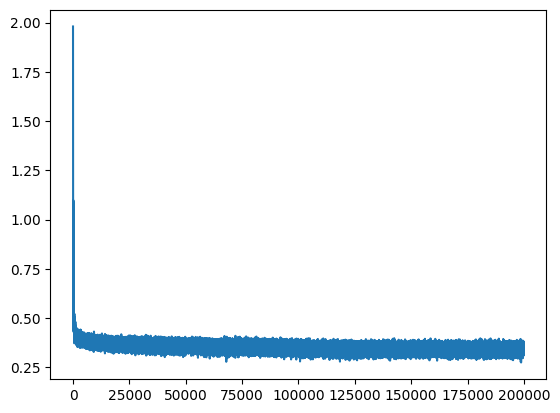

In [52]:
plt.plot(stepi,lossi)

In [54]:
emb = C[Xval]
h = torch.relu(emb.view(-1,30) @ W1 +b1)
logits = h @ W2 +b2
loss = F.cross_entropy(logits,Yval)

In [55]:
print(loss)

tensor(2.2190, grad_fn=<NllLossBackward0>)


In [1]:
pip uninstall matplotlib -y

Found existing installation: matplotlib 3.7.0Note: you may need to restart the kernel to use updated packages.

Uninstalling matplotlib-3.7.0:
  Successfully uninstalled matplotlib-3.7.0


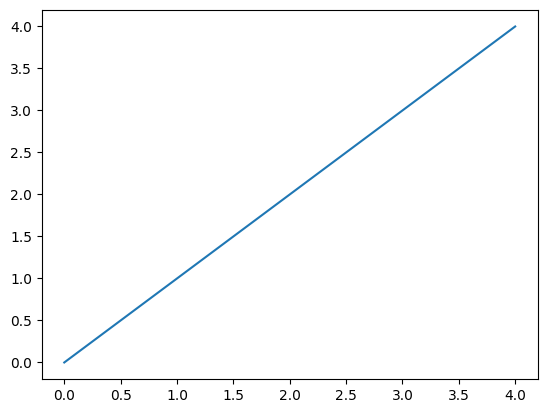